In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

In [4]:
!pip install matplotlib

  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached fonttools-4.59.0-cp312-cp312-manylinux1_x86_64.manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_5_x86_64.whl.metadata (107 kB)
  Using cached kiwisolver-1.4.8-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.2 kB)
  Using cached pillow-11.3.0-cp312-cp312-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (9.0 kB)
  Using cached pyparsing-3.2.3-py3-none-any.whl.metadata (5.0 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 17.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.6/362.6 kB 12.2 MB/s eta 0:00:00
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
Using cached fonttools-4.59.0-cp312-cp312-manylinux1_x86_64.manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_5_x86_64.whl (4.9 MB)
Using cached kiwisolver-1.4.8-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.5 MB)
Using cached pillow-11.3.0-cp312-cp312-manylinux_2

In [33]:
random_df = pd.read_csv('/home/khoffmey/work/PubBench/nvidia_metrics/H100/hw_metrics_1024_muladd_fp32_random_mem.csv')
fixed_df = pd.read_csv('/home/khoffmey/work/PubBench/nvidia_metrics/H100/hw_metrics_1024_muladd_fp32_simple_mem.csv')

for df_name, df in [('Random', random_df), ('Fixed', fixed_df)]:
    df.columns = df.columns.str.strip()
    df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
    df['timestamp'] = df['timestamp'] - df.iloc[0]['timestamp']
    df['timestamp'] = df['timestamp'].dt.total_seconds()
    df['power.draw [W]'] = df['power.draw [W]'].str.split().str[0].astype(float)
    df['clocks.current.sm [MHz]'] = df['clocks.current.sm [MHz]'].str.split().str[0].astype(float)

In [43]:
fixed_df['power.draw [W]'].max()

np.float64(339.37)

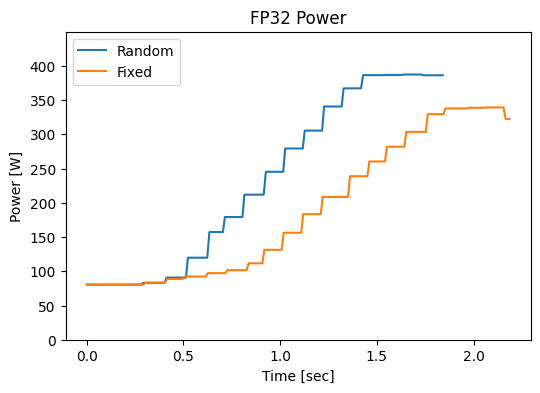

In [35]:
plt.figure(figsize=(6, 4))
for df_name, df in [('Random', random_df), ('Fixed', fixed_df)]:
    plt.yticks(np.arange(0, 450, 50))
    plt.ylim(0, 450)
    plt.plot(df['timestamp'], df['power.draw [W]'], label=df_name)
    plt.title('FP32 Power')
    plt.ylabel('Power [W]')
    plt.xlabel('Time [sec]')
    plt.legend()

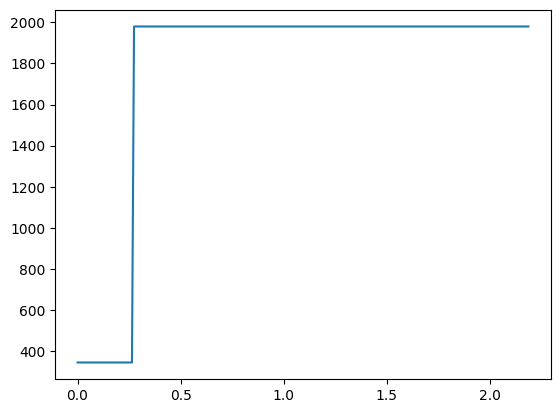

In [39]:
plt.plot(df['timestamp'], df['clocks.current.sm [MHz]'])

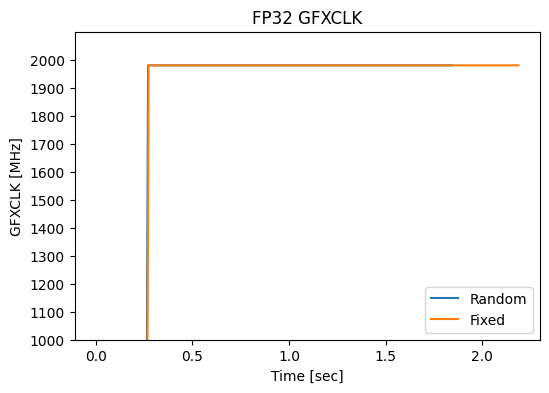

In [41]:
plt.figure(figsize=(6, 4))
for df_name, df in [('Random', random_df), ('Fixed', fixed_df)]:
    plt.yticks(np.arange(1000, 2100, 100))
    plt.ylim(1000, 2100)
    plt.plot(df['timestamp'], df['clocks.current.sm [MHz]'], label=df_name)
    plt.title('FP32 GFXCLK')
    plt.ylabel('GFXCLK [MHz]')
    plt.xlabel('Time [sec]')
    plt.legend()

In [2]:
fixed_df = pd.read_csv('/home/khoffmey/work/PubBench/all_fixed.csv')
random_df = pd.read_csv('/home/khoffmey/work/PubBench/all_random.csv')

In [4]:
fixed_df['Source'].value_counts()

Source
      FFMA R9, R2, R9, 4                      1022
      FFMA R6, R3, R6, 5                      1021
      NOP                                        9
      MOV R6, 0x40000000                         2
packed_throughput_kernel                         1
      LDC R1, c[0x0][0x28]                       1
      S2R R3, SR_TID.X                           1
      ISETP.NE.AND P0, PT, RZ, UR7, PT           1
      ULDC.64 UR4, c[0x0][0x208]                 1
      ULDC UR7, c[0x0][0x218]                    1
      S2UR UR6, SR_CTAID.X                       1
@!P0  BRA 0x7fcd8f799490                         1
      HFMA2.MMA R7, -RZ, RZ, 2.125, 0            1
      LDC R4, c[0x0][RZ]                         1
      IMAD R0, R4, UR6, R3                       1
      ULDC.64 UR8, c[0x0][0x210]                 1
      MOV R7, 0x40400000                         1
      IADD3 R3, P0, R0, R5, RZ                   1
      IADD3.X R8, RZ, RZ, RZ, P0, !PT            1
      LEA R2, P0, R3, UR

In [5]:
random_df['Source'].value_counts()

Source
      FFMA R8, R7, R8, R5                     1022
      FFMA R13, R6, R13, R4                   1022
      NOP                                        8
packed_throughput_kernel                         1
      ULDC UR7, c[0x0][0x218]                    1
      LDC R1, c[0x0][0x28]                       1
      S2R R5, SR_TID.X                           1
      S2UR UR4, SR_CTAID.X                       1
      IMAD R5, R0, UR4, R5                       1
      ULDC.64 UR4, c[0x0][0x208]                 1
      IMAD.WIDE.U32 R2, R5, 0x8, R2              1
      LDG.E.64 R10, desc[UR4][R2.64]             1
@!P0  BRA 0x7faf4179a050                         1
      LDC R0, c[0x0][RZ]                         1
      LDC.64 R2, c[0x0][0x210]                   1
      ISETP.NE.AND P0, PT, RZ, UR7, PT           1
      HFMA2.MMA R9, -RZ, RZ, 0, 0                1
      ULDC UR6, c[0x0][0xc]                      1
      LDG.E.64 R4, desc[UR4][R2.64+0x8]          1
      IMAD R0, R0, UR6, 

In [19]:
sgemm_df = pd.read_csv('/home/khoffmey/work/PubBench/hipblas_sgemm.csv')
df = pd.read_csv('/home/khoffmey/work/PubBench/runtime_data/pubbench_results_all_gpus.csv')

In [15]:
cols = [
    "Kernel", "GPU", "gridSize", "blockSize", "nThreads", "Length", "Iterations", "experiments", "GFLOPS", "totalBytes",
    "AI_HBM_ADD_INT8", "AI_HBM_ADD_INT16", "AI_HBM_ADD_INT32", "AI_HBM_ADD_INT64", "AI_HBM_ADD_FP16", "AI_HBM_ADD_FP32", "AI_HBM_ADD_FP64",
    "AI_HBM_MUL_INT8", "AI_HBM_MUL_INT16", "AI_HBM_MUL_INT32", "AI_HBM_MUL_INT64", "AI_HBM_MUL_FP16", "AI_HBM_MUL_FP32", "AI_HBM_MUL_FP64",
    "AI_HBM_MULADD_INT8", "AI_HBM_MULADD_INT16", "AI_HBM_MULADD_INT32", "AI_HBM_MULADD_INT64", "AI_HBM_MULADD_FP16", "AI_HBM_MULADD_FP32", "AI_HBM_MULADD_FP64",
    "AI_HBM_DIV_INT8", "AI_HBM_DIV_INT16", "AI_HBM_DIV_INT32", "AI_HBM_DIV_INT64", "AI_HBM_DIV_FP16", "AI_HBM_DIV_FP32", "AI_HBM_DIV_FP64",
    "AI_HBM_RSQ_INT8", "AI_HBM_RSQ_INT16", "AI_HBM_RSQ_INT32", "AI_HBM_RSQ_INT64", "AI_HBM_RSQ_FP16", "AI_HBM_RSQ_FP32", "AI_HBM_RSQ_FP64",
    "AI_HBM_GEMM_INT8", "AI_HBM_GEMM_INT16", "AI_HBM_GEMM_INT32", "AI_HBM_GEMM_INT64", "AI_HBM_GEMM_FP16", "AI_HBM_GEMM_FP32", "AI_HBM_GEMM_FP64",
    "AverageSec", "PERF", "STDDEV", "CI", "Power"
]

# new_df = pd.DataFrame(columns=[
#     "Kernel", "GPU", "gridSize", "blockSize", "nThreads", "Length", "Iterations", "experiments", "GFLOPS", "totalBytes",
#     "AI_HBM_ADD_INT8", "AI_HBM_ADD_INT16", "AI_HBM_ADD_INT32", "AI_HBM_ADD_INT64", "AI_HBM_ADD_FP16", "AI_HBM_ADD_FP32", "AI_HBM_ADD_FP64",
#     "AI_HBM_MUL_INT8", "AI_HBM_MUL_INT16", "AI_HBM_MUL_INT32", "AI_HBM_MUL_INT64", "AI_HBM_MUL_FP16", "AI_HBM_MUL_FP32", "AI_HBM_MUL_FP64",
#     "AI_HBM_MULADD_INT8", "AI_HBM_MULADD_INT16", "AI_HBM_MULADD_INT32", "AI_HBM_MULADD_INT64", "AI_HBM_MULADD_FP16", "AI_HBM_MULADD_FP32", "AI_HBM_MULADD_FP64",
#     "AI_HBM_DIV_INT8", "AI_HBM_DIV_INT16", "AI_HBM_DIV_INT32", "AI_HBM_DIV_INT64", "AI_HBM_DIV_FP16", "AI_HBM_DIV_FP32", "AI_HBM_DIV_FP64",
#     "AI_HBM_RSQ_INT8", "AI_HBM_RSQ_INT16", "AI_HBM_RSQ_INT32", "AI_HBM_RSQ_INT64", "AI_HBM_RSQ_FP16", "AI_HBM_RSQ_FP32", "AI_HBM_RSQ_FP64",
#     "AI_HBM_GEMM_INT8", "AI_HBM_GEMM_INT16", "AI_HBM_GEMM_INT32", "AI_HBM_GEMM_INT64", "AI_HBM_GEMM_FP16", "AI_HBM_GEMM_FP32", "AI_HBM_GEMM_FP64",
#     "AverageSec", "PERF", "STDDEV", "CI", "Power"
# ])
# for _, row in sgemm_df.iterrows():
#     new_row = {col: 0 for col in new_df.columns}
#     new_row['AI_HBM_GEMM_FP32'] = row['ai']
#     new_row['PERF'] = row['gflops']
#     new_df = pd.concat([new_df, pd.DataFrame([new_row])], ignore_index=True)

In [20]:
# Add missing columns from cols to sgemm_df with default values
for col in cols:
    if col not in sgemm_df.columns:
        sgemm_df[col] = 0

# Reorder columns to match cols order
sgemm_df['AI_HBM_GEMM_FP32'] = sgemm_df['ai']
sgemm_df['PERF'] = sgemm_df['gflops']
sgemm_df['GPU'] = 'MI300X'
sgemm_df['Kernel'] = 'Test'
sgemm_df = sgemm_df.reindex(columns=cols)
# Get the first row values
first_row = df.iloc[0]

# Assign first row values to all rows
for column in sgemm_df.columns:
    if 'AI' not in column and column not in ['PERF', 'GPU', 'Kernel']:
        sgemm_df[column] = first_row[column]

In [33]:
sgemm_df['ai_round'] = sgemm_df['AI_HBM_GEMM_FP32'].round()
sgemm_df = sgemm_df.loc[sgemm_df.groupby('ai_round')['PERF'].idxmax()]
sgemm_df = sgemm_df.drop(columns=['ai_round'])

In [ ]:
sgemm_df['AI_HBM_GEMM_FP32'] = sgemm_df['ai']
sgemm_df['PERF'] = sgemm_df['gflops']
sgemm_df['GPU'] = 'MI300X'
sgemm_df['Kernel'] = 'Test'

In [32]:
sgemm_df['AI_HBM_GEMM_FP32'].nunique()

2649

In [12]:
# Keep only the columns that are in cols
sgemm_df = sgemm_df[cols]

In [34]:
sgemm_df

,Kernel,GPU,gridSize,blockSize,nThreads,Length,Iterations,experiments,GFLOPS,totalBytes,...,AI_HBM_GEMM_INT32,AI_HBM_GEMM_INT64,AI_HBM_GEMM_FP16,AI_HBM_GEMM_FP32,AI_HBM_GEMM_FP64,AverageSec,PERF,STDDEV,CI,Power
0,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,42.666667,0,11.2445,436.907,3.81873,2.36687,165.0
64,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,51.200000,0,11.2445,998.644,3.81873,2.36687,165.0
128,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,54.857143,0,11.2445,1516.010,3.81873,2.36687,165.0
192,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,56.888889,0,11.2445,2021.350,3.81873,2.36687,165.0
256,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,58.181818,0,11.2445,2526.690,3.81873,2.36687,165.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
520191,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,2730.666667,0,11.2445,98523.400,3.81873,2.36687,165.0
523956,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,2732.917511,0,11.2445,94584.200,3.81873,2.36687,165.0
515459,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,2735.853055,0,11.2445,96880.100,3.81873,2.36687,165.0
513811,Test,MI300X,256,16384,4194304,1073741824,1,10,1.07374,2.147484e+09,...,0,0,0,2739.974573,0,11.2445,96063.400,3.81873,2.36687,165.0


In [35]:
sgemm_df.to_csv('/home/khoffmey/work/PubBench/hipblas_reformat.csv', index=False)

In [2]:
mi300x_peak_bw = pd.read_csv('./roofline_csvs/roofline_MI300X.csv')
mi300x_peak_bw = mi300x_peak_bw['HBMBw'].mean() / 1000
h100_peak_bw = 2.982

In [2]:
op_dict = {
    'ADD': 'Add',
    'MUL': 'Multiply',
    'MULADD': 'FMA',
    'DIV': 'Divide',
    'RSQ': 'Inv. Sqrt'
}

df = pd.read_csv('/home/khoffmey/work/PubBench/runtime_data/pubbench_results_all_gpus.csv')

df['PERF'] = df['PERF'] / 1000
df['OP'] = df[[col for col in df.columns if 'AI' in col]].apply(lambda row: next((col for col, val in row.items() if val != 0), None), axis=1)
df['OP'] = df['OP'].apply(lambda x: x.split('_')[-2] if isinstance(x, str) else x)
# df['OP'] = df['OP'].map(op_dict)

df['DATA'] = df[[col for col in df.columns if 'AI' in col]].apply(lambda row: next((col for col, val in row.items() if val != 0), None), axis=1)
df['DATA'] = df['DATA'].apply(lambda x: x.split('_')[-1] if isinstance(x, str) else x)

df['AI'] = df[[col for col in df.columns if 'AI' in col]].apply(lambda row: next((val for val in row if val != 0), None), axis=1)

# df.loc[df['OP'] == 'DIV', 'AI'] *= 2

# df.loc[(df['OP'] != 'DIV') & (df['OP'] != 'RSQ') & (df['DATA'] == 'FP64'), 'AI'] *= 2

df = df[df['OP'] != 'GEMM']

In [22]:
df.query("GPU == 'H100' and OP == 'DIV' and DATA == 'FP32'")

,Kernel,GPU,gridSize,blockSize,nThreads,Length,Iterations,experiments,GFLOPS,totalBytes,...,AI_HBM_GEMM_FP32,AI_HBM_GEMM_FP64,AverageSec,PERF,STDDEV,CI,Power,OP,DATA,AI
5358,Test,H100,256,16384,4194304,268435456,1,10,0.268435,1.073742e+09,...,0.0,0.0,0.503680,0.532949,0.604182,0.374476,543.0,DIV,FP32,0.25
5365,Test,H100,256,16384,4194304,268435456,2,10,0.536871,1.073742e+09,...,0.0,0.0,0.534160,1.005080,1.120580,0.694546,560.0,DIV,FP32,0.50
5372,Test,H100,256,16384,4194304,268435456,4,10,1.073740,1.073742e+09,...,0.0,0.0,0.638669,1.681220,2.018740,1.251230,592.0,DIV,FP32,1.00
5379,Test,H100,256,16384,4194304,268435456,8,10,2.147480,1.073742e+09,...,0.0,0.0,1.142040,1.880400,0.846479,0.524653,557.0,DIV,FP32,2.00
5386,Test,H100,256,16384,4194304,268435456,16,10,4.294970,1.073742e+09,...,0.0,0.0,2.250530,1.908430,0.667343,0.413623,515.0,DIV,FP32,4.00
5393,Test,H100,256,16384,4194304,268435456,32,10,8.589930,1.073742e+09,...,0.0,0.0,4.468170,1.922470,0.301742,0.187021,482.0,DIV,FP32,8.00
5400,Test,H100,256,16384,4194304,268435456,64,10,17.179900,1.073742e+09,...,0.0,0.0,8.899850,1.930360,0.137831,0.085429,462.0,DIV,FP32,16.00
5407,Test,H100,256,16384,4194304,268435456,128,10,34.359700,1.073742e+09,...,0.0,0.0,17.630200,1.948910,0.162970,0.101010,461.0,DIV,FP32,32.00
5414,Test,H100,256,16384,4194304,268435456,256,10,68.719500,1.073742e+09,...,0.0,0.0,36.287700,1.893740,0.563505,0.349264,443.0,DIV,FP32,64.00
5421,Test,H100,256,16384,4194304,268435456,512,10,137.439000,1.073742e+09,...,0.0,0.0,82.242200,1.671150,0.442867,0.274492,407.0,DIV,FP32,128.00


In [223]:
df_mi300x.loc[(df_mi300x['OP'] == 'DIV') & (df_mi300x['GPU'] == 'MI300X')][['OP', 'DATA', 'AI']].head(10)

,OP,DATA,AI
1701,DIV,INT8,1.000
1702,DIV,INT16,0.500
1703,DIV,INT32,0.250
1704,DIV,INT64,0.125
1705,DIV,FP16,0.500
1706,DIV,FP32,0.250
1707,DIV,FP64,0.125
1736,DIV,INT8,2.000
1737,DIV,INT16,1.000
1738,DIV,INT32,0.500


In [14]:
df_mi300x = df[df['GPU'] == 'MI300X']

df_h100 = df[df['GPU'] == 'H100']

In [18]:
op_dict = {
    'ADD': 'Add',
    'MUL': 'Multiply',
    'MULADD': 'FMA',
    'DIV': 'Divide',
    'RSQ': 'Inv. Sqrt'
}

df_mi300x = pd.read_csv('/home/khoffmey/work/PubBench/pubbench_results_MI300X.csv')
df_h100 = pd.read_csv('/home/khoffmey/work/PubBench/pubbench_results_H100.csv')

for df in [df_mi300x, df_h100]:
    df['PERF'] = df['PERF'] / 1000
    df['OP'] = df[[col for col in df.columns if 'AI' in col]].apply(lambda row: next((col for col, val in row.items() if val != 0), None), axis=1)
    df['OP'] = df['OP'].apply(lambda x: x.split('_')[-2] if isinstance(x, str) else x)
    # df['OP'] = df['OP'].map(op_dict)

    df['DATA'] = df[[col for col in df.columns if 'AI' in col]].apply(lambda row: next((col for col, val in row.items() if val != 0), None), axis=1)
    df['DATA'] = df['DATA'].apply(lambda x: x.split('_')[-1] if isinstance(x, str) else x)

    df['AI'] = df[[col for col in df.columns if 'AI' in col]].apply(lambda row: next((val for val in row if val != 0), None), axis=1)

In [53]:
df_h100['Iterations'].value_counts()

Iterations
1        10
2        10
4        10
8        10
16       10
32       10
64       10
128      10
256      10
512      10
1024     10
2048     10
4096     10
8192     10
16384    10
Name: count, dtype: int64

In [ ]:
df_mi300x

,Kernel,GPU,gridSize,blockSize,nThreads,Length,Iterations,experiments,GFLOPS,totalBytes,...,AI_HBM_RSQ_INT16,AI_HBM_RSQ_INT32,AI_HBM_RSQ_INT64,AI_HBM_RSQ_FP16,AI_HBM_RSQ_FP32,AI_HBM_RSQ_FP64,AverageSec,PERF,STDDEV,CI
70,Test,MI300X,256,16384,4194304,268435456,128,3710,34.3597,1073741824,...,0,0,0,0,0.0,0.0,0.709235,48465.00,935.83800,30.114100
71,Test,MI300X,256,16384,4194304,134217728,128,3710,17.1799,1073741824,...,0,0,0,0,0.0,0.0,0.487854,35244.90,987.66400,31.781800
72,Test,MI300X,256,16384,4194304,268435456,128,3710,34.3597,1073741824,...,0,0,0,0,0.0,0.0,0.712696,48225.60,838.40200,26.978700
73,Test,MI300X,256,16384,4194304,134217728,128,3710,17.1799,1073741824,...,0,0,0,0,0.0,0.0,0.504342,34085.20,845.82400,27.217600
74,Test,MI300X,256,16384,4194304,268435456,128,3710,68.7195,1073741824,...,0,0,0,0,0.0,0.0,0.720585,95394.80,1637.52000,52.693400
75,Test,MI300X,256,16384,4194304,134217728,128,3710,34.3597,1073741824,...,0,0,0,0,0.0,0.0,0.657990,52232.10,808.25300,26.008600
76,Test,MI300X,256,16384,4194304,268435456,128,3710,34.3597,1073741824,...,0,0,0,0,0.0,0.0,13.465900,2551.65,7.49894,0.241306
77,Test,MI300X,256,16384,4194304,134217728,128,3710,17.1799,1073741824,...,0,0,0,0,0.0,0.0,7.685480,2235.39,6.85190,0.220486
78,Test,MI300X,256,16384,4194304,268435456,128,3710,68.7195,2147483648,...,0,0,0,0,32.0,0.0,6.521750,10537.10,34.74130,1.117930
79,Test,MI300X,256,16384,4194304,134217728,128,3710,34.3597,2147483648,...,0,0,0,0,0.0,16.0,3.381320,10161.90,53.50400,1.721690


In [42]:
df_mi300x[df_mi300x['Iterations'] == 128]['AI_HBM_MUL_FP32']

70     0.0
71     0.0
72    32.0
73     0.0
74     0.0
75     0.0
76     0.0
77     0.0
78     0.0
79     0.0
80     0.0
81     0.0
82    32.0
83     0.0
84     0.0
85     0.0
86     0.0
87     0.0
88     0.0
89     0.0
Name: AI_HBM_MUL_FP32, dtype: float64

In [174]:
df_mi300x[(df_mi300x['OP'] == 'ADD') & (df_mi300x['DATA'] == 'FP32')]['PERF'].max() * 1e12 / (hw_dfs['MI300X']['ADD']['FP32'][8192]['Clk_system[MHz]'].median() * 304 * 1e6)

np.float64(121.97284878863826)

defaultdict(<function <lambda> at 0x7059f03189a0>, {'ADD': defaultdict(<class 'dict'>, {'FP32': 33.45, 'FP64': 16.725}), 'MUL': defaultdict(<class 'dict'>, {'FP32': 33.45, 'FP64': 16.725}), 'MULADD': defaultdict(<class 'dict'>, {'FP32': 66.9, 'FP64': 33.45}), 'DIV': defaultdict(<class 'dict'>, {'FP32': np.float64(2.4248683870967738), 'FP64': np.float64(1.85721)}), 'RSQ': defaultdict(<class 'dict'>, {'FP32': np.float64(8.38406123076923), 'FP64': np.float64(8.29695572519084)})})
MI300X MULADD FP32 4096 114.486
H100 MULADD FP32 128 61.3362
MI300X MULADD FP64 2048 69.0838
H100 MULADD FP64 64 30.2721
MI300X DIV FP32 2048 2.86959
H100 DIV FP32 8 1.7084300000000001
MI300X DIV FP64 1024 1.9841
H100 DIV FP64 4 0.928605
MI300X RSQ FP32 2048 11.1549
H100 RSQ FP32 128 8.25703
MI300X RSQ FP64 1024 11.139100000000001
H100 RSQ FP64 128 8.2341
[np.float64(114.486), np.float64(69.0838), np.float64(2.86959), np.float64(1.9841), np.float64(11.1549), np.float64(11.139100000000001)]
[163.4         81.7    

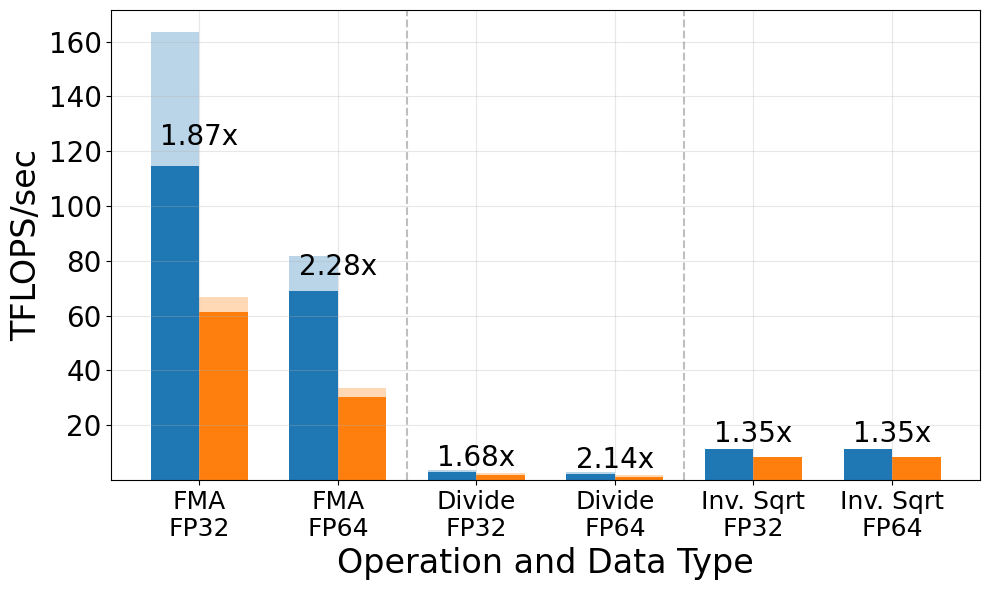

In [23]:
from pandas import MultiIndex

!mkdir -p './analysis_plots/peak_perf'
data_to_iter = {}
data_to_iter['INT8'] = 2
data_to_iter['INT16'] = 4
data_to_iter['INT32'] = 8
data_to_iter['INT64'] = 16
data_to_iter['FP16'] = 4
data_to_iter['FP32'] = 8
data_to_iter['FP64'] = 16

peak_perfs_mi300x = defaultdict(lambda : defaultdict(dict))

peak_perfs_mi300x['ADD']['FP32'] = 81.7
peak_perfs_mi300x['ADD']['FP64'] = 40.85
peak_perfs_mi300x['MUL']['FP32'] = 81.7
peak_perfs_mi300x['MUL']['FP64'] = 40.85
peak_perfs_mi300x['MULADD']['FP32'] = 163.4
peak_perfs_mi300x['MULADD']['FP64'] = 81.7

for op in ['DIV', 'RSQ']:
    for data in ['FP32', 'FP64']:
        filtered_df = df_mi300x[(df_mi300x['OP'] == op) & (df_mi300x['DATA'] == data)]
        targ_ai = filtered_df.loc[filtered_df['PERF'].idxmax(), 'AI']
        # print(op, data, targ_ai)
        peak_perfs_mi300x[op][data] = (filtered_df['PERF'].max() * 1e12 / (hw_dfs['MI300X'][op][data][targ_ai]['Clk_system[MHz]'].median() * 1e6 * 304)) * 304 * 2.1 * 1e9 / 1e12
        # peak_perfs_mi300x['DIV']['FP64'] = df_mi300x[(df_mi300x['OP'] == 'DIV') & (df_mi300x['DATA'] == 'FP64')]['PERF'].max() / (hw_dfs['MI300X']['DIV']['FP64']['Clk_system[MHz]'].median() * 304) * 304 * 2.1 * 1e9
        # peak_perfs_mi300x['RSQ']['FP32'] = df_mi300x[(df_mi300x['OP'] == 'RSQ') & (df_mi300x['DATA'] == 'FP32')]['PERF'].max() / (hw_dfs['MI300X']['RSQ']['FP32']['Clk_system[MHz]'].median() * 304) * 304 * 2.1 * 1e9
        # peak_perfs_mi300x['RSQ']['FP64'] = df_mi300x[(df_mi300x['OP'] == 'RSQ') & (df_mi300x['DATA'] == 'FP64')]['PERF'].max() / (hw_dfs['MI300X']['RSQ']['FP64']['Clk_system[MHz]'].median() * 304) * 304 * 2.1 * 1e9

peak_perfs_mi300x_list = np.array([
    peak_perfs_mi300x['MULADD']['FP32'], peak_perfs_mi300x['MULADD']['FP64'],
    peak_perfs_mi300x['DIV']['FP32'], peak_perfs_mi300x['DIV']['FP64'],
    peak_perfs_mi300x['RSQ']['FP32'], peak_perfs_mi300x['RSQ']['FP64']
])

peak_perfs_h100 = defaultdict(lambda : defaultdict(dict))

peak_perfs_h100['ADD']['FP32'] = 33.45
peak_perfs_h100['ADD']['FP64'] = 16.725
peak_perfs_h100['MUL']['FP32'] = 33.45
peak_perfs_h100['MUL']['FP64'] = 16.725
peak_perfs_h100['MULADD']['FP32'] = 66.9
peak_perfs_h100['MULADD']['FP64'] = 33.45

for op in ['DIV', 'RSQ']:
    for data in ['FP32', 'FP64']:
        filtered_df = df_h100[(df_h100['OP'] == op) & (df_h100['DATA'] == data)]
        targ_ai = filtered_df.loc[filtered_df['PERF'].idxmax(), 'AI']
        
        peak_perfs_h100[op][data] = (filtered_df['PERF'].max() * 1e12 / (hw_dfs['H100'][op][data][targ_ai]['clocks.current.sm [MHz]'].median() * 1e6 * 304)) * 304 * 1.98 * 1e9 / 1e12
        # peak_perfs_h100['DIV']['FP64'] = df_mi300x[(df_mi300x['OP'] == 'DIV') & (df_mi300x['DATA'] == 'FP64')]['PERF'].max() / (hw_dfs['MI300X']['DIV']['FP64']['Clk_system[MHz]'].median() * 304) * 304 * 2.1 * 1e9
        # peak_perfs_h100['RSQ']['FP32'] = df_mi300x[(df_mi300x['OP'] == 'RSQ') & (df_mi300x['DATA'] == 'FP32')]['PERF'].max() / (hw_dfs['MI300X']['RSQ']['FP32']['Clk_system[MHz]'].median() * 304) * 304 * 2.1 * 1e9
        # peak_perfs_h100['RSQ']['FP64'] = df_mi300x[(df_mi300x['OP'] == 'RSQ') & (df_mi300x['DATA'] == 'FP64')]['PERF'].max() / (hw_dfs['MI300X']['RSQ']['FP64']['Clk_system[MHz]'].median() * 304) * 304 * 2.1 * 1e9

print(peak_perfs_h100)

peak_perfs_h100_list = np.array([
    peak_perfs_h100['MULADD']['FP32'], peak_perfs_h100['MULADD']['FP64'],
    peak_perfs_h100['DIV']['FP32'], peak_perfs_h100['DIV']['FP64'],
    peak_perfs_h100['RSQ']['FP32'], peak_perfs_h100['RSQ']['FP64']
])

# Get all operations and data types
all_ops = ['MULADD', 'DIV', 'RSQ']
all_data = ['FP32', 'FP64']

# Create data for plotting with multiindex structure
mi300x_data = []
h100_data = []
multi_labels = []

for op in all_ops:
    op_mi300x = []
    op_h100 = []
    op_labels = []
    
    for data in all_data:
        # Get max performance for this op/data combination
        
        mi300x_perf = df_mi300x[(df_mi300x['OP'] == op) & (df_mi300x['DATA'] == data)]['PERF'].max()
        h100_perf = df_h100[(df_h100['OP'] == op) & (df_h100['DATA'] == data)]['PERF'].max()

        mi300x_filtered_df = df_mi300x[(df_mi300x['OP'] == op) & (df_mi300x['DATA'] == data)]
        h100_filtered_df = df_h100[(df_h100['OP'] == op) & (df_h100['DATA'] == data)]

        print('MI300X', op, data, mi300x_filtered_df.loc[mi300x_filtered_df['PERF'].idxmax(), 'AI'], mi300x_perf)
        print('H100', op, data, h100_filtered_df.loc[h100_filtered_df['PERF'].idxmax(), 'AI'], h100_perf)
        # Only include if both GPUs have data
        if not np.isnan(mi300x_perf) and not np.isnan(h100_perf):
            op_mi300x.append(mi300x_perf)
            op_h100.append(h100_perf)
            op_labels.append(data)
    
    if op_mi300x:  # Only add if there's data for this operation
        mi300x_data.extend(op_mi300x)
        h100_data.extend(op_h100)
        multi_labels.extend([(op, label) for label in op_labels])

# Create multiindex
multi_index = MultiIndex.from_tuples(multi_labels, names=['Operation', 'Data Type'])

# Plot
plt.figure(figsize=(10, 6))
x = np.arange(len(multi_labels))
width = 0.35

bars1 = plt.bar(x - width/2, mi300x_data, width, label='MI300X Achieved', color='tab:blue')

print(mi300x_data)
print(peak_perfs_mi300x_list)
bars2 = plt.bar(x - width/2, peak_perfs_mi300x_list, width, label='MI300X Theoretical Peak', color='tab:blue', alpha=0.3)

bars3 = plt.bar(x + width/2, h100_data, width, label='H100 Achieved', color='tab:orange')
bars4 = plt.bar(x + width/2, peak_perfs_h100_list, width, label='H100 Theoretical Peak', color='tab:orange', alpha=0.3)

# Add ratio text above bars
for i, (mi_val, h100_val) in enumerate(zip(mi300x_data, h100_data)):
    if h100_val != 0:
        ratio = mi_val / h100_val
        max_val = max(mi_val, h100_val)
        plt.text(i, max_val + max_val * 0.05, f'{ratio:.2f}x', ha='center', va='bottom', fontsize=20, color='black')

# Create custom x-axis labels
x_labels = [f'{op_dict[op]}\n{data}' for op, data in multi_labels]
plt.xticks(x, x_labels, fontsize=18)

# Add vertical lines to separate operations
op_boundaries = []
current_op = None
for i, (op, _) in enumerate(multi_labels):
    if op != current_op:
        if current_op is not None:
            op_boundaries.append(i - 0.5)
        current_op = op

for boundary in op_boundaries:
    plt.axvline(x=boundary, color='gray', linestyle='--', alpha=0.5)

plt.xlabel('Operation and Data Type', fontsize=24)
plt.ylabel('TFLOPS/sec', fontsize=24)
# plt.title('Peak Performance Comparison: MI300X vs H100')
# plt.text(0.98, 0.45, 'Numbers Above Bars Indicate MI300X vs H100\nAchieved Performance Speed Up', 
#          transform=plt.gca().transAxes, fontsize=16, verticalalignment='top',
#          horizontalalignment='right',
#          bbox=dict(boxstyle='round', facecolor='white', alpha=0.5),
#          linespacing=1.5)
# plt.legend(fontsize=26)
plt.yticks(np.arange(20, 180, 20), fontsize=20)
plt.grid(alpha=0.3)
plt.tight_layout()
# plt.savefig('./analysis_plots/peak_perf/all_ops_peak_perf.png')
plt.show()


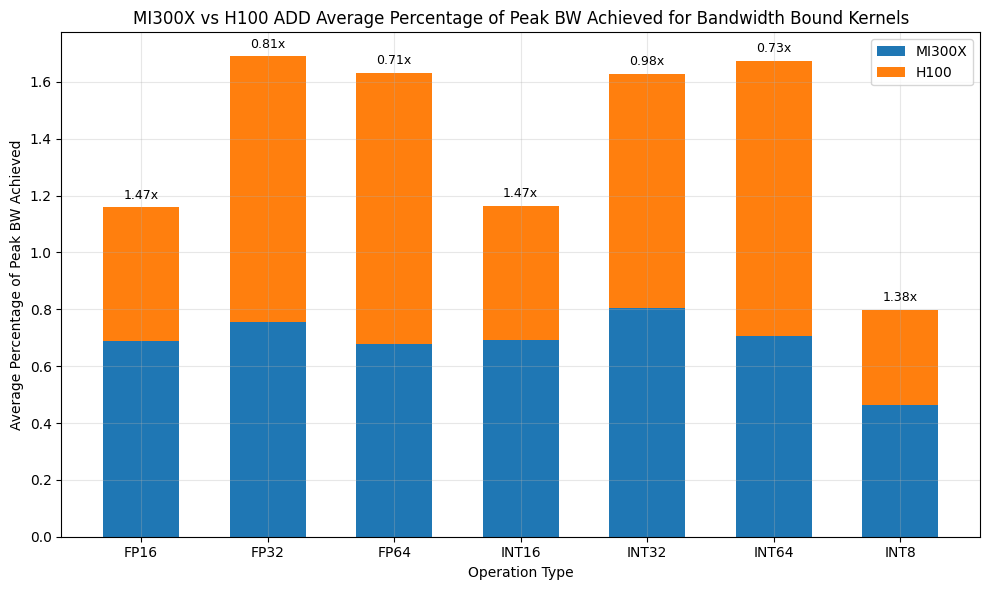

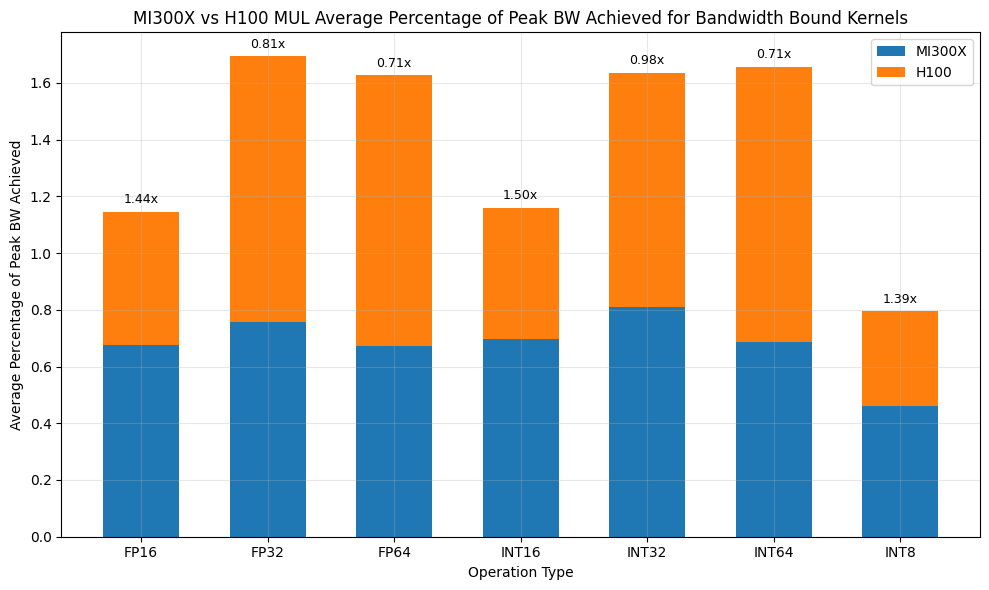

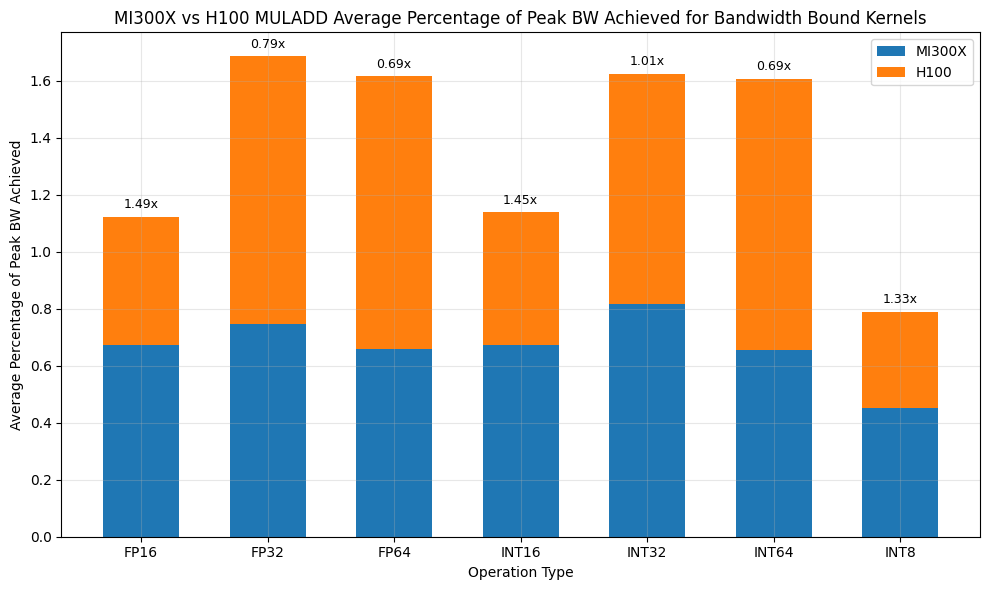

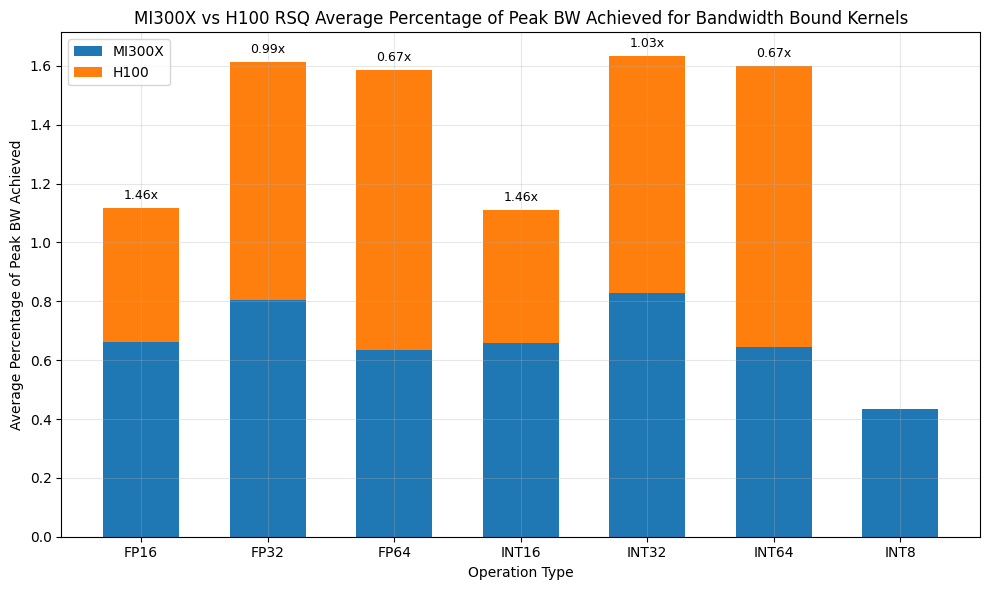

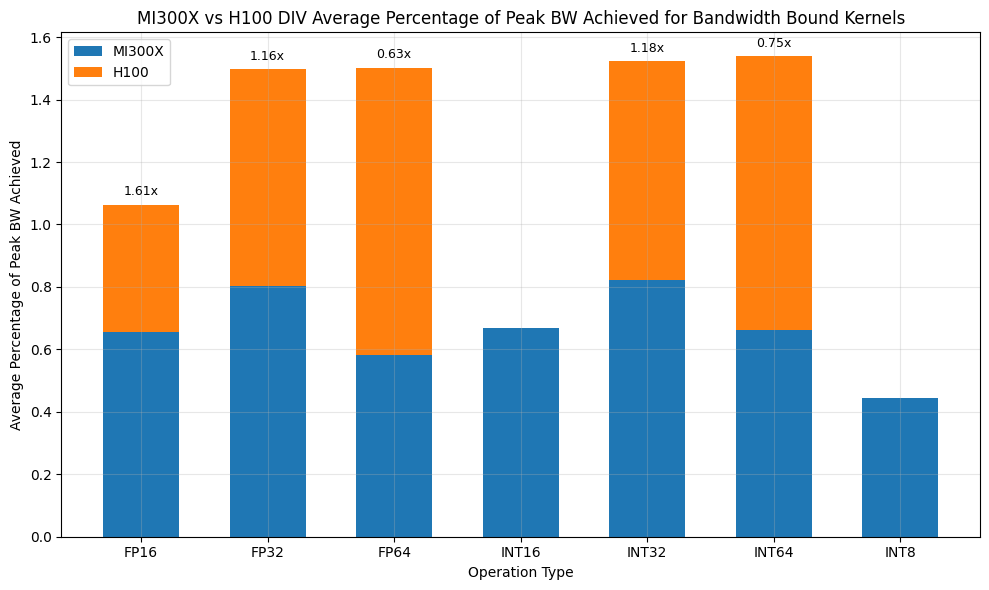

KeyError: 'FP32'

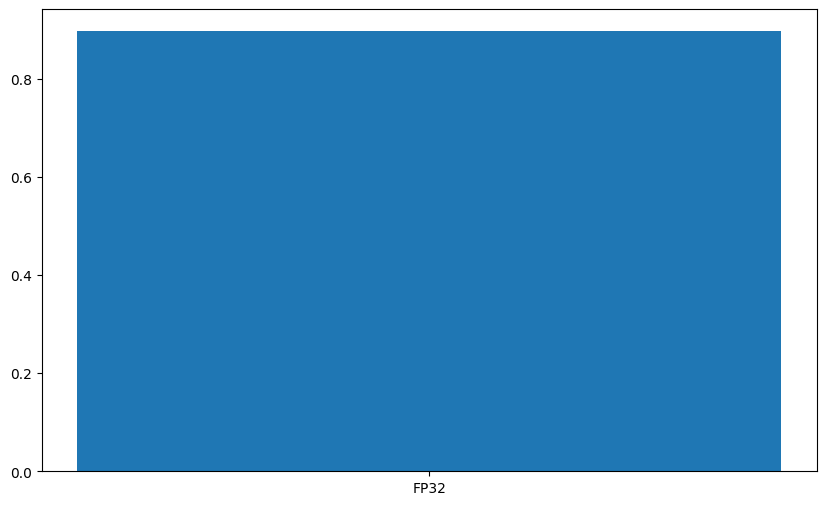

In [228]:
# !mkdir -p './analysis_plots/MI300X'
!mkdir -p './analysis_plots/bw_diff'

for op in df['OP'].unique():
    # Get max performance per OP for each GPU
    mi_data = df_mi300x[df_mi300x['OP'] == op]
    h100_data = df_h100[df_h100['OP'] == op]

    mi300x_perf = mi_data.groupby('DATA')['PERF'].max()
    h100_perf = h100_data.groupby('DATA')['PERF'].max()

    # Compute knee for every OP for both GPUs
    mi_knee = mi300x_perf / mi300x_peak_bw
    h100_knee = h100_perf / h100_peak_bw

    mi_knee_df = mi_knee.reset_index()
    h100_knee_df = h100_knee.reset_index()

    # Find rows where AI is less than the knee for each OP
    
    mi_distances = {}
    for data in mi_knee.index:
        knee_val = mi_knee[data]
        mask = (mi_data['DATA'] == data) & (mi_data['AI'] < knee_val)
        below_knee = mi_data[mask]
        avg_distance = np.abs(below_knee['PERF'] / (mi300x_peak_bw * below_knee['AI'])).mean()
        mi_distances[data] = avg_distance

    h100_distances = {}
    for data in h100_knee.index:
        knee_val = h100_knee[data]
        mask = (h100_data['DATA'] == data) & (h100_data['AI'] < knee_val)
        below_knee = h100_data[mask]
        avg_distance = np.abs(below_knee['PERF'] / (h100_peak_bw * below_knee['AI'])).mean()
        h100_distances[data] = avg_distance


    all_data = mi_distances.keys()
    mi_vals = mi_distances.values()
    h100_vals = h100_distances.values()

    bar_width = 0.6
    plt.figure(figsize=(10, 6))
    plt.bar(all_data, mi_vals, label='MI300X', color='tab:blue', width=bar_width)
    plt.bar(all_data, h100_vals, bottom=mi_vals, label='H100', color='tab:orange', width=bar_width)
    # Add ratio text above each bar
    for i, data in enumerate(all_data):
        mi_val = mi_distances[data]
        h100_val = h100_distances[data]
        ratio = mi_val / h100_val
        plt.text(i, mi_val + h100_val + 0.02, f'{ratio:.2f}x', ha='center', va='bottom', fontsize=9, color='black')
    
    plt.ylabel('Average Percentage of Peak BW Achieved')
    plt.xlabel('Operation Type')
    plt.title(f'MI300X vs H100 {op} Average Percentage of Peak BW Achieved for Bandwidth Bound Kernels')
    plt.legend()
    plt.tight_layout()
    plt.grid(alpha=0.3)
    plt.savefig(f'./analysis_plots/bw_diff/{op}_bw_diff.png')
    plt.show()

In [172]:
df[df['OP'] == 'RSQ']['DATA'].unique()

array(['INT8', 'INT16', 'INT32', 'INT64', 'FP16', 'FP32', 'FP64'],
      dtype=object)

In [178]:
df['OP'].unique()

array(['ADD', 'MUL', 'MULADD', 'RSQ', 'DIV', 'GEMM'], dtype=object)

In [11]:
df_mi300x['AI'].unique()

array([ 512,  256,  128, 2048, 1024, 4096])

In [20]:
df_h100[df_h100['OP'] == 'DIV']

,Kernel,GPU,gridSize,blockSize,nThreads,Length,Iterations,experiments,GFLOPS,totalBytes,...,AI_HBM_RSQ_FP16,AI_HBM_RSQ_FP32,AI_HBM_RSQ_FP64,AverageSec,PERF,STDDEV,CI,OP,DATA,AI
2,Test,H100,256,16384,4194304,268435456,32,10,8.58993,1073741824,...,0,0,0,5.09248,1.708430,189.468000,117.43300,DIV,FP32,8
3,Test,H100,256,16384,4194304,134217728,32,10,4.29497,1073741824,...,0,0,0,4.68195,0.928605,97.391900,60.36410,DIV,FP64,4
8,Test,H100,256,16384,4194304,268435456,64,10,17.17990,1073741824,...,0,0,0,10.79740,1.611250,188.815000,117.02800,DIV,FP32,16
9,Test,H100,256,16384,4194304,134217728,64,10,8.58993,1073741824,...,0,0,0,9.55851,0.911873,115.648000,71.67950,DIV,FP64,8
14,Test,H100,256,16384,4194304,268435456,128,10,34.35970,1073741824,...,0,0,0,22.01810,1.565080,89.699300,55.59620,DIV,FP32,32
15,Test,H100,256,16384,4194304,134217728,128,10,17.17990,1073741824,...,0,0,0,19.63970,0.882000,87.618400,54.30650,DIV,FP64,16
20,Test,H100,256,16384,4194304,268435456,256,10,68.71950,1073741824,...,0,0,0,44.21970,1.554100,9.046700,5.60720,DIV,FP32,64
21,Test,H100,256,16384,4194304,134217728,256,10,34.35970,1073741824,...,0,0,0,43.82740,0.784514,21.140600,13.10310,DIV,FP64,32
26,Test,H100,256,16384,4194304,268435456,512,10,137.43900,1073741824,...,0,0,0,102.84900,1.351170,133.310000,82.62630,DIV,FP32,128
27,Test,H100,256,16384,4194304,134217728,512,10,68.71950,1073741824,...,0,0,0,101.85900,0.687986,86.432700,53.57160,DIV,FP64,64


In [22]:
from collections import defaultdict
hw_dfs = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))
gpus = ['MI300A', 'MI300X', 'H100']
data_to_iter = {}
data_to_iter['INT8'] = 1
data_to_iter['INT16'] = 2
data_to_iter['INT32'] = 4
data_to_iter['INT64'] = 8
data_to_iter['FP16'] = 2
data_to_iter['FP32'] = 2
data_to_iter['FP64'] = 4
for gpu in ['MI300X', 'H100']:
    if gpu == 'MI300X' or gpu == 'MI300A':
        prefix = "rocstar_metrics"
    else:
        prefix = "nvidia_metrics"
    if gpu == 'MI300X':
        targ_df = df_mi300x
    else:
        targ_df = df_h100
    for op in ['MULADD', 'DIV', 'RSQ']:
        # if op == 'RSQ':
        #     print(df['DATA'].unique())
        for data in ['FP32', 'FP64']:
            # if op == 'RSQ':
                # print(data)
                # print(df[(df['OP'] == op) & (df['DATA'] == data)]['AI'].unique())
            print(op, data, gpu)
            for ai in targ_df[(targ_df['OP'] == op) & (targ_df['DATA'] == data)]['AI'].unique():
                orig_ai = ai
                # if data == 'FP64':
                #     ai *= 2
                # if op == 'DIV':
                #     ai *= 2
                
                # if op not in ['DIV', 'RSQ'] and data == 'FP64':
                #     ai *= 2
                # df.loc[(df['OP'] != 'DIV') & (df['OP'] != 'RSQ') & (df['DATA'] == 'FP64'), 'AI'] *= 2
                num_ops = ai * data_to_iter[data]

                if op in ['DIV', 'RSQ']:
                    num_ops *= 2
                
                # if data == 'FP64':
                #     num_ops *= 2
                
                # if data == 'FP32' and op == 'MULADD':
                #     num_ops /= 2

                # if op == 'MULADD':
                #     num_ops /= 2
                # print(ai, data, num_ops)
                new_op = op
                if op == 'RSQ':
                    # num_ops /= 2
                    new_op = 'RSQRT'
                # if op == 'DIV':
                #     num_ops *= 2
                # if op == 'RSQRT':
                #     print(data, ai)
                print(num_ops, ai)
                if op != 'GEMM' and (num_ops < 65000 or (new_op == 'DIV')):
                    hw_df = pd.read_csv(f'./{prefix}/{gpu}_all_fixed_mem/hw_metrics_{int(num_ops)}_{new_op.lower()}_{data.lower()}.csv')
                    hw_df.columns = hw_df.columns.str.strip()
                    if 'power.draw [W]' in hw_df.columns:
                        hw_df['power.draw [W]'] = hw_df['power.draw [W]'].str.split().str[0].astype(float)
                        # hw_df['Timestamp'] = hw_df['Timestamp'] - hw_df.iloc[0]['Timestamp']
                        # hw_df['Timestamp'] = hw_df['Timestamp'] / 1e9

                    if 'clocks.current.sm [MHz]' in hw_df.columns:
                        hw_df['clocks.current.sm [MHz]'] = hw_df['clocks.current.sm [MHz]'].str.split().str[0].astype(float)
                        hw_df['timestamp'] = pd.to_datetime(hw_df['timestamp'])
                        hw_df['timestamp'] = hw_df['timestamp'] - hw_df.iloc[0]['timestamp']
                        hw_df['timestamp'] = hw_df['timestamp'].dt.total_seconds()
                    
                    if 'power.draw [W]' not in hw_df.columns:
                        # if op == 'MULADD' and data == 'FP32':
                        #     print(f'./{prefix}/{gpu}/hw_metrics_{int(num_ops)}_{new_op.lower()}_{data.lower()}.csv')
                        #     print(hw_df['Power[W]'].max())
                        hw_df['Timestamp'] = hw_df['Timestamp'] - hw_df.iloc[0]['Timestamp']
                        hw_df['Timestamp'] = hw_df['Timestamp'] / 1e9

                    hw_dfs[gpu][op][data][ai] = hw_df

MULADD FP32 MI300X
1024 512
4096 2048
8192 4096
MULADD FP64 MI300X
1024 256
4096 1024
8192 2048
DIV FP32 MI300X
1024 256
4096 1024
8192 2048
DIV FP64 MI300X
1024 128
4096 512
8192 1024
RSQ FP32 MI300X
1024 256
4096 1024
8192 2048
RSQ FP64 MI300X
1024 128
4096 512
8192 1024
MULADD FP32 H100
32 16
64 32
128 64
256 128
512 256
1024 512
2048 1024
4096 2048
8192 4096
16384 8192
MULADD FP64 H100
32 8
64 16
128 32
256 64
512 128
1024 256
4096 1024
8192 2048
16384 4096
DIV FP32 H100
32 8
64 16
128 32
256 64
512 128
1024 256
4096 1024
8192 2048
16384 4096
DIV FP64 H100
32 4
64 8
128 16
256 32
512 64
1024 128
4096 512
8192 1024
16384 2048
RSQ FP32 H100
32 8
64 16
128 32
256 64
512 128
1024 256
4096 1024
8192 2048
16384 4096
RSQ FP64 H100
32 4
64 8
128 16
256 32
512 64
1024 128
4096 512
8192 1024
16384 2048


In [8]:
power_vals = hw_dfs['MI300X']['MULADD']['FP32'][16]['Power[W]']
top_5 = power_vals.quantile(0.95)
power_vals[power_vals >= top_5].mean()

np.float64(720.3717260965605)

In [39]:
test_df = pd.read_csv('nvidia_metrics/H100/hw_metrics_1024_muladd_int32.csv')
test_df.columns = test_df.columns.str.strip()
test_df['timestamp'] = pd.to_datetime(test_df['timestamp'])
test_df['timestamp'] = test_df['timestamp'] - test_df.iloc[0]['timestamp']


test_df['timestamp'] = test_df['timestamp'].dt.total_seconds()

test_df['timestamp']

0      0.000
1      0.018
2      0.028
3      0.038
4      0.048
       ...  
444    4.478
445    4.488
446    4.498
447    4.508
448    4.519
Name: timestamp, Length: 449, dtype: float64

In [48]:
test_df = pd.read_csv('rocstar_metrics/MI300X/hw_metrics_1024_muladd_int32.csv')
test_df.columns = test_df.columns.str.strip()
# test_df['Timestamp'] = pd.to_datetime(test_df['Timestamp'])
test_df['Timestamp'] = test_df['Timestamp'] - test_df.iloc[0]['Timestamp']


test_df['Timestamp'] = test_df['Timestamp'] / 1e9

test_df['Timestamp']

0       0.000000
1       0.001581
2       0.003120
3       0.004585
4       0.006610
          ...   
3627    5.557620
3628    5.559083
3629    5.560599
3630    5.562085
3631    5.563635
Name: Timestamp, Length: 3632, dtype: float64

3.888
3.187514368


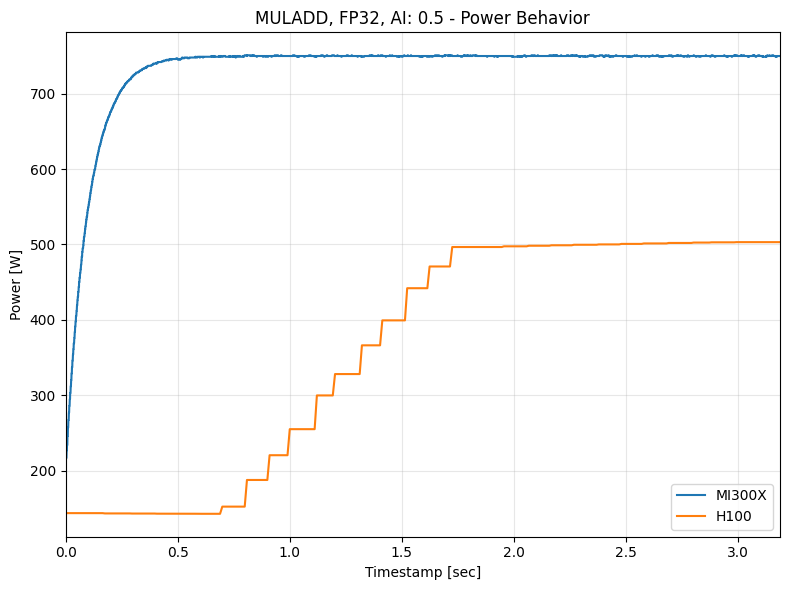

3.888
3.243272448


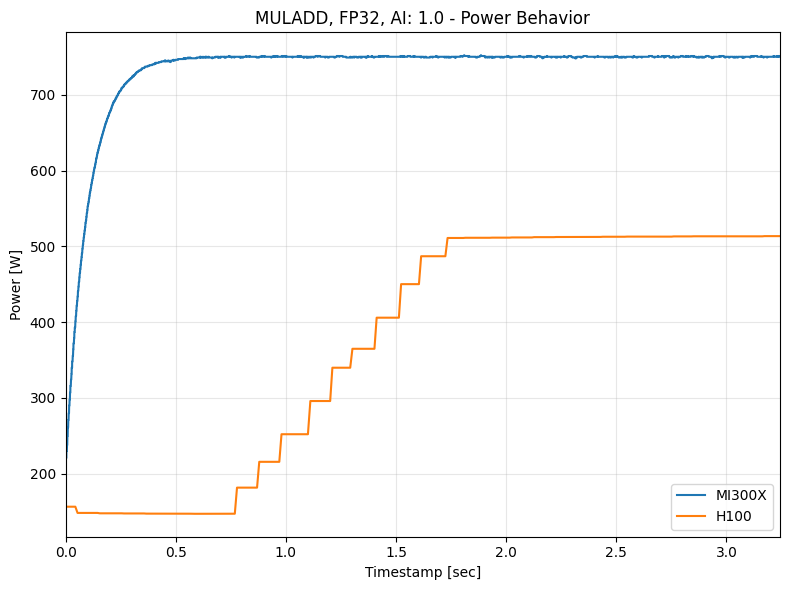

3.885
3.252132352


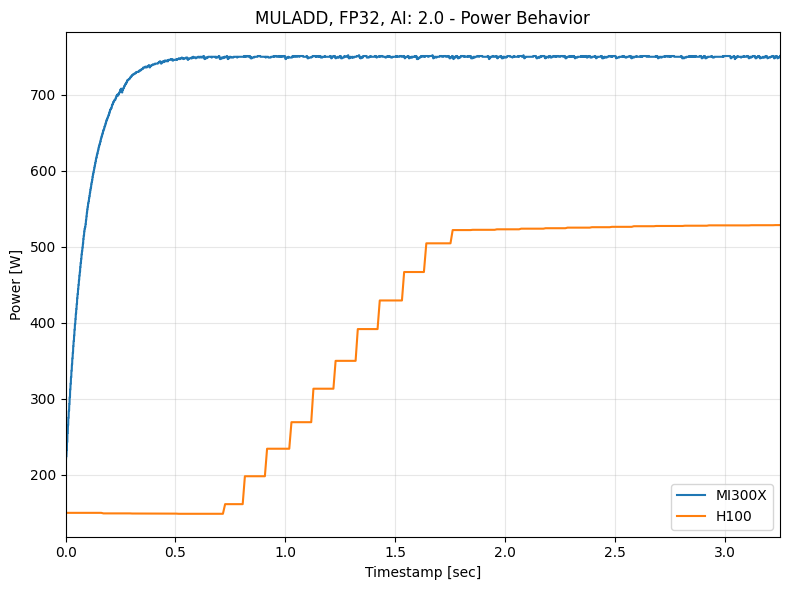

3.883
3.324147456


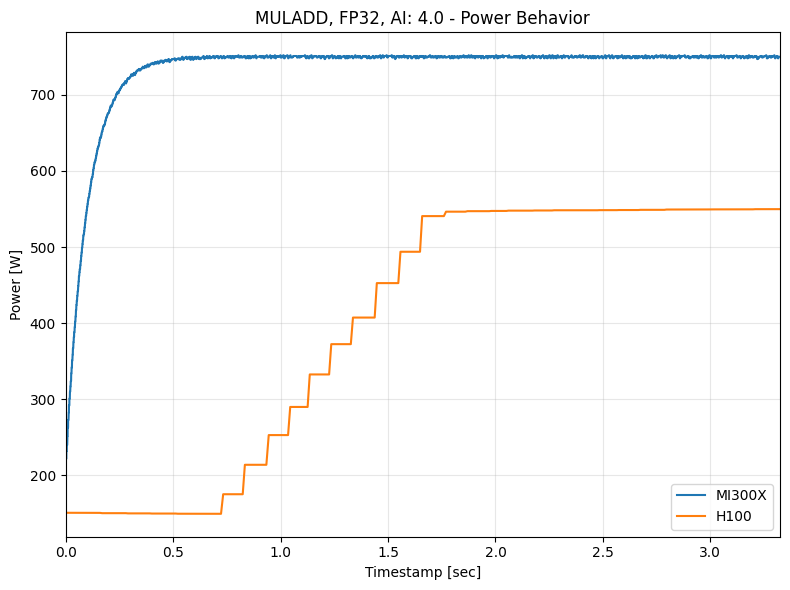

3.91
3.249470464


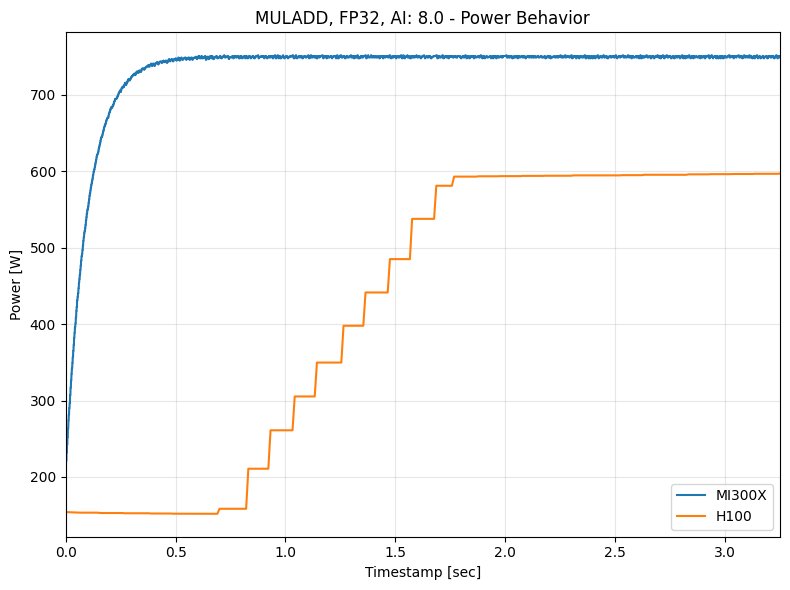

3.954
3.387306752


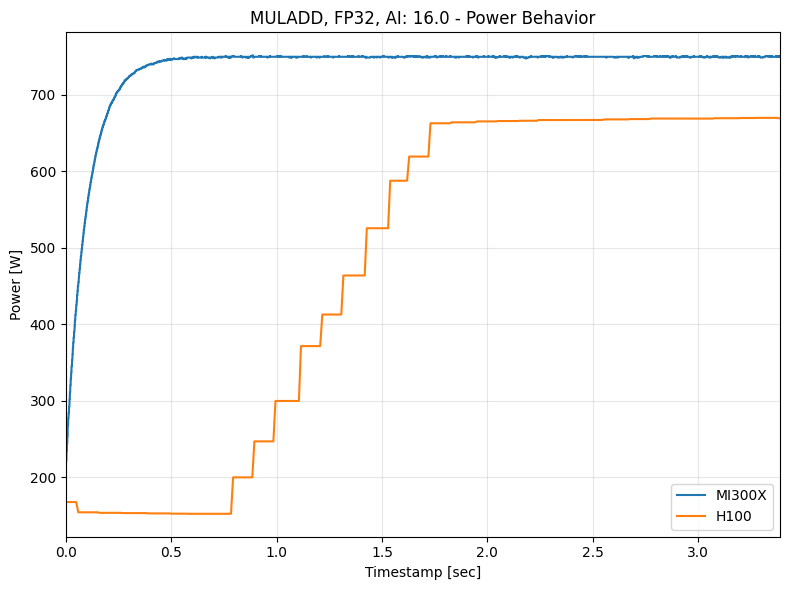

5.111
3.123134464


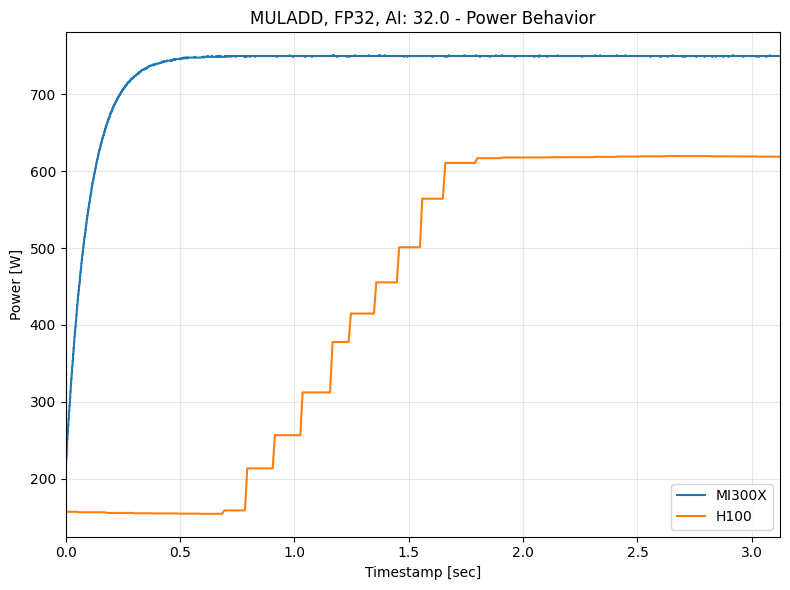

3.833
2.708967168


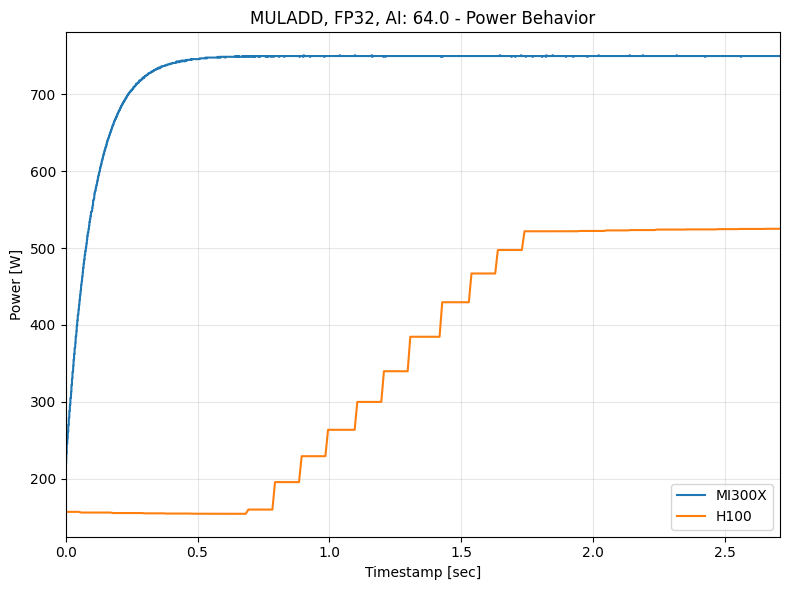

4.353
2.840212224


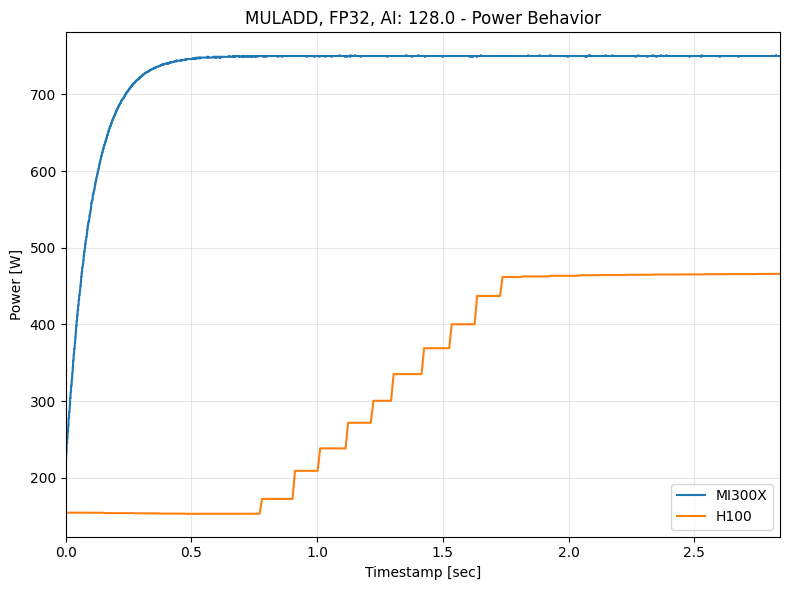

3.891
2.87401856


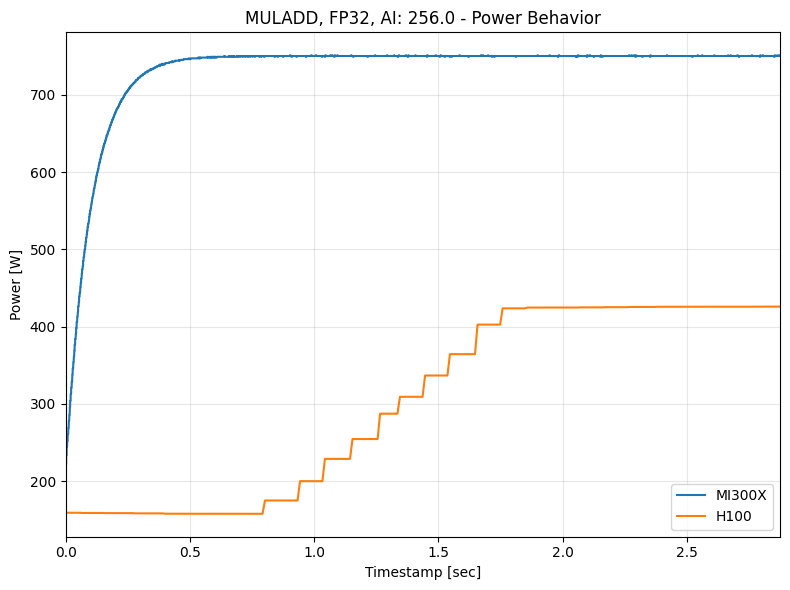

3.836
2.984964608


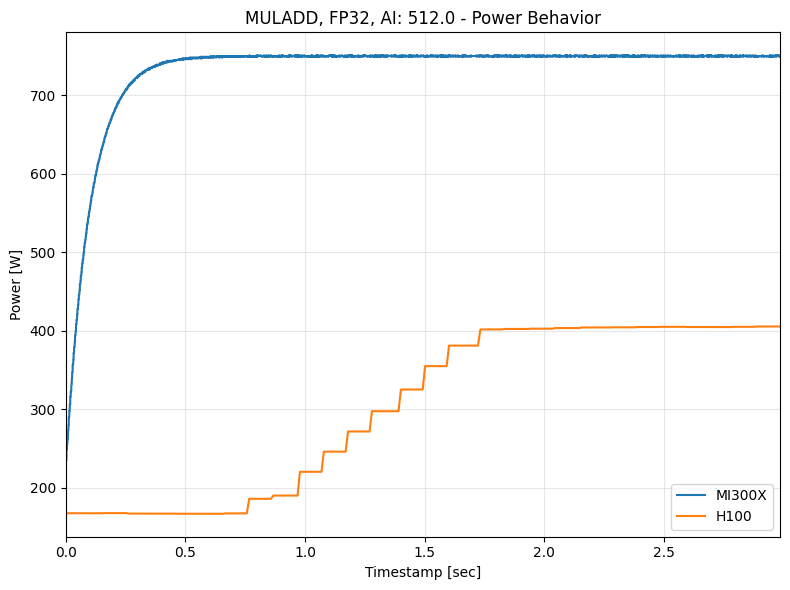

3.844
3.017981184


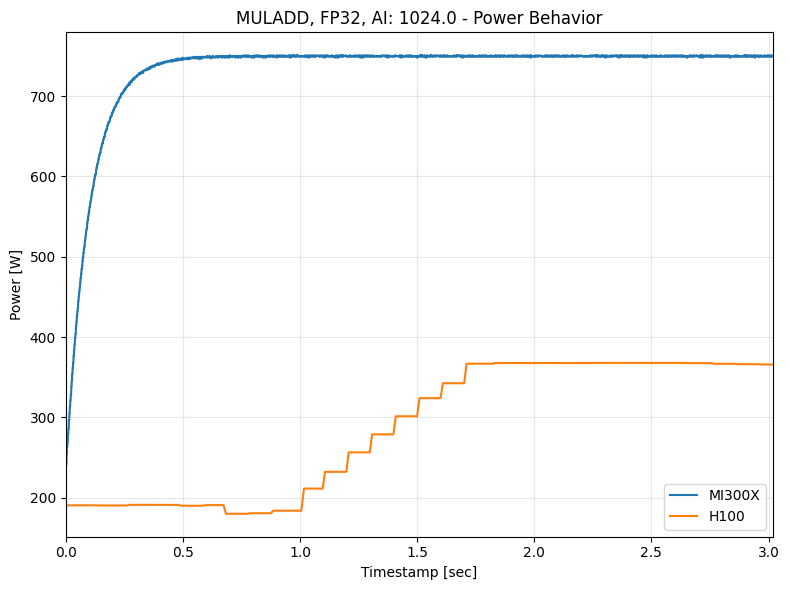

3.851
3.01913088


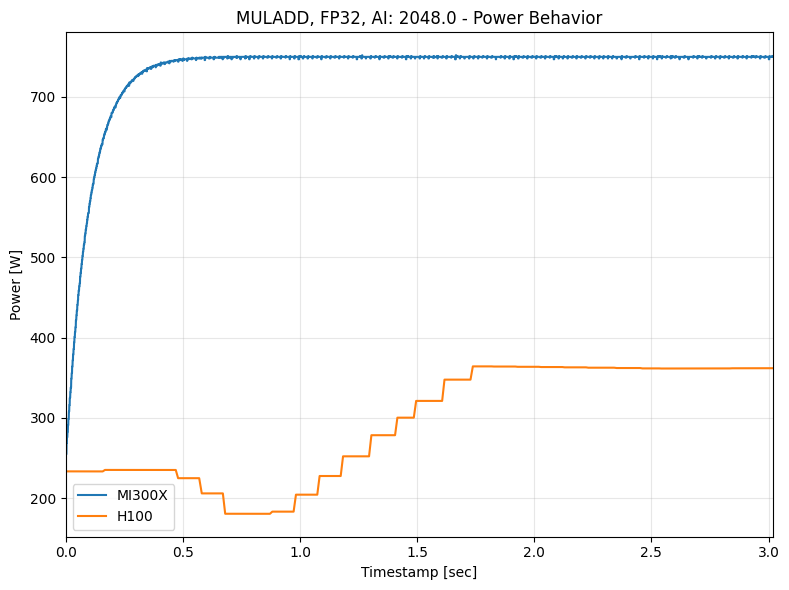

3.922
3.036676608


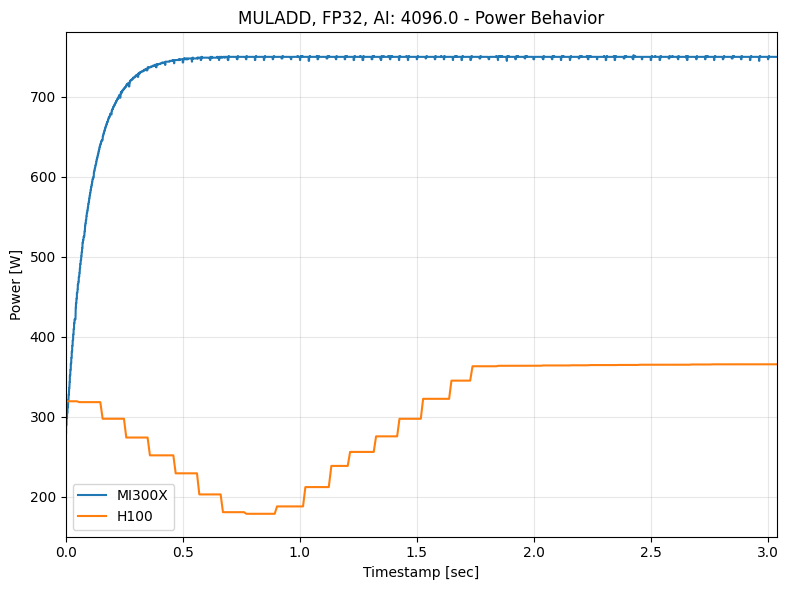

3.996
2.98344832


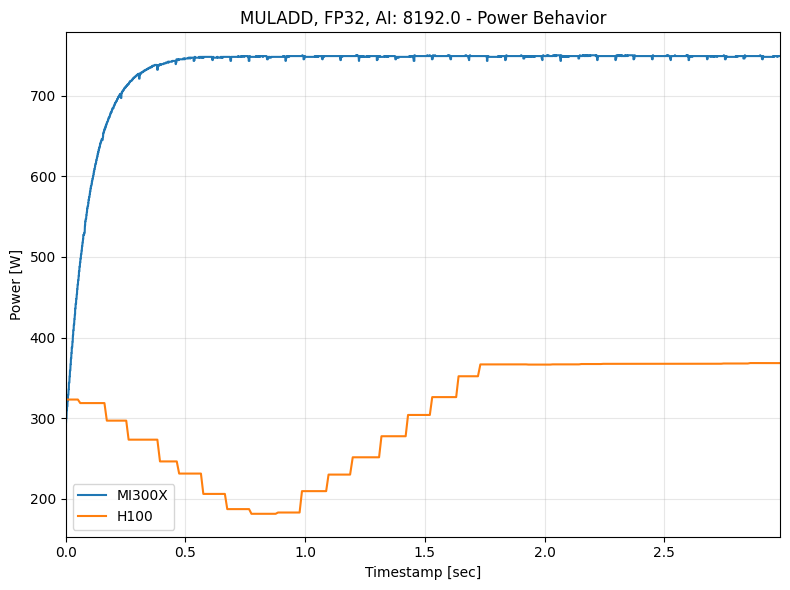

4.215
3.03070336


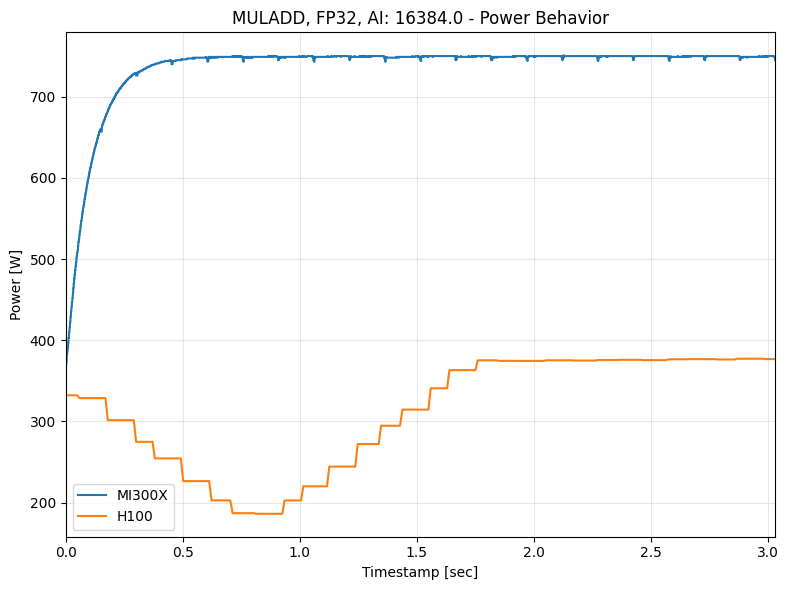

3.894
3.171188224


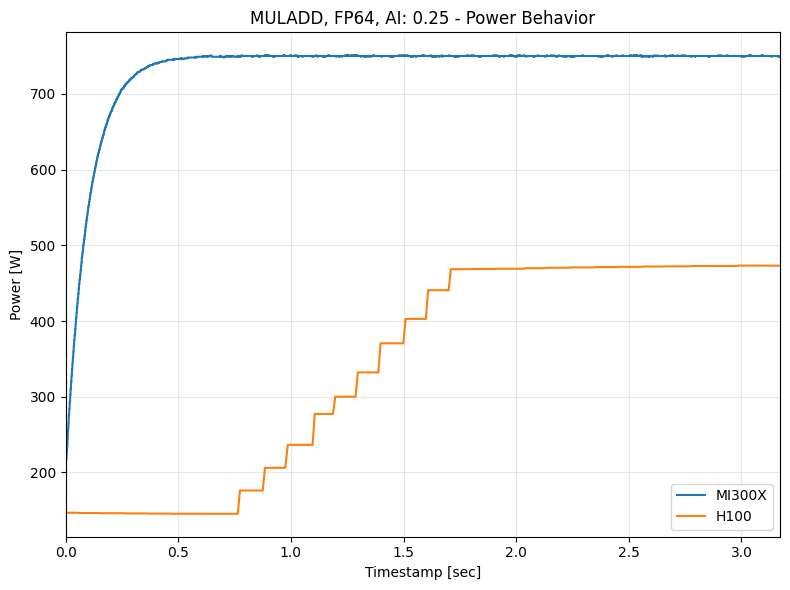

3.883
3.219841024


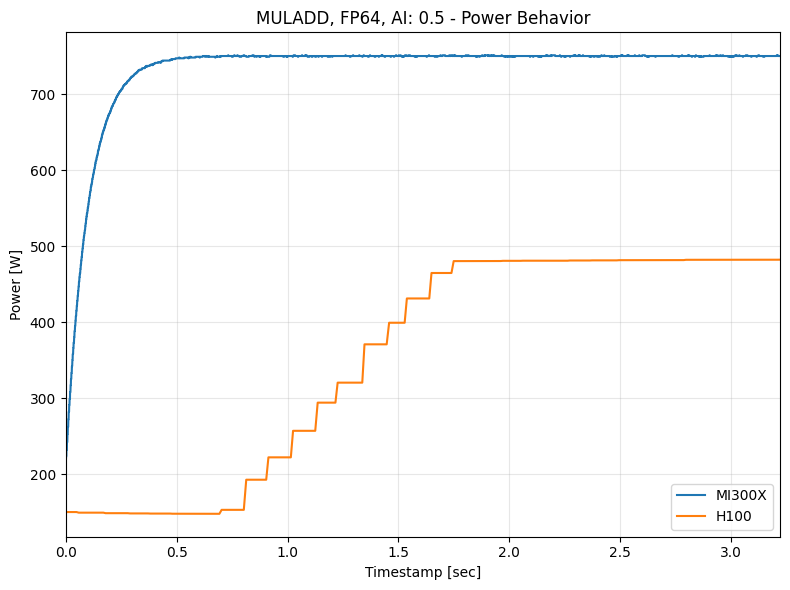

3.908
3.203070208


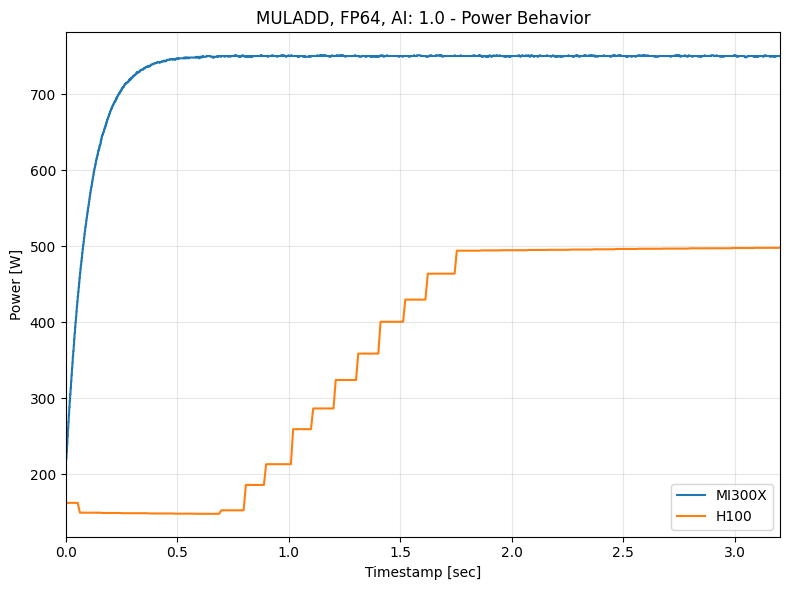

3.904
3.201579776


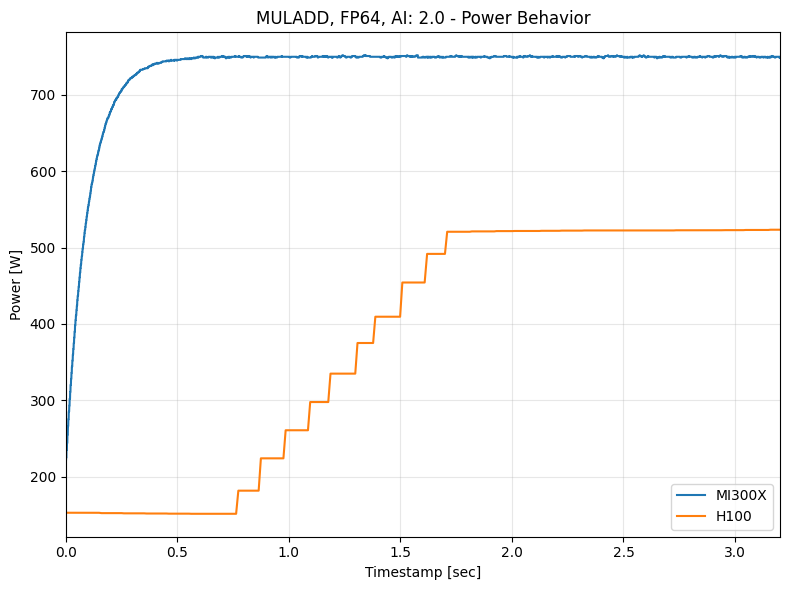

3.903
3.053536768


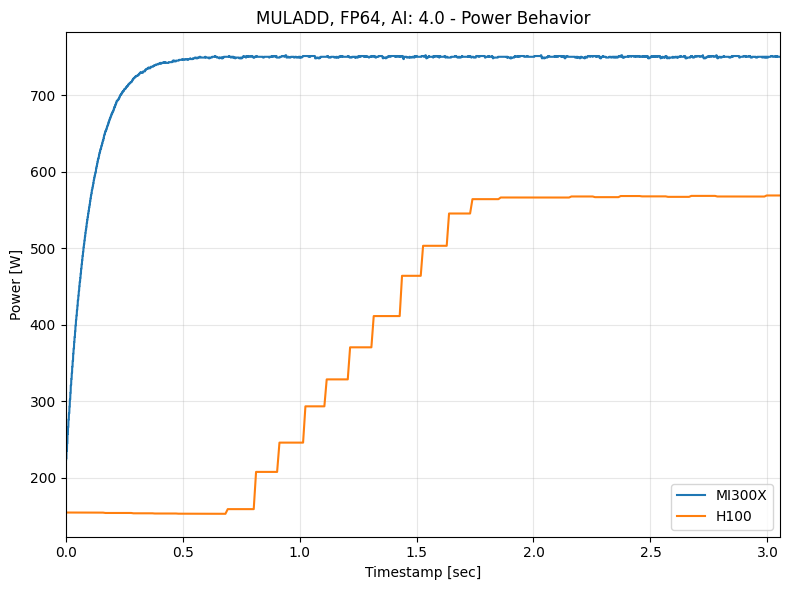

3.939
3.268304384


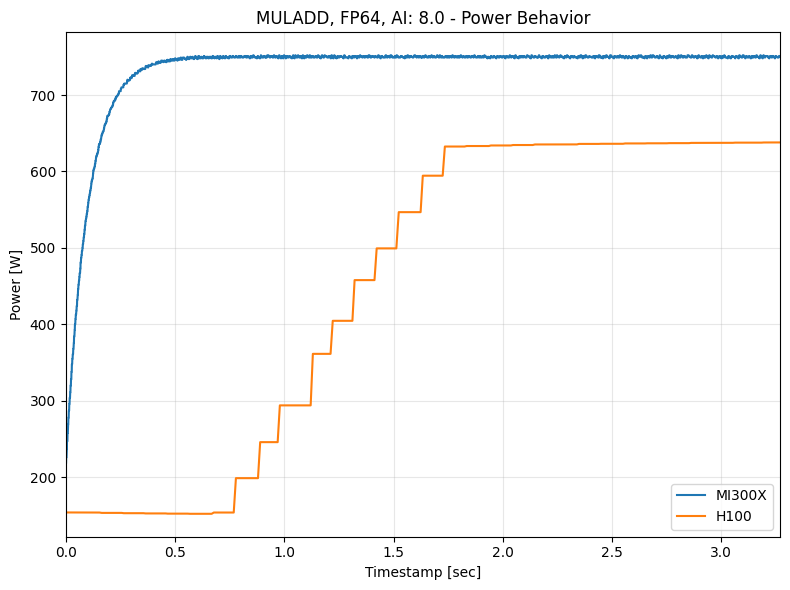

5.128
2.812485888


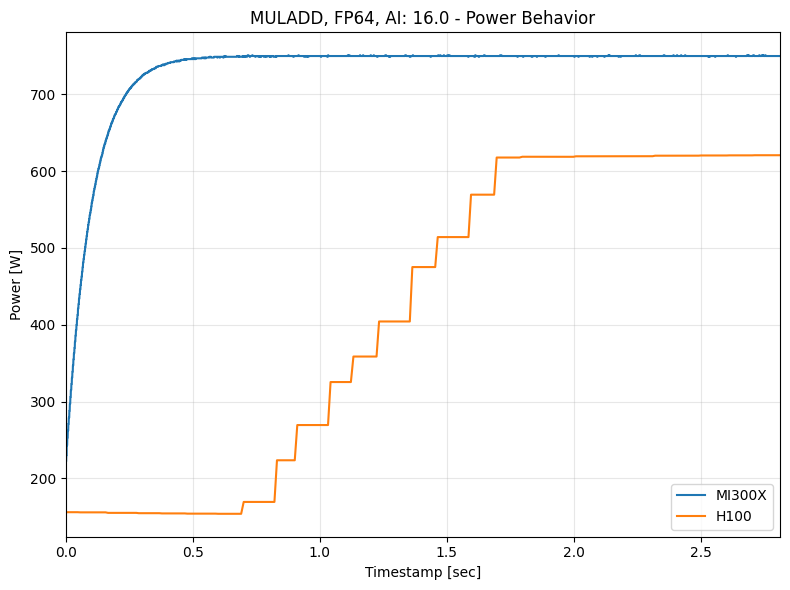

3.802
2.477387264


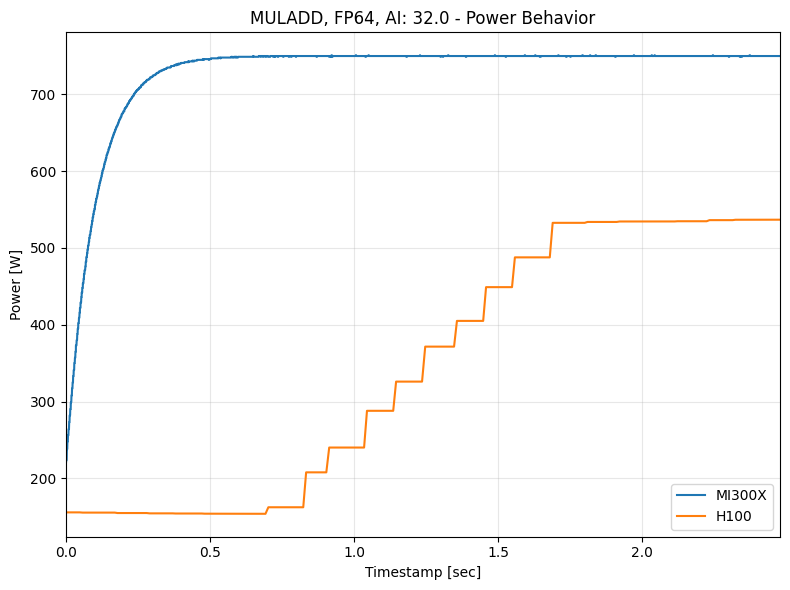

4.595
2.598538496


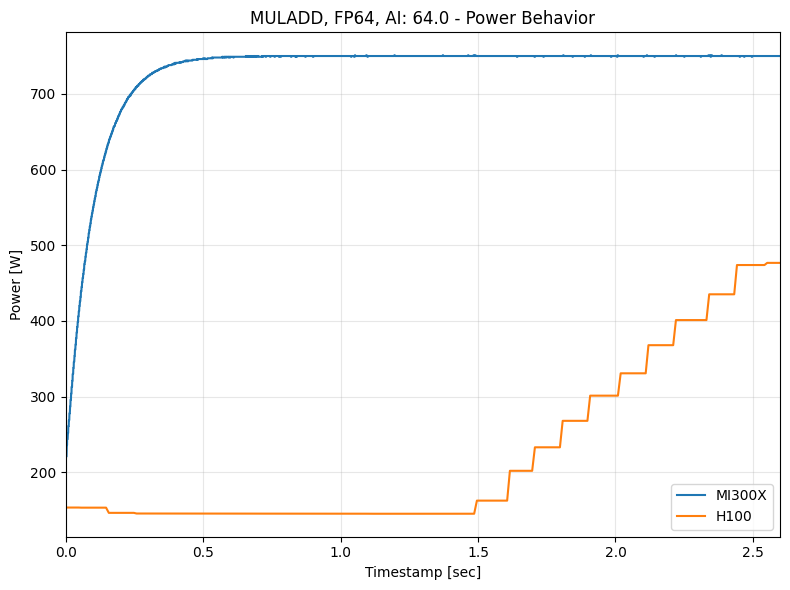

3.902
2.63521024


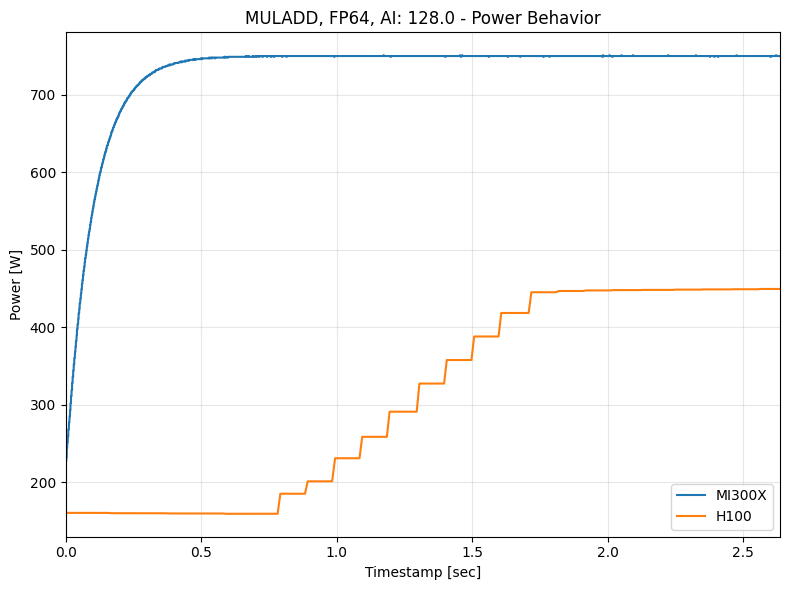

3.84
2.72395008


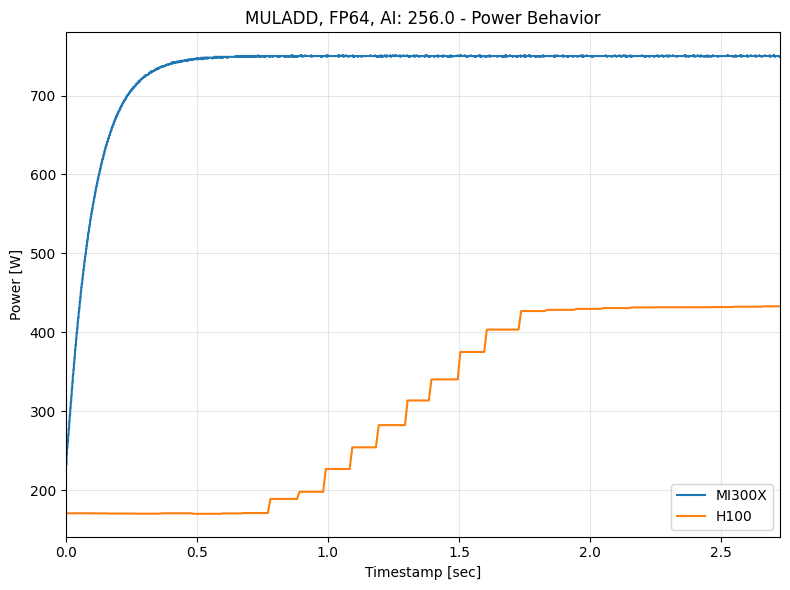

3.468
2.761233408


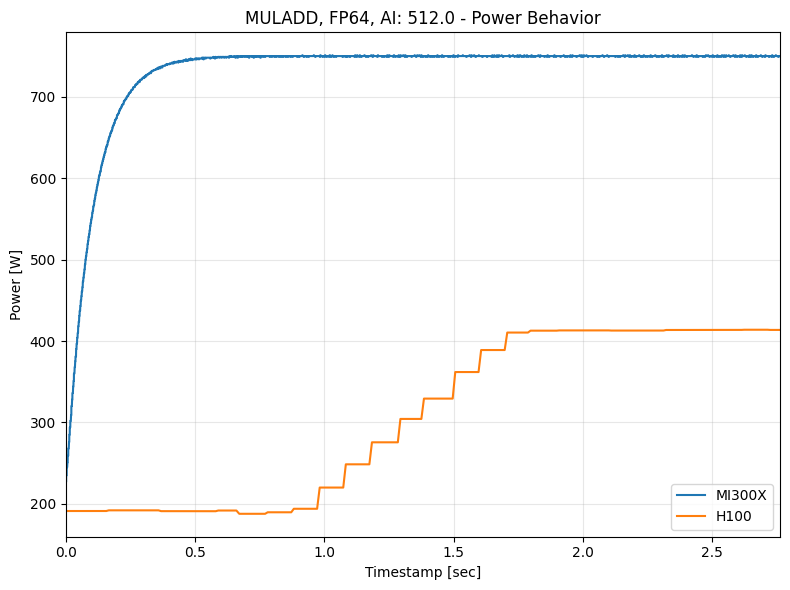

3.509
2.803363072


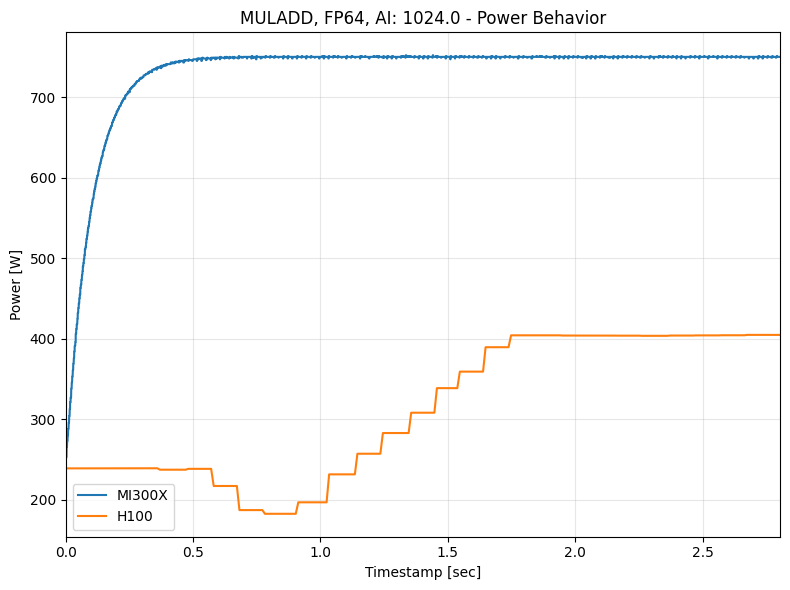

3.641
2.679300864


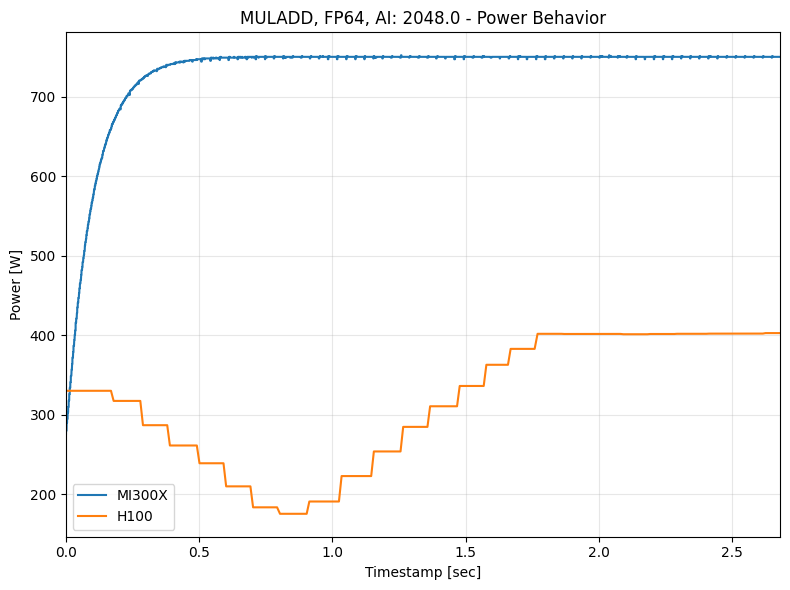

3.75
2.63771264


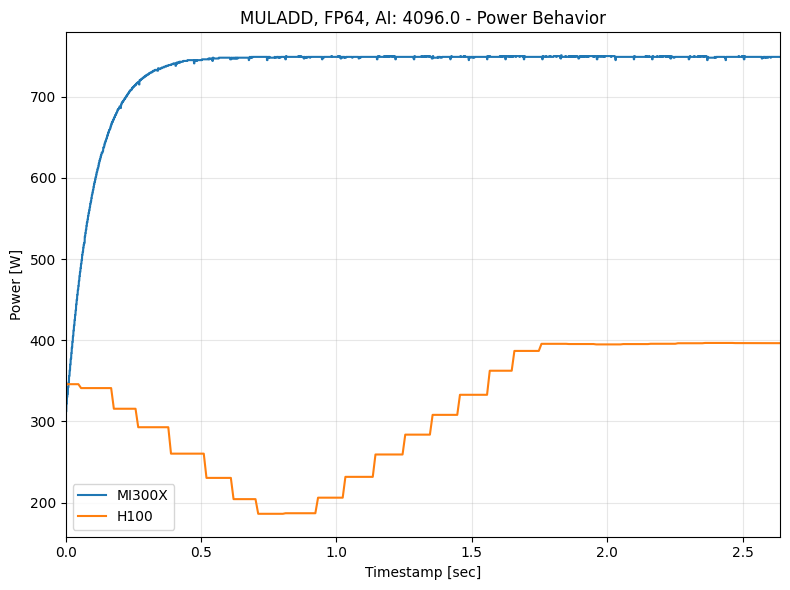

4.3
2.818115072


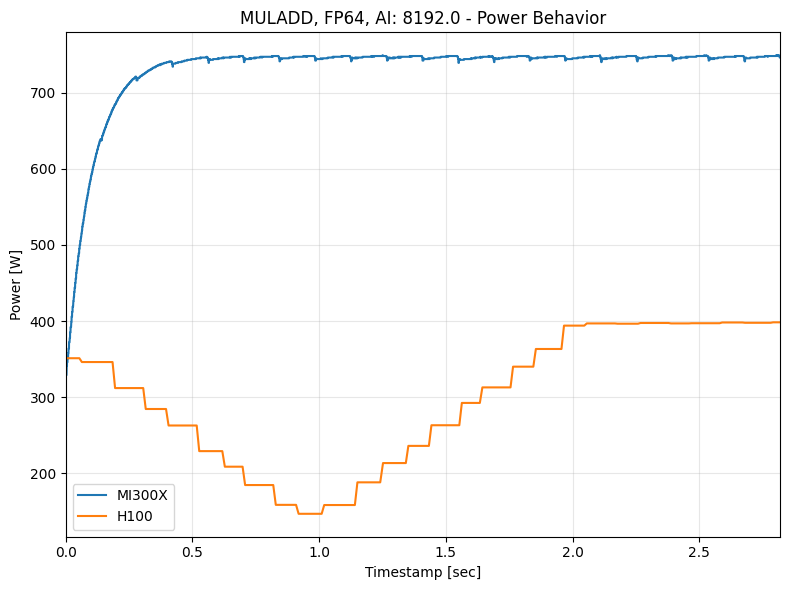

In [176]:
import numpy as np

!mkdir -p "./analysis_plots/power_fixed/comparison/"

# for gpu in hw_dfs.keys():
for op in hw_dfs['MI300X'].keys():
    for data in hw_dfs['MI300X'][op].keys():
        for ai in sorted(hw_dfs['MI300X'][op][data].keys()):
            # Check if both GPUs have data for this combination
            if ai in hw_dfs['H100'][op][data]:
                if op == 'MULADD':
                    if data in ['FP32', 'FP64']:
                        plt.figure(figsize=(8, 6))
                        
                        # MI300X data
                        hw_df_mi300x = hw_dfs['MI300X'][op][data][ai]
                        # hw_df_mi300x['Timestamp'] = hw_df_mi300x['Timestamp'] - hw_df_mi300x.iloc[0]['Timestamp']
                        plt.plot(hw_df_mi300x['Timestamp'], hw_df_mi300x['Power[W]'], label='MI300X', color='tab:blue')
                        
                        # H100 data
                        hw_df_h100 = hw_dfs['H100'][op][data][ai]
                        # hw_df_h100['timestamp'] = hw_df_h100['timestamp'] - hw_df_h100.iloc[0]['timestamp']
                        plt.plot(hw_df_h100['timestamp'], hw_df_h100['power.draw [W]'], label='H100', color='tab:orange')
                        
                        plt.title(f'{op}, {data}, AI: {ai} - Power Behavior')
                        plt.xlabel('Timestamp [sec]')
                        plt.ylabel('Power [W]')
                        print(hw_df_h100['timestamp'].max())
                        print(hw_df_mi300x['Timestamp'].max())
                        plt.xlim(0, min(hw_df_h100['timestamp'].max(), hw_df_mi300x['Timestamp'].max()))
                        plt.legend()
                        plt.grid(alpha=0.3)
                        plt.tight_layout()
                        plt.savefig(f'./analysis_plots/power_fixed/comparison/{op}_{data}_{ai}_power_comparison.png')
                        plt.show()
            # targ_freqs.append(hw_df['Clk_system[MHz]'].median())
            # curr_freqs.append(hw_df['current_gfxclk[MHz]'].median())


# diffs = []
# for t, c in zip(targ_freqs, curr_freqs):
#     diffs.append(abs(t - c))

# print(np.mean(diffs))

3.93
3.18214784


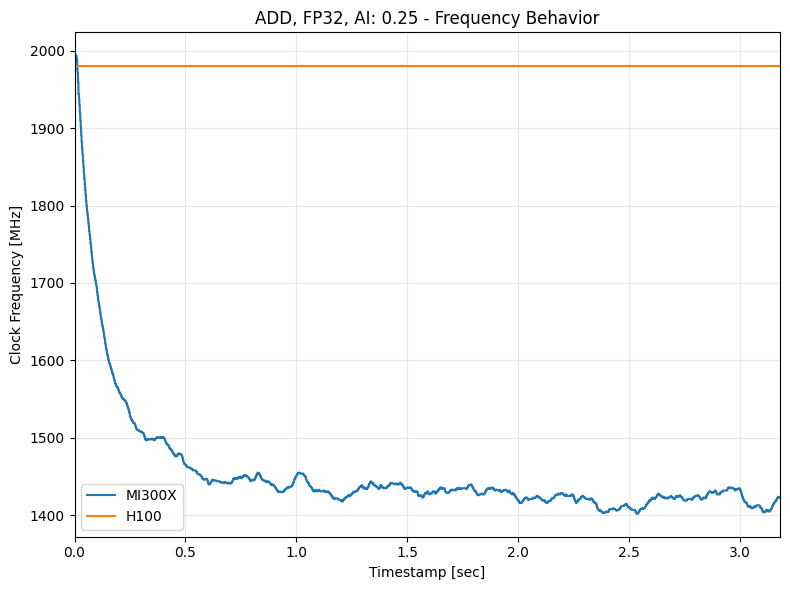

3.91
3.234641408


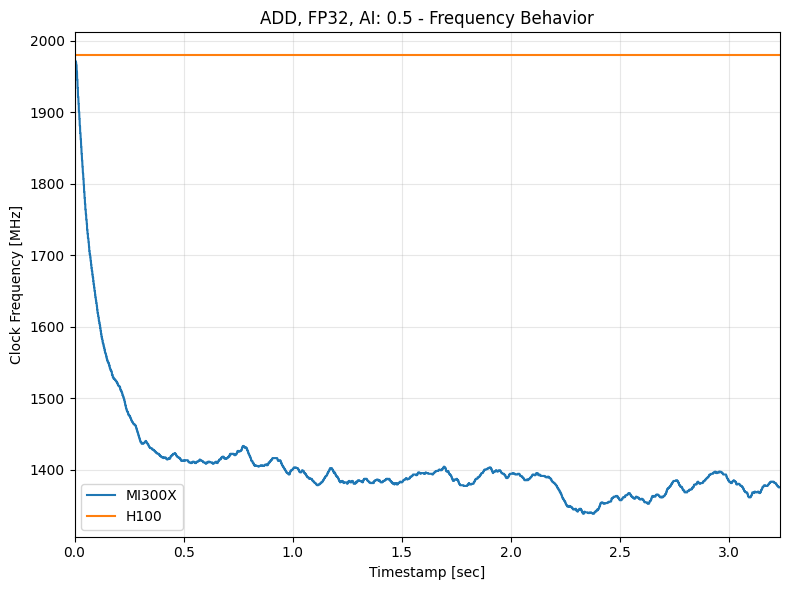

3.912
3.2247936


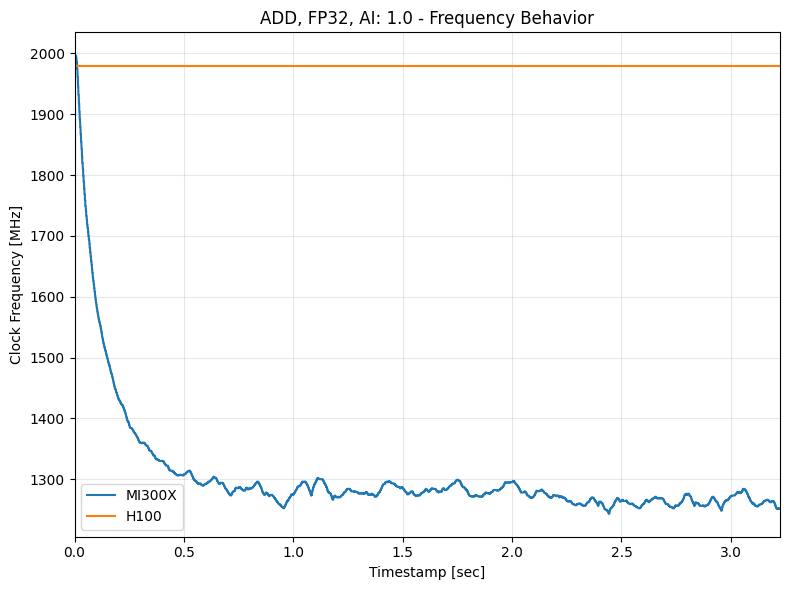

3.913
3.287451392


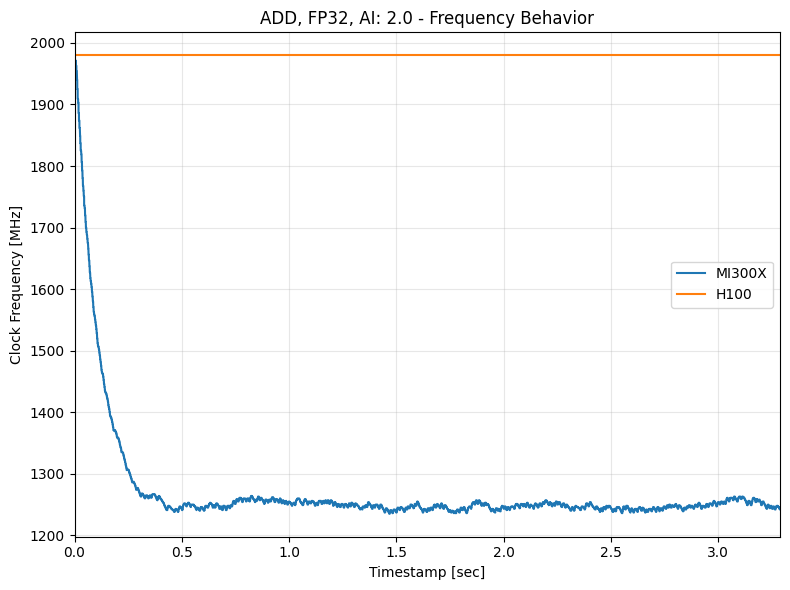

3.912
3.203913216


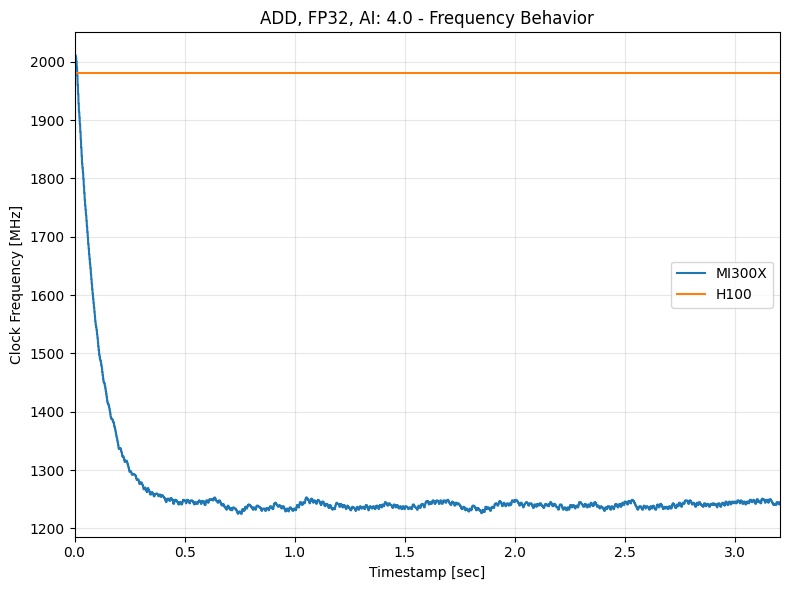

3.918
3.378596096


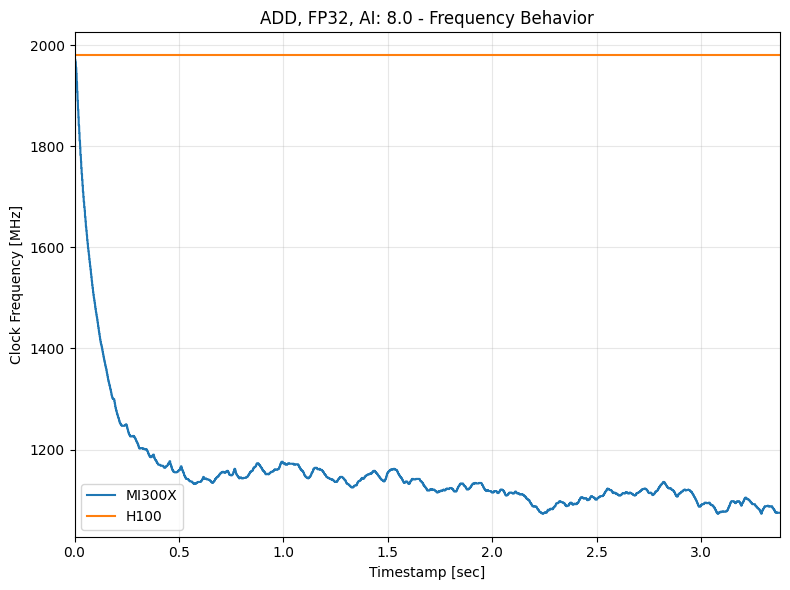

3.92
3.037002496


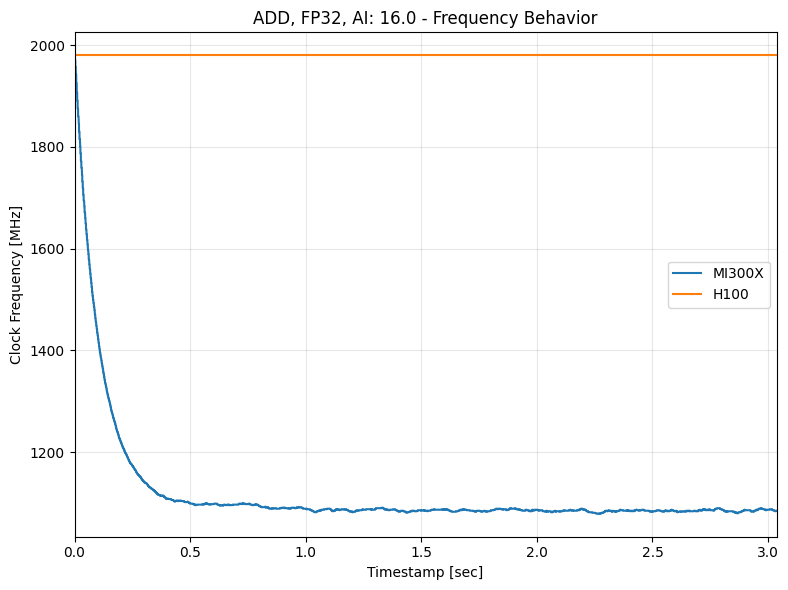

3.842
2.661194496


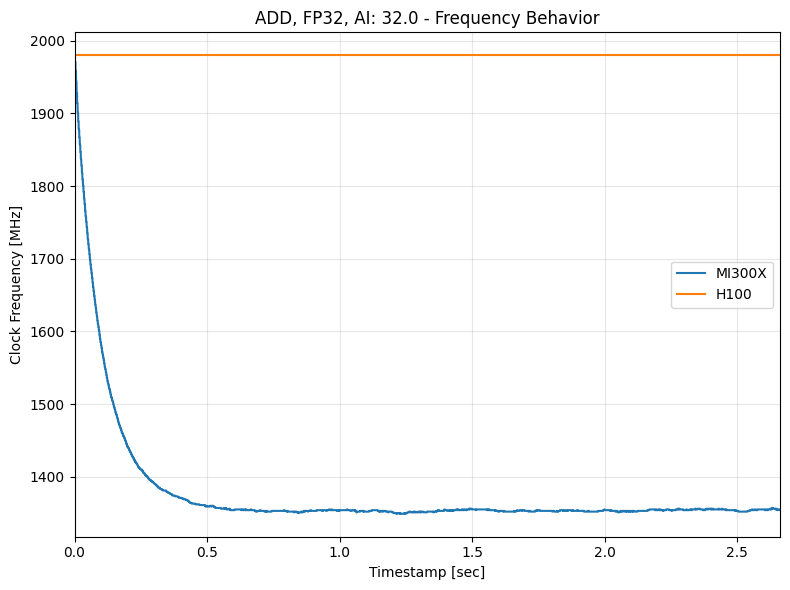

3.889
2.792108544


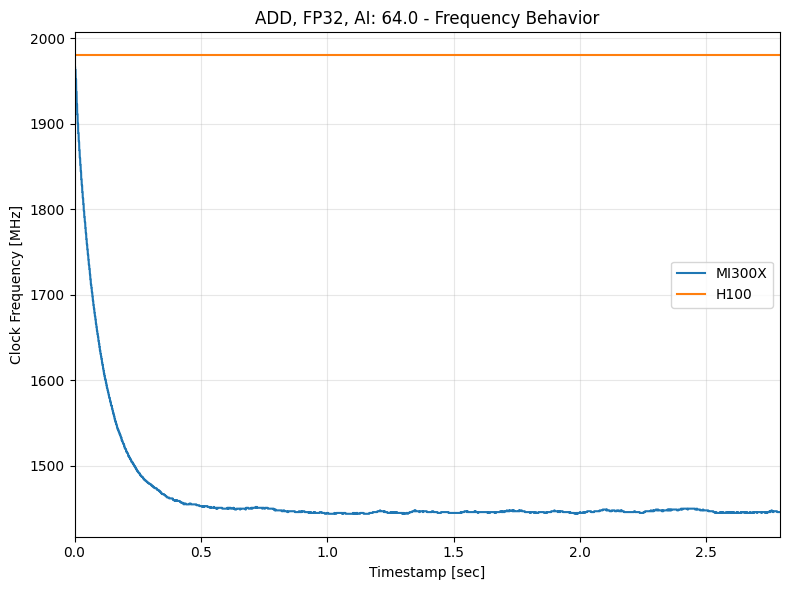

3.884
2.83897216


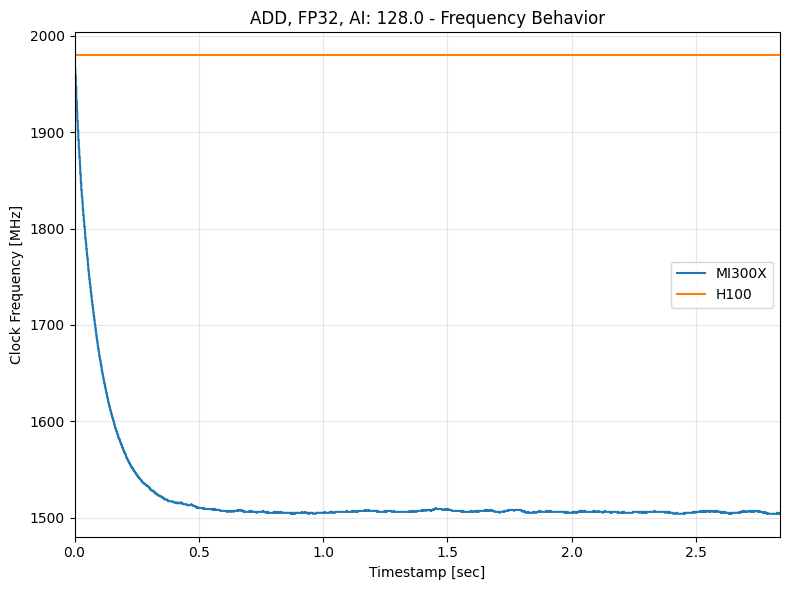

5.114
2.944052736


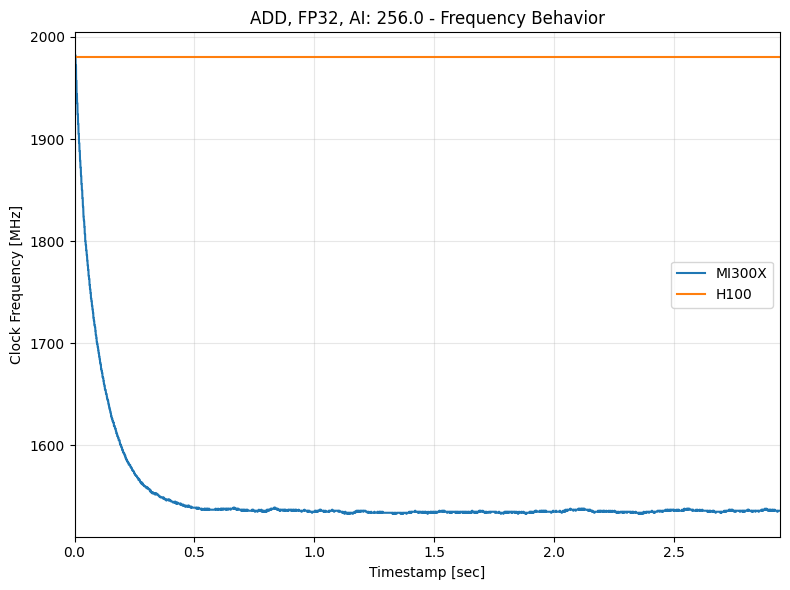

3.847
2.979030784


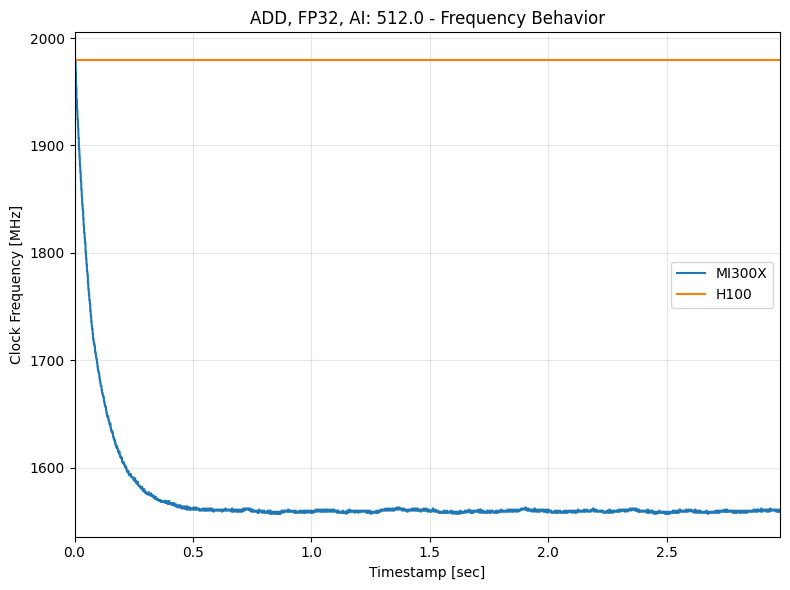

3.841
3.005963264


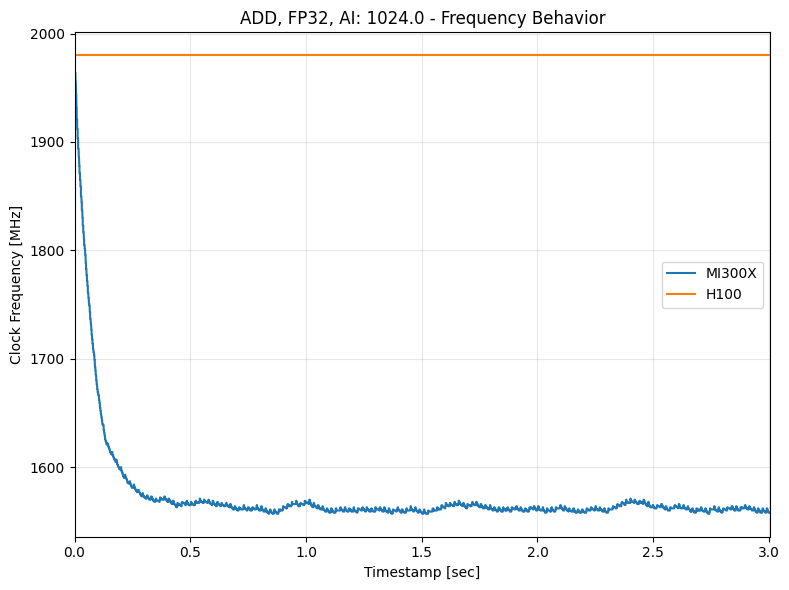

3.93
3.004075776


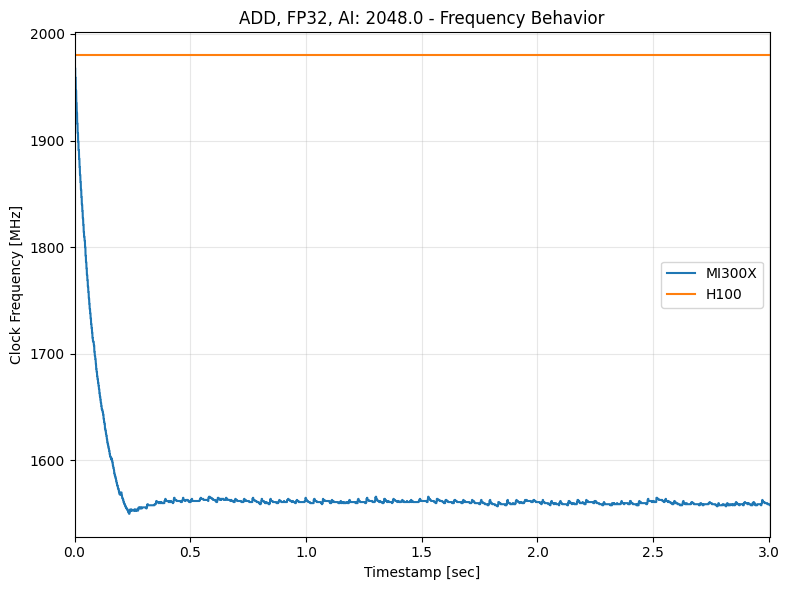

3.984
2.95657728


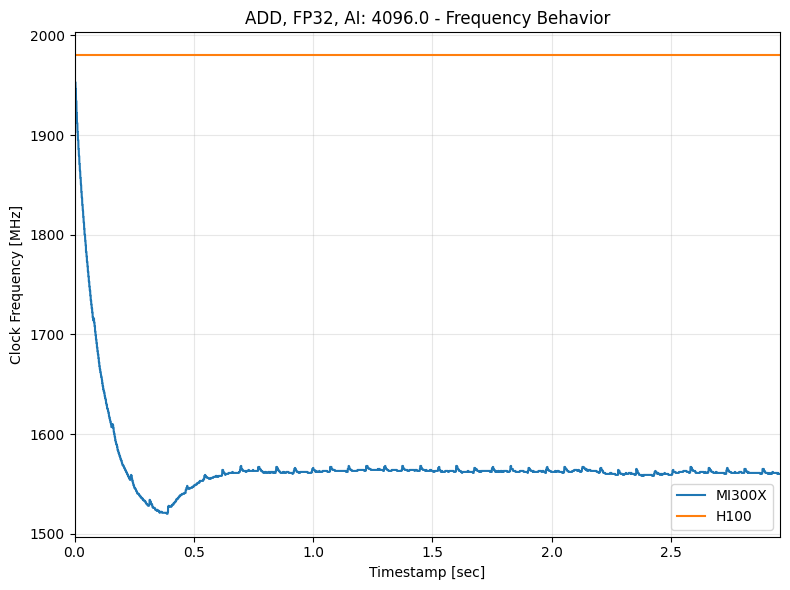

4.227
3.013497088


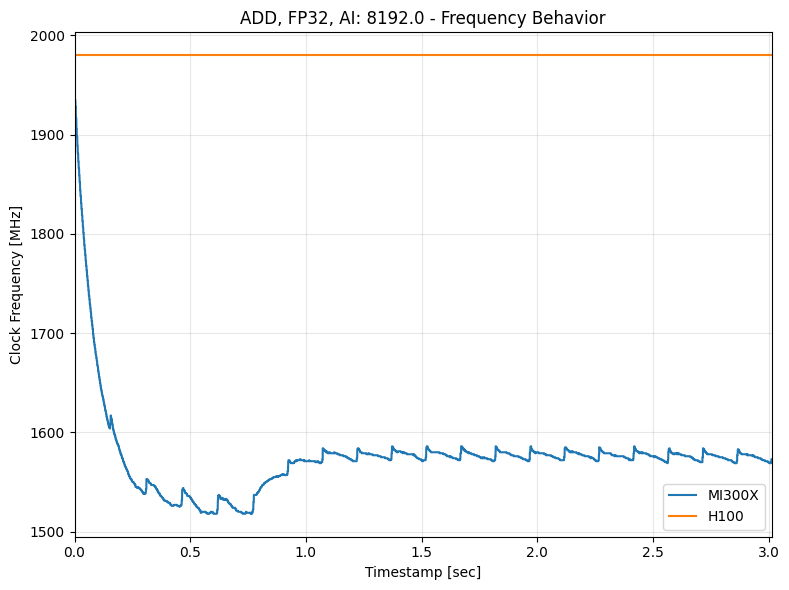

3.884
3.170482688


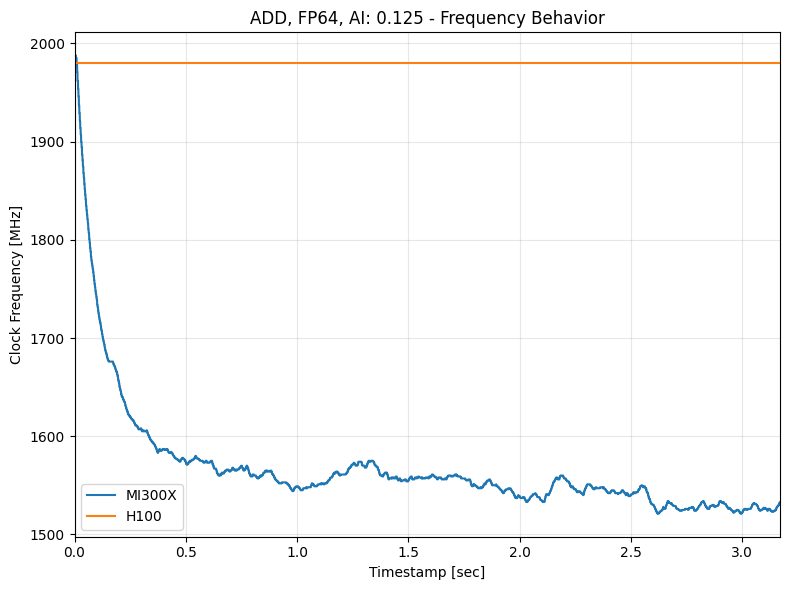

3.903
3.2172352


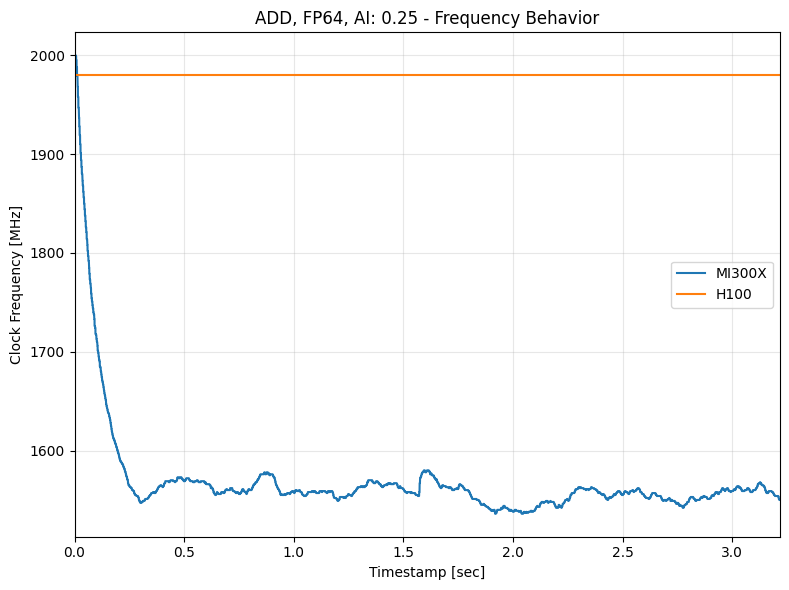

3.899
3.197006336


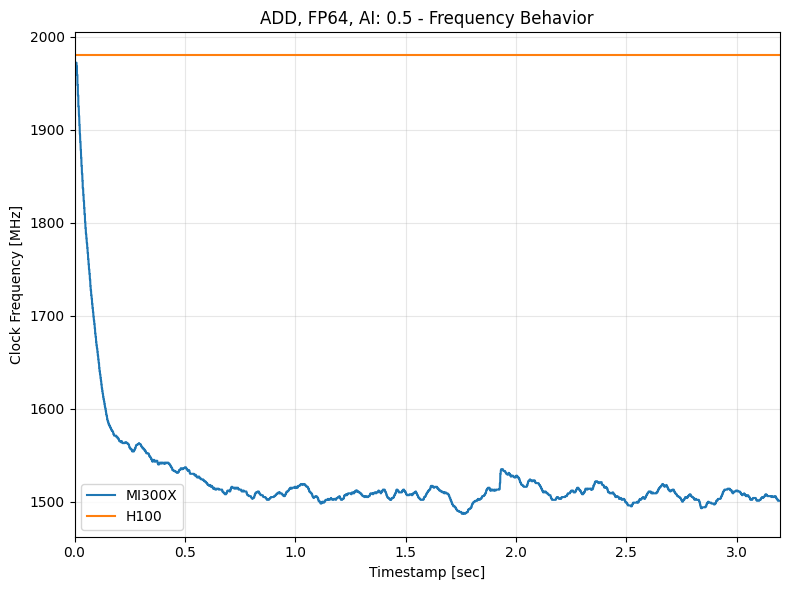

3.912
3.182294784


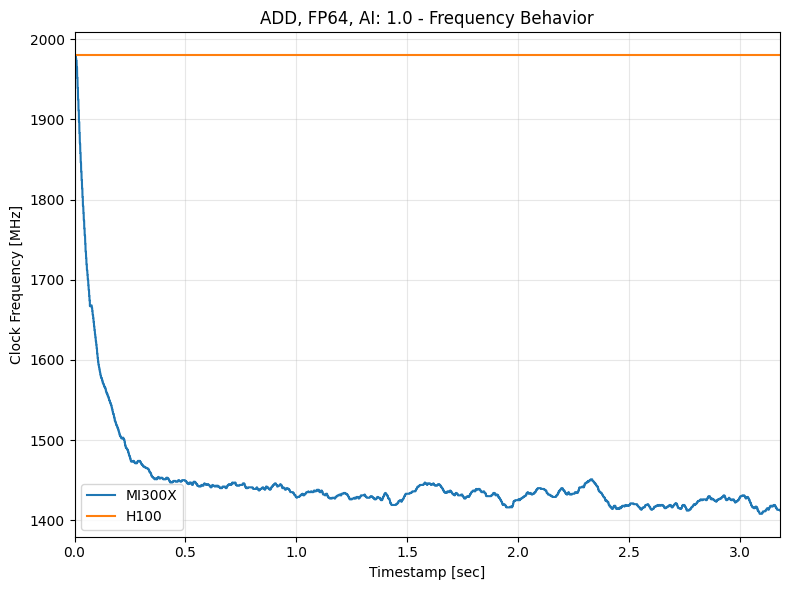

3.926
2.851305984


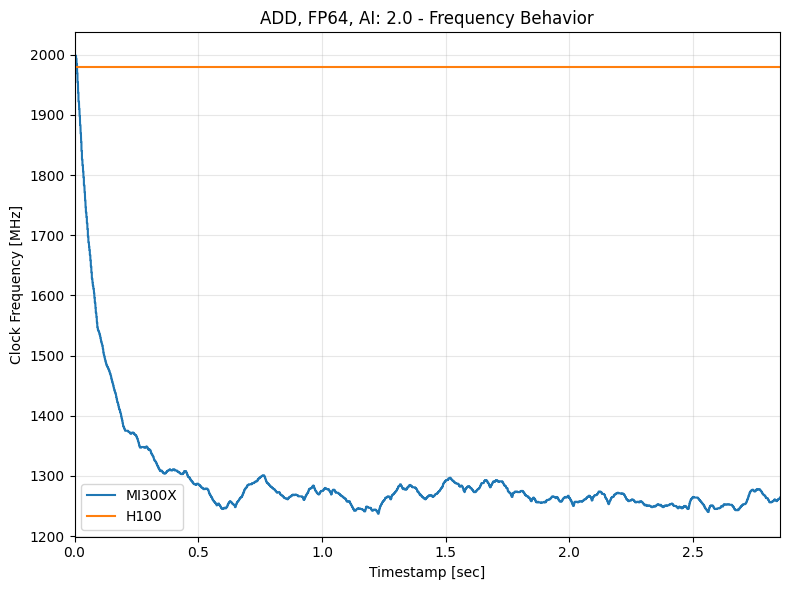

3.952
3.22108416


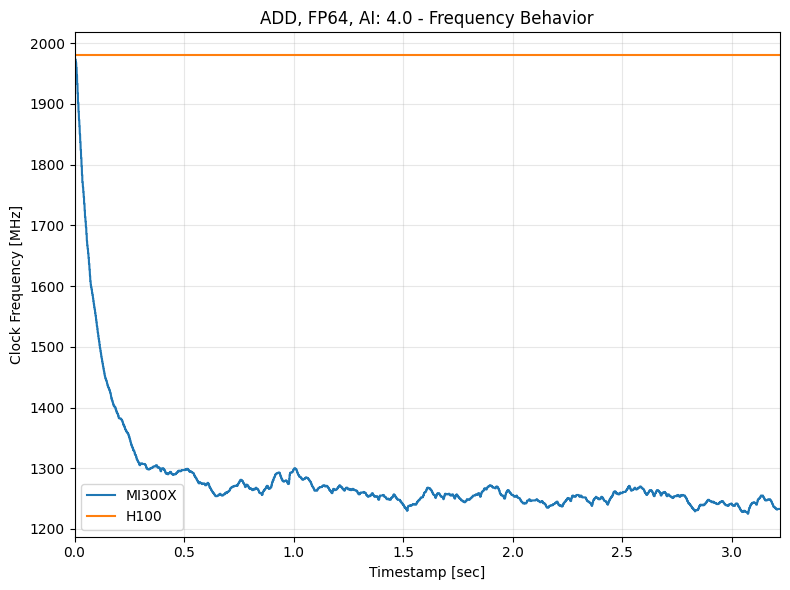

3.832
2.35583616


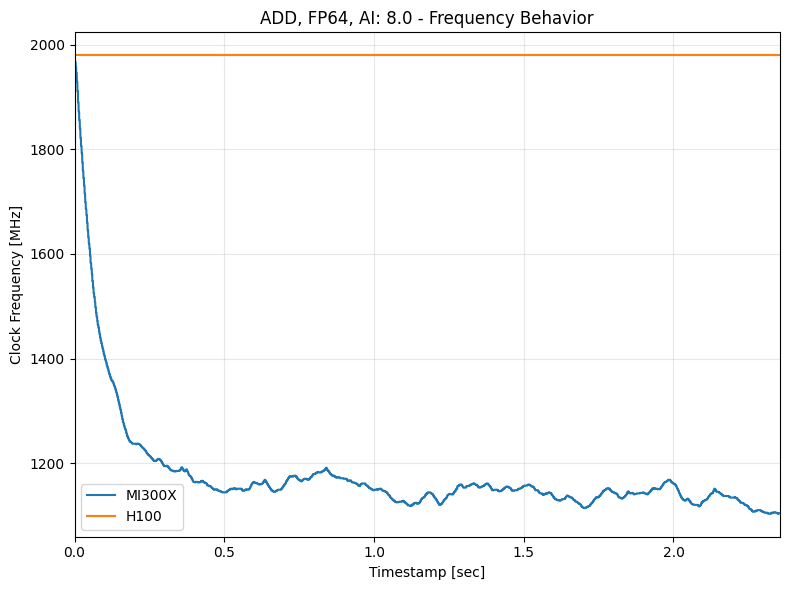

3.8
1.842912768


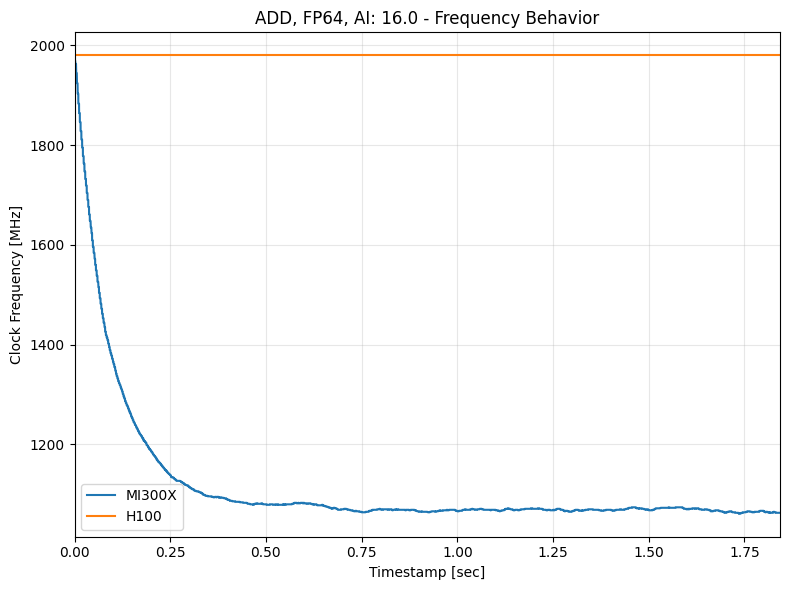

3.833
1.66209024


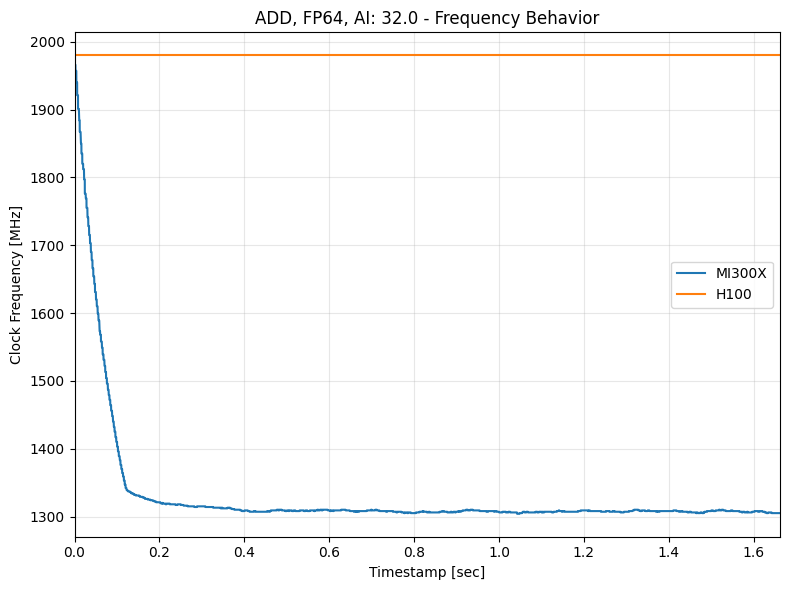

3.831
1.623218944


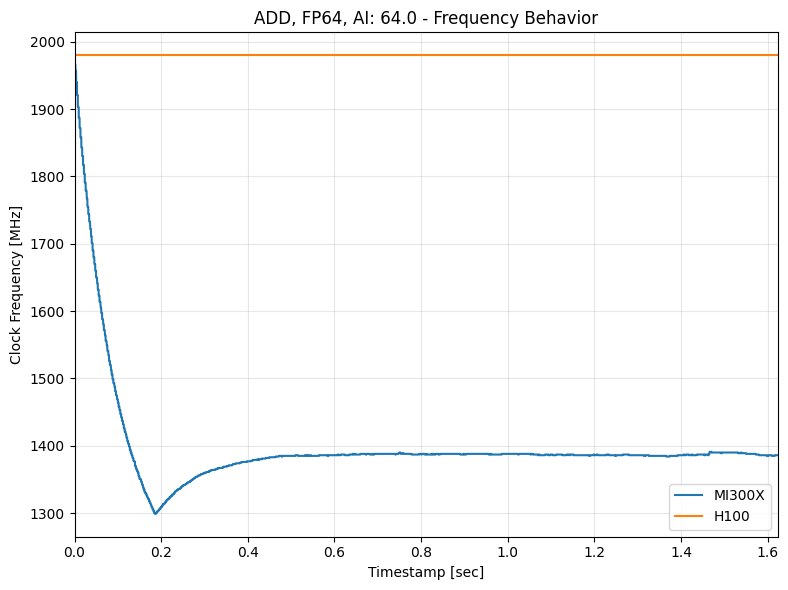

3.85
1.64982144


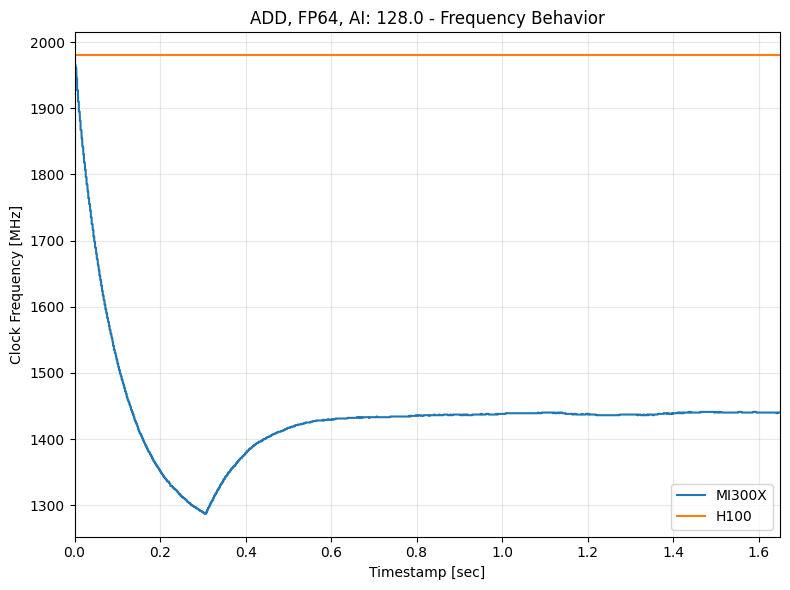

3.417
1.681473024


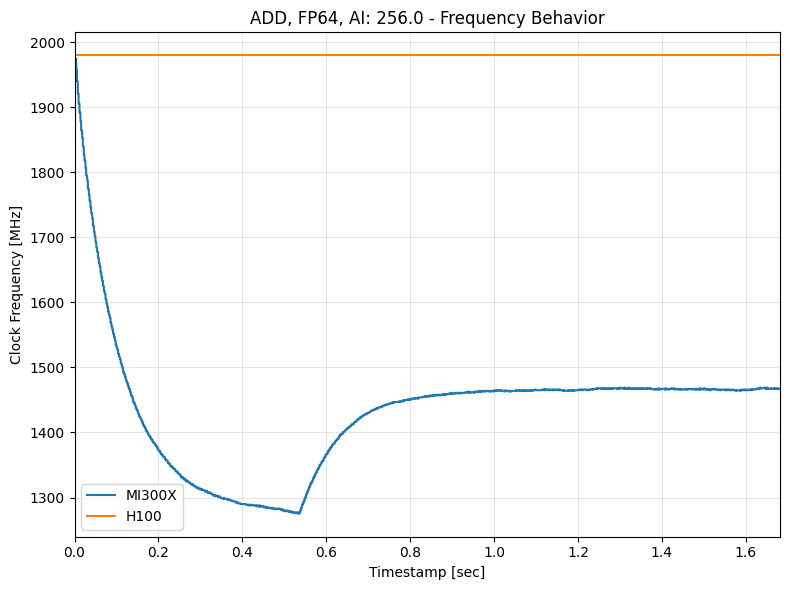

3.519
1.731803392


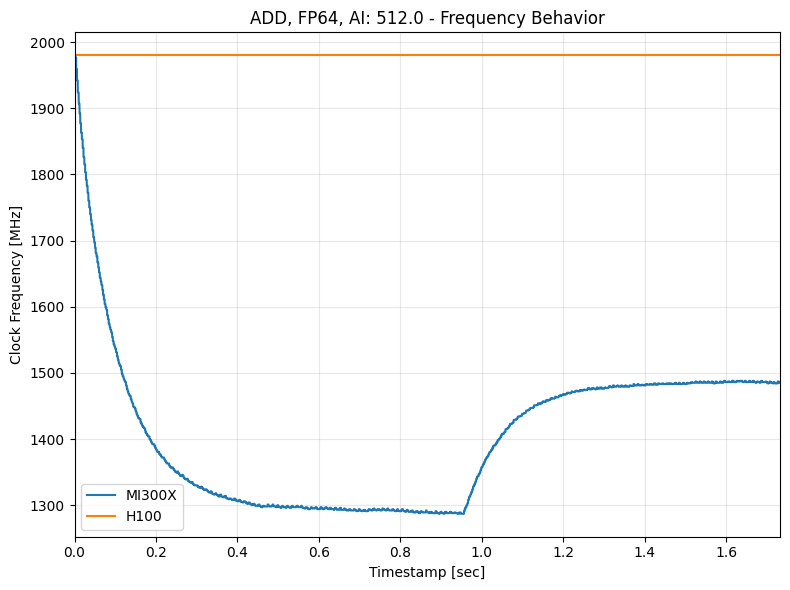

3.611
1.908820224


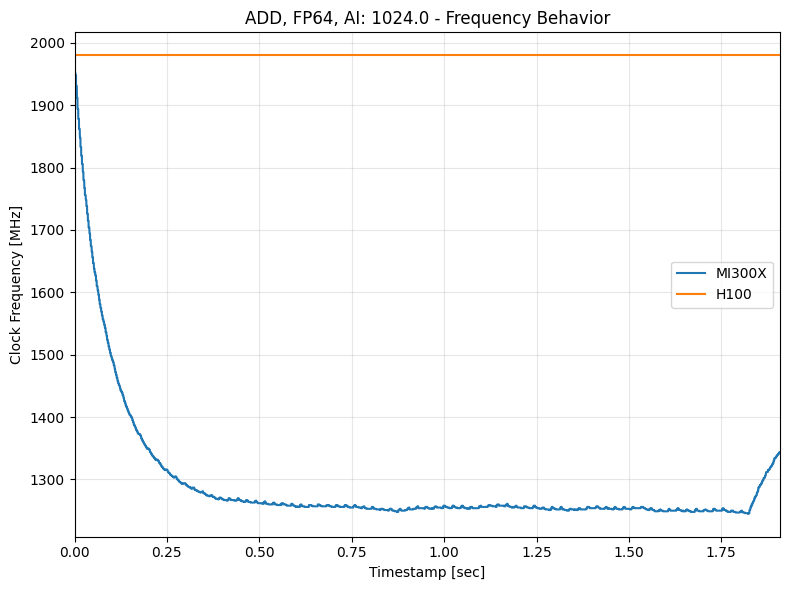

3.758
1.849210112


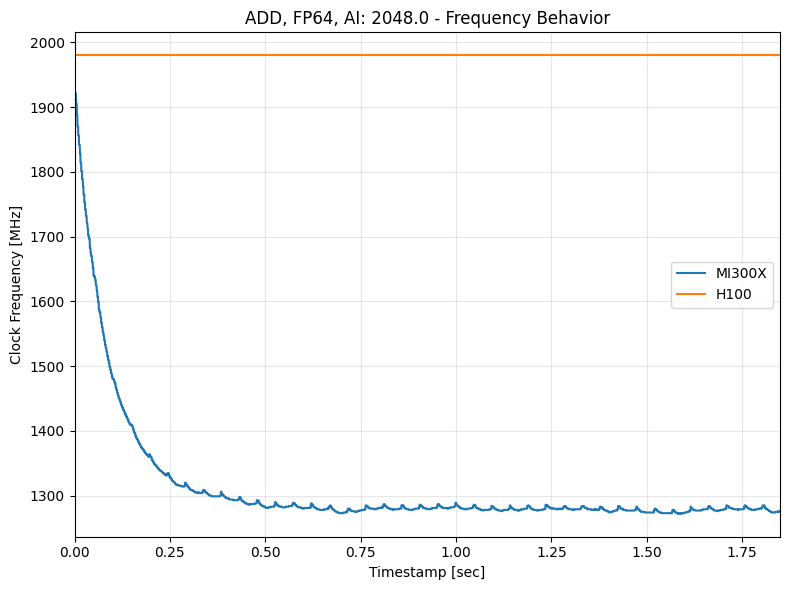

4.134
1.773303296


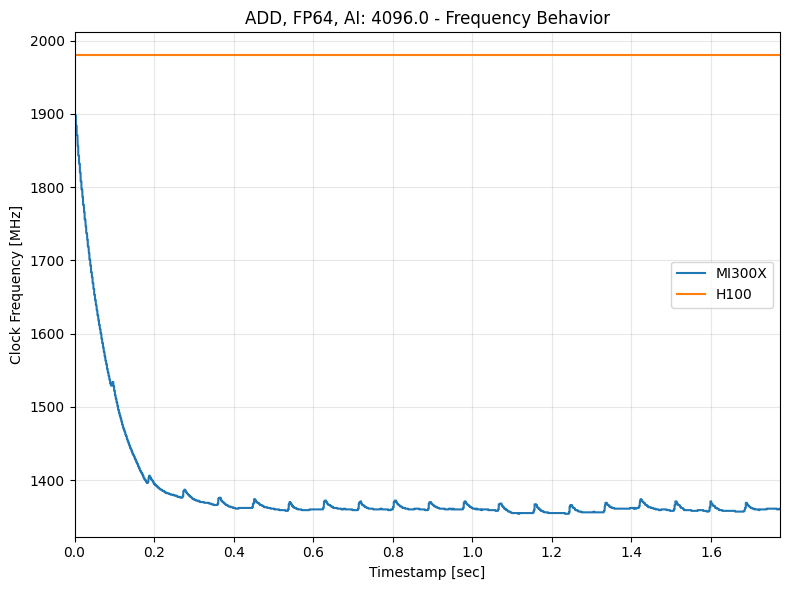

3.883
3.184032


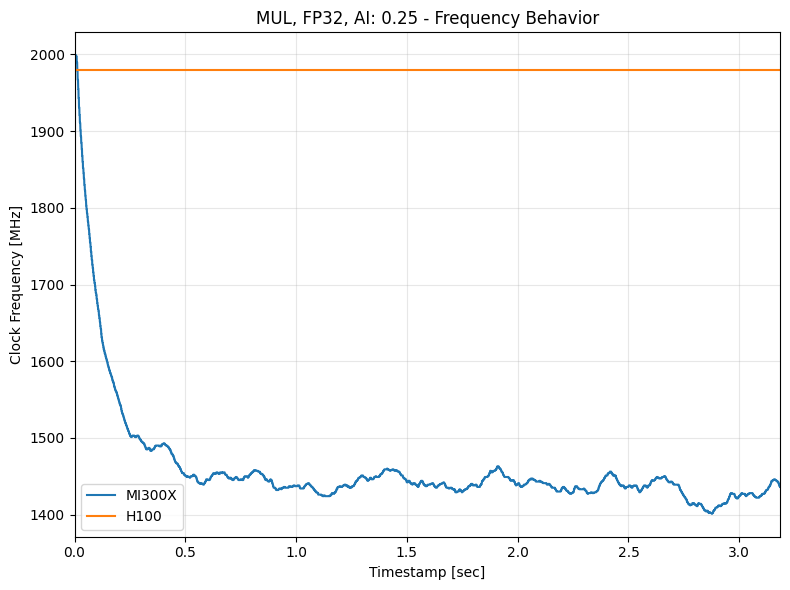

3.898
3.240190208


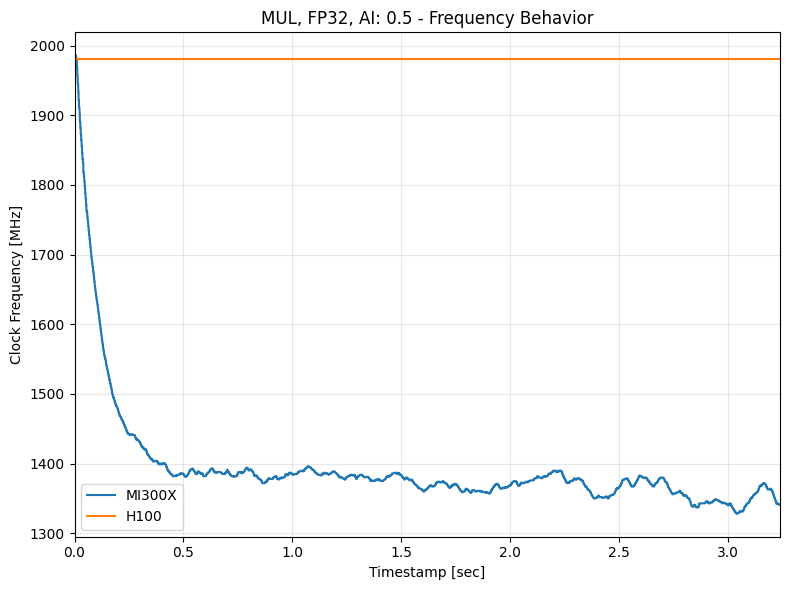

3.891
3.233305856


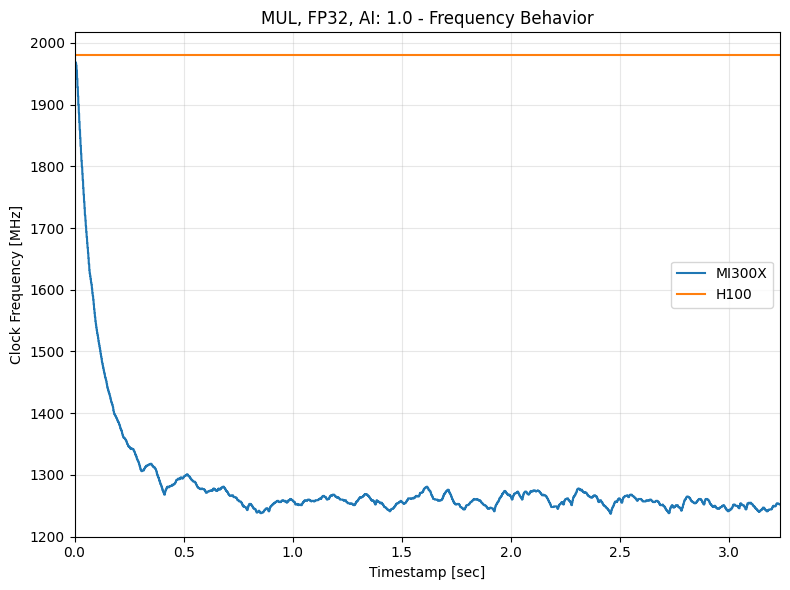

3.901
3.305775104


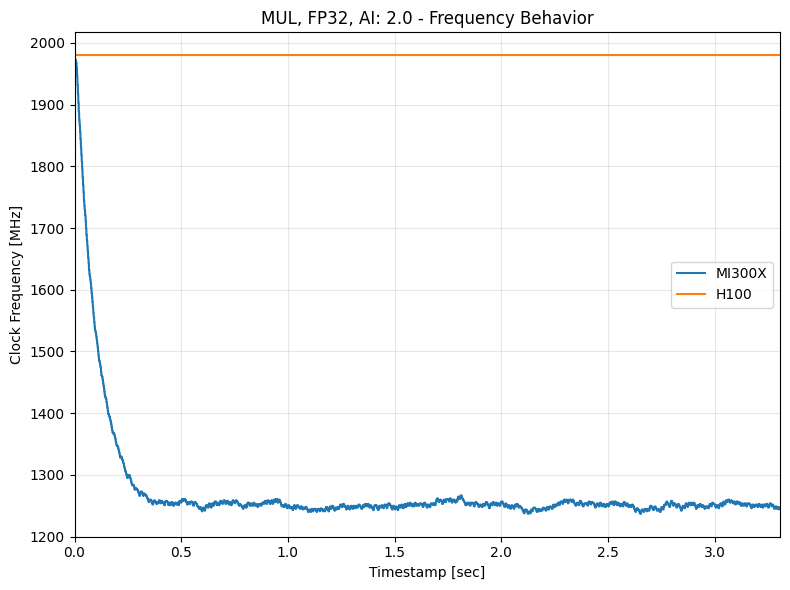

3.894
3.224996096


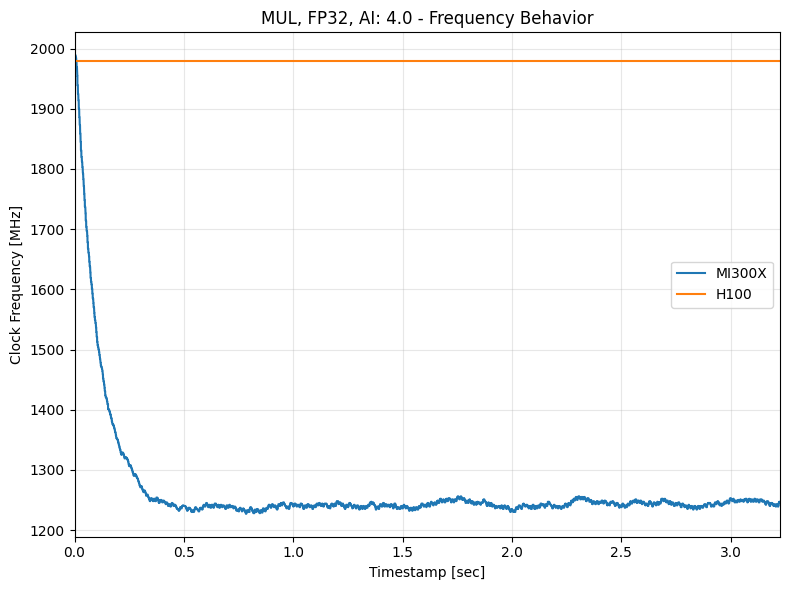

3.891
3.43349504


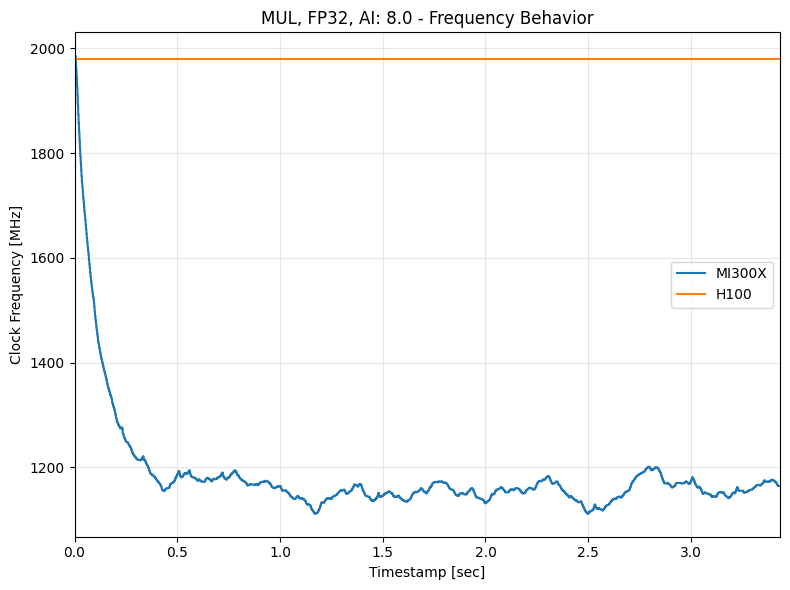

3.891
3.078470656


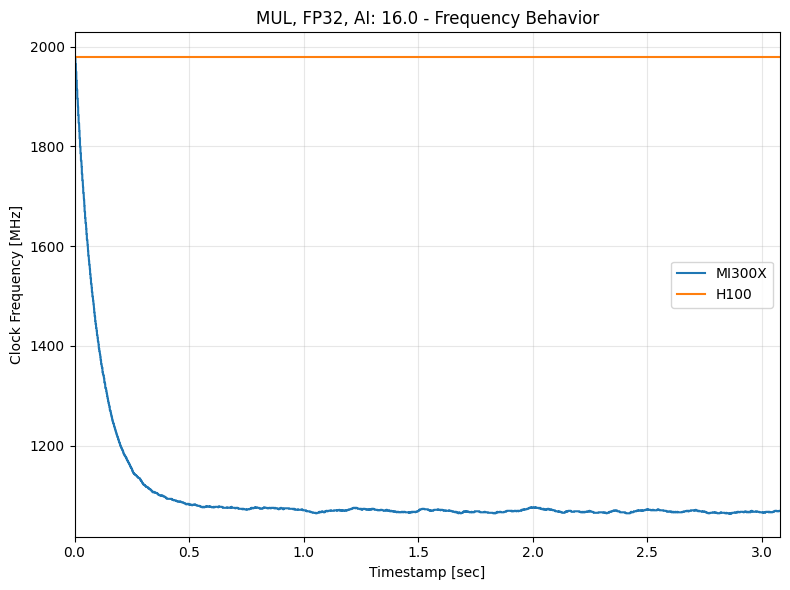

3.833
2.681498368


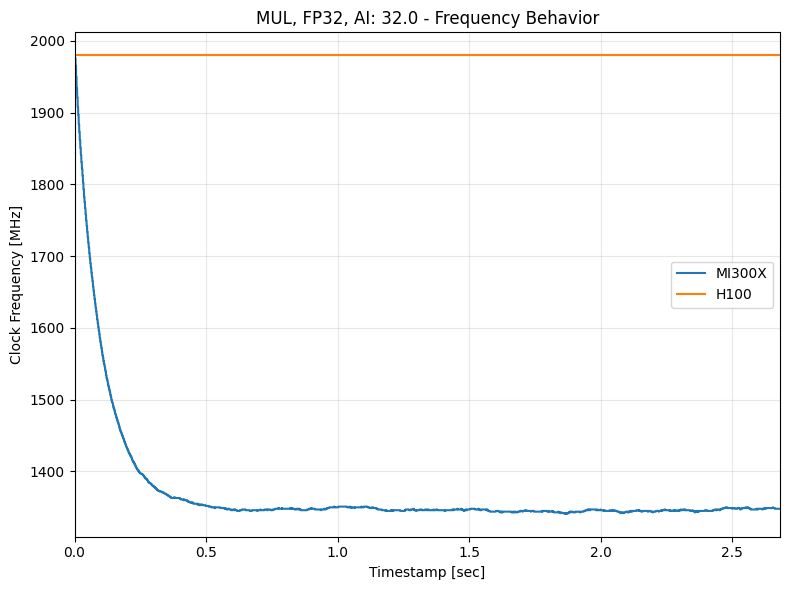

3.852
2.809816576


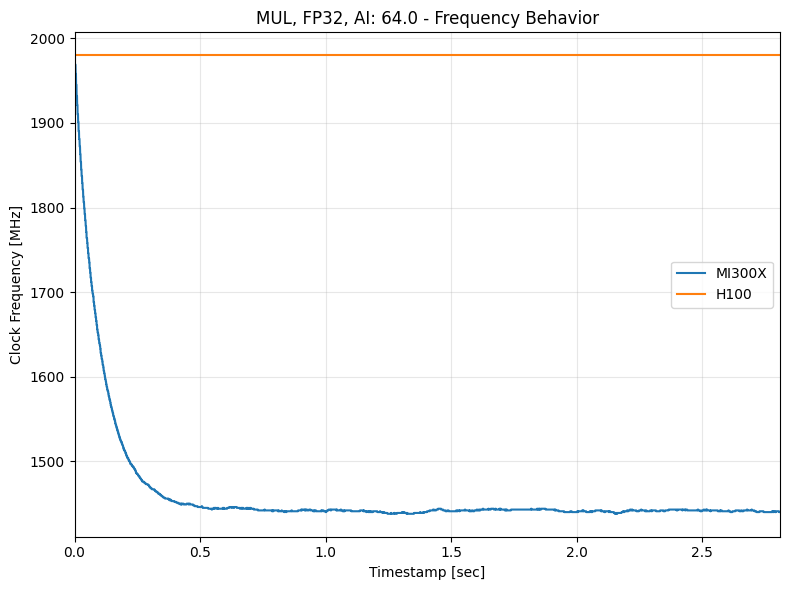

3.842
2.863542016


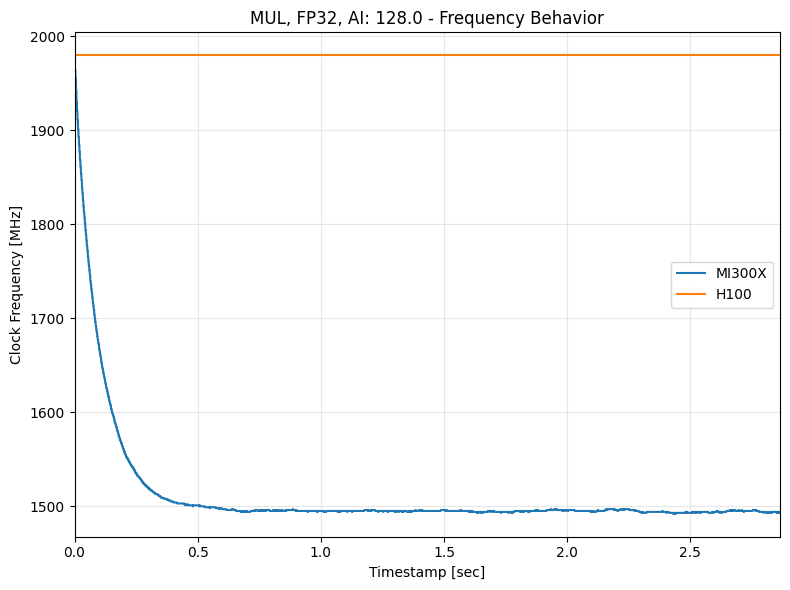

3.812
2.964547328


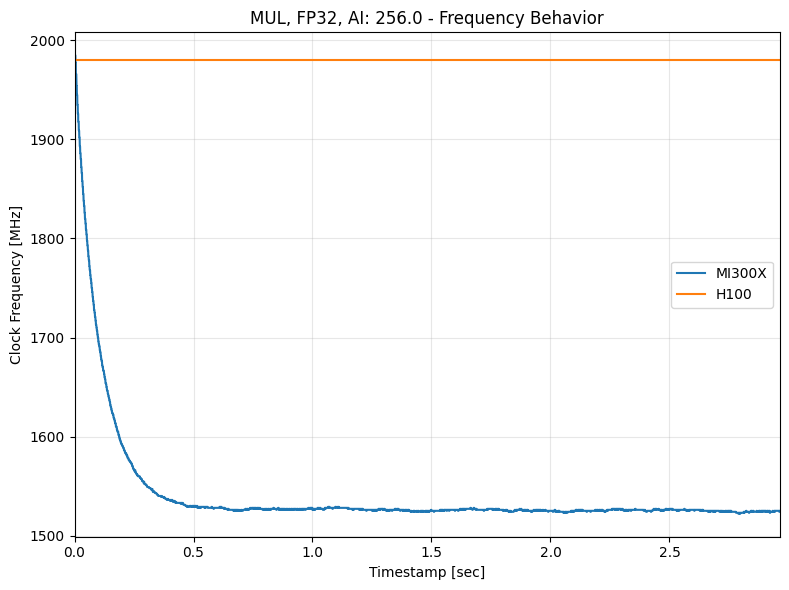

3.831
2.998604032


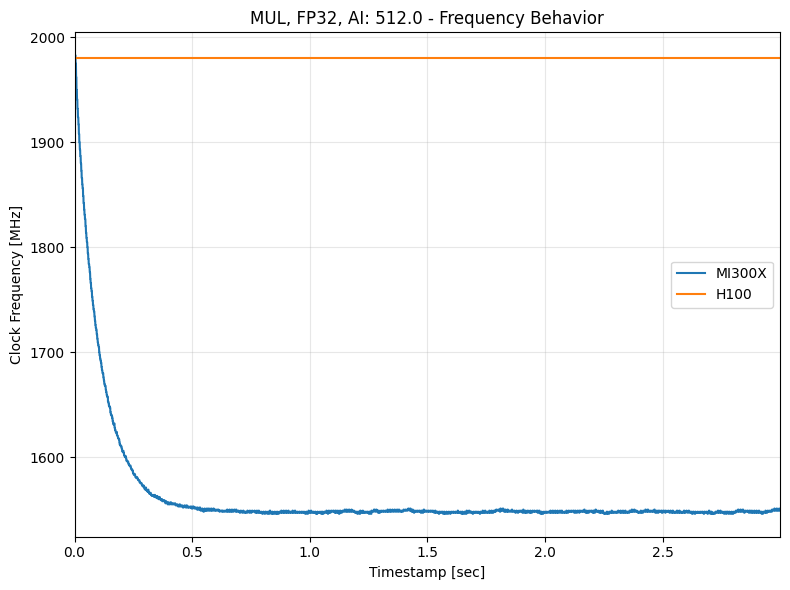

3.834
3.007555584


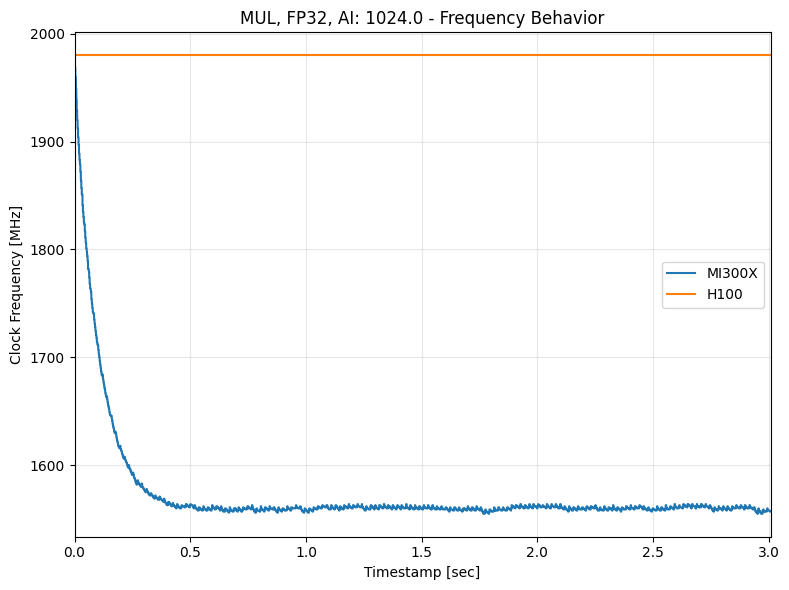

4.044
3.0157824


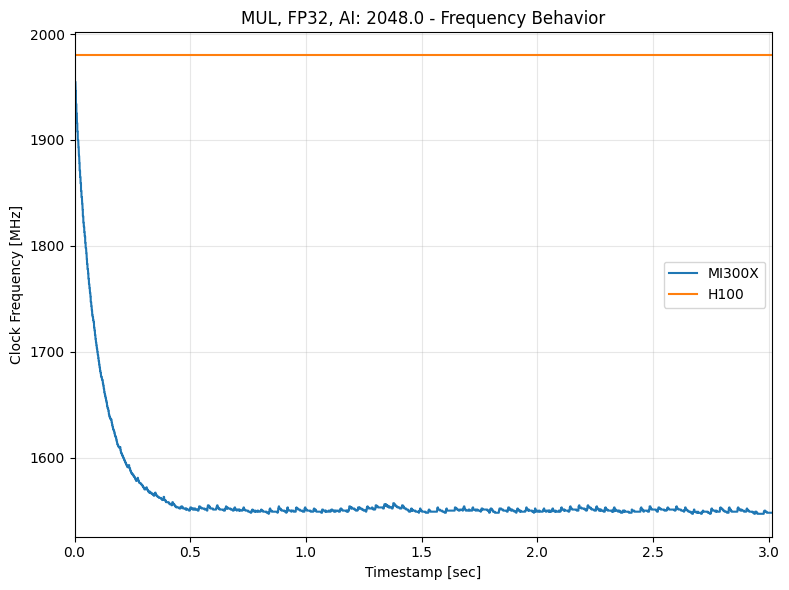

3.995
2.964740608


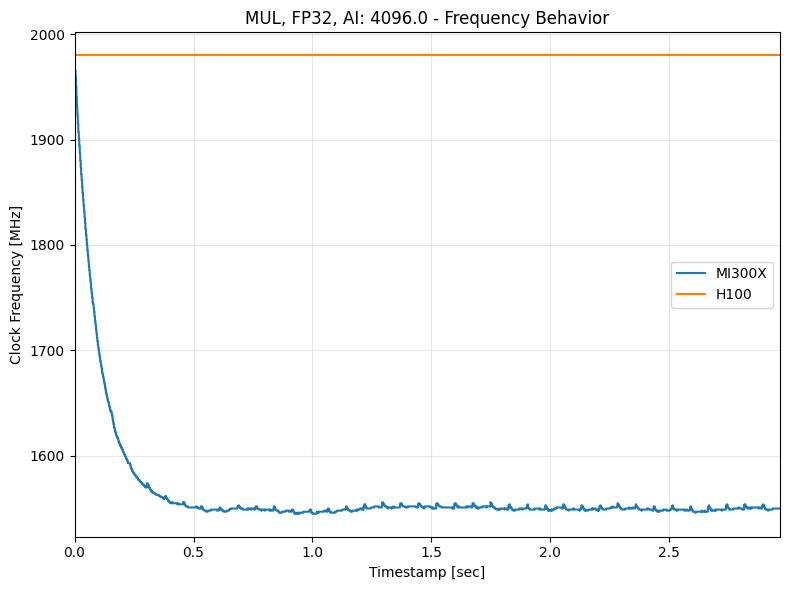

4.254
3.010190592


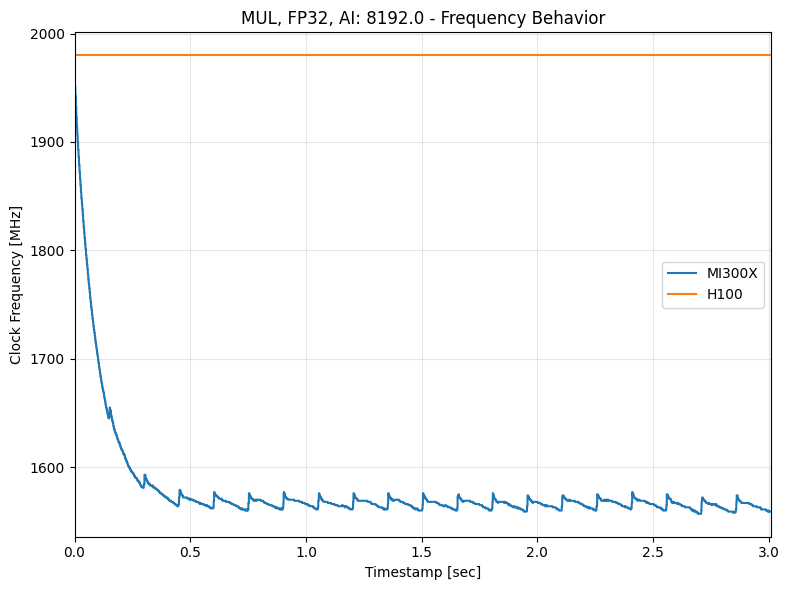

3.883
3.168067072


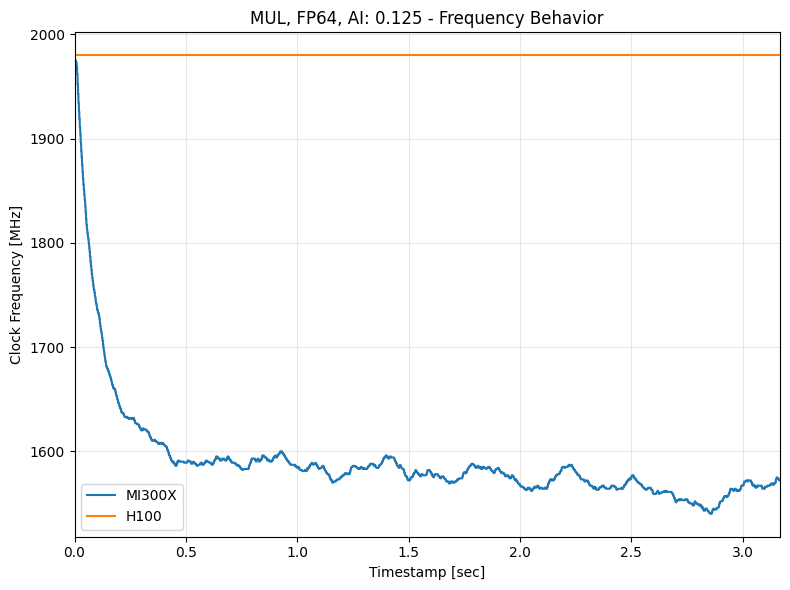

3.884
3.220172544


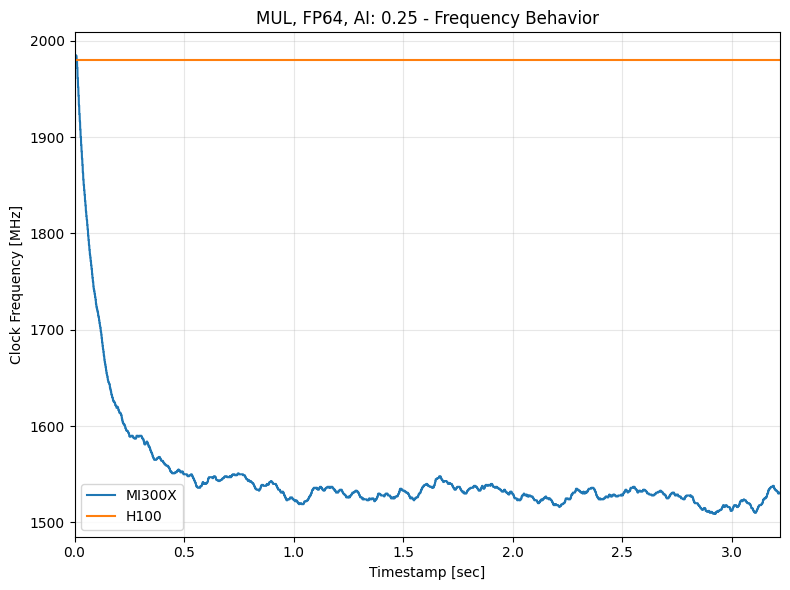

3.896
3.199094528


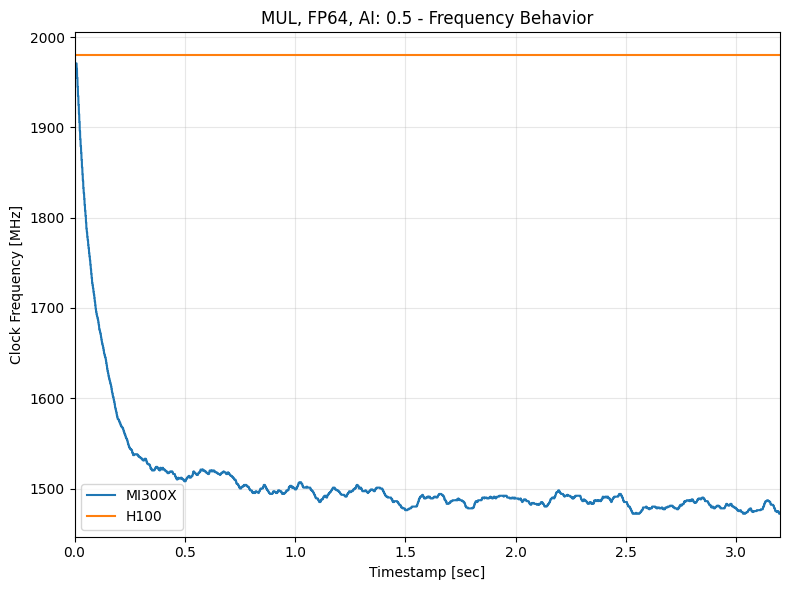

3.913
3.174746368


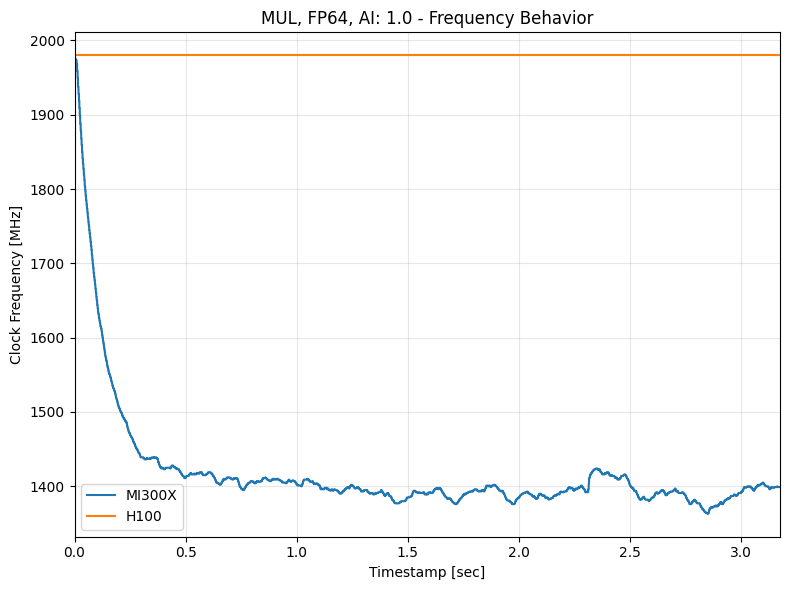

3.948
2.87938048


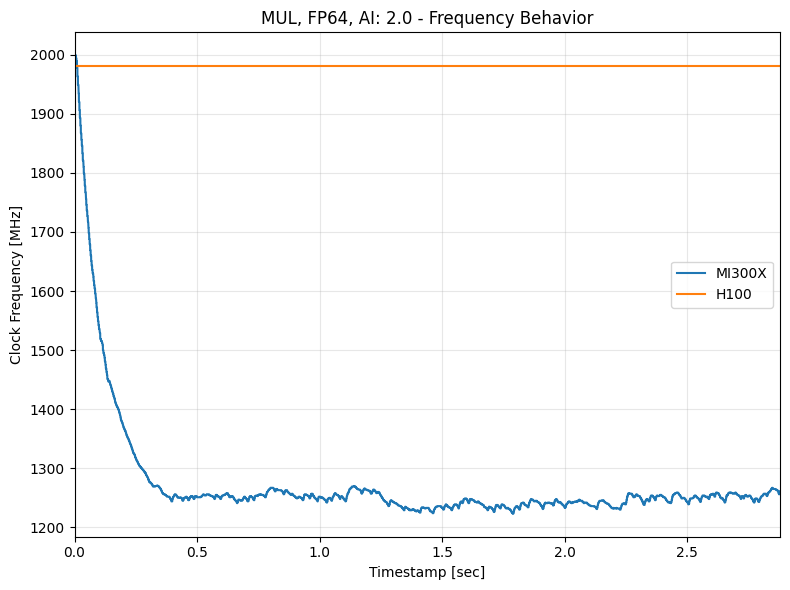

3.953
3.214015488


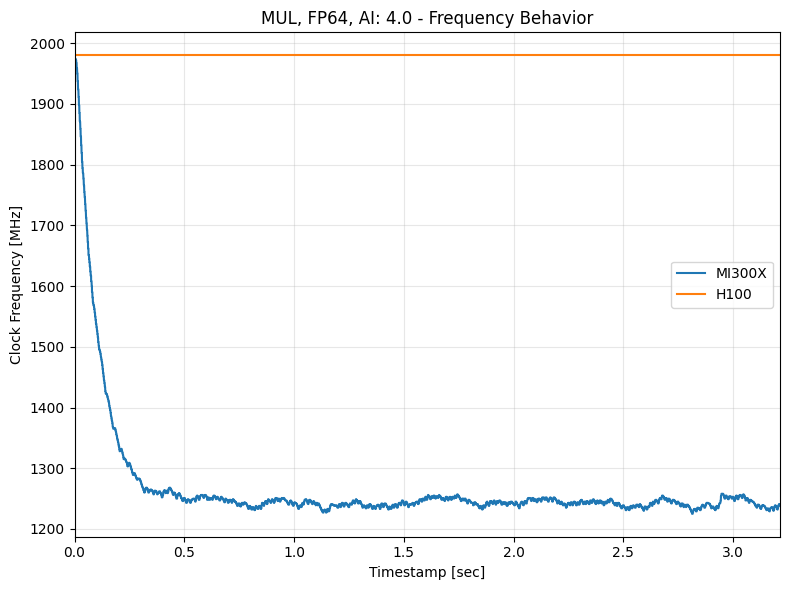

3.837
2.364320256


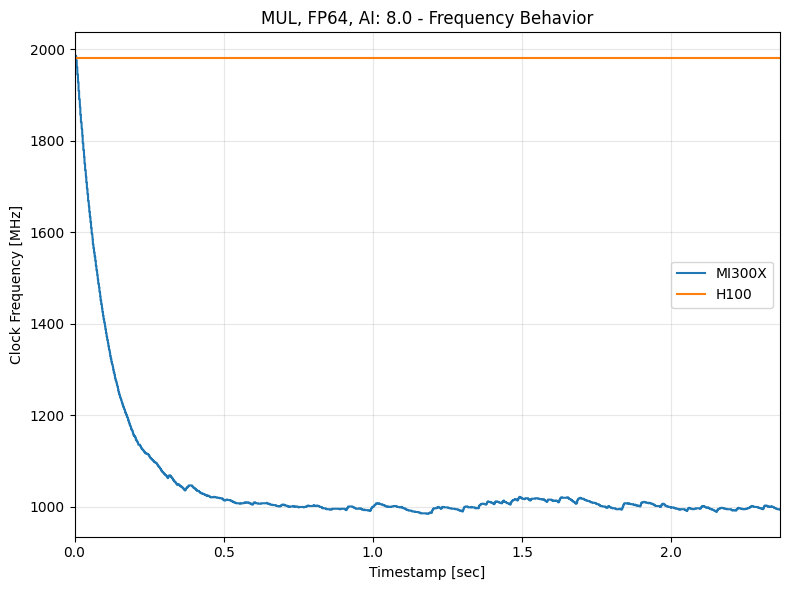

3.83
1.89673088


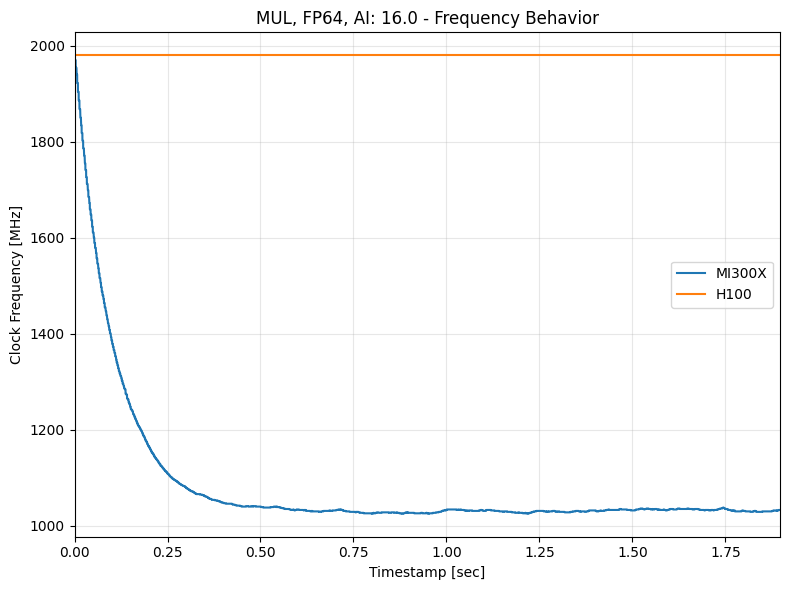

3.811
1.708142592


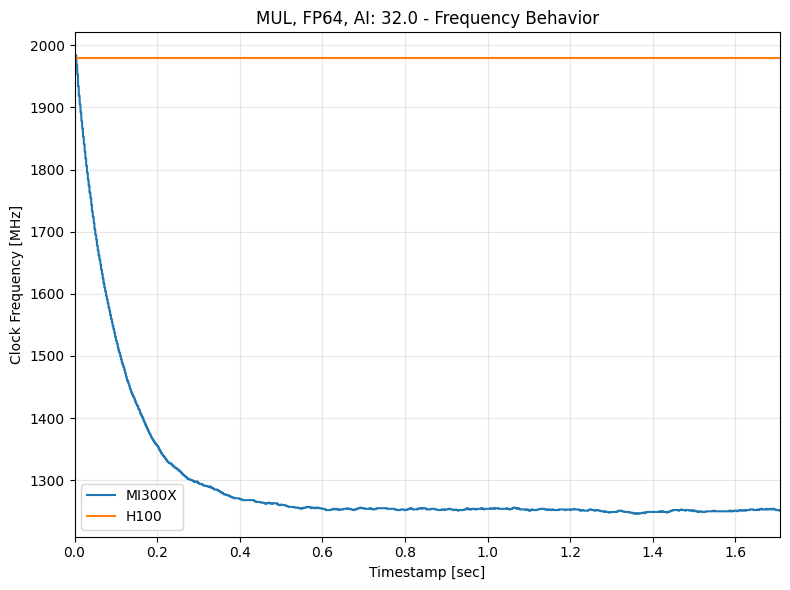

3.846
1.64845824


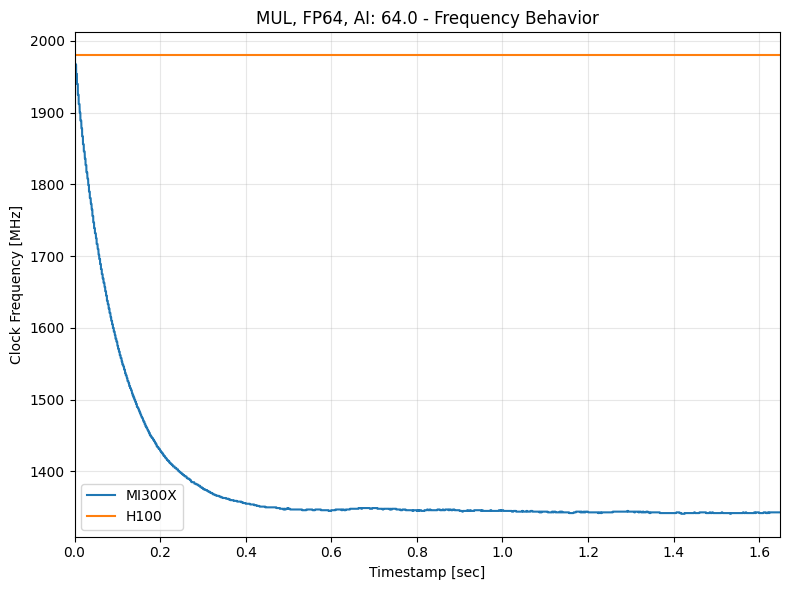

3.843
1.667150592


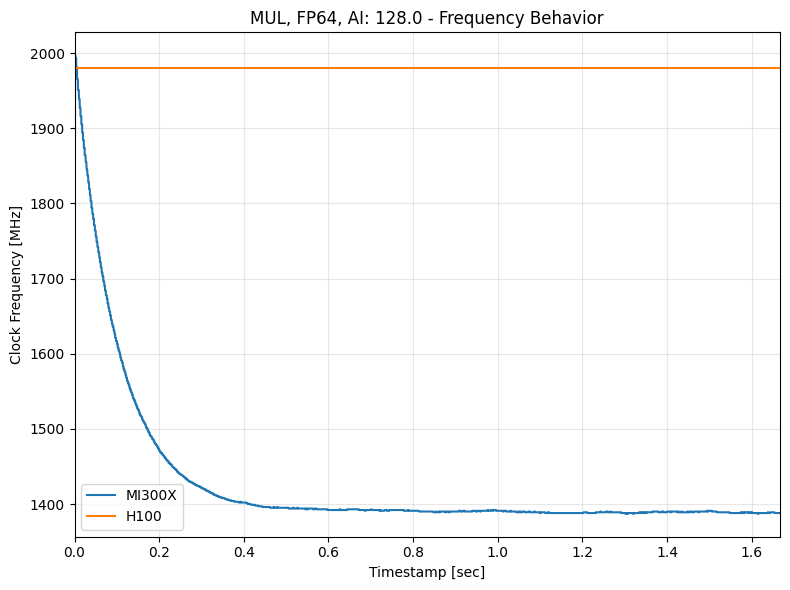

3.43
1.668276992


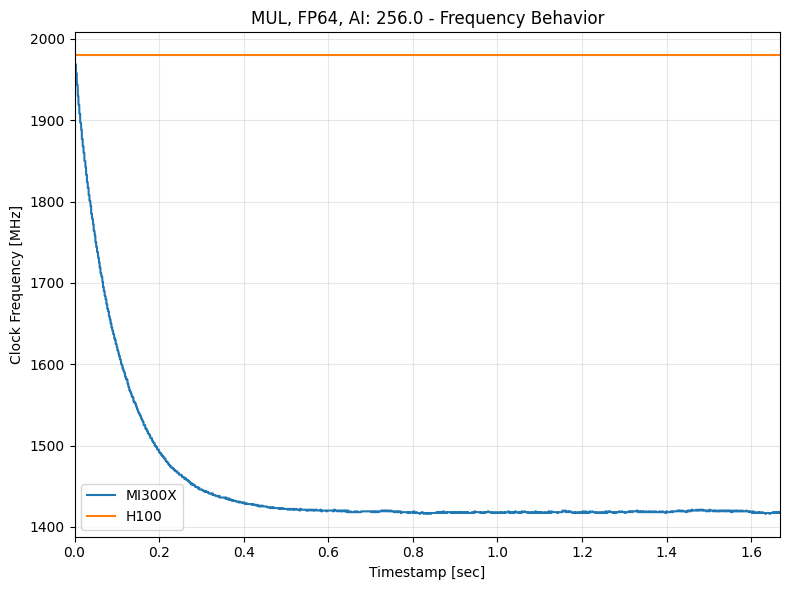

3.475
1.6612928


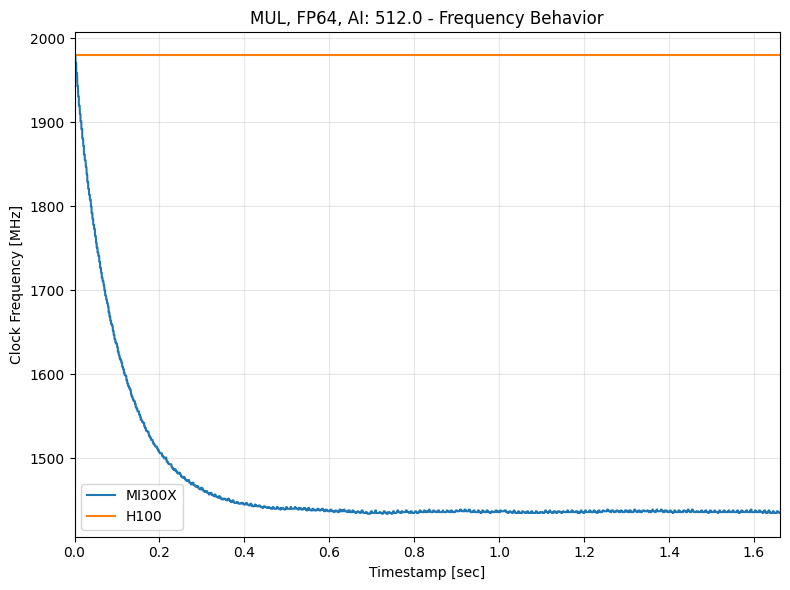

3.609
1.740824064


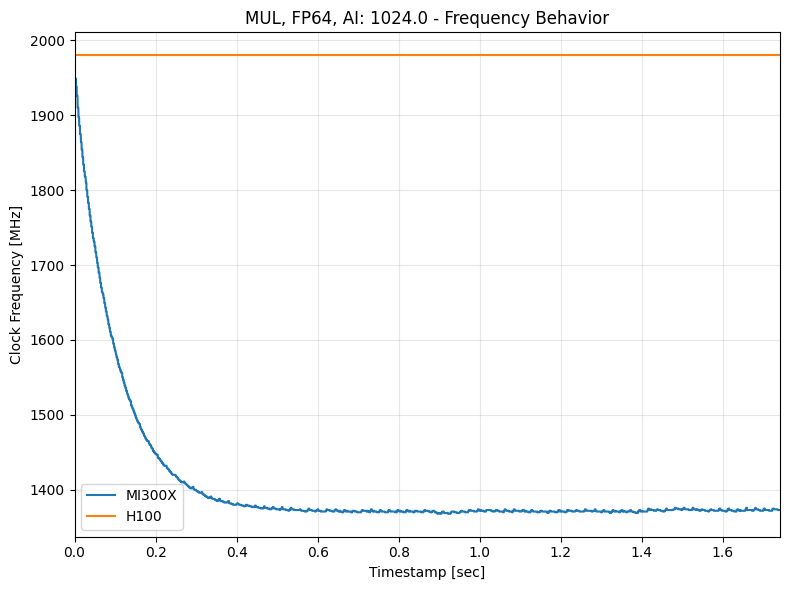

3.785
1.719654912


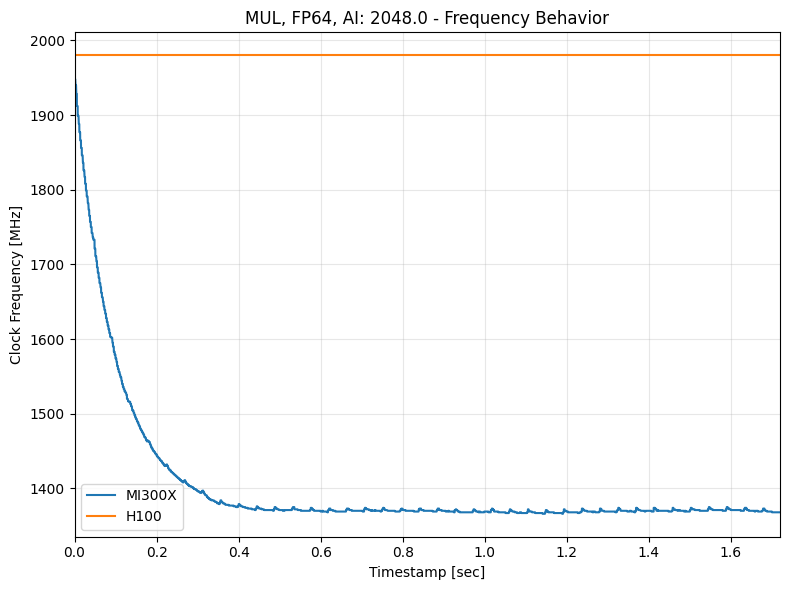

4.015
1.664958208


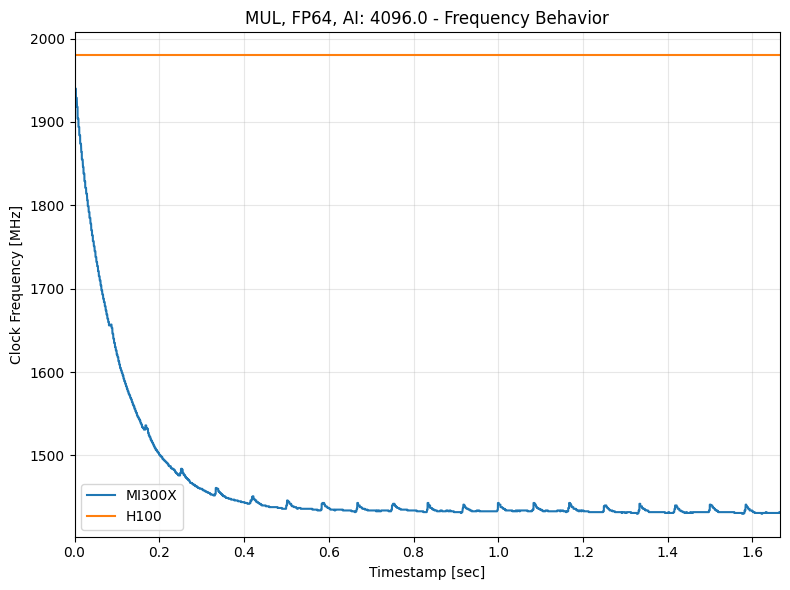

3.888
3.187514368


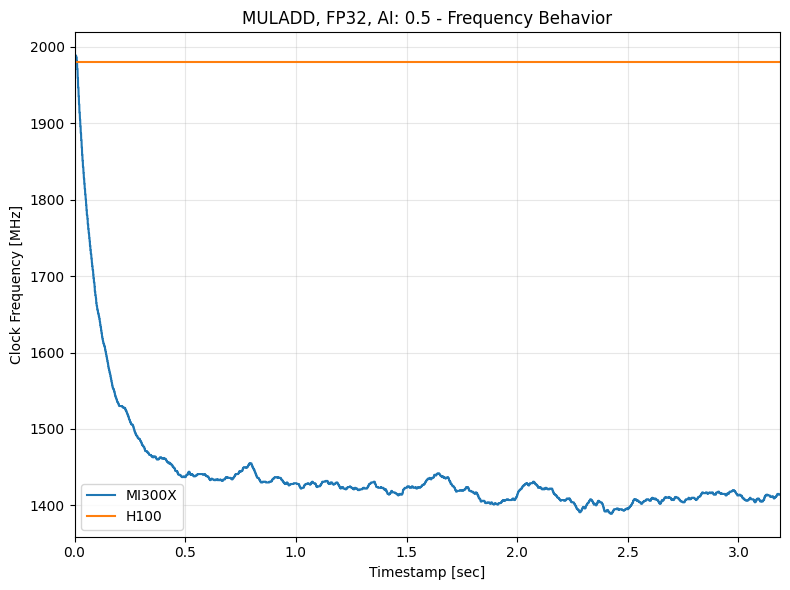

3.888
3.243272448


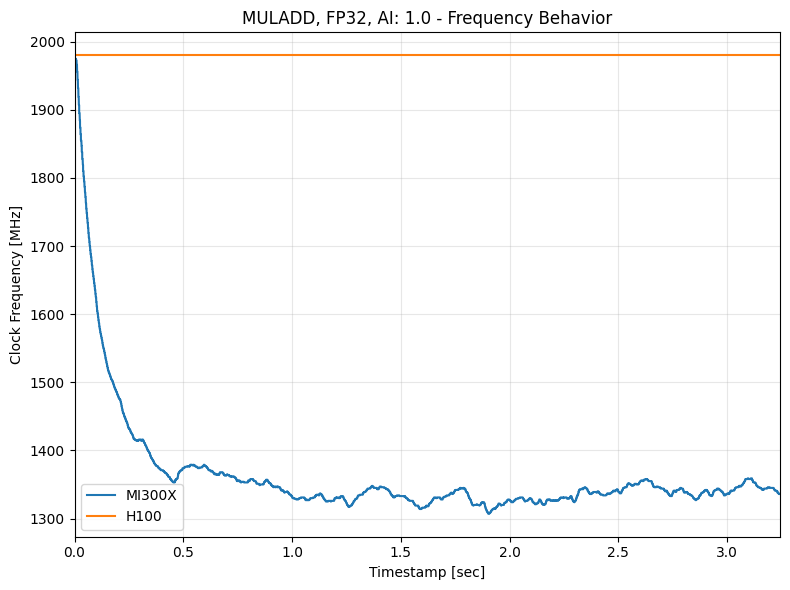

3.885
3.252132352


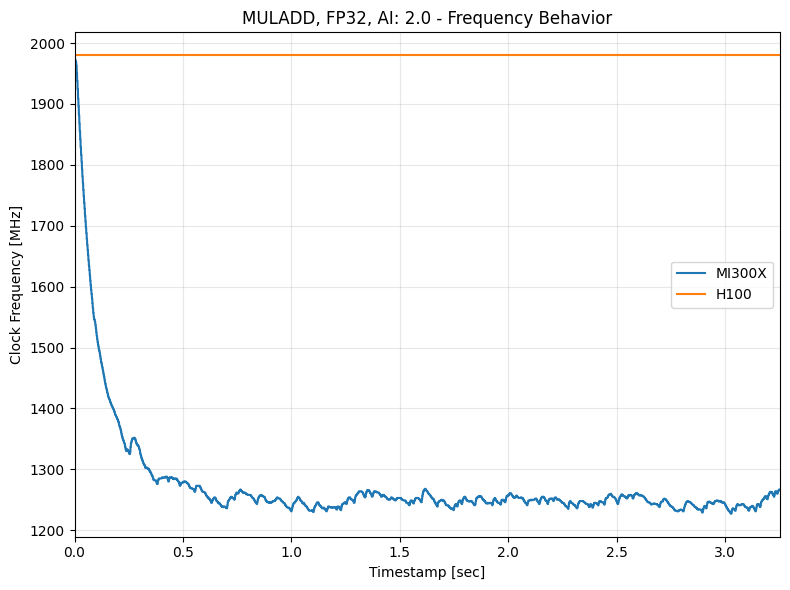

3.883
3.324147456


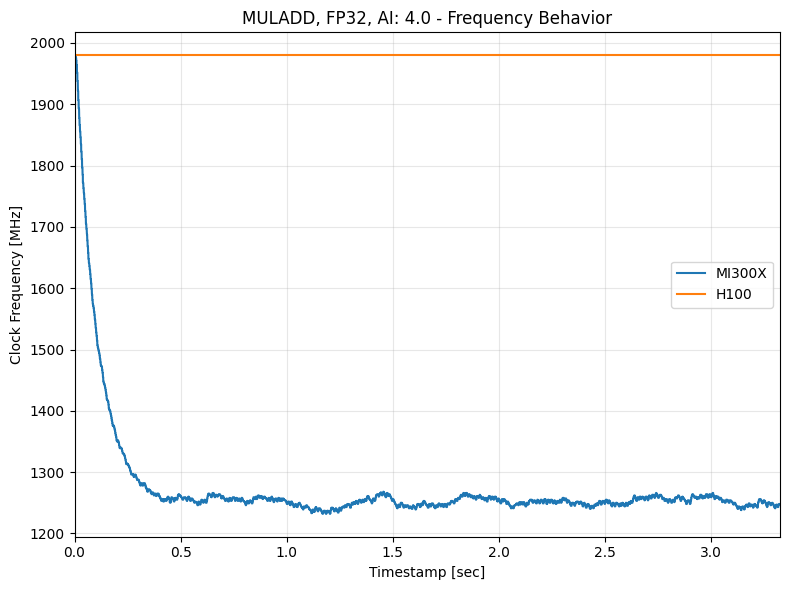

3.91
3.249470464


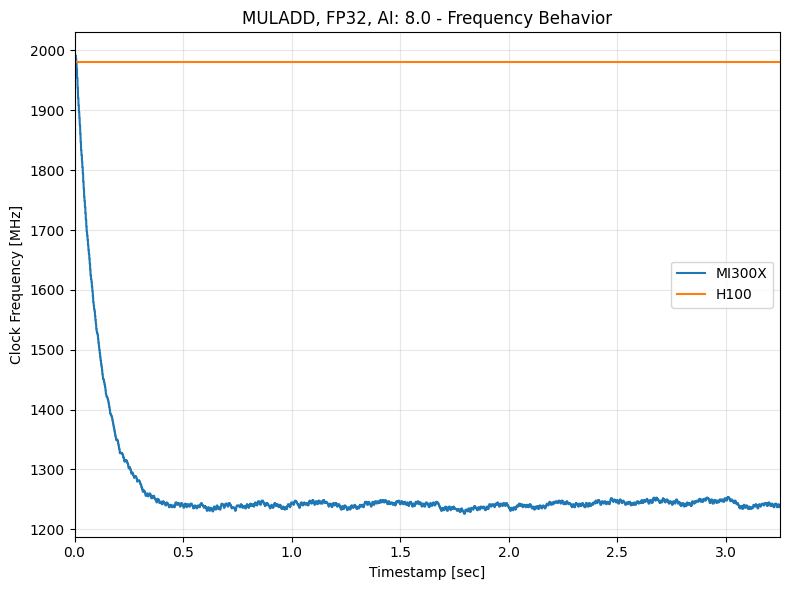

3.954
3.387306752


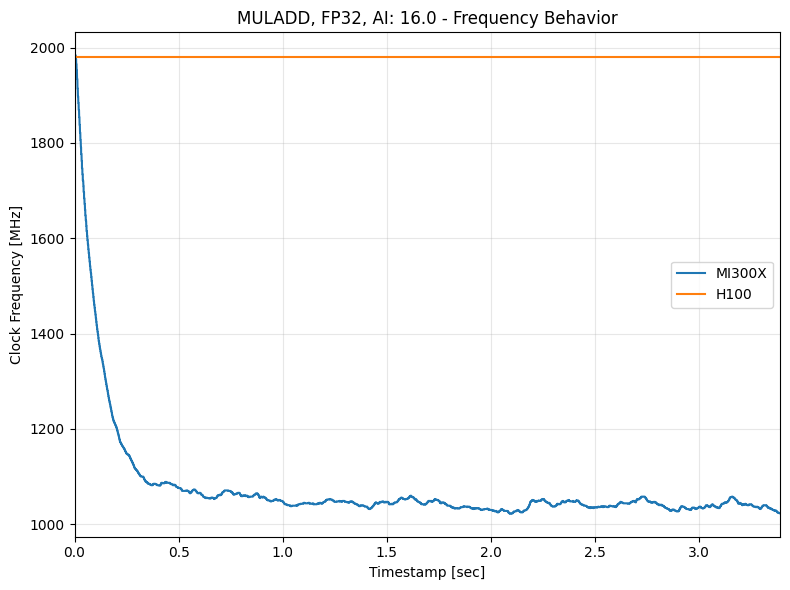

5.111
3.123134464


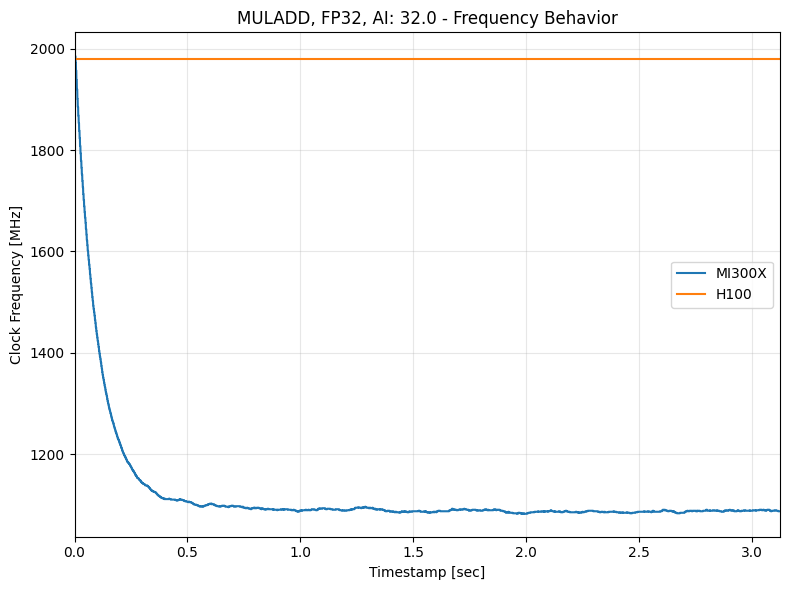

3.833
2.708967168


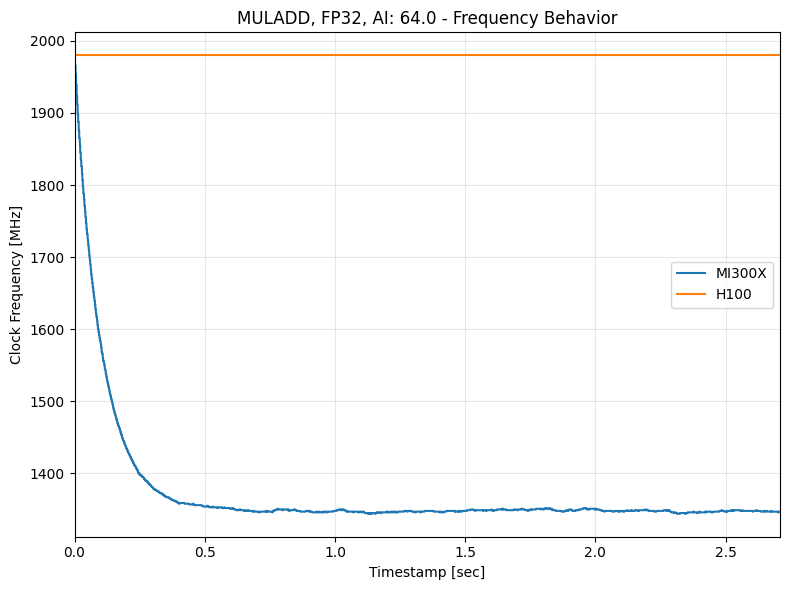

4.353
2.840212224


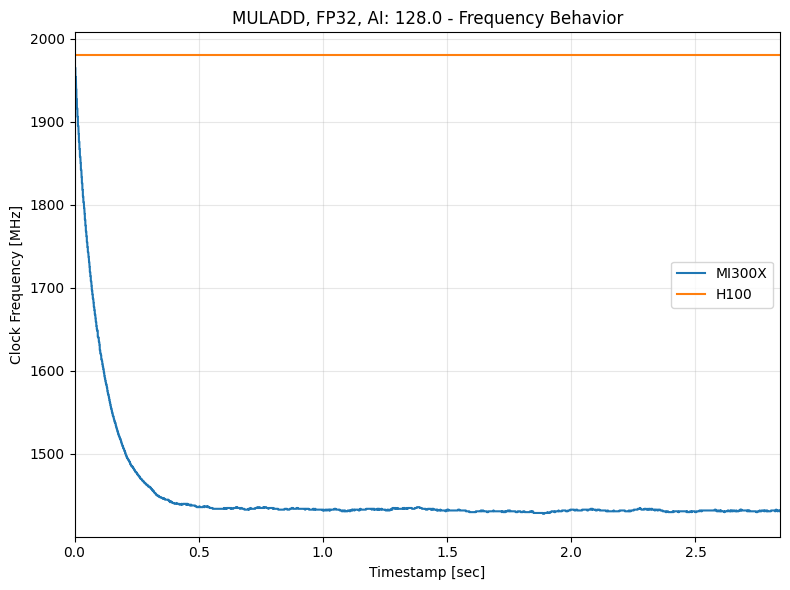

3.891
2.87401856


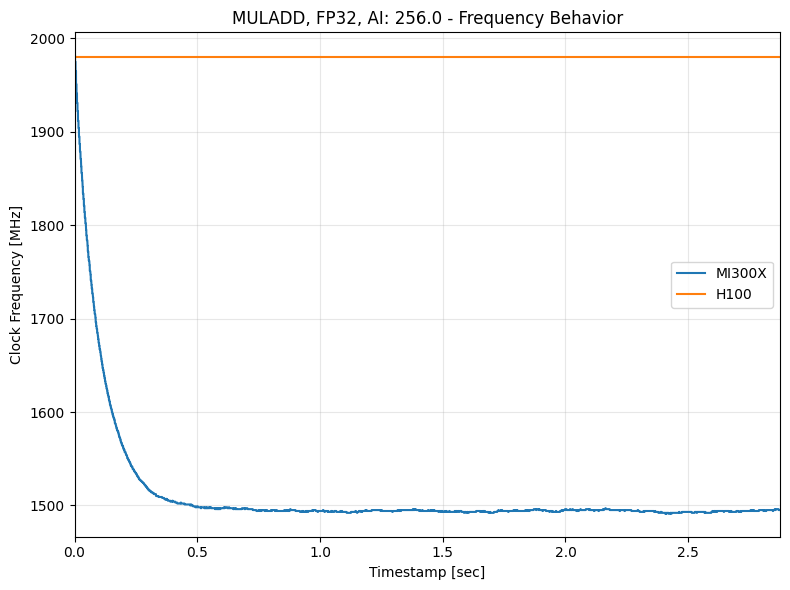

3.836
2.984964608


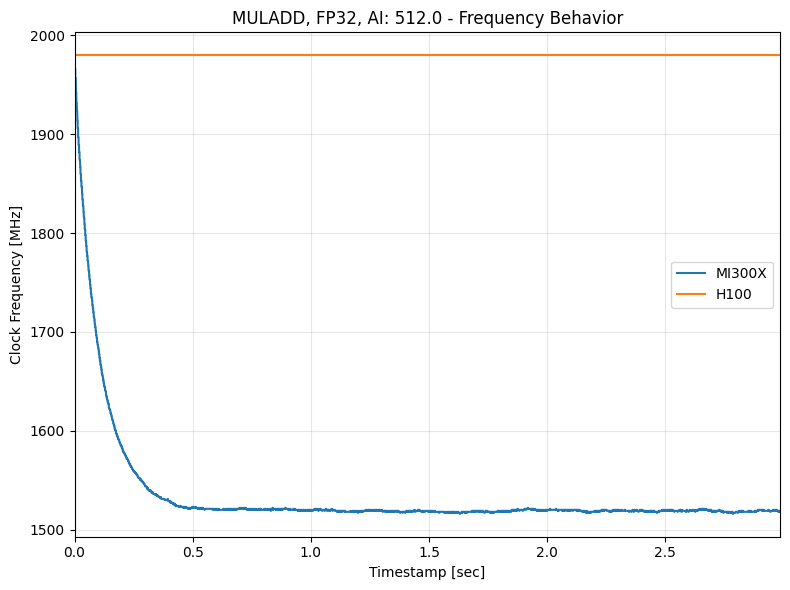

3.844
3.017981184


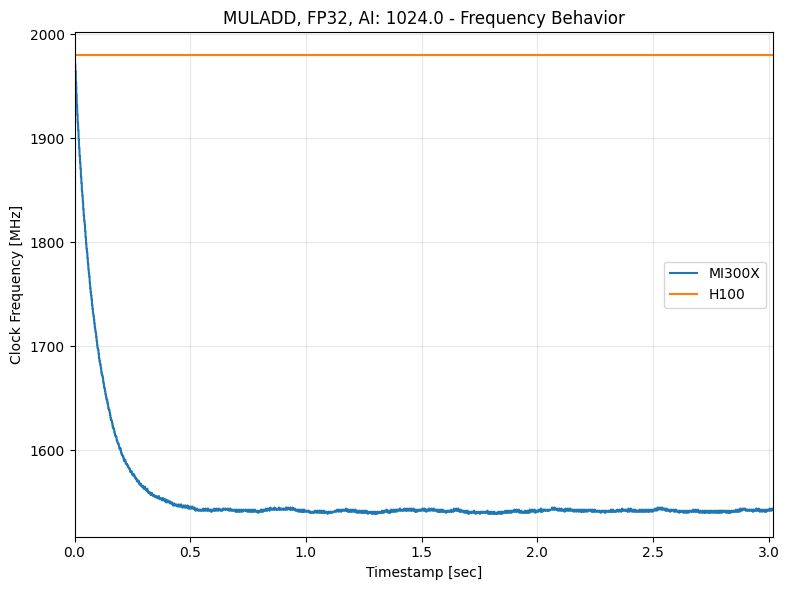

3.851
3.01913088


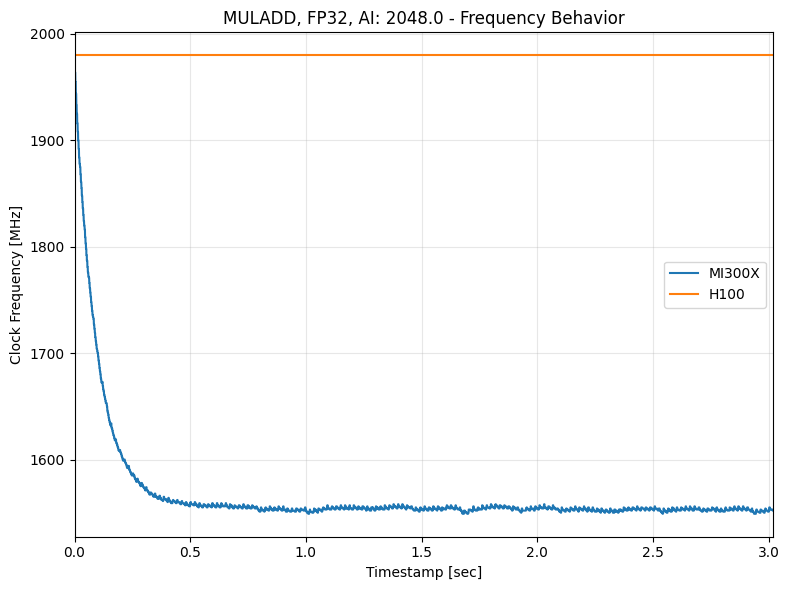

3.922
3.036676608


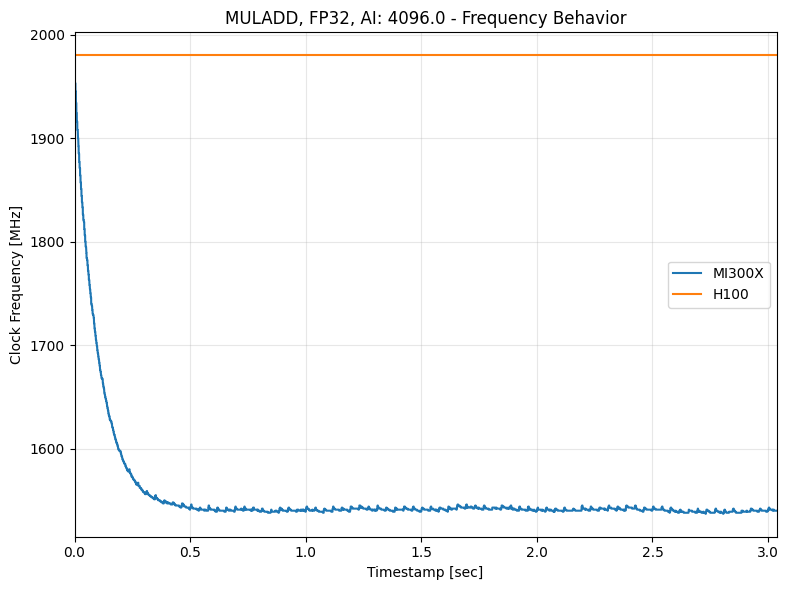

3.996
2.98344832


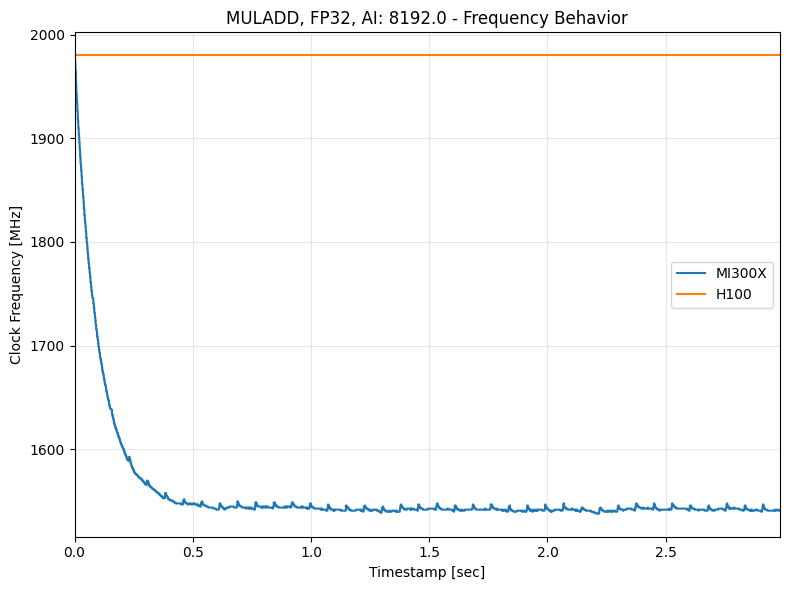

4.215
3.03070336


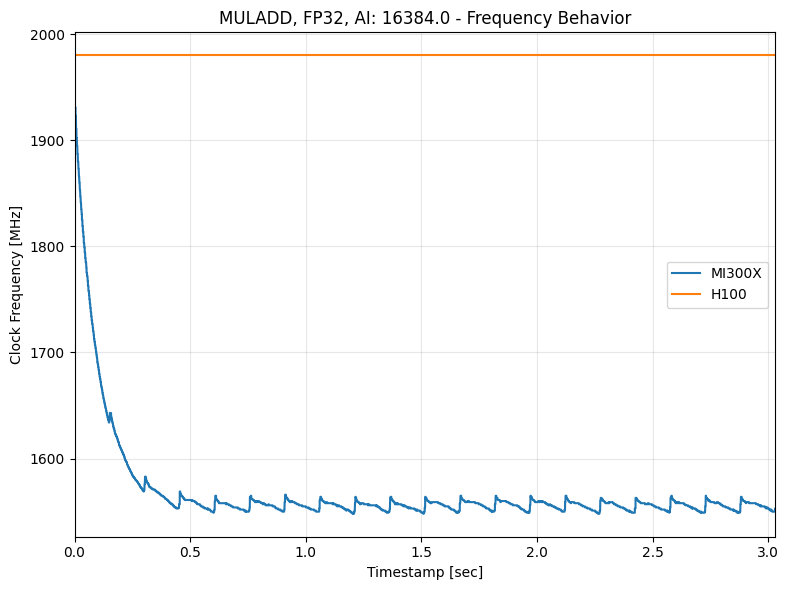

3.894
3.171188224


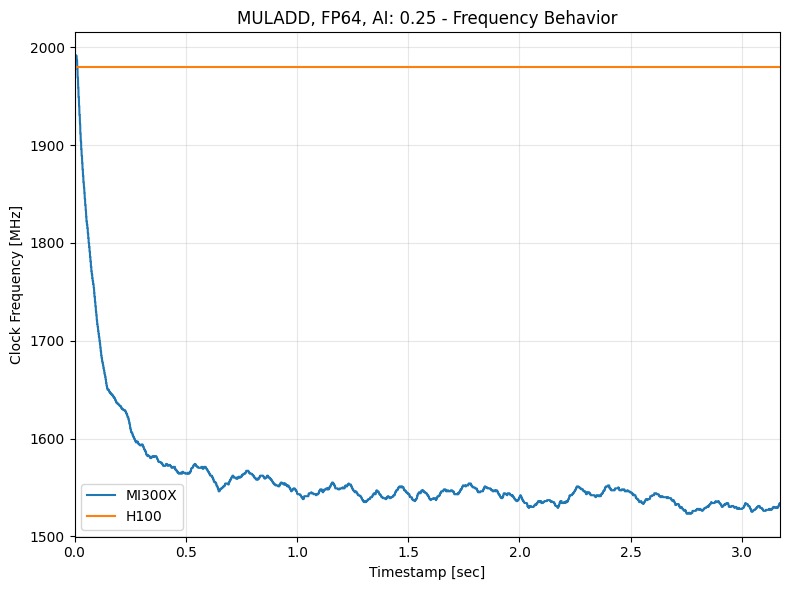

3.883
3.219841024


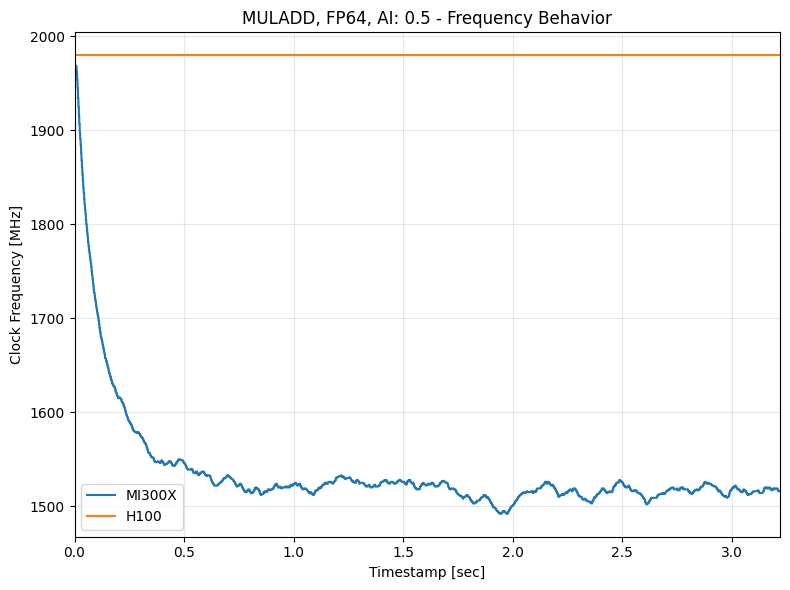

3.908
3.203070208


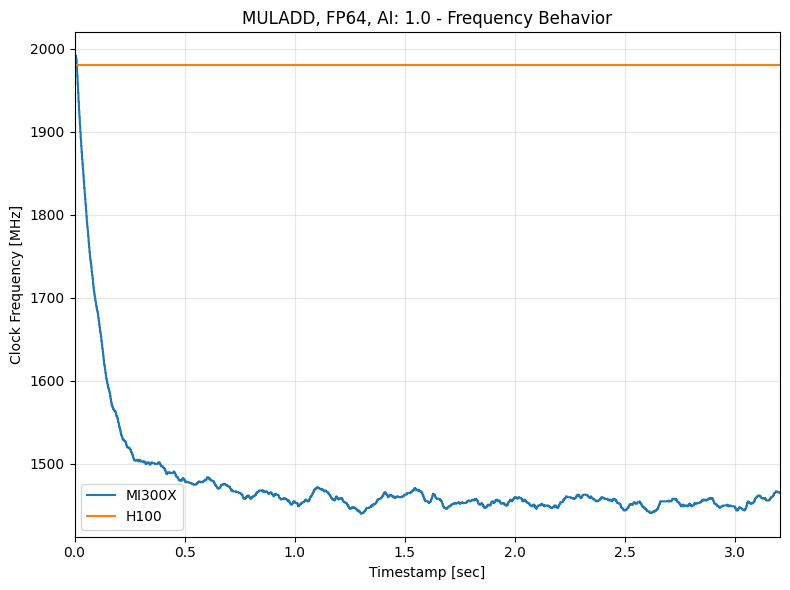

3.904
3.201579776


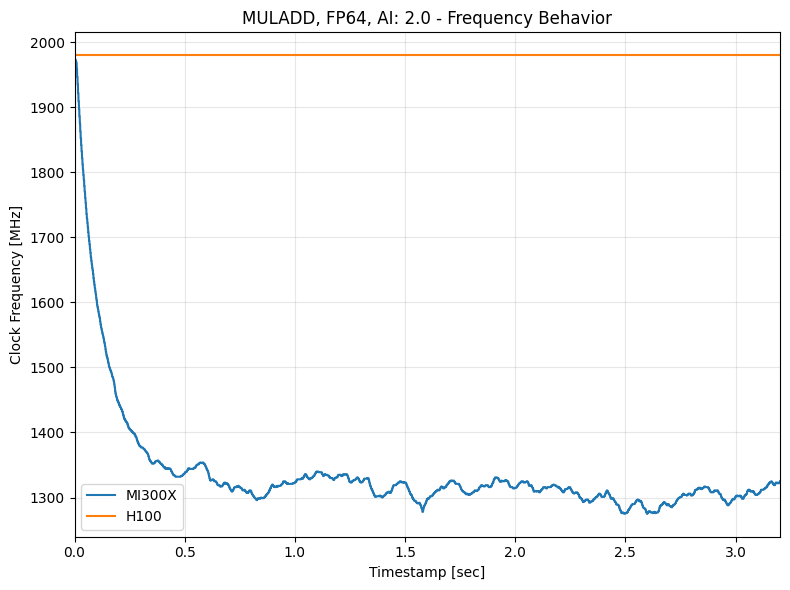

3.903
3.053536768


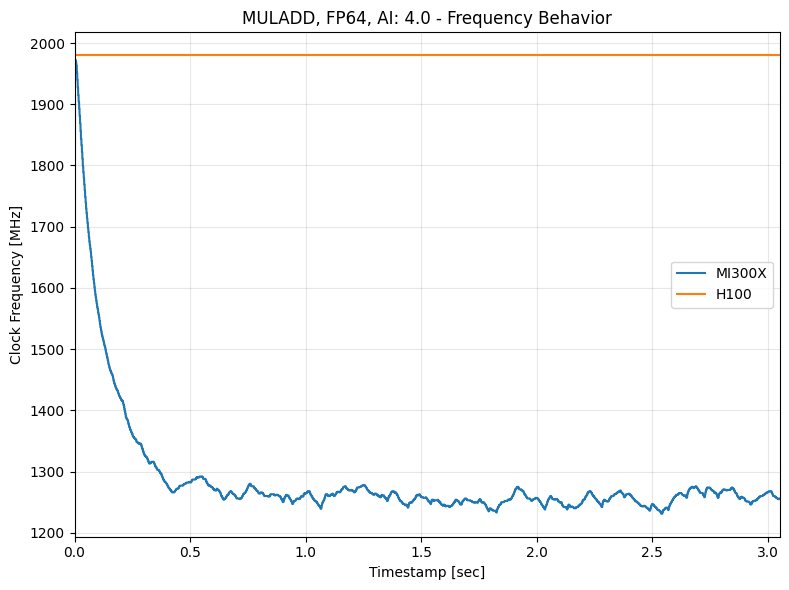

3.939
3.268304384


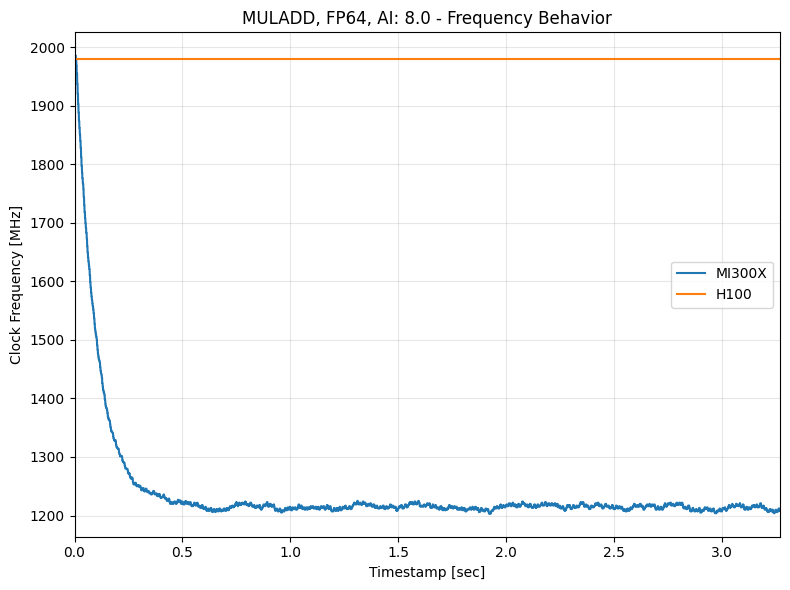

5.128
2.812485888


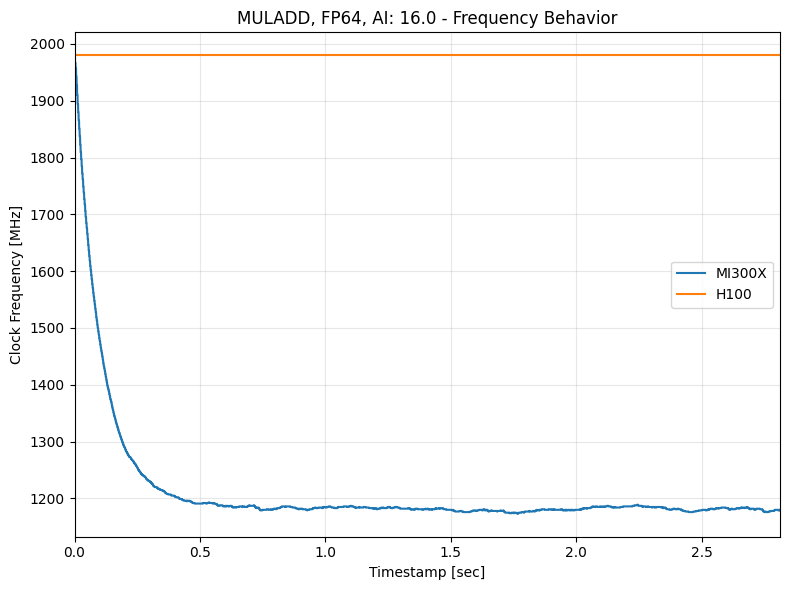

3.802
2.477387264


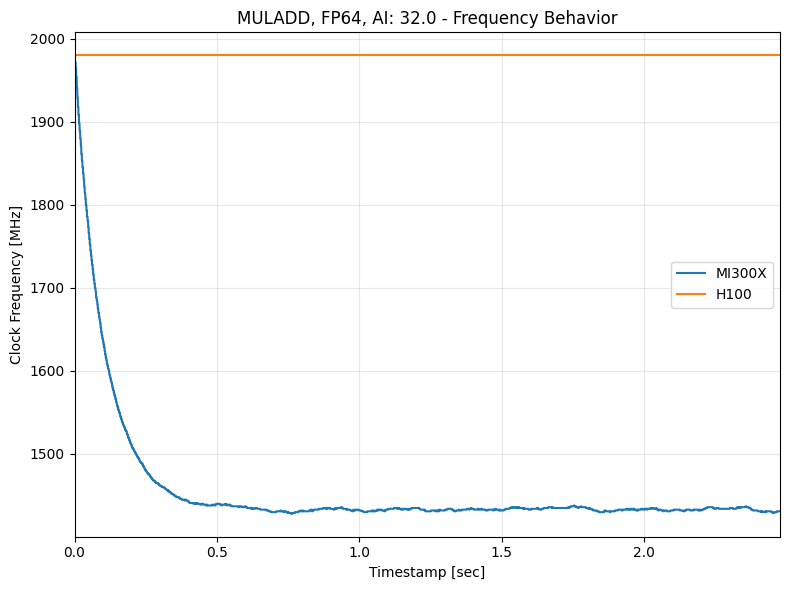

4.595
2.598538496


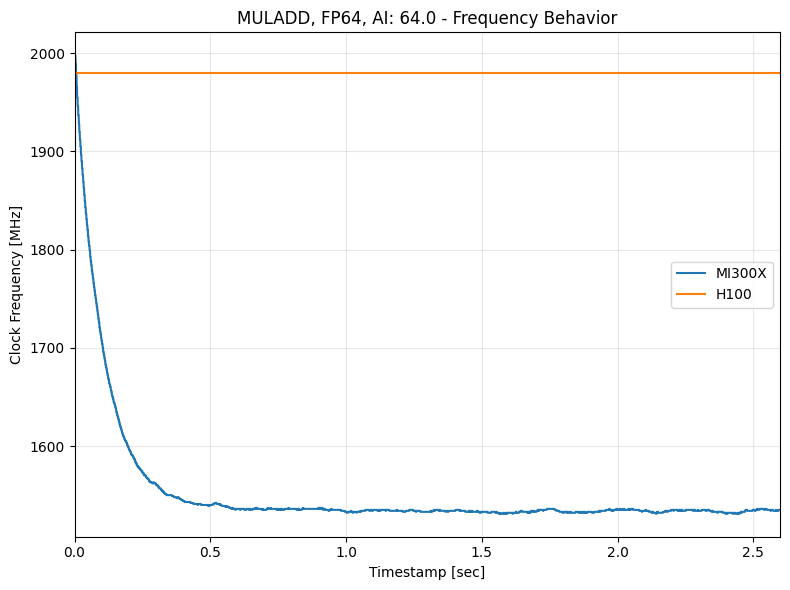

3.902
2.63521024


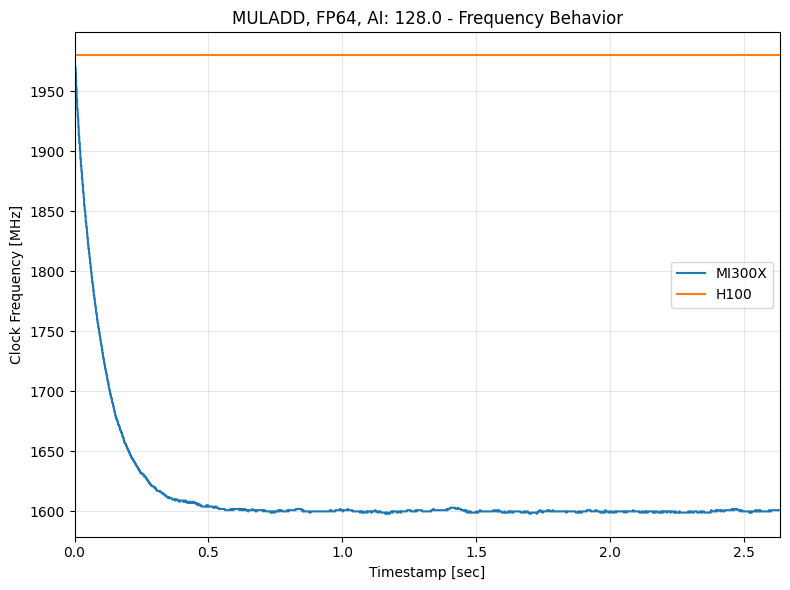

3.84
2.72395008


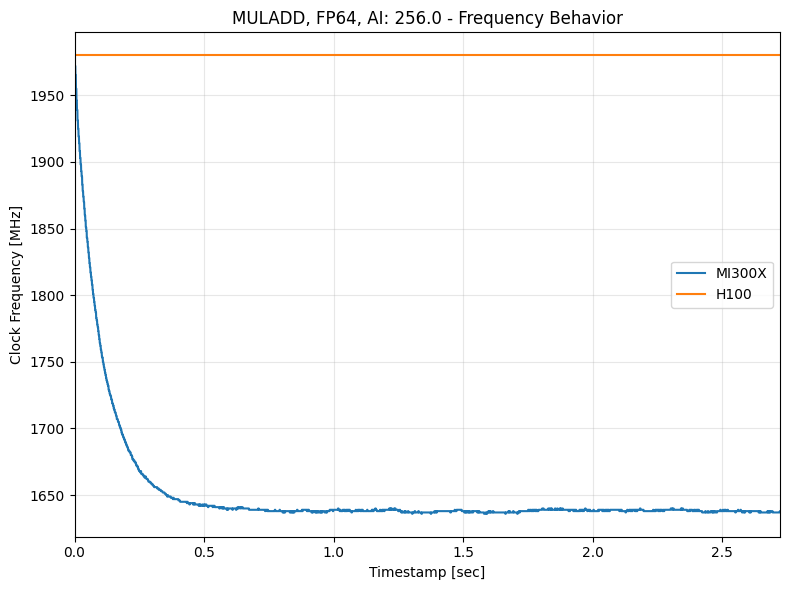

3.468
2.761233408


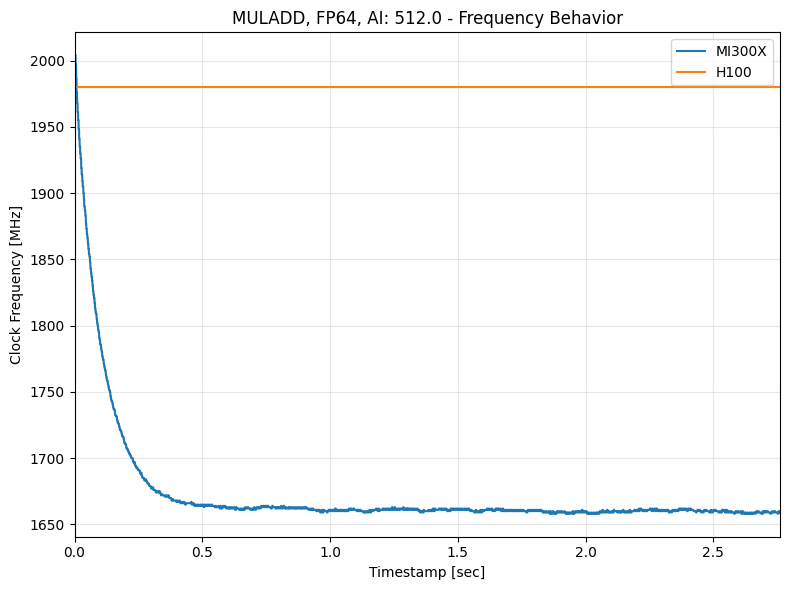

3.509
2.803363072


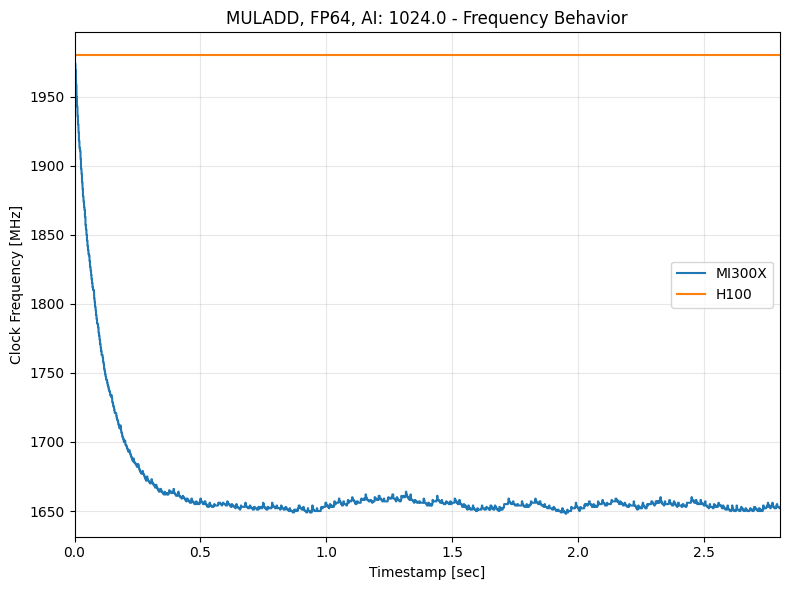

3.641
2.679300864


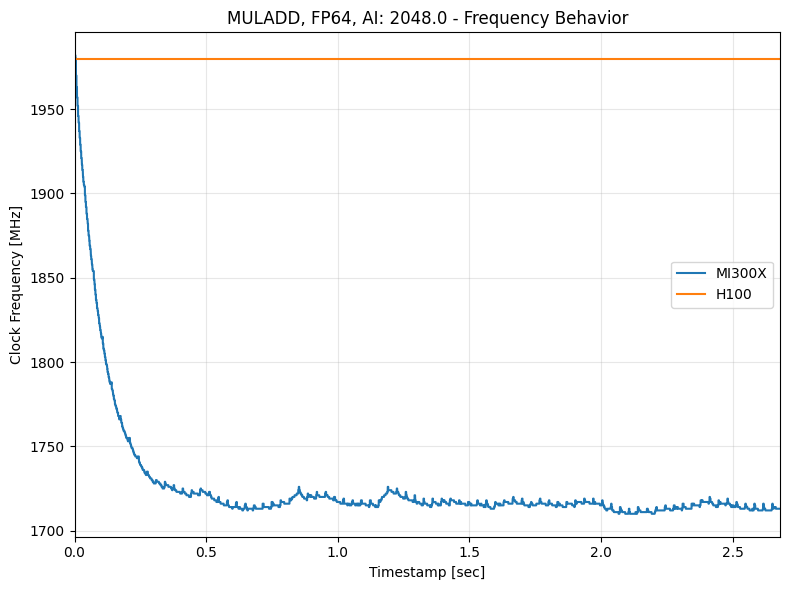

3.75
2.63771264


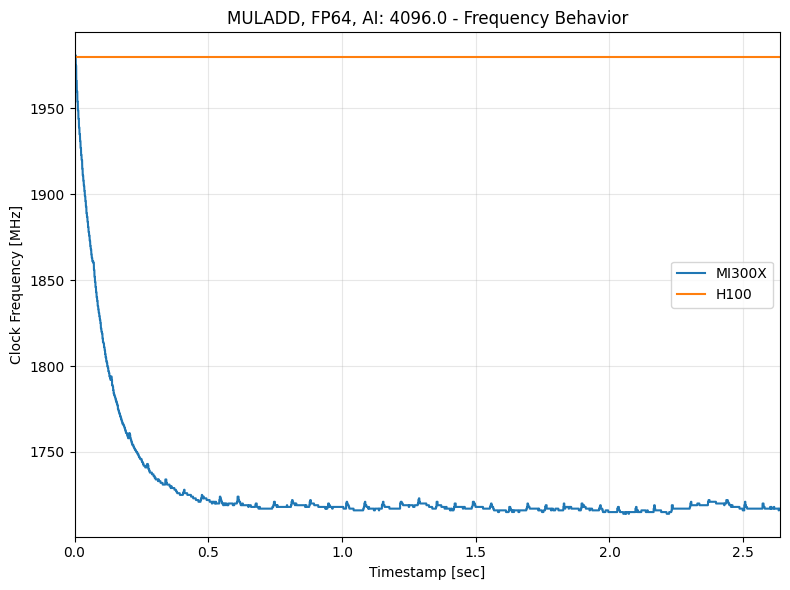

4.3
2.818115072


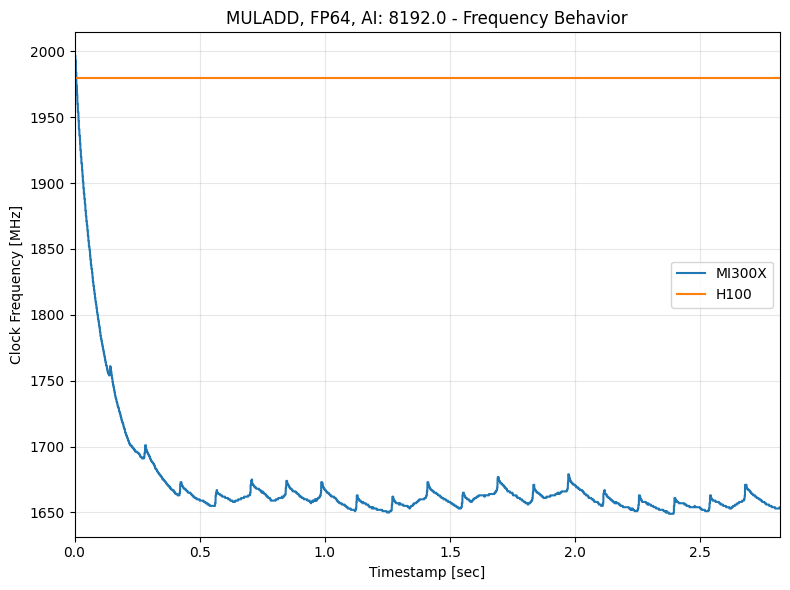

4.867
3.890591232


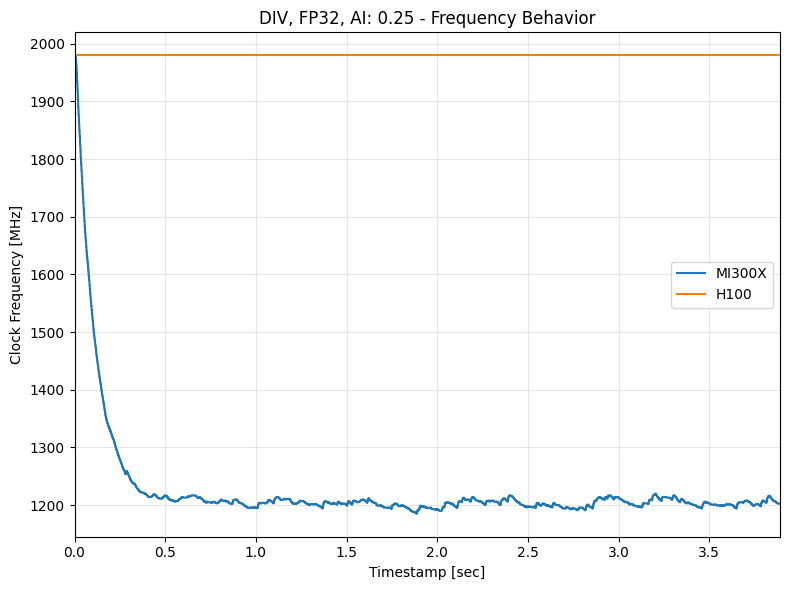

5.11
4.430664448


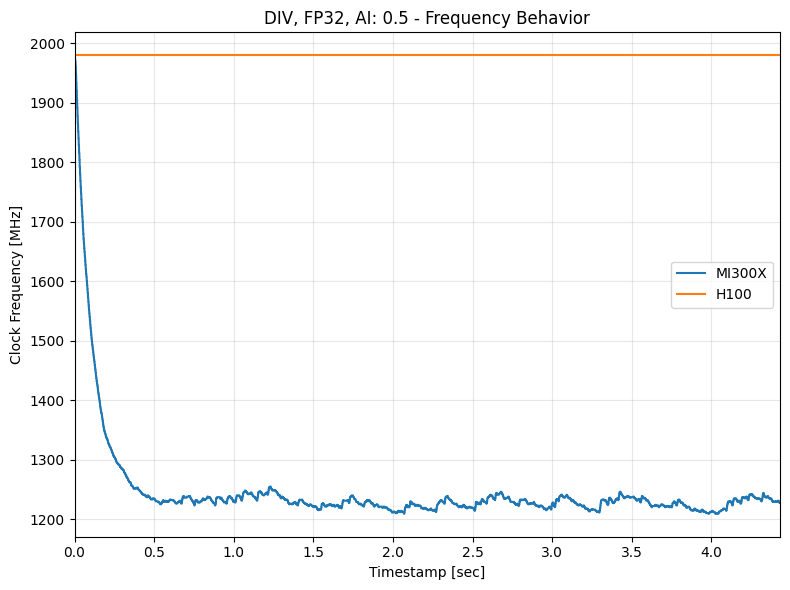

5.117
5.93163008


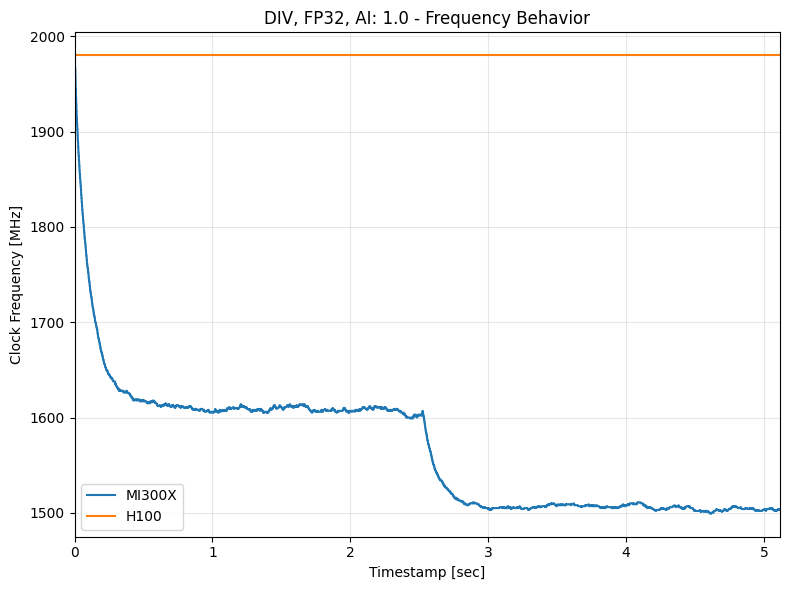

5.112
10.046916608


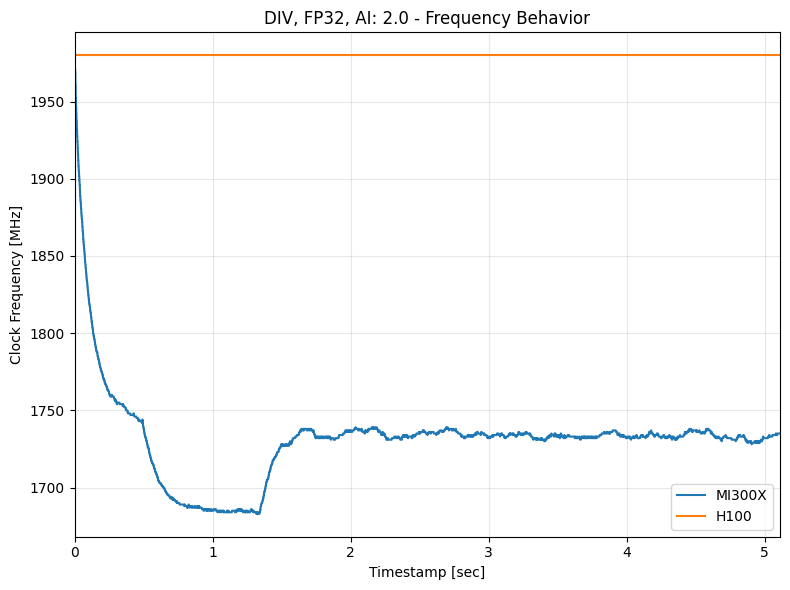

5.111
16.924051712


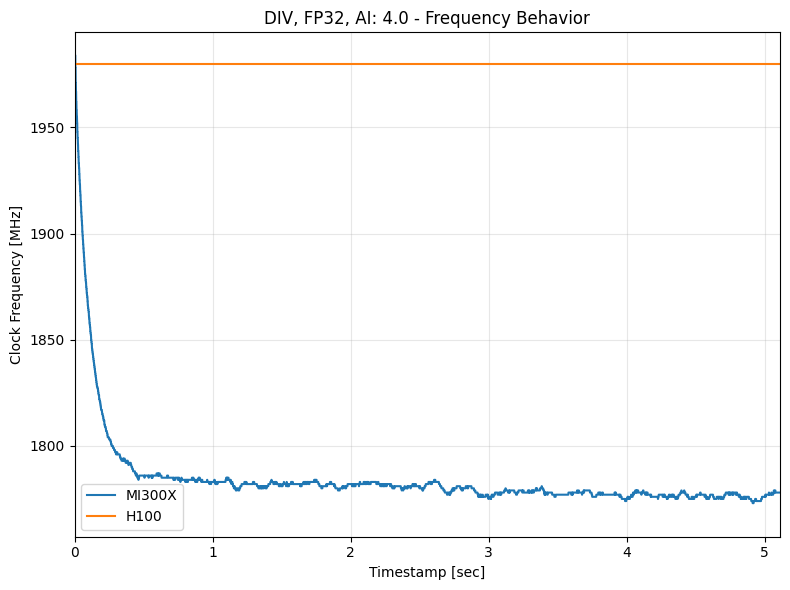

5.109
32.73755136


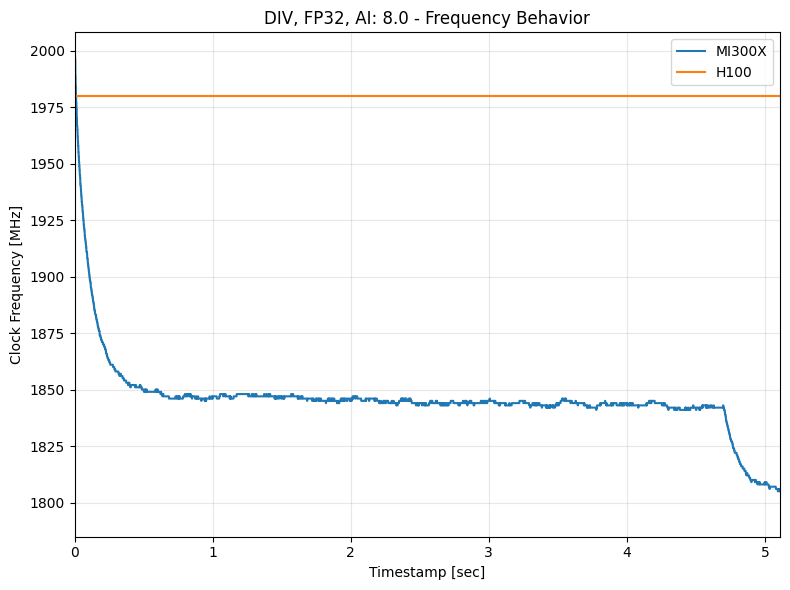

5.111
44.021439232


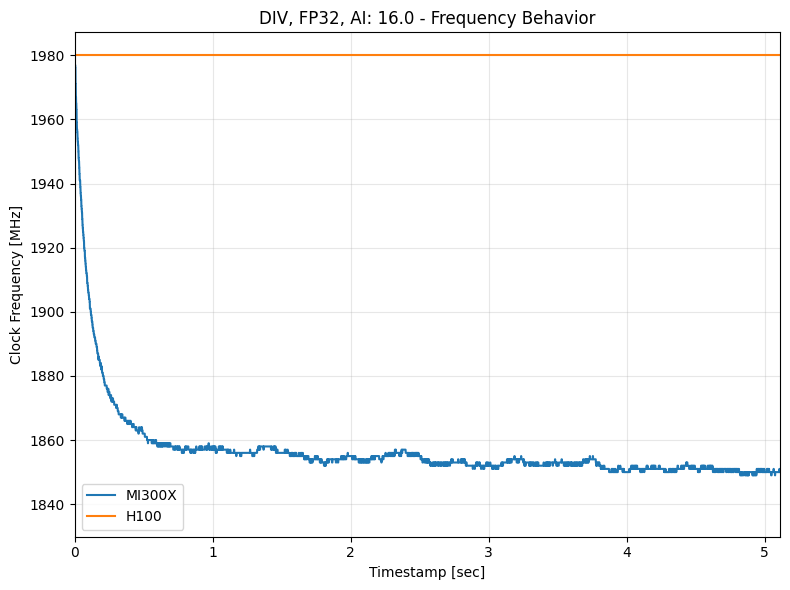

5.108
49.612039936


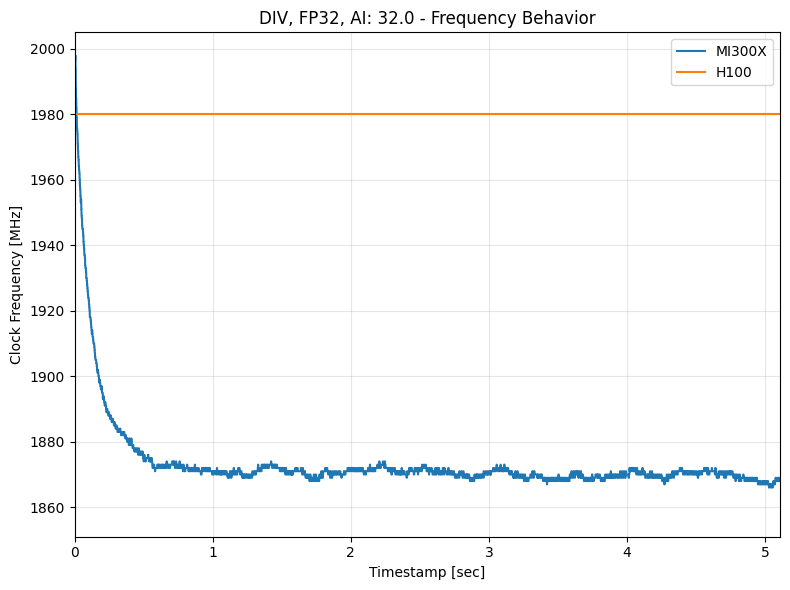

5.111
56.860898304


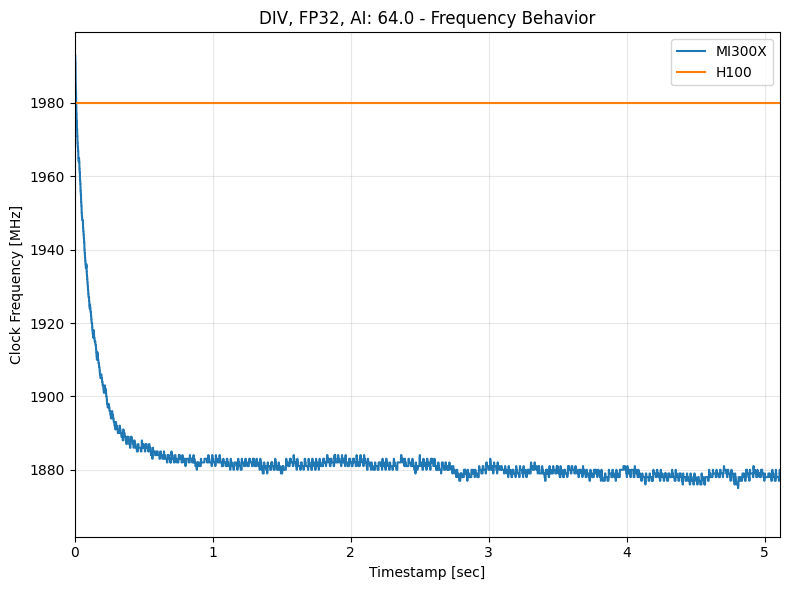

5.118
60.942519552


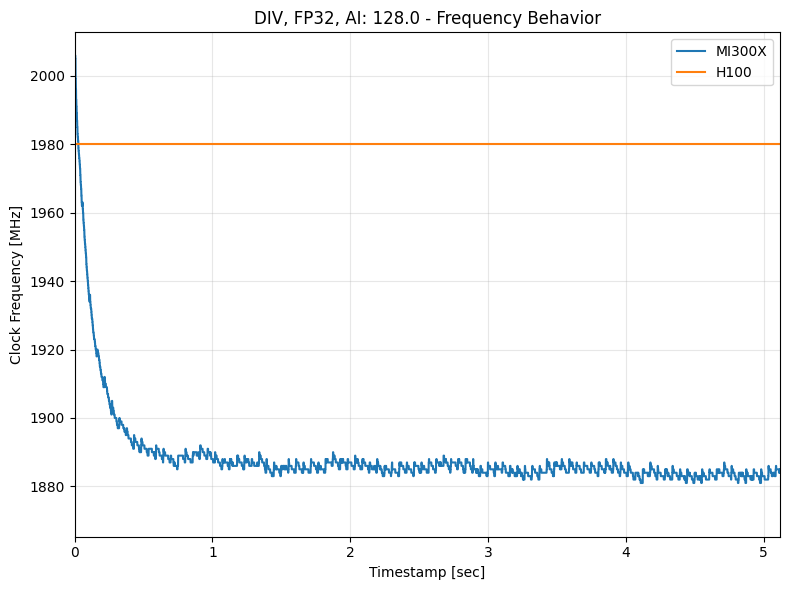

5.111
65.191986944


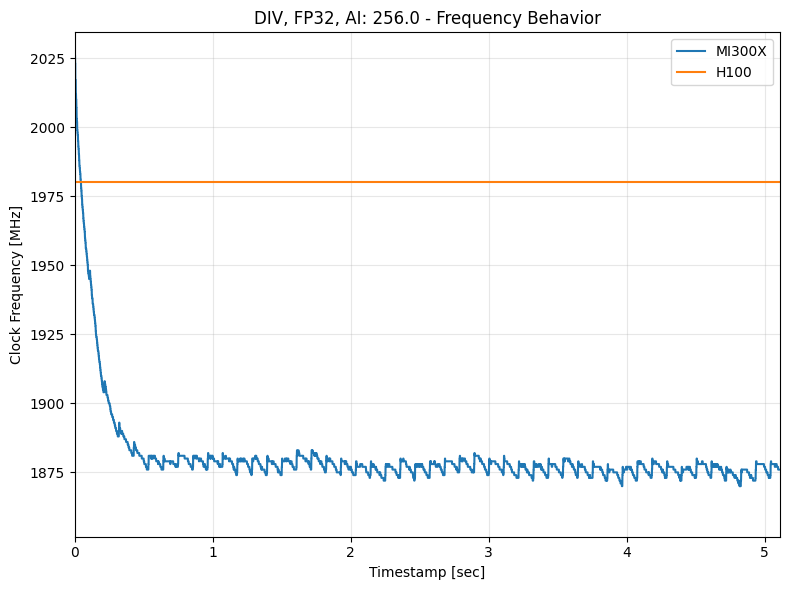

5.108
56.996882432


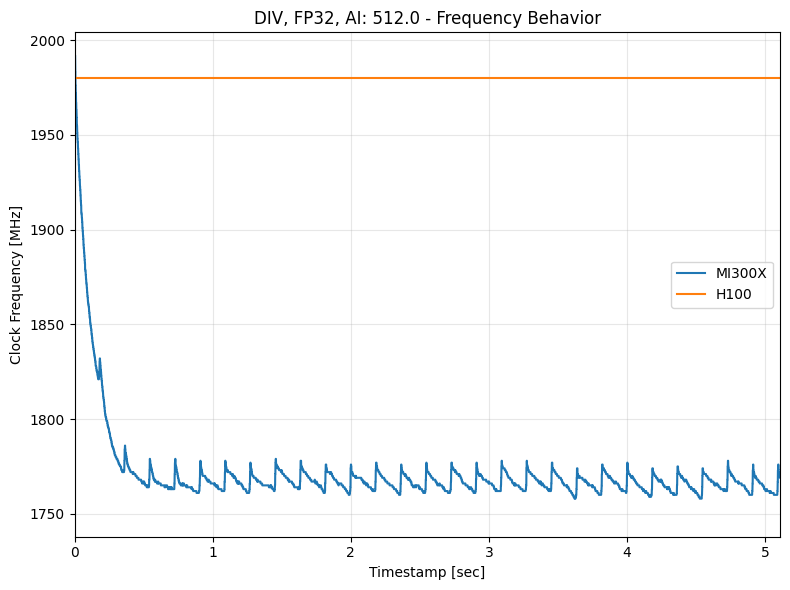

5.119
57.634253312


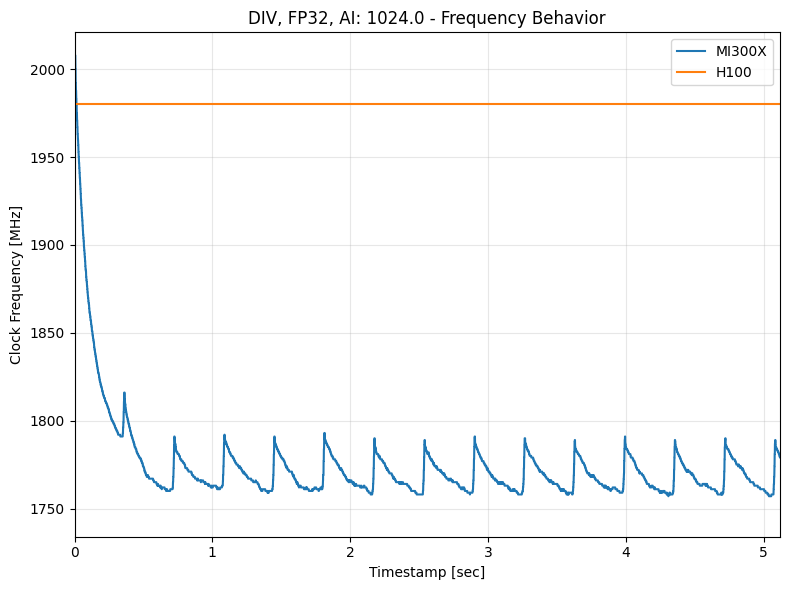

5.112
57.57158784


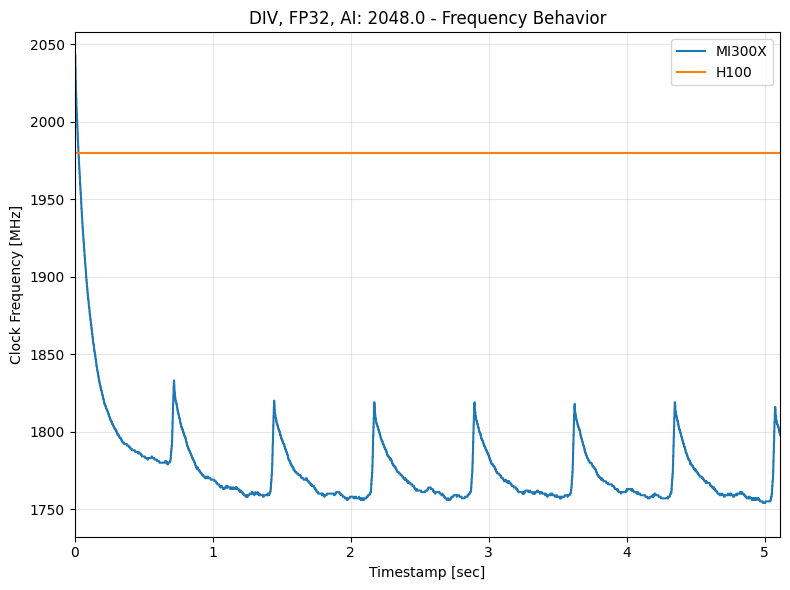

5.114
56.85078656


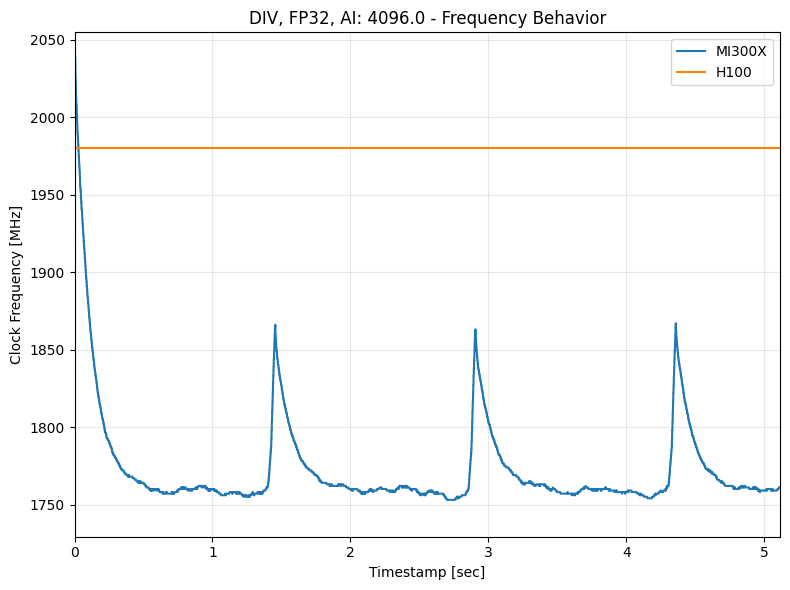

5.127
58.322870784


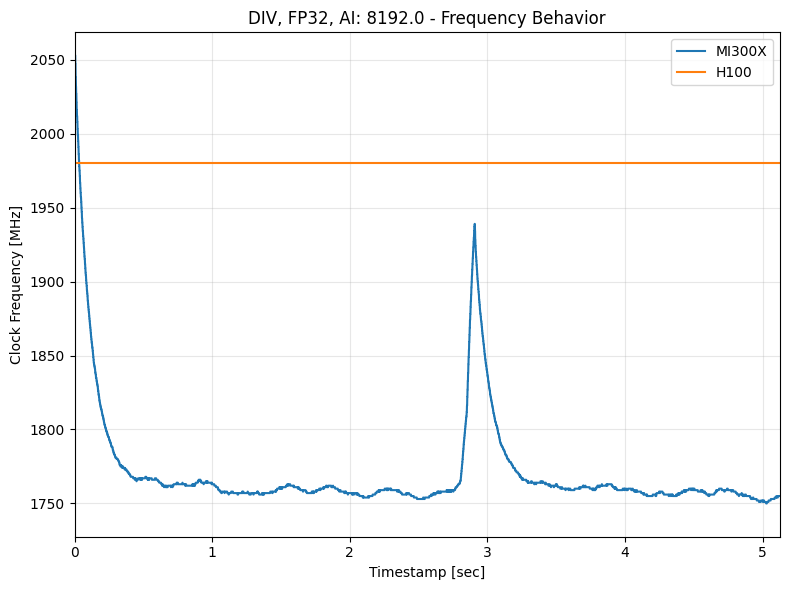

3.903
3.643746816


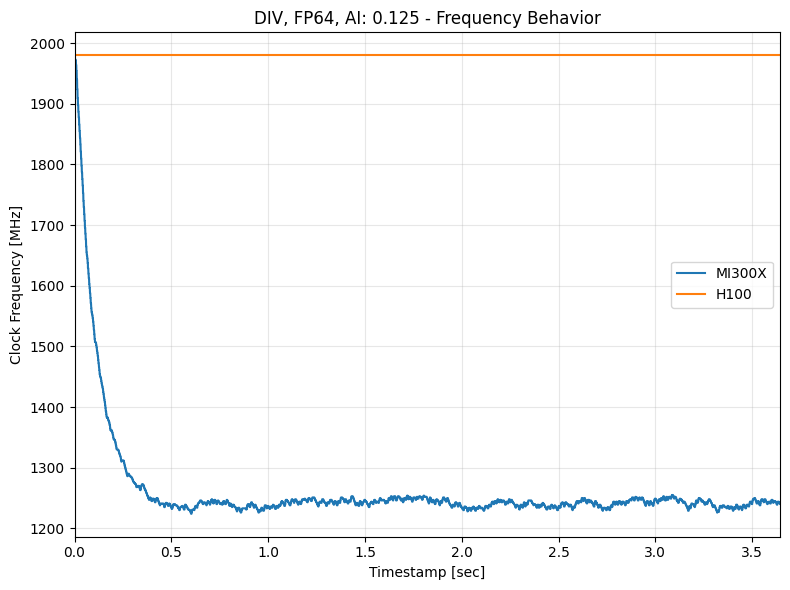

4.017
3.78529152


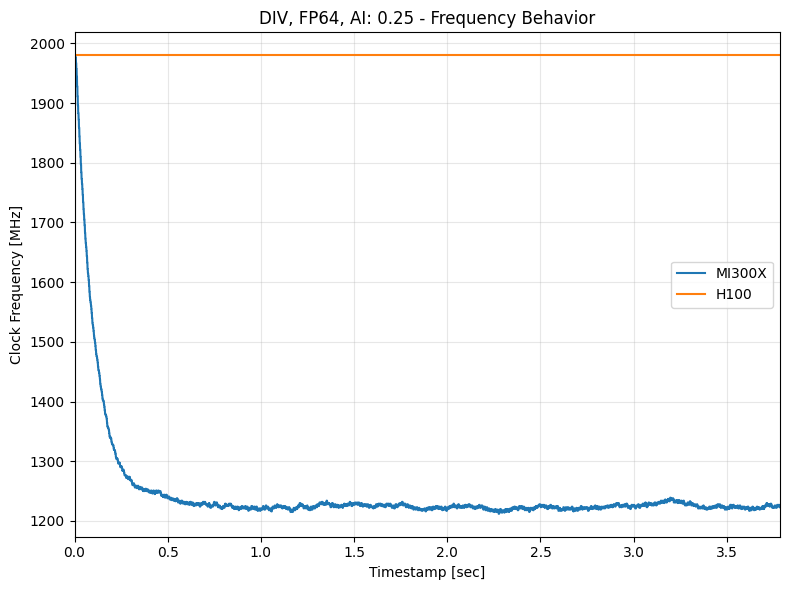

4.867
4.419552768


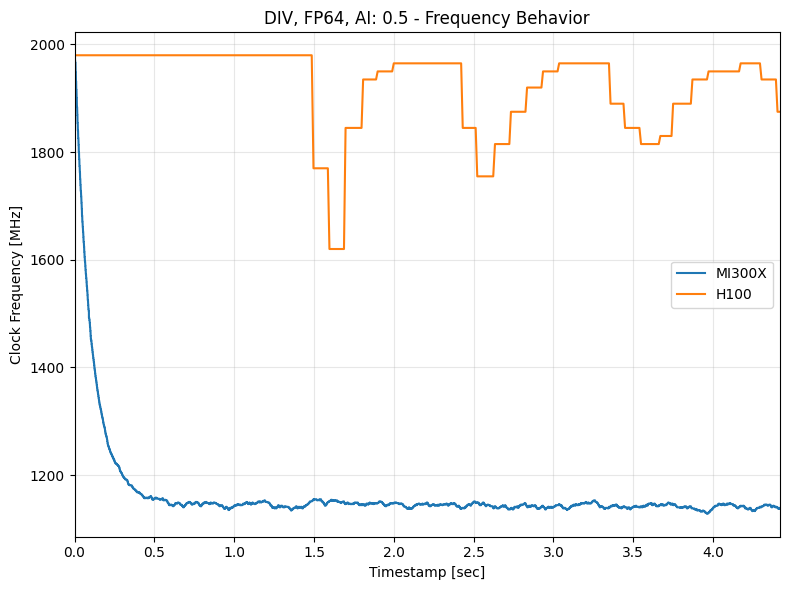

5.131
6.458872832


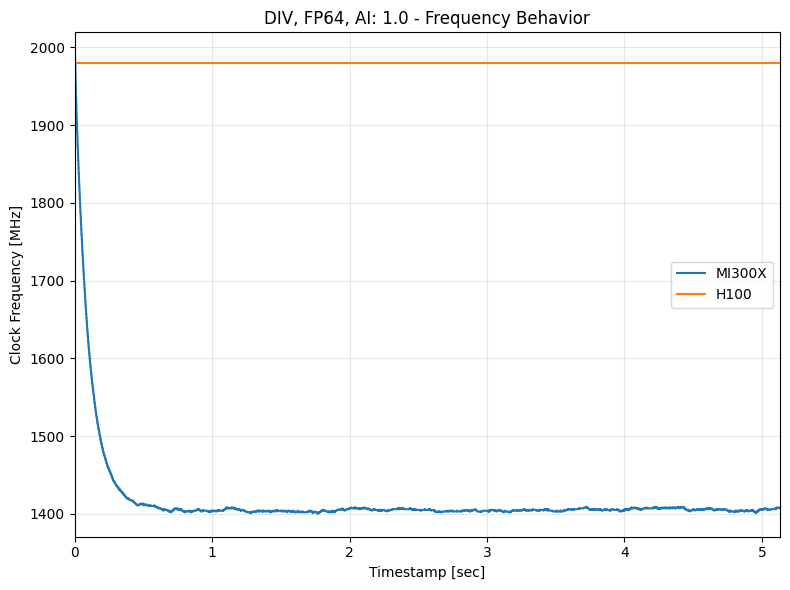

5.13
10.183714304


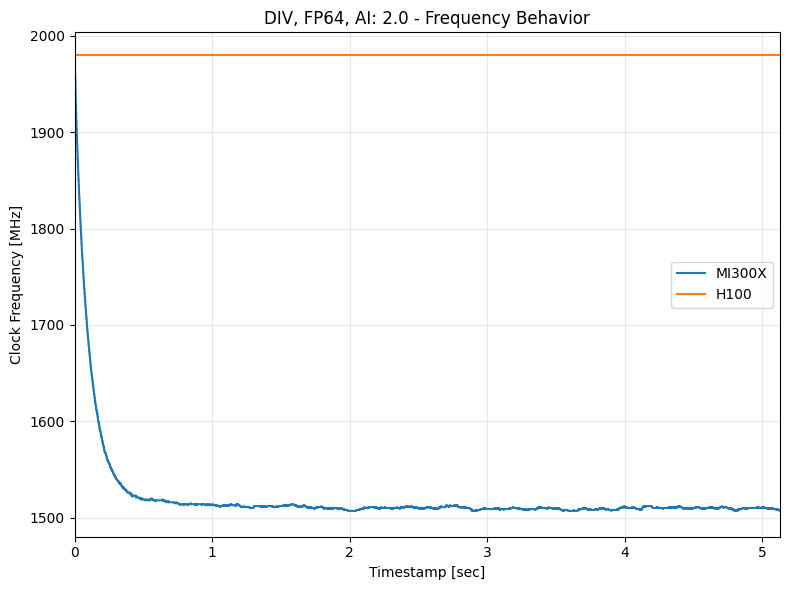

5.127
19.057568


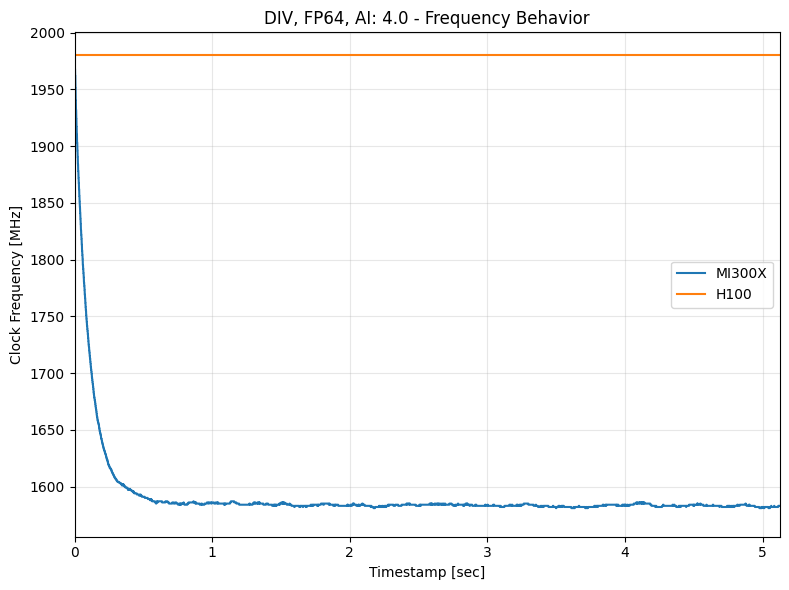

5.14
25.228212224


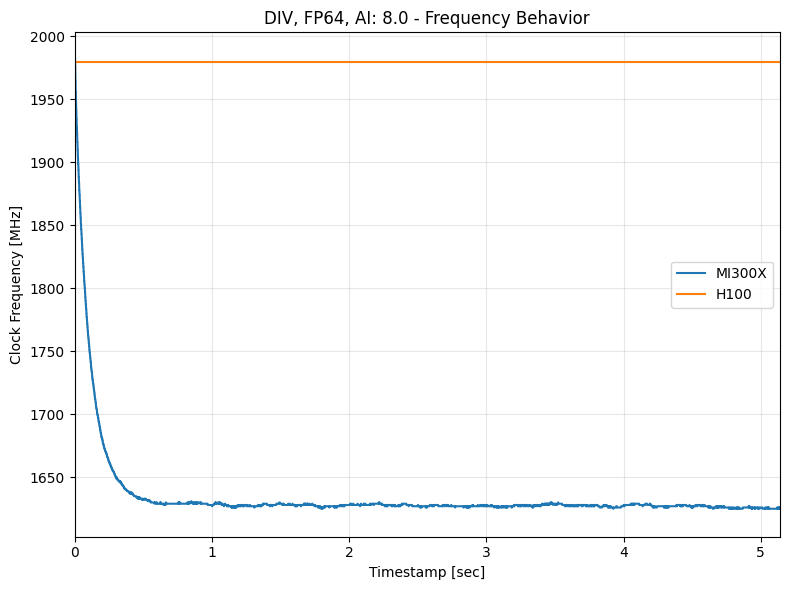

5.109
28.433692416


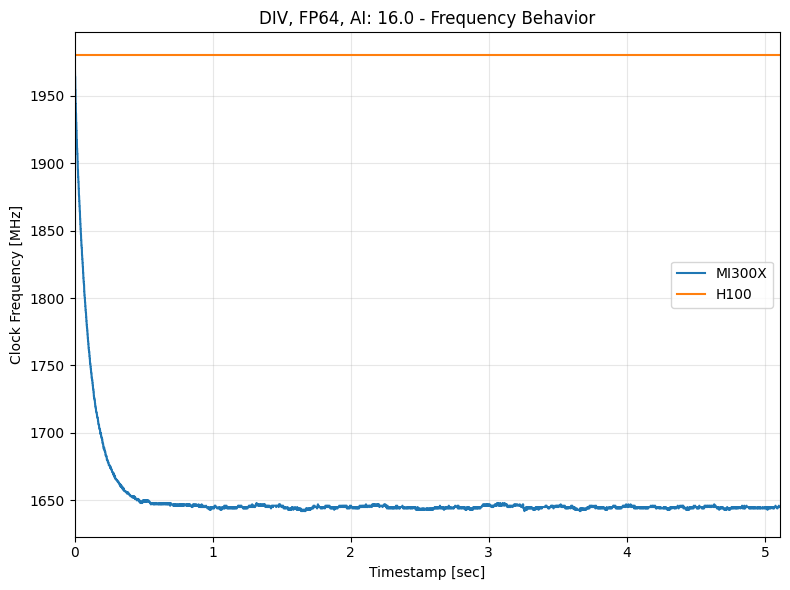

5.118
32.530417152


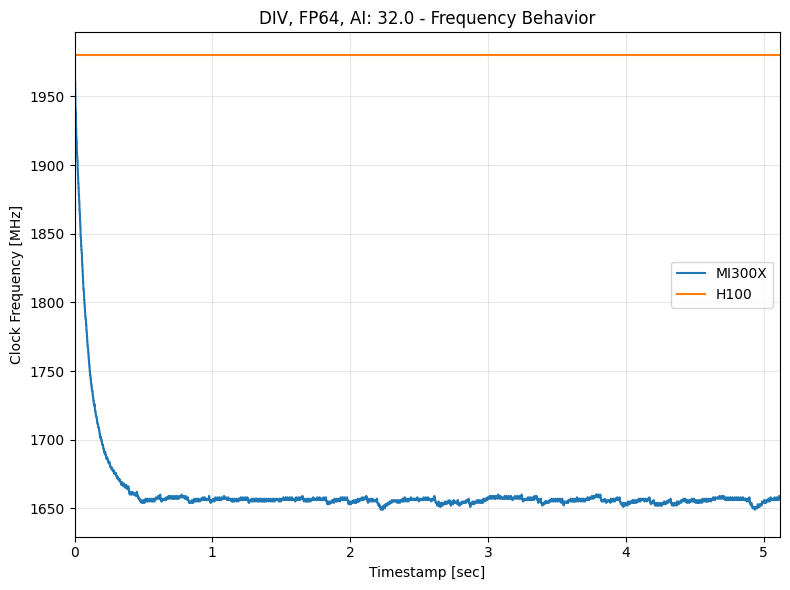

5.113
35.063443968


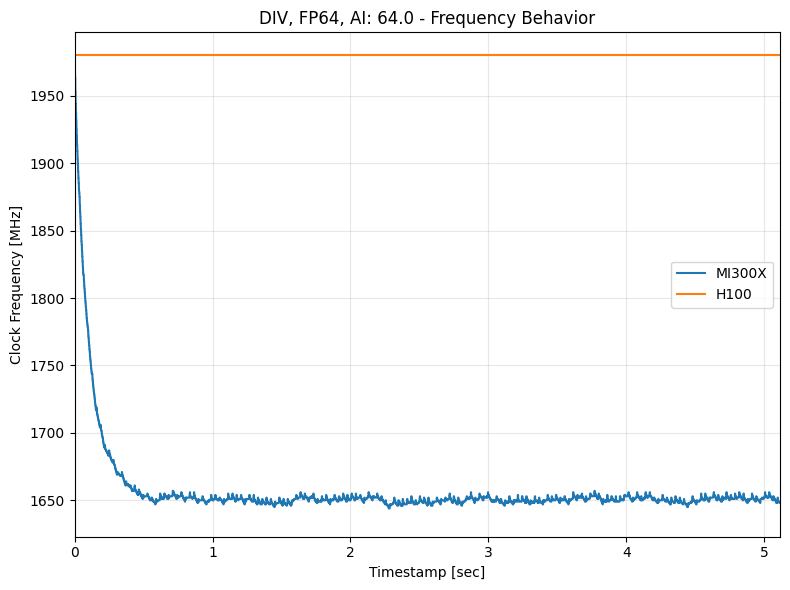

5.142
37.817212672


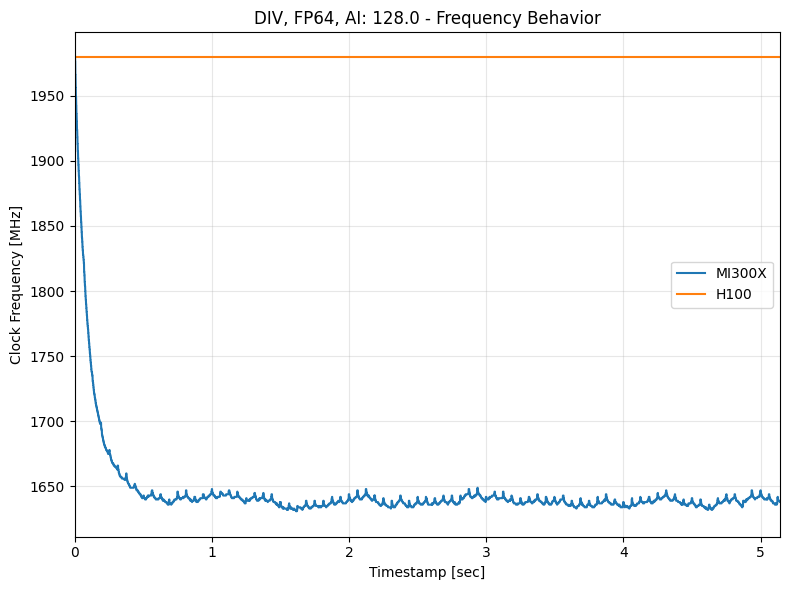

5.142
38.67727488


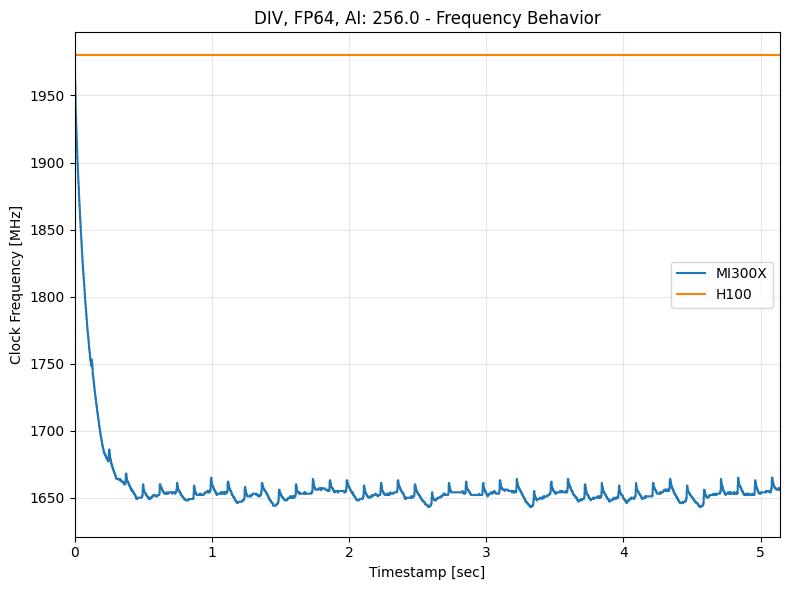

5.121
38.93529984


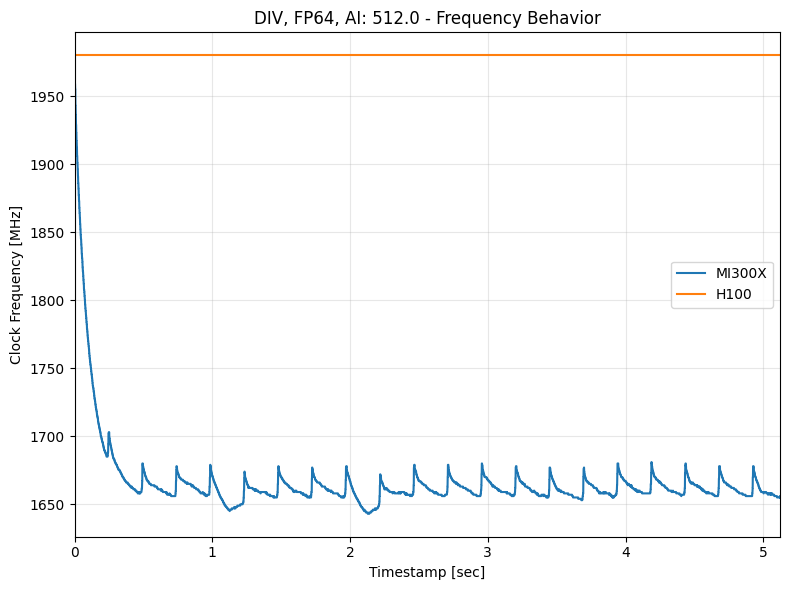

5.117
38.864059136


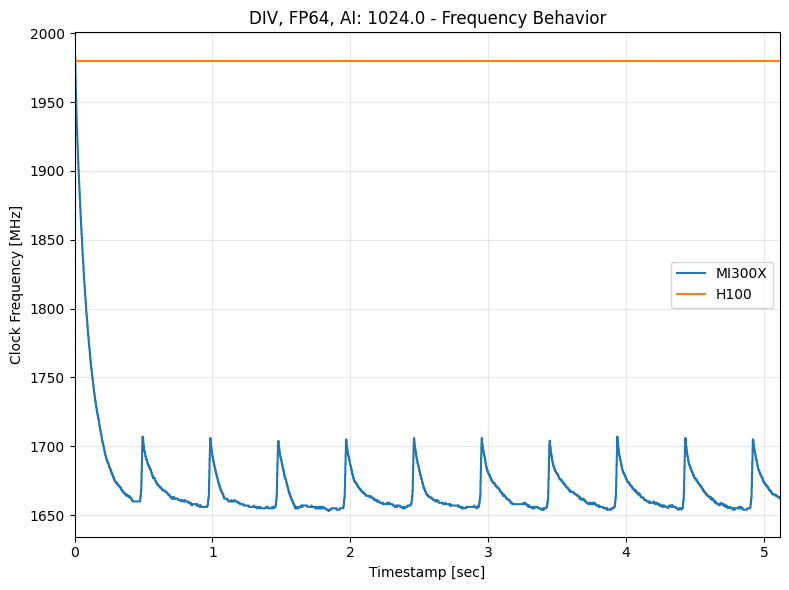

5.134
38.372398592


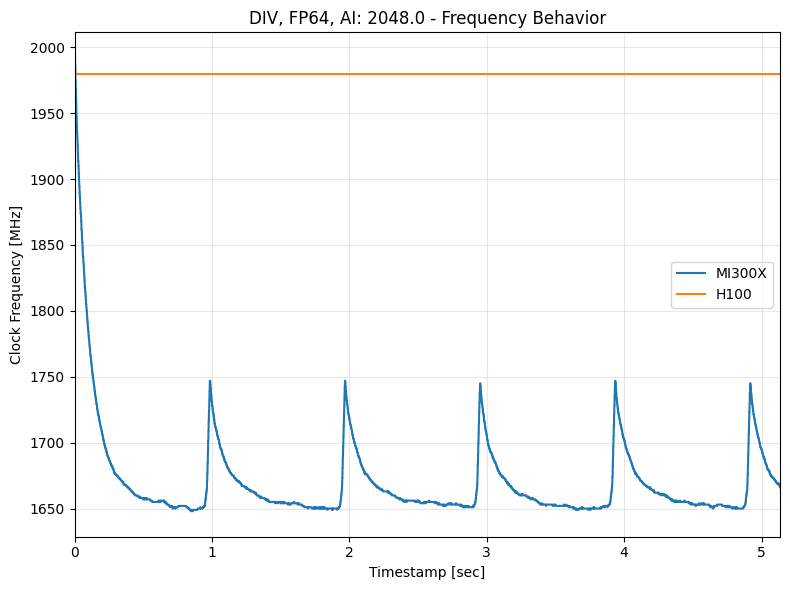

5.133
39.36827648


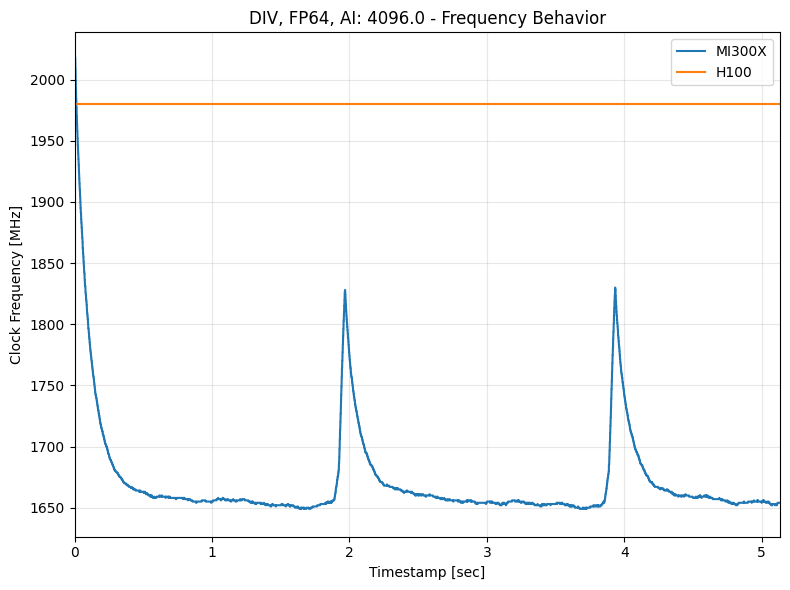

5.11
6.937523968


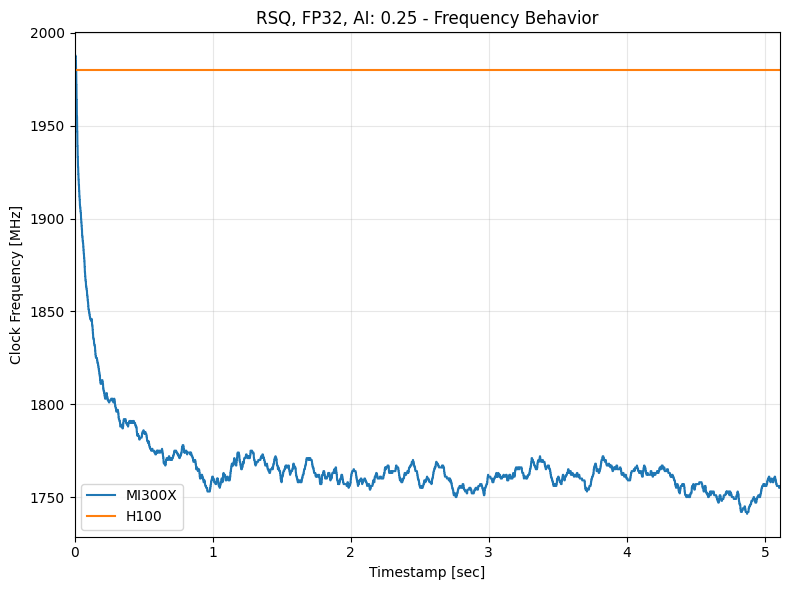

5.11
6.786610432


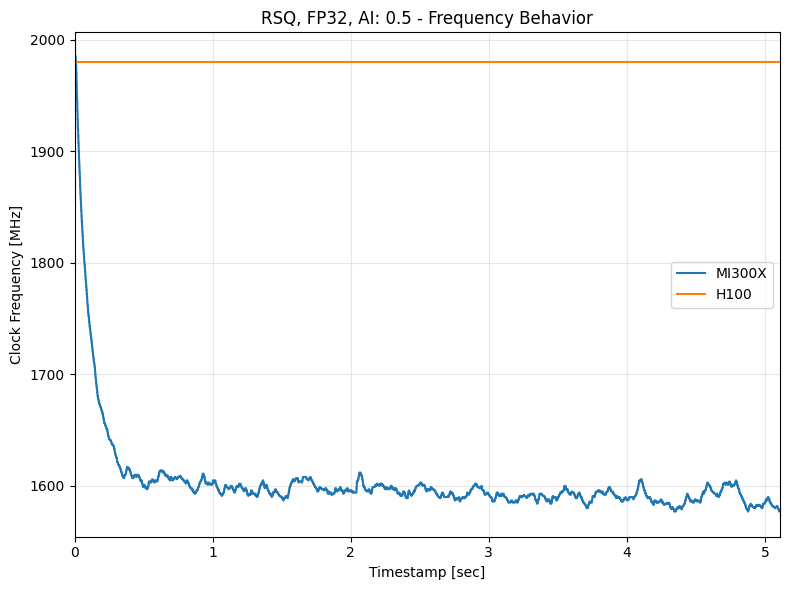

5.111
6.670681856


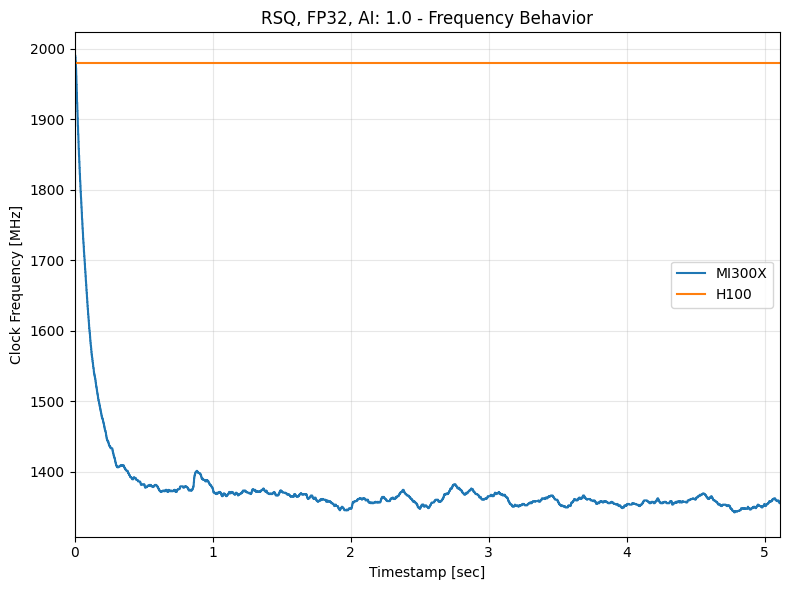

5.111
7.576954112


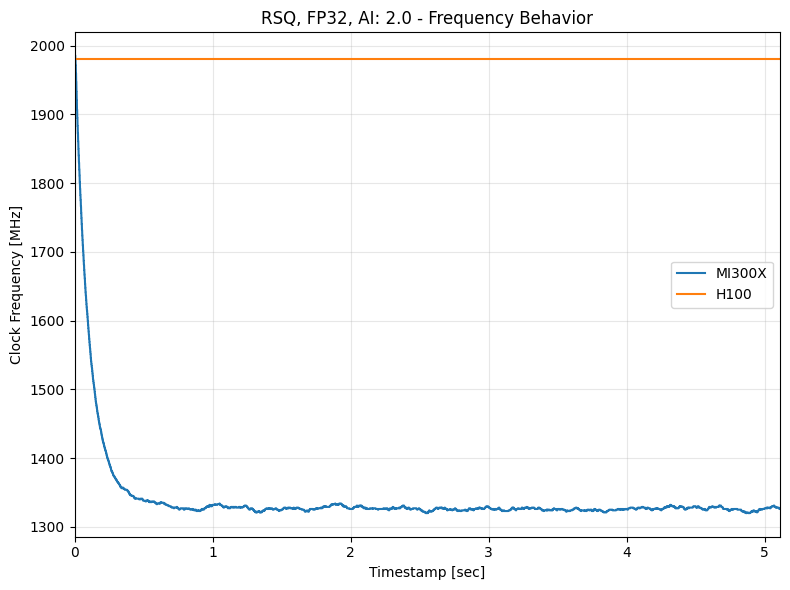

5.109
9.54400512


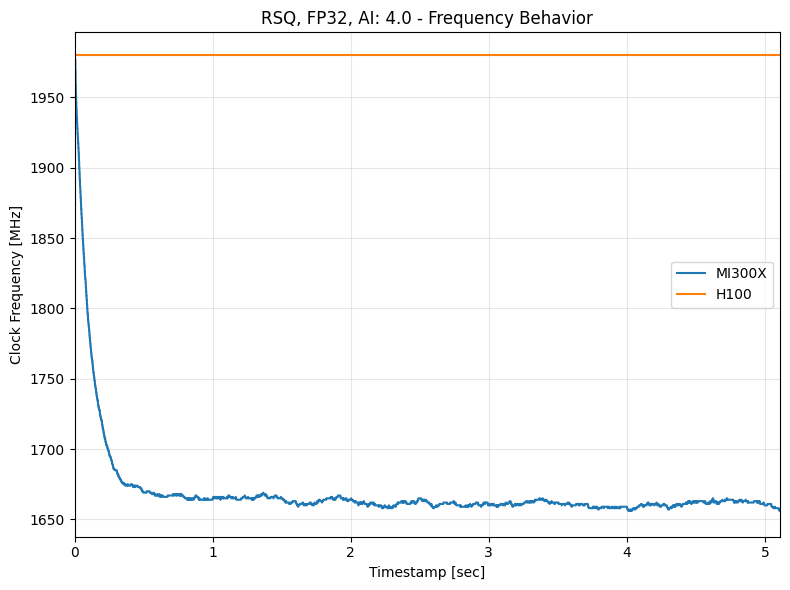

5.108
16.808643328


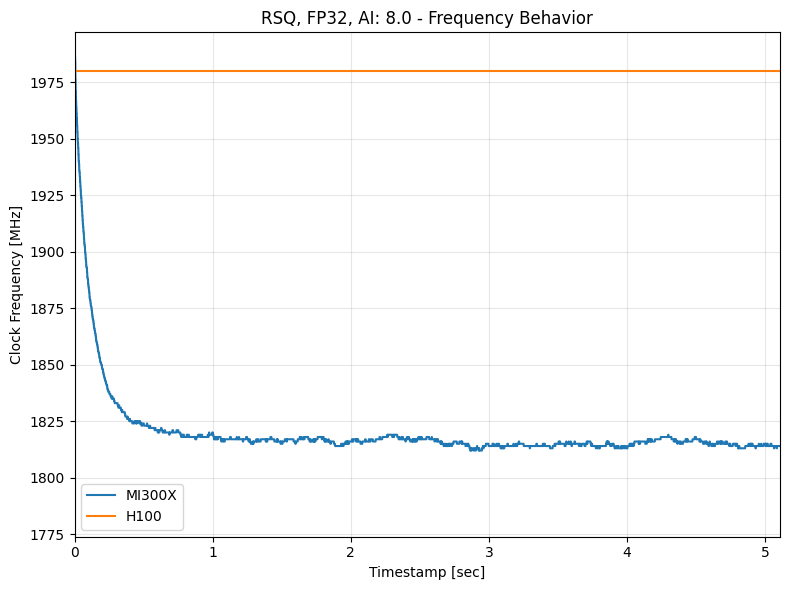

5.112
22.008035072


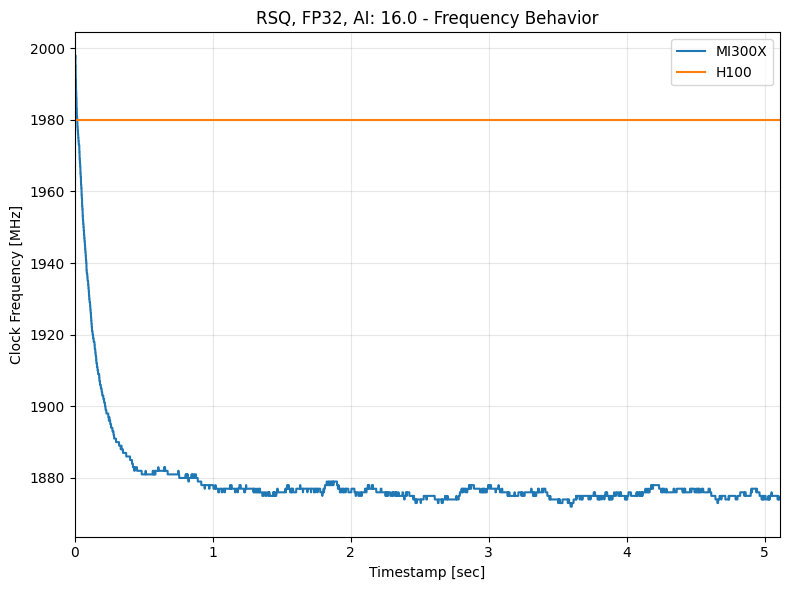

5.112
24.049392384


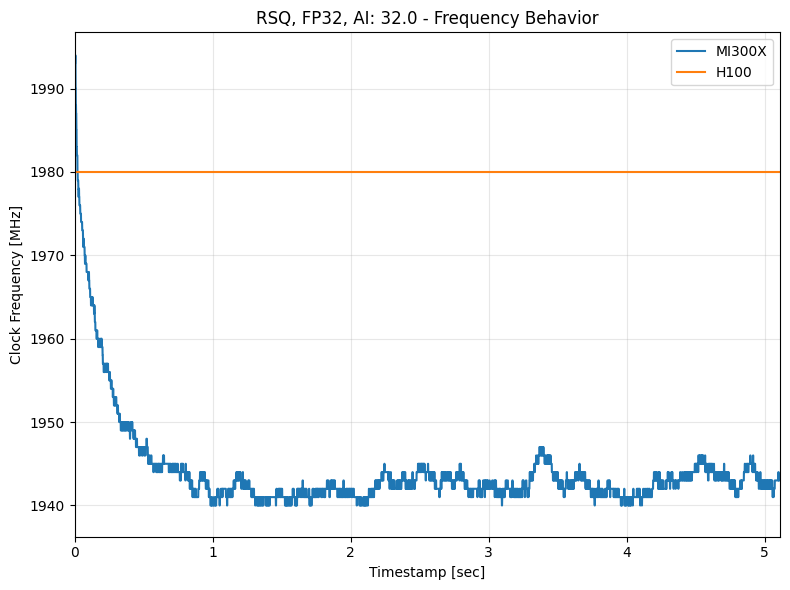

5.108
27.077553408


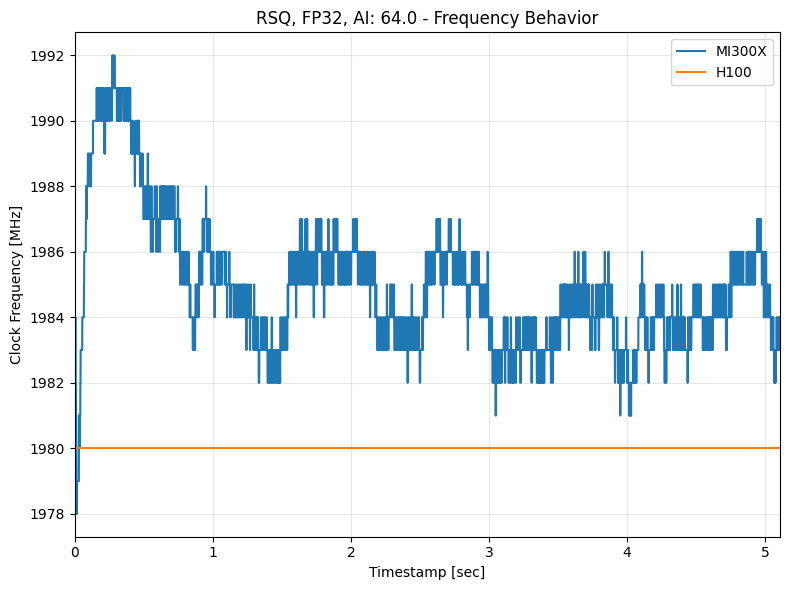

5.112
28.764738304


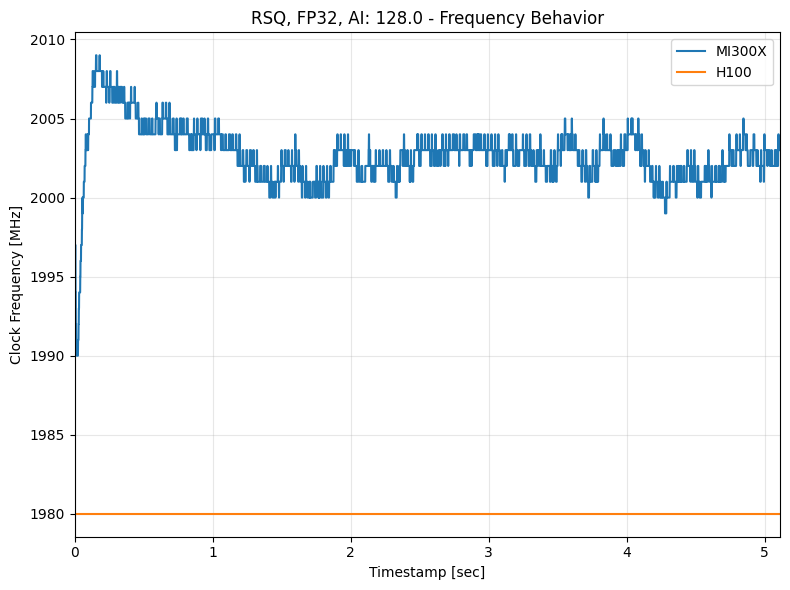

5.109
30.449500672


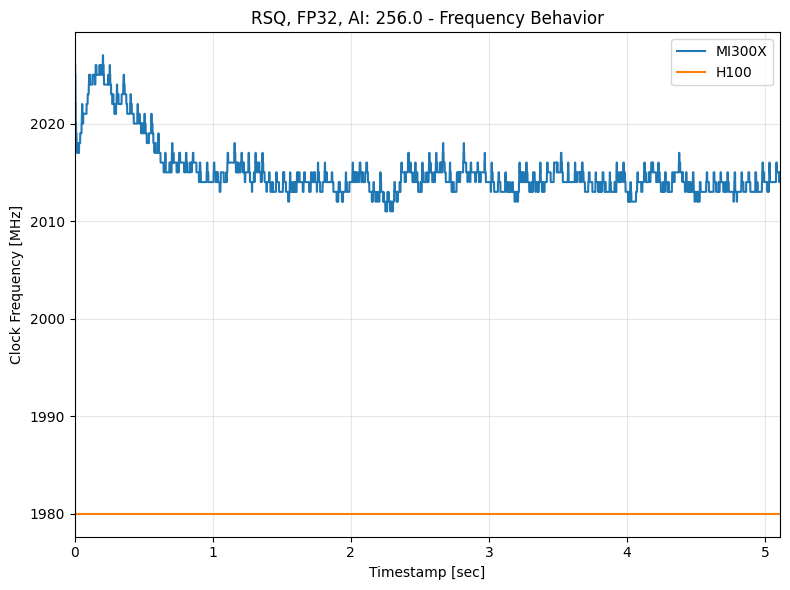

5.115
31.306994688


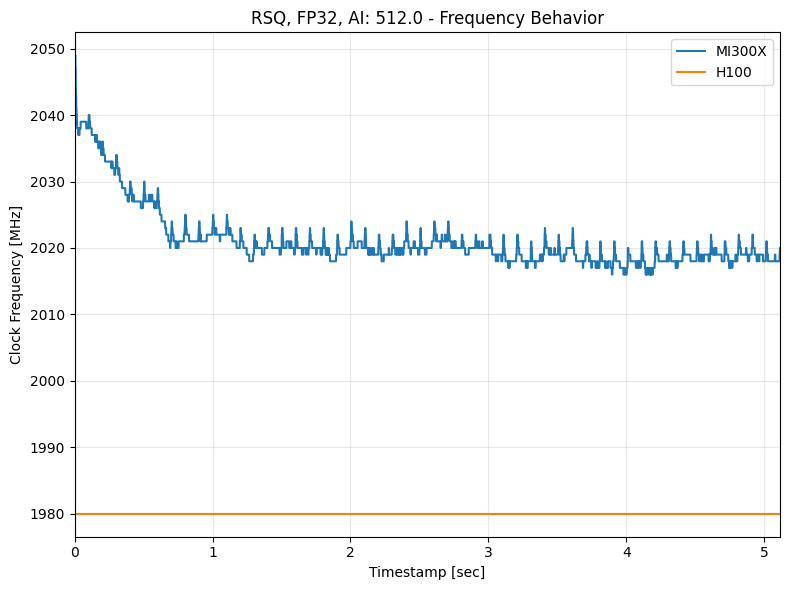

5.119
31.636879872


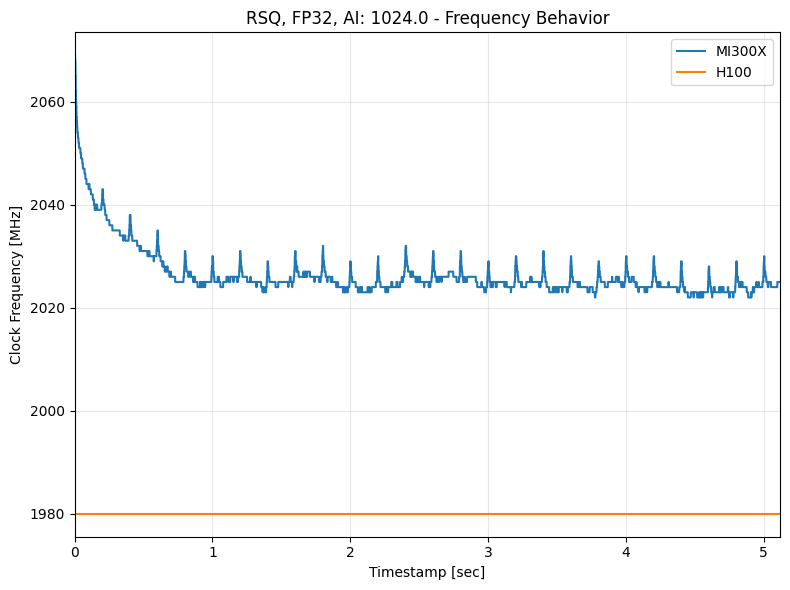

5.12
31.650194432


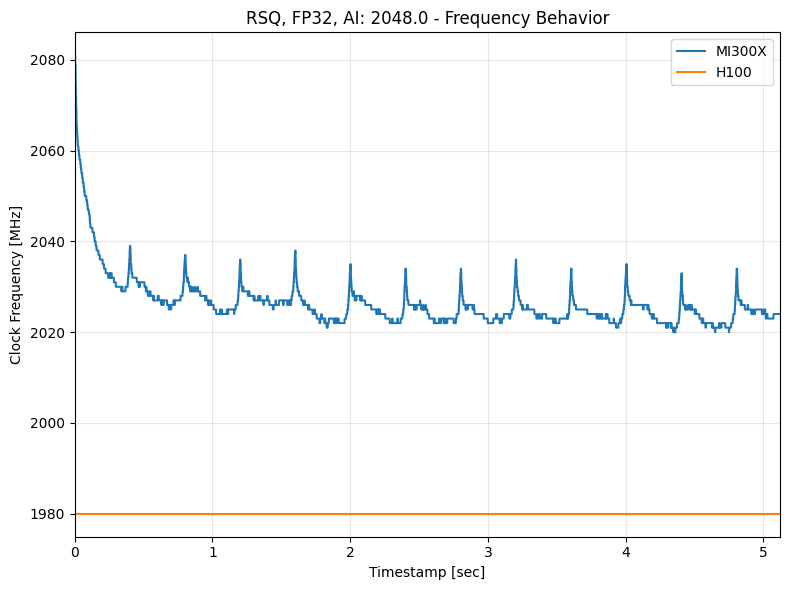

5.124
31.218286592


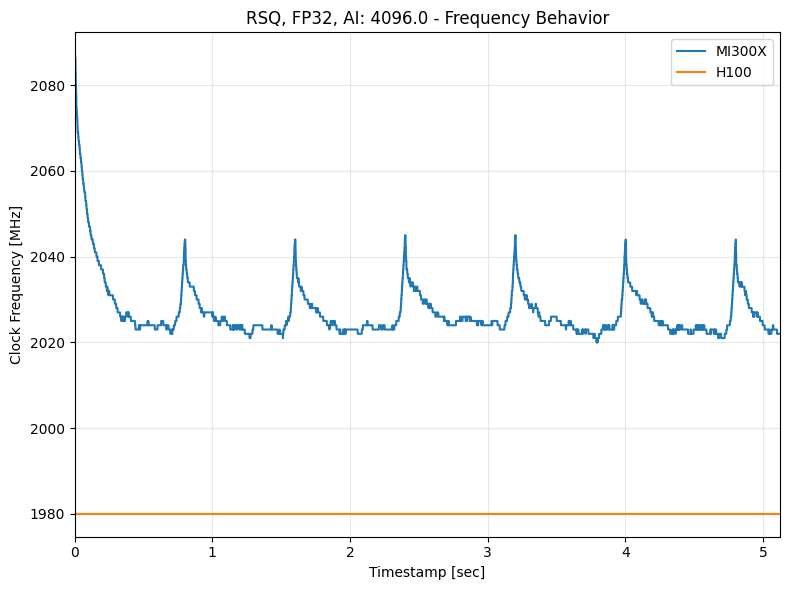

5.111
31.9570176


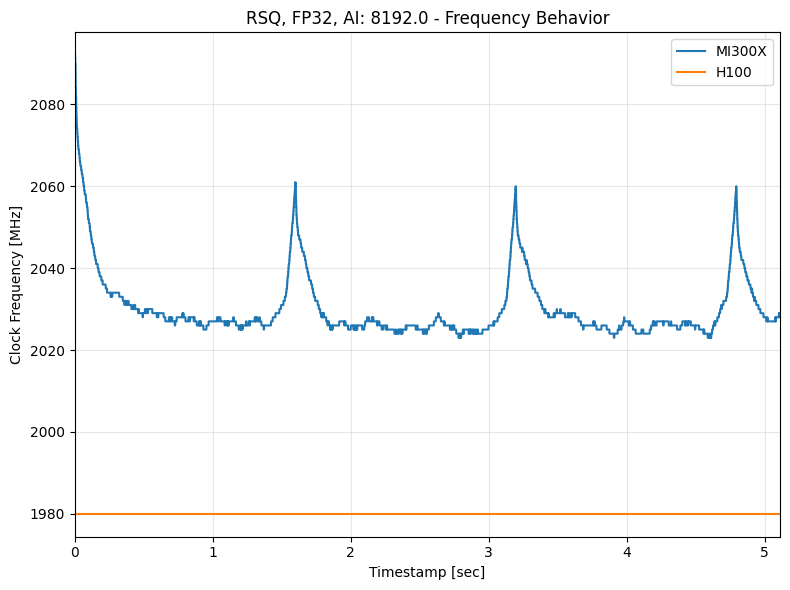

5.11
7.758197248


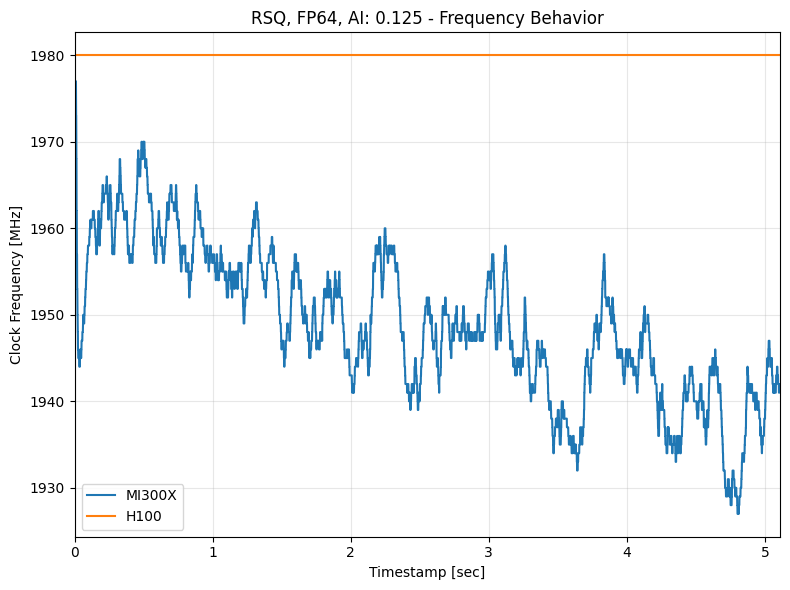

5.116
8.729553152


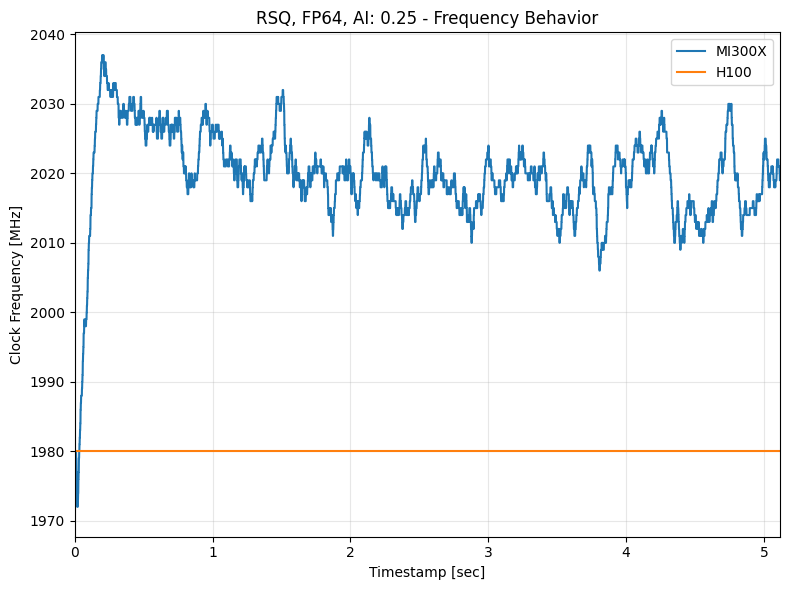

5.108
9.477812992


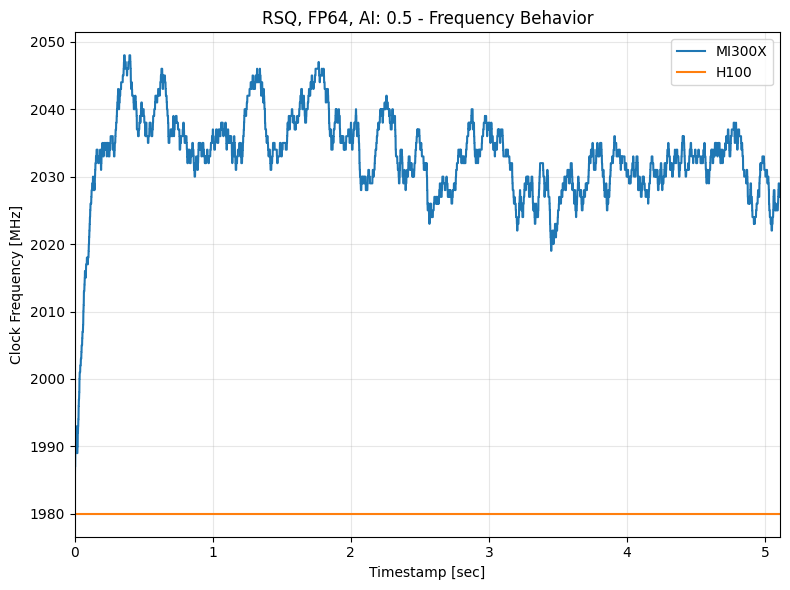

5.111
9.832758272


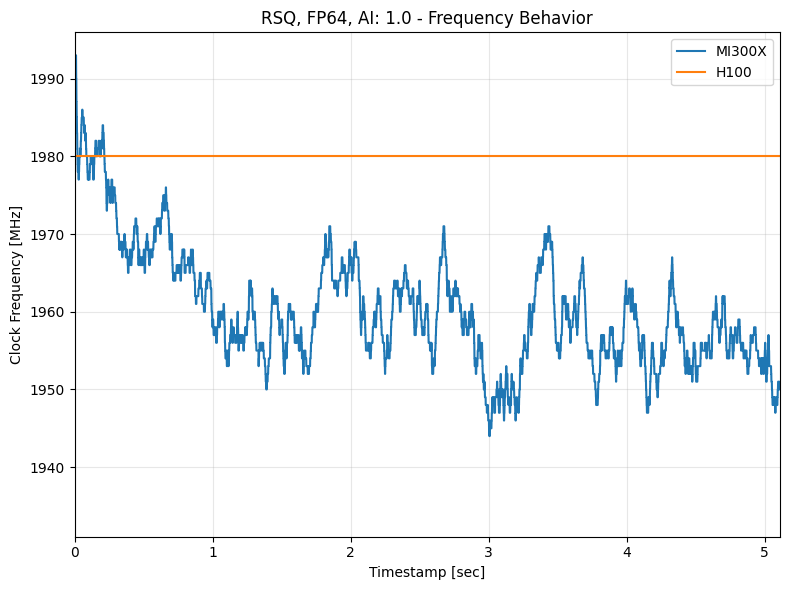

5.109
7.502035456


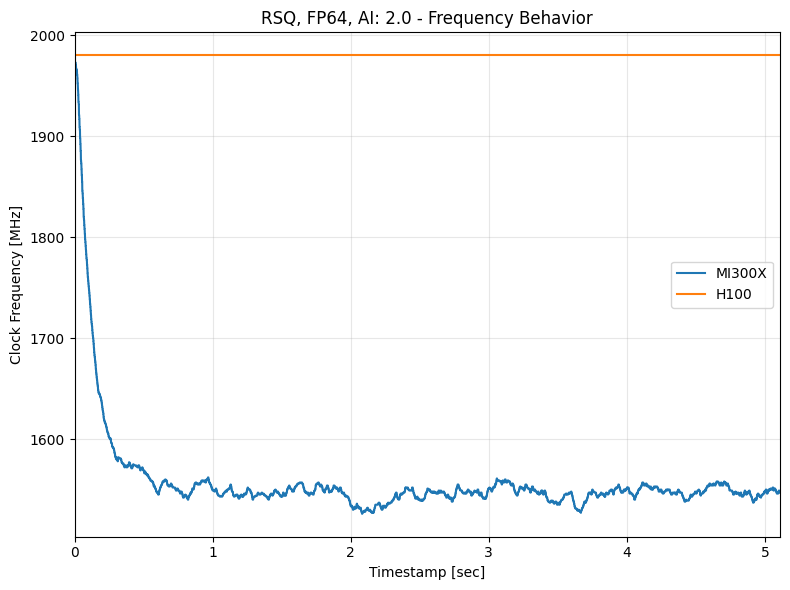

5.112
9.47327104


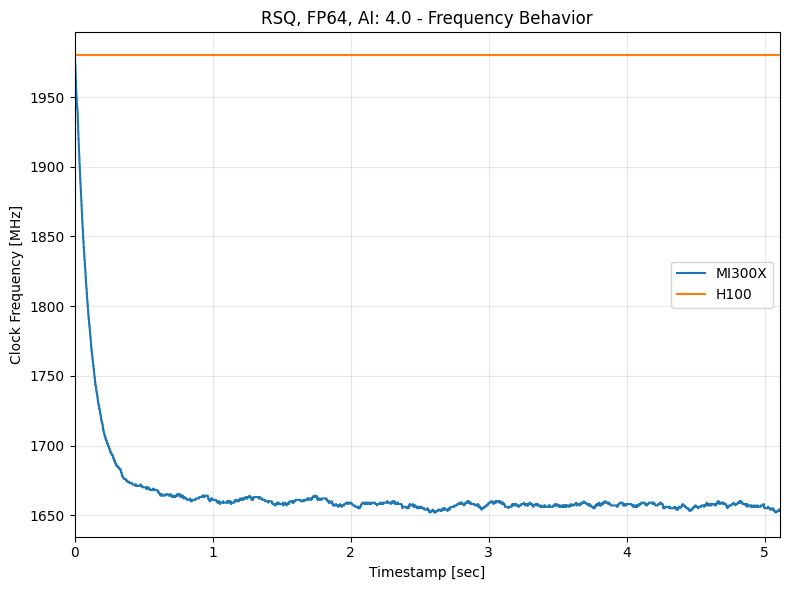

5.109
11.479958784


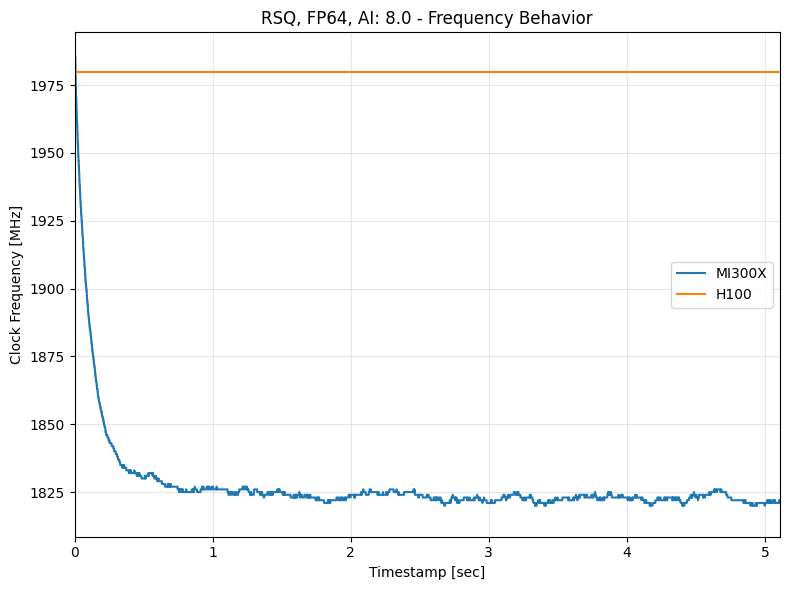

5.111
12.498841856


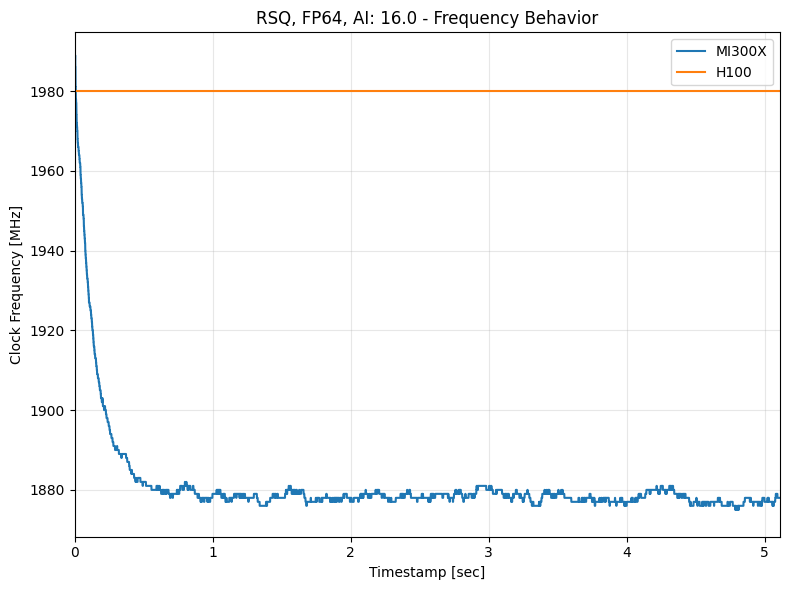

5.119
13.818978816


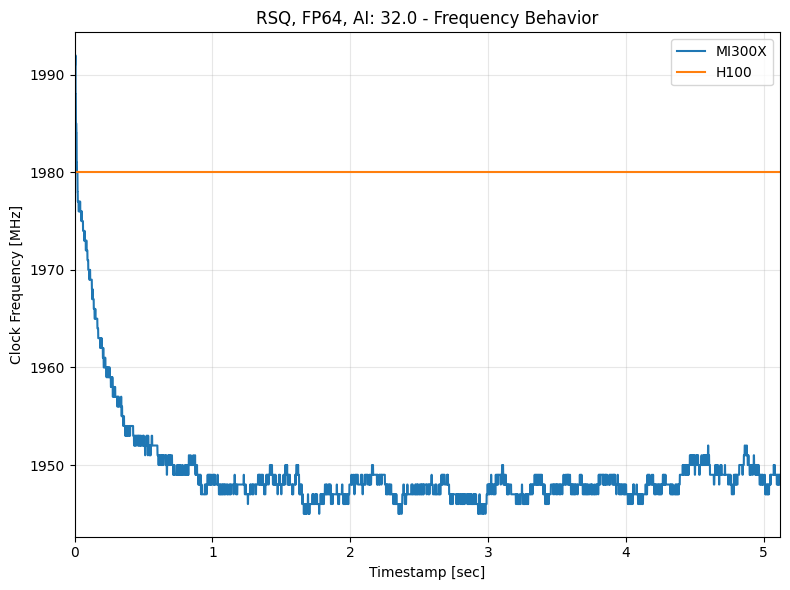

5.117
14.499142912


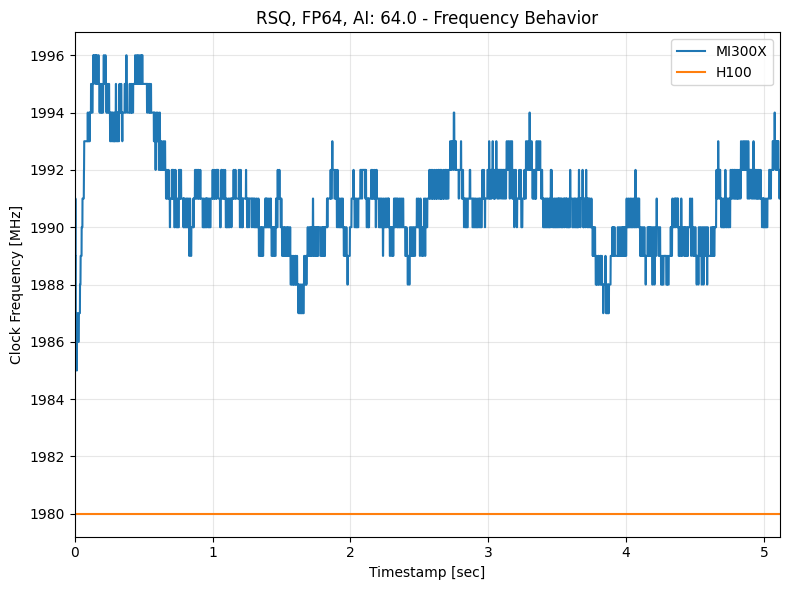

5.11
15.286921728


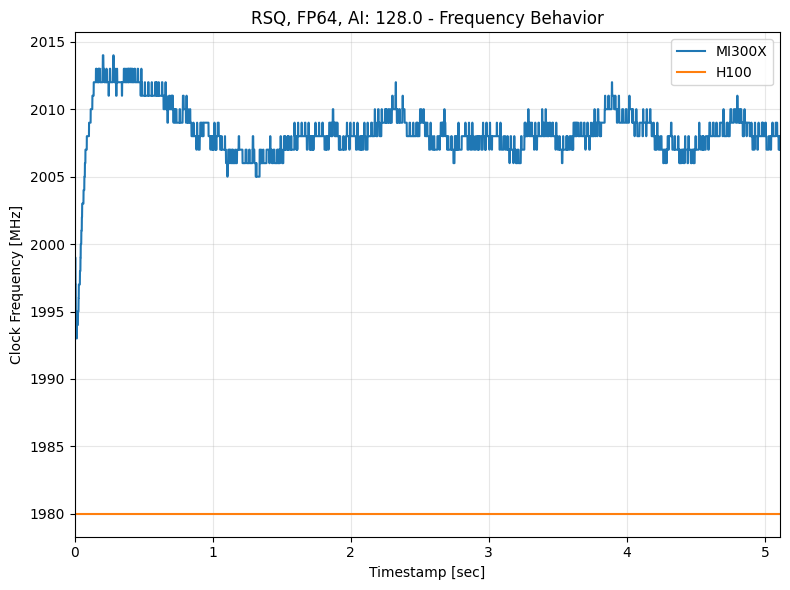

5.12
15.667104256


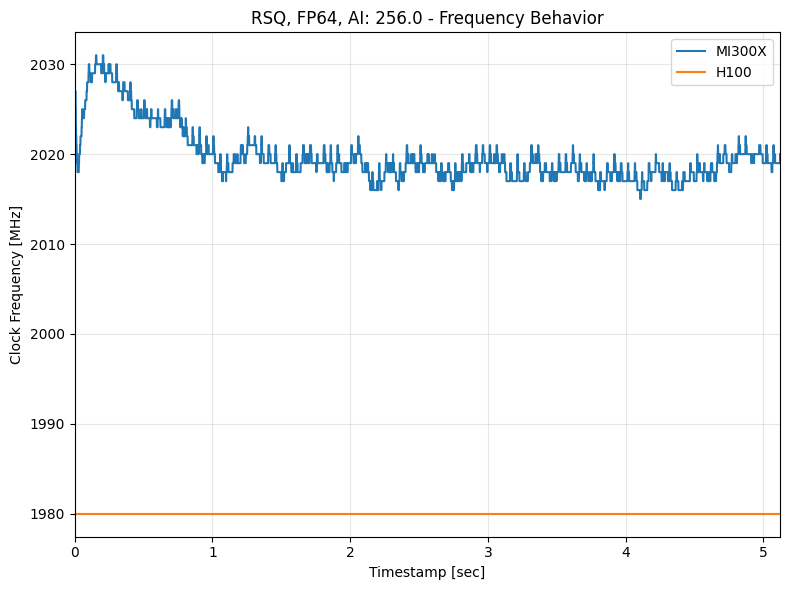

5.111
15.81498496


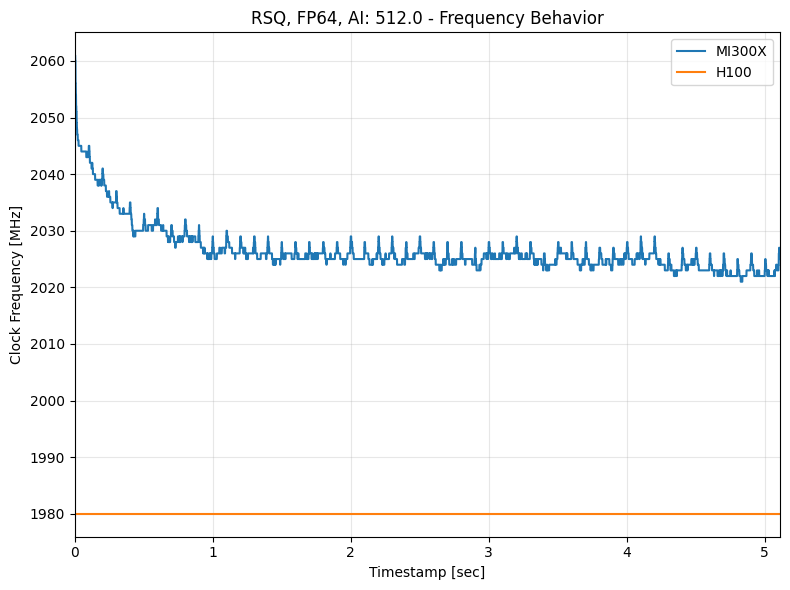

5.12
15.799760384


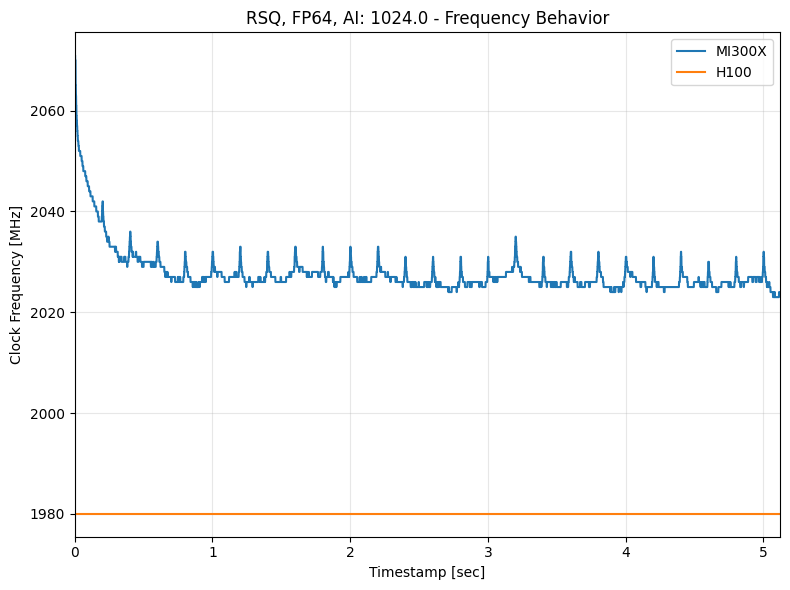

5.12
15.594296576


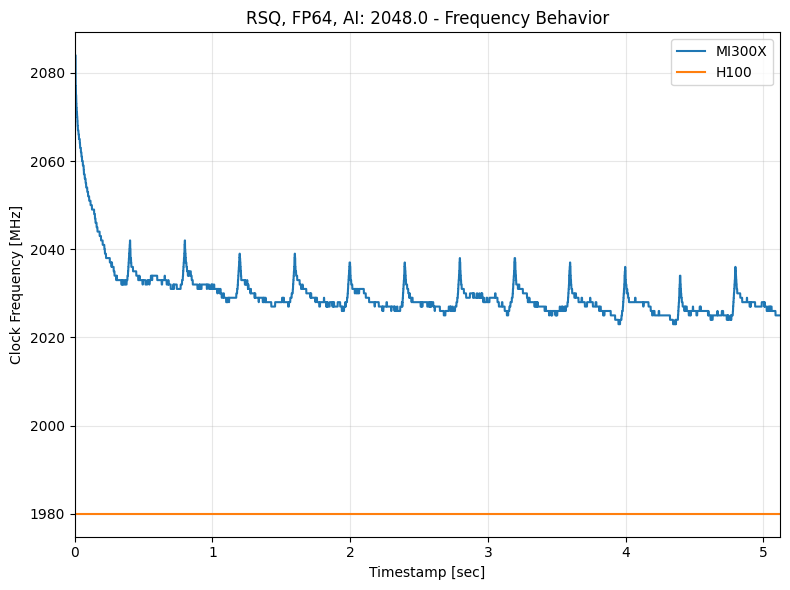

5.109
15.973042944


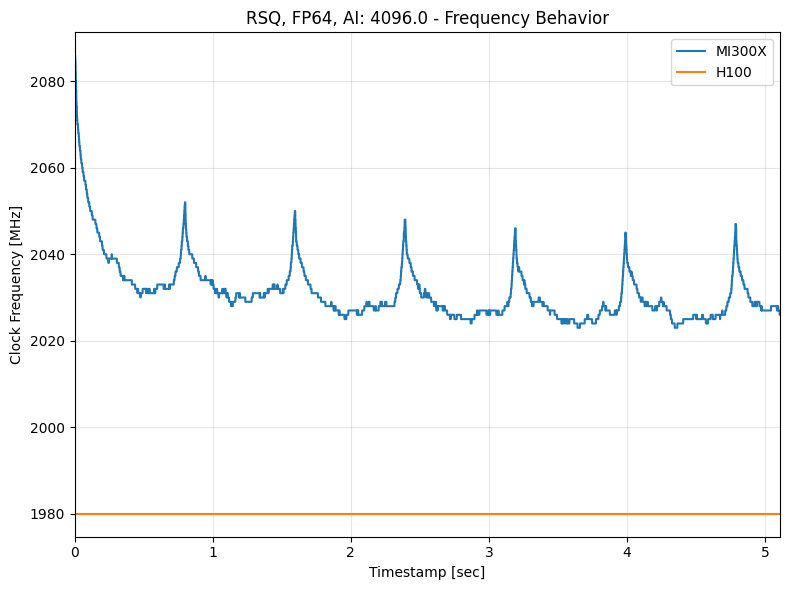

In [178]:
import numpy as np

!mkdir -p "./analysis_plots/freq_fixed/comparison/"

# for gpu in hw_dfs.keys():
for op in hw_dfs['MI300X'].keys():
    for data in hw_dfs['MI300X'][op].keys():
        for ai in sorted(hw_dfs['MI300X'][op][data].keys()):
            # Check if both GPUs have data for this combination
            if ai in hw_dfs['H100'][op][data]:
                if op in df_mi300x['OP'].unique():
                    if data in ['FP32', 'FP64']:
                        plt.figure(figsize=(8, 6))
                        
                        # MI300X data
                        hw_df_mi300x = hw_dfs['MI300X'][op][data][ai]
                        # hw_df_mi300x['Timestamp'] = hw_df_mi300x['Timestamp'] - hw_df_mi300x.iloc[0]['Timestamp']
                        plt.plot(hw_df_mi300x['Timestamp'], hw_df_mi300x['Clk_system[MHz]'], label='MI300X', color='tab:blue')
                        
                        # H100 data
                        hw_df_h100 = hw_dfs['H100'][op][data][ai]
                        # hw_df_h100['timestamp'] = hw_df_h100['timestamp'] - hw_df_h100.iloc[0]['timestamp']
                        plt.plot(hw_df_h100['timestamp'], hw_df_h100['clocks.current.sm [MHz]'], label='H100', color='tab:orange')
                        
                        plt.title(f'{op}, {data}, AI: {ai} - Frequency Behavior')
                        plt.xlabel('Timestamp [sec]')
                        plt.ylabel('Clock Frequency [MHz]')
                        print(hw_df_h100['timestamp'].max())
                        print(hw_df_mi300x['Timestamp'].max())
                        plt.xlim(0, min(hw_df_h100['timestamp'].max(), hw_df_mi300x['Timestamp'].max()))
                        plt.legend()
                        plt.grid(alpha=0.3)
                        plt.tight_layout()
                        plt.savefig(f'./analysis_plots/freq_fixed/comparison/{op}_{data}_{ai}_freq_comparison.png')
                        plt.show()

In [195]:
for gpu in hw_dfs.keys():
    print(gpu)

MI300X
H100


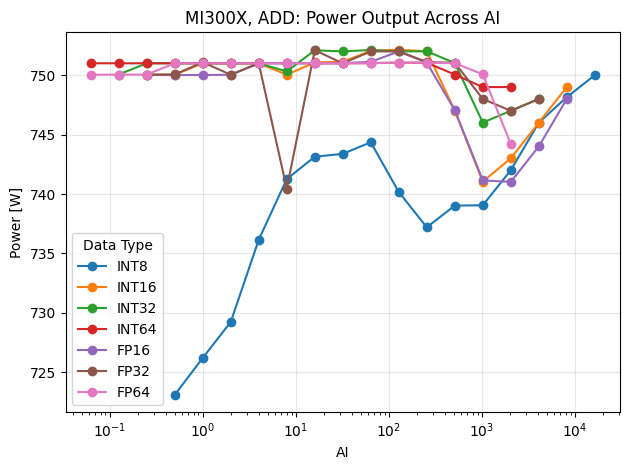

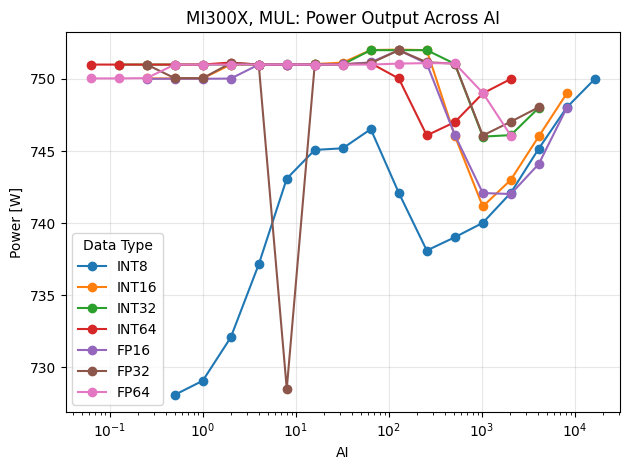

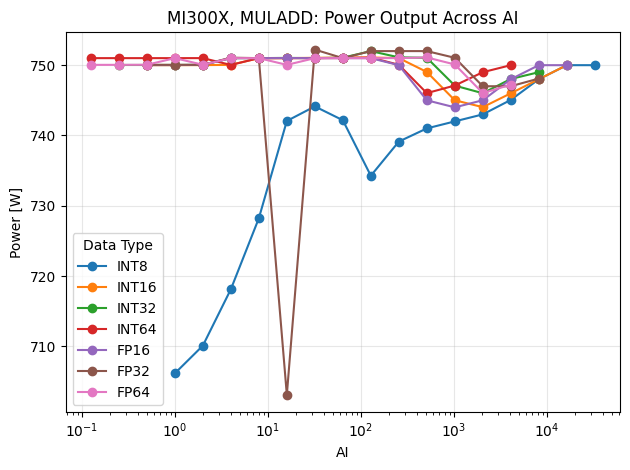

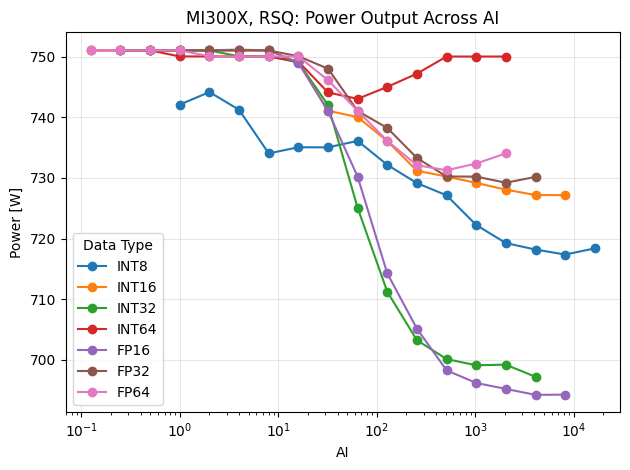

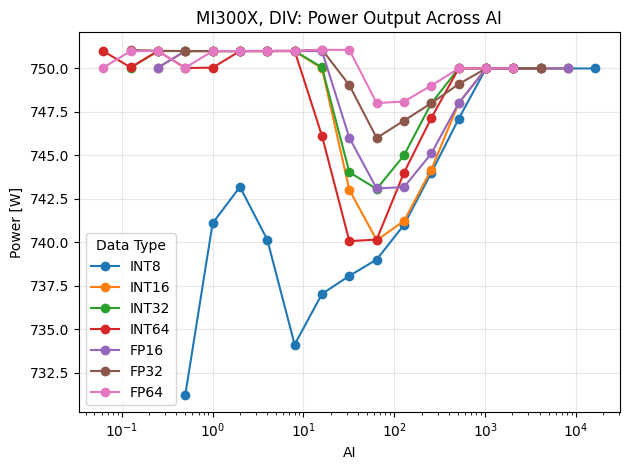

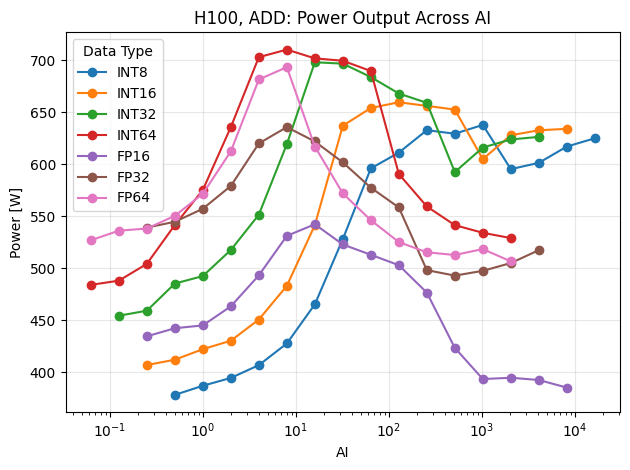

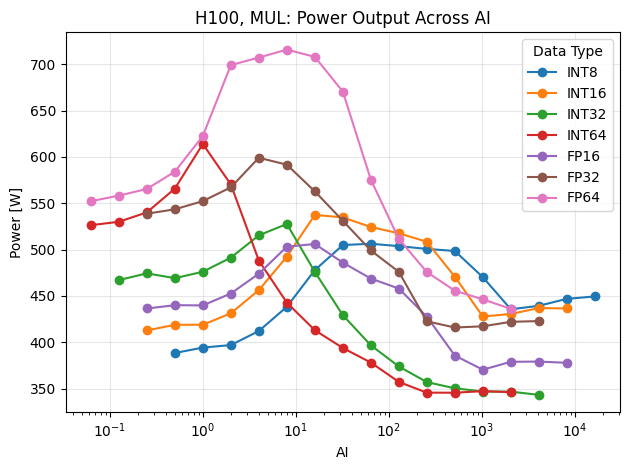

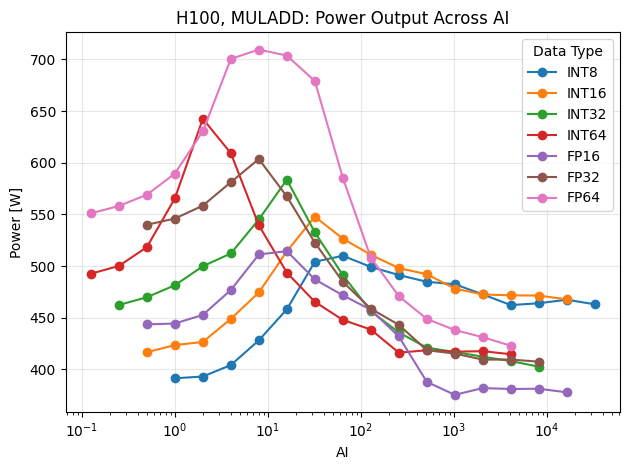

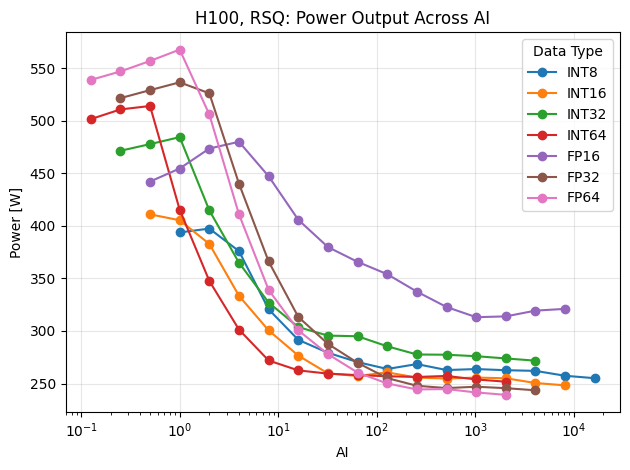

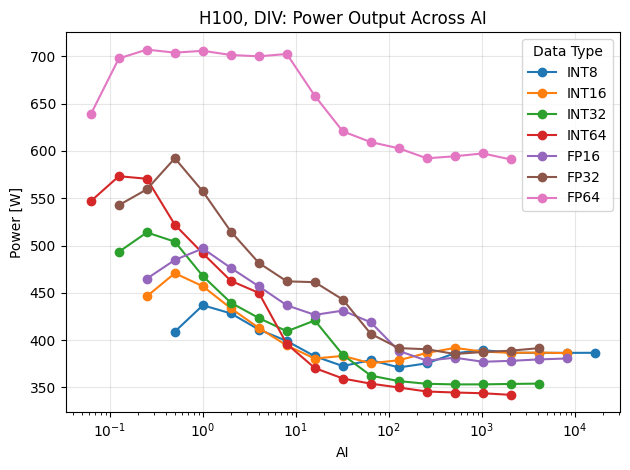

In [235]:
!mkdir -p "./analysis_plots/power/MI300X/"
!mkdir -p "./analysis_plots/power/H100/"
for gpu in hw_dfs.keys():
    for op in hw_dfs[gpu].keys():
        # plt.figure(figsize=(10, 6))
        for data in hw_dfs[gpu][op].keys():
            ai_values = []
            max_power_values = []
            for ai in sorted(hw_dfs[gpu][op][data].keys()):
                hw_df = hw_dfs[gpu][op][data][ai]
                # if 'Power [W]' in hw_df.columns:
                # print(hw_df.columns)
                ai_values.append(ai)
                if gpu == 'MI300X':
                    # Take the top 5 percentile of Power[W] values and compute the mean
                    power_vals = hw_df['Power[W]']
                    top_5 = power_vals.quantile(0.95)
                    max_power_values.append(power_vals[power_vals >= top_5].mean())
                else:
                    power_vals = hw_df['power.draw [W]']
                    top_5 = power_vals.quantile(0.95)
                    max_power_values.append(power_vals[power_vals >= top_5].mean())
            if ai_values:
                plt.plot(ai_values, max_power_values, marker='o', label=data)
        plt.xlabel('AI')
        plt.xscale('log')
        plt.ylabel('Power [W]')
        # plt.ylim(700, 800)
        plt.title(f'{gpu}, {op}: Power Output Across AI')
        plt.legend(title='Data Type')
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.savefig(f'./analysis_plots/power/{gpu}/{op}_power.png')
        plt.show()

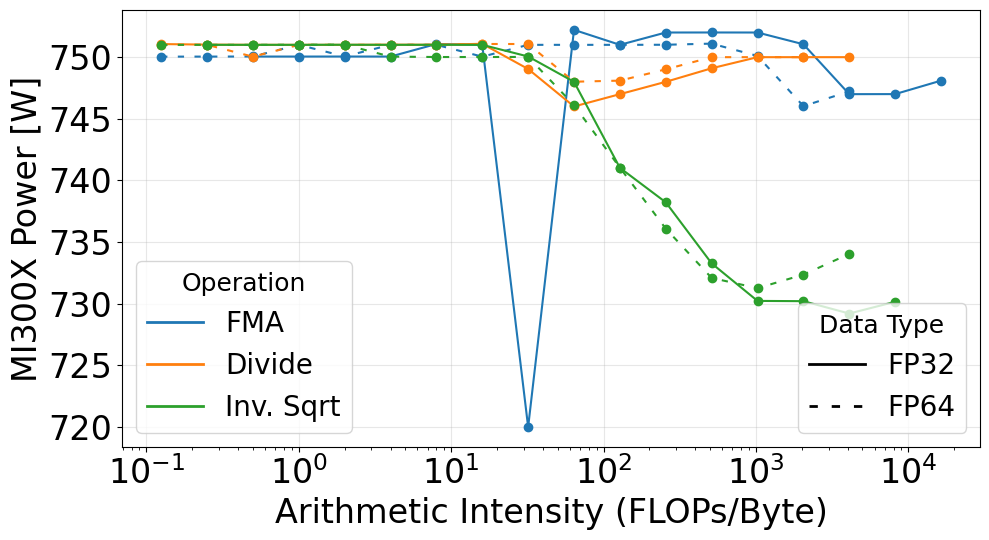

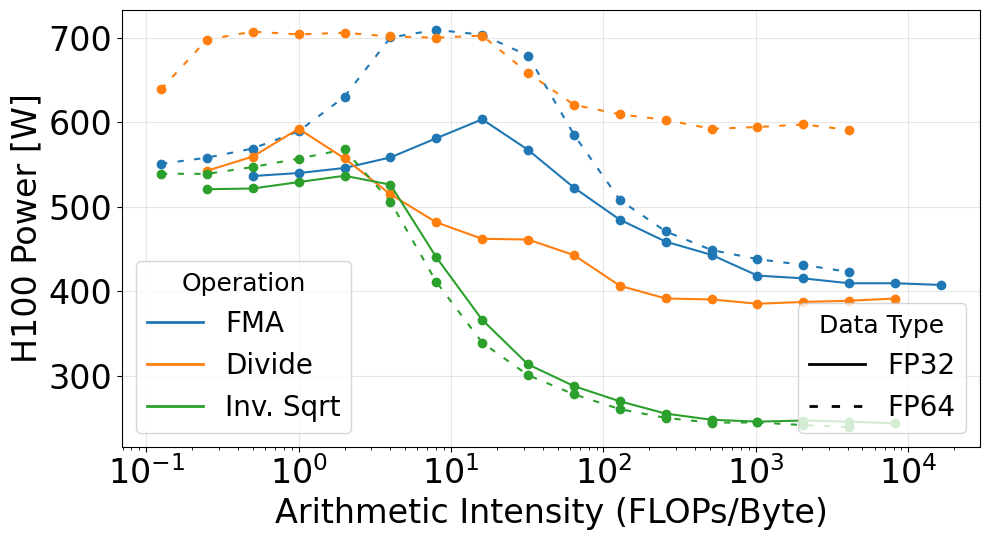

In [18]:
!mkdir -p "./analysis_plots/power_fixed/MI300X/"
!mkdir -p "./analysis_plots/power_fixed/H100/"

# Define colors for operations and line styles for data types
op_colors = {
    'MULADD': 'tab:blue',
    'DIV': 'tab:orange',
    'RSQ': 'tab:green'
}

# linewidth_dict = {'FP32': 4, 'FP64': 2}
data_styles = {'FP32': '-', 'FP64': (0, (3, 5))}

for gpu in ['MI300X', 'H100']:
    plt.figure(figsize=(10, 5.5))
    
    # Store handles for legends
    op_handles = []
    data_handles = []
    
    for op in ['MULADD', 'DIV', 'RSQ']:
        for data in ['FP32', 'FP64']:
            ai_values = []
            max_power_values = []
            for ai in sorted(hw_dfs[gpu][op][data].keys()):
                if ai > 0.1:
                    hw_df = hw_dfs[gpu][op][data][ai]
                    ai_values.append(ai)
                    if gpu == 'MI300X':
                        # Take the top 5 percentile of Power[W] values and compute the mean
                        power_vals = hw_df['Power[W]']
                        top_5 = power_vals.quantile(0.95)
                        # print(op, data, ai, hw_df['Power[W]'].max())
                        
                        if ai == 32 and op == 'MULADD' and data == 'FP32':
                            max_power_values.append(720)
                        else:
                            max_power_values.append(power_vals[power_vals >= top_5].mean())
                    else:
                        power_vals = hw_df['power.draw [W]']
                        top_5 = power_vals.quantile(0.95)
                        max_power_values.append(power_vals[power_vals >= top_5].mean())
            
            if ai_values:
                line = plt.plot(ai_values, max_power_values, marker='o', 
                        color=op_colors[op], linestyle=data_styles[data],
                        label=f'{op_dict[op]} {data}')[0]
                
                # Create legend handles for operations (only once per operation)
                if data == 'FP32':  # Only add operation legend once
                    op_handles.append(plt.Line2D([0], [0], color=op_colors[op], linewidth=2, label=op_dict[op]))
                
                # Create legend handles for data types (only once per data type)
                if op == 'MULADD':  # Only add data type legend once
                    data_handles.append(plt.Line2D([0], [0], color='black', linestyle=data_styles[data], linewidth=2, label=data))
    
    plt.xlabel('Arithmetic Intensity (FLOPs/Byte)', fontsize=24)
    plt.xticks(fontsize=24)
    plt.yticks(fontsize=24)
    plt.xscale('log')
    plt.ylabel(f'{gpu} Power [W]', fontsize=24)
    # plt.title(f'{gpu}: Power Output Across AI')
    
    # Create two legends
    op_legend = plt.legend(handles=op_handles, title='Operation', loc='lower left', fontsize=20, title_fontsize=18)
    data_legend = plt.legend(handles=data_handles, title='Data Type', loc='lower right', fontsize=20, title_fontsize=18)
    
    # Add the first legend back to the plot
    plt.gca().add_artist(op_legend)
    
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(f'./analysis_plots/power/{gpu}_combined_power.png')
    plt.show()

In [8]:
hw_dfs['MI300X']['DIV']['FP64'].keys()

dict_keys([np.float64(0.125), np.float64(0.25), np.float64(0.5), np.float64(1.0), np.float64(2.0), np.float64(4.0), np.float64(8.0), np.float64(16.0), np.float64(32.0), np.float64(64.0), np.float64(128.0), np.float64(256.0), np.float64(512.0), np.float64(1024.0), np.float64(2048.0), np.float64(4096.0)])

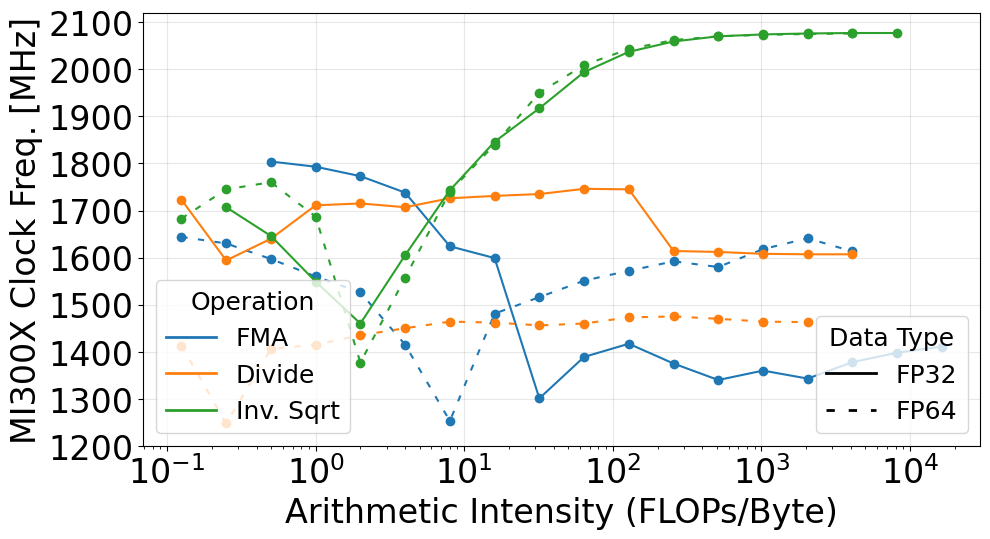

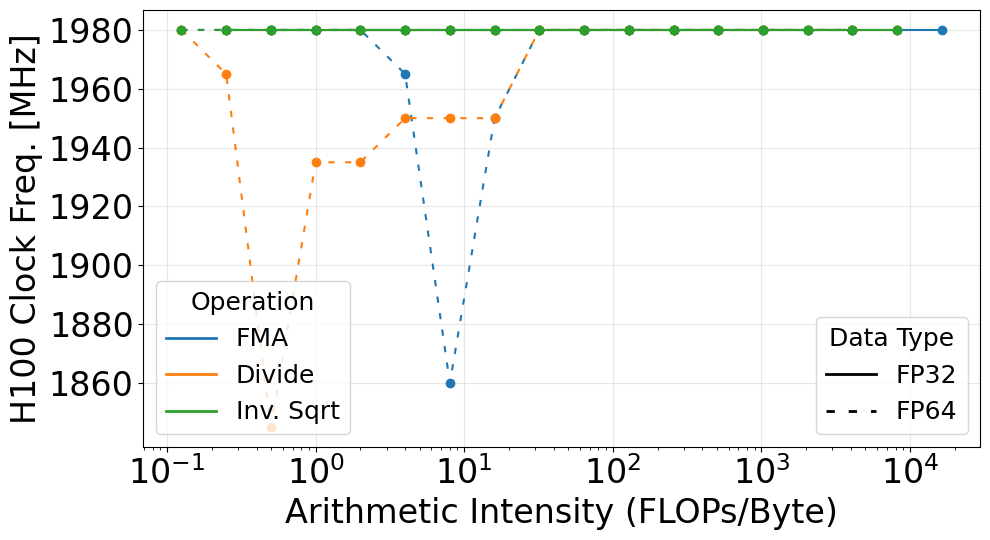

In [21]:
# !mkdir -p "./analysis_plots/power/MI300X/"
# !mkdir -p "./analysis_plots/power/H100/"

# Define colors for operations and line styles for data types
op_colors = {
    'MULADD': 'tab:blue',
    'DIV': 'tab:orange',
    'RSQ': 'tab:green'
}

# linewidth_dict = {'FP32': 4, 'FP64': 2}
data_styles = {'FP32': '-', 'FP64': (0, (3, 5))}

for gpu in ['MI300X', 'H100']:
    plt.figure(figsize=(10, 5.5))
    
    # Store handles for legends
    op_handles = []
    data_handles = []
    
    for op in ['MULADD', 'DIV', 'RSQ']:
        for data in ['FP32', 'FP64']:
            ai_values = []
            max_power_values = []
            for ai in sorted(hw_dfs[gpu][op][data].keys()):
                hw_df = hw_dfs[gpu][op][data][ai]
                if ai > 0.1:
                    ai_values.append(ai)
                    if gpu == 'MI300X':
                        # Take the top 5 percentile of Power[W] values and compute the mean
                        # power_vals = hw_df['Power[W]']
                        # top_5 = power_vals.quantile(0.95)
                        # print(op, data, ai, hw_df['Power[W]'].max())
                        max_power_values.append(hw_df['Clk_system[MHz]'].median())
                    else:
                        # power_vals = hw_df['power.draw [W]']
                        # top_5 = power_vals.quantile(0.95)
                        max_power_values.append(hw_df['clocks.current.sm [MHz]'].median())
            
            if ai_values:
                line = plt.plot(ai_values, max_power_values, marker='o', 
                        color=op_colors[op], linestyle=data_styles[data],
                        label=f'{op_dict[op]} {data}')[0]
                
                # Create legend handles for operations (only once per operation)
                if data == 'FP32':  # Only add operation legend once
                    op_handles.append(plt.Line2D([0], [0], color=op_colors[op], linewidth=2, label=op_dict[op]))
                
                # Create legend handles for data types (only once per data type)
                if op == 'MULADD':  # Only add data type legend once
                    data_handles.append(plt.Line2D([0], [0], color='black', linestyle=data_styles[data], linewidth=2, label=data))
    
    plt.xlabel('Arithmetic Intensity (FLOPs/Byte)', fontsize=24)
    plt.xticks(fontsize=24)
    plt.yticks(fontsize=24)
    if gpu == 'MI300X':
        plt.yticks(np.arange(1200, 2200, 100), fontsize=24)
    if gpu == 'H100':
        plt.yticks(np.arange(1860, 2000, 20), fontsize=24)
    plt.xscale('log')
    plt.ylabel(f'{gpu} Clock Freq. [MHz]', fontsize=24)
    # plt.title(f'{gpu}: Power Output Across AI')
    
    # Create two legends
    op_legend = plt.legend(handles=op_handles, title='Operation', loc='lower left', fontsize=18, title_fontsize=18)
    data_legend = plt.legend(handles=data_handles, title='Data Type', loc='lower right', fontsize=18, title_fontsize=18)
    
    # Add the first legend back to the plot
    plt.gca().add_artist(op_legend)
    
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(f'./analysis_plots/freq/{gpu}_combined_freq.png')
    plt.show()

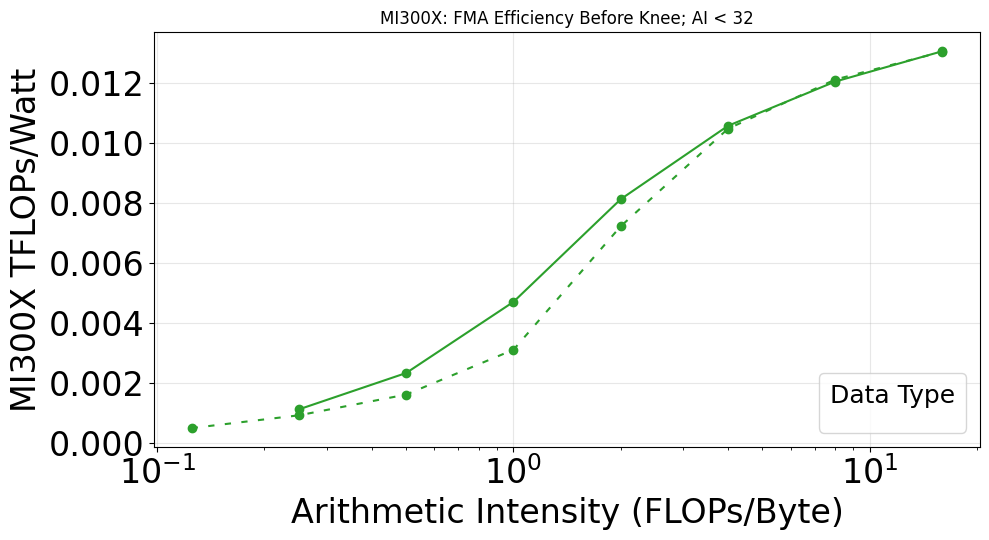

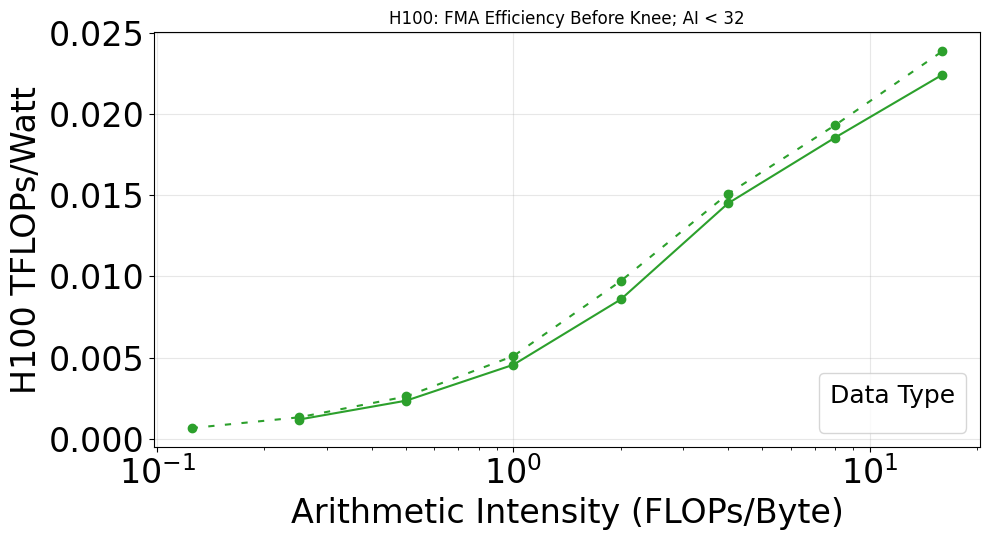

In [80]:
!mkdir -p "./analysis_plots/eff/MI300X/"
!mkdir -p "./analysis_plots/eff/H100/"

# Define colors for operations and line styles for data types
op_colors = {
    'MULADD': 'tab:blue',
    'DIV': 'tab:orange',
    'RSQ': 'tab:green'
}

# linewidth_dict = {'FP32': 4, 'FP64': 2}
data_styles = {'FP32': '-', 'FP64': (0, (3, 5))}

mi300x_effs = defaultdict(lambda: defaultdict(dict))
h100_effs = defaultdict(lambda: defaultdict(dict))

for gpu in ['MI300X', 'H100']:
    plt.figure(figsize=(10, 5.5))
    
    # Store handles for legends
    op_handles = []
    data_handles = []
    
    for op in ['RSQ']:
        for data in ['FP32', 'FP64']:
            ai_values = []
            max_power_values = []
            for ai in sorted(hw_dfs[gpu][op][data].keys()):
                if ai < 32:
                    hw_df = hw_dfs[gpu][op][data][ai]
                    ai_values.append(ai)
                    if gpu == 'MI300X':
                        # Take the top 5 percentile of Power[W] values and compute the mean
                        power_vals = hw_df['Power[W]']
                        top_5 = power_vals.quantile(0.95)
                        # print(op, data, ai, hw_df['Power[W]'].max())
                        
                    else:
                        power_vals = hw_df['power.draw [W]']
                        top_5 = power_vals.quantile(0.95)
                        # max_power_values.append(df[(df['GPU'] == gpu) & (df['OP'] == op) & (df['DATA'] == data) & (df['AI'] == ai)]['PERF'].max() / power_vals[power_vals >= top_5].mean())
                    eff = df[(df['GPU'] == gpu) & (df['OP'] == op) & (df['DATA'] == data) & (df['AI'] == ai)]['PERF'].max() / power_vals[power_vals >= top_5].mean()
                    max_power_values.append(eff)
                    if gpu == 'MI300X':
                        mi300x_effs[op][data][ai] = eff
                    if gpu == 'H100':
                        h100_effs[op][data][ai] = eff
            if ai_values:
                line = plt.plot(ai_values, max_power_values, marker='o', 
                        color=op_colors[op], linestyle=data_styles[data],
                        label=f'{op_dict[op]} {data}')[0]
                
                # Create legend handles for operations (only once per operation)
                if data == 'FP32':  # Only add operation legend once
                    op_handles.append(plt.Line2D([0], [0], color=op_colors[op], linewidth=2, label=op_dict[op]))
                
                # Create legend handles for data types (only once per data type)
                if op == 'MULADD':  # Only add data type legend once
                    data_handles.append(plt.Line2D([0], [0], color='black', linestyle=data_styles[data], linewidth=2, label=data))
    
    plt.xlabel('Arithmetic Intensity (FLOPs/Byte)', fontsize=24)
    plt.xticks(fontsize=24)
    plt.yticks(fontsize=24)
    plt.xscale('log')
    plt.ylabel(f'{gpu} TFLOPs/Watt', fontsize=24)
    plt.title(f'{gpu}: FMA Efficiency Before Knee; AI < 32')
    
    # Create two legends
    # op_legend = plt.legend(handles=op_handles, title='Operation', loc='lower left', fontsize=20, title_fontsize=18)
    plt.legend(handles=data_handles, title='Data Type', loc='lower right', fontsize=20, title_fontsize=18)
    
    # Add the first legend back to the plot
    # plt.gca().add_artist(op_legend)
    
    plt.grid(alpha=0.3)
    plt.tight_layout()
    # plt.savefig(f'./analysis_plots/eff/{gpu}_combined_power.png')
    plt.show()

In [ ]:
for op in mi300x_effs.keys():
    for data in mi300x_effs[op].keys():
        for ai in mi300x_effs[op][data].keys():
            print(op, data, ai)
            print(mi300x_effs[op][data][ai] - h100_effs[op][data][ai]) / 100)

MULADD FP32 0.5
4.040148317090144e-06
MULADD FP32 1.0
7.751410446813792e-06
MULADD FP32 2.0
1.4214645394182365e-05
MULADD FP32 4.0
2.8666794702134936e-05
MULADD FP32 8.0
7.304732775886895e-05
MULADD FP32 16.0
6.793212785541916e-05
MULADD FP32 32.0
0.00022522213828831504
MULADD FP32 64.0
0.00031712789721907524
MULADD FP32 128.0
0.00039627915535226125
MULADD FP32 256.0
0.0003525492239274503
MULADD FP32 512.0
0.0002737101240987859
MULADD FP32 1024.0
0.00029420251290671913
MULADD FP32 2048.0
0.00028267551253161825
MULADD FP32 4096.0
0.00029965458692128436
MULADD FP32 8192.0
0.0003178424372245714
MULADD FP32 16384.0
0.0003125533966331216
MULADD FP64 0.125
1.3927530189124064e-06
MULADD FP64 0.25
2.6187684169431695e-06
MULADD FP64 0.5
4.7592228674435456e-06
MULADD FP64 1.0
8.147926899131482e-06
MULADD FP64 2.0
1.7834972798159198e-05
MULADD FP64 4.0
3.816057591436871e-05
MULADD FP64 8.0
6.563857095149458e-05
MULADD FP64 16.0
0.000157194138049068
MULADD FP64 32.0
0.00024761640448496796
MULADD F

KeyError: np.float64(0.125)

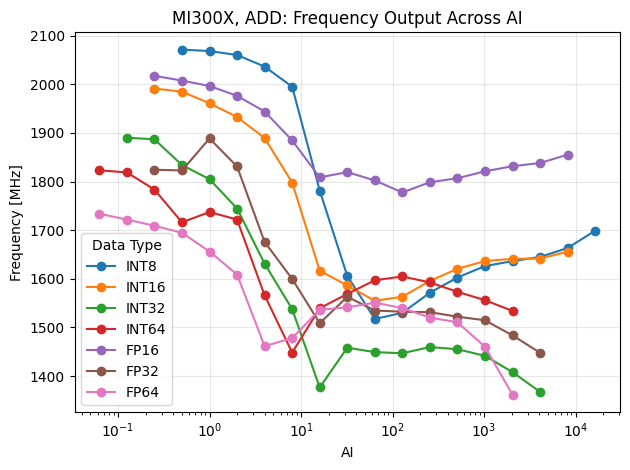

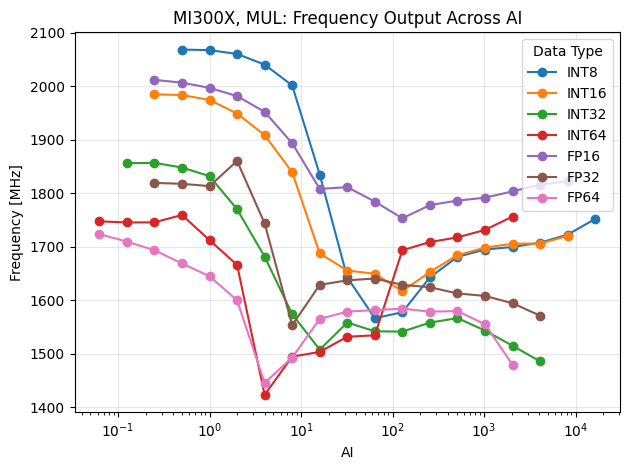

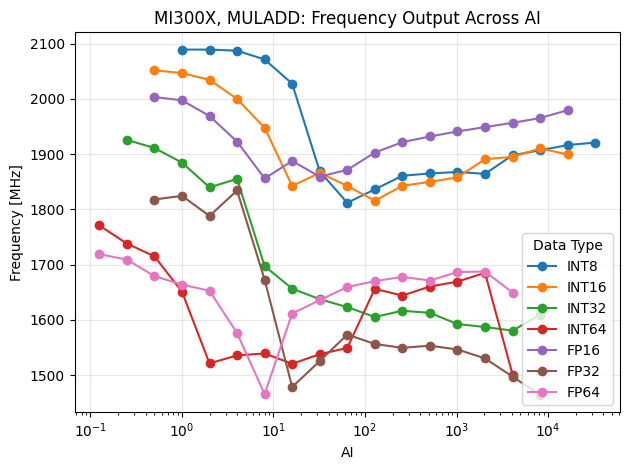

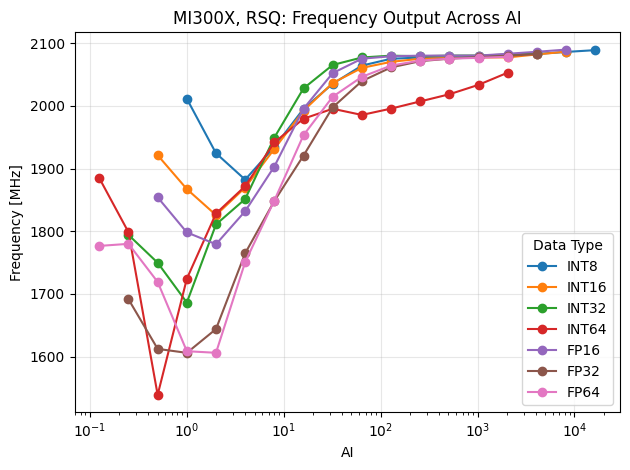

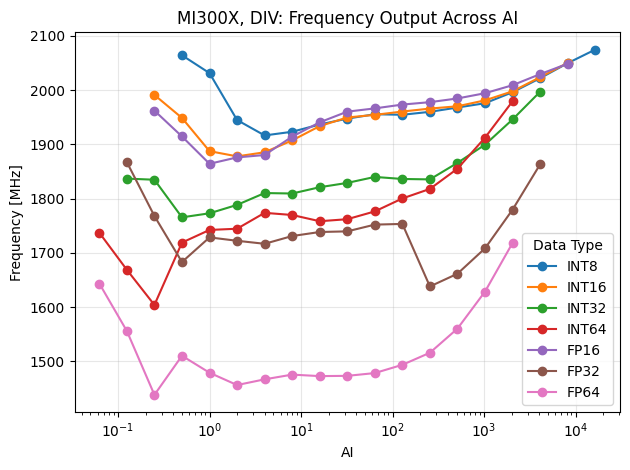

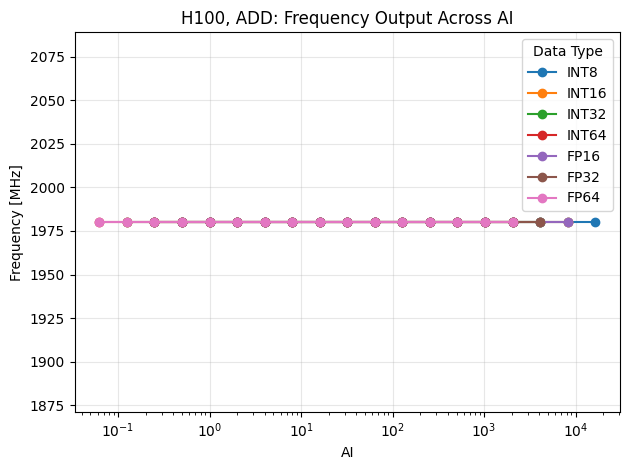

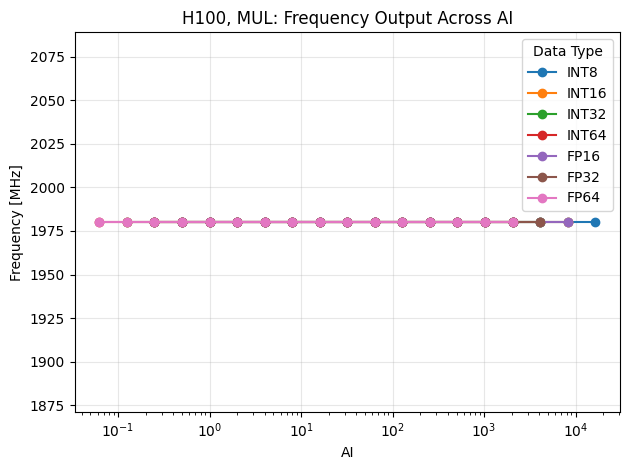

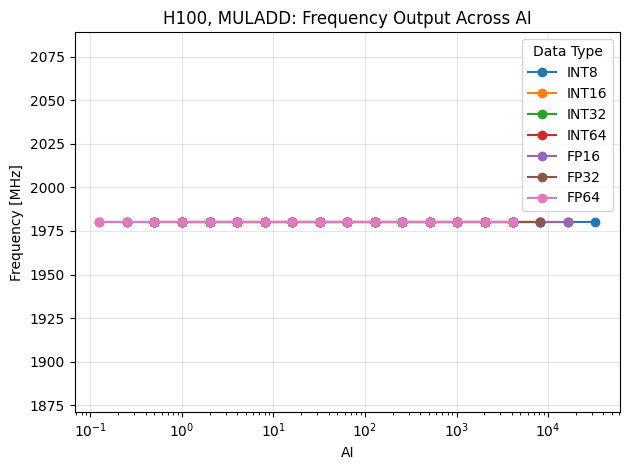

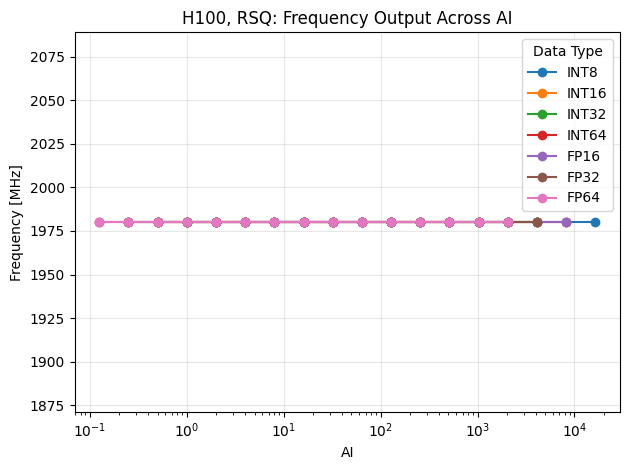

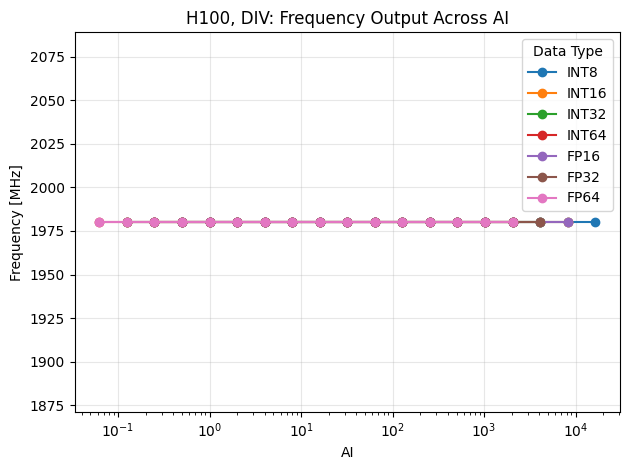

In [ ]:
!mkdir -p "./analysis_plots/freq/MI300X/"
!mkdir -p "./analysis_plots/freq/H100/"
for gpu in hw_dfs.keys():
    for op in hw_dfs[gpu].keys():
        # plt.figure(figsize=(10, 6))
        for data in hw_dfs[gpu][op].keys():
            ai_values = []
            max_power_values = []
            for ai in sorted(hw_dfs[gpu][op][data].keys()):
                hw_df = hw_dfs[gpu][op][data][ai]
                # if 'Power [W]' in hw_df.columns:
                # print(hw_df.columns)
                ai_values.append(ai)
                if gpu == 'MI300X':
                    # Take the top 5 percentile of Power[W] values and compute the mean
                    power_vals = hw_df['Clk_system[MHz]']
                    top_5 = power_vals.quantile(0.95)
                    max_power_values.append(power_vals[power_vals >= top_5].mean())
                else:
                    power_vals = hw_df['clocks.current.sm [MHz]']
                    top_5 = power_vals.quantile(0.95)
                    max_power_values.append(power_vals[power_vals >= top_5].mean())
            if ai_values:
                plt.plot(ai_values, max_power_values, marker='o', label=data)
        plt.xlabel('AI')
        plt.xscale('log')
        plt.ylabel('Frequency [MHz]')
        # plt.ylim(700, 800)
        plt.title(f'{gpu}, {op}: Frequency Output Across AI')
        plt.legend(title='Data Type')
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.savefig(f'./analysis_plots/freq/{gpu}/{op}_freq.png')
        plt.show()

In [1]:
hw_dfs

NameError: name 'hw_dfs' is not defined

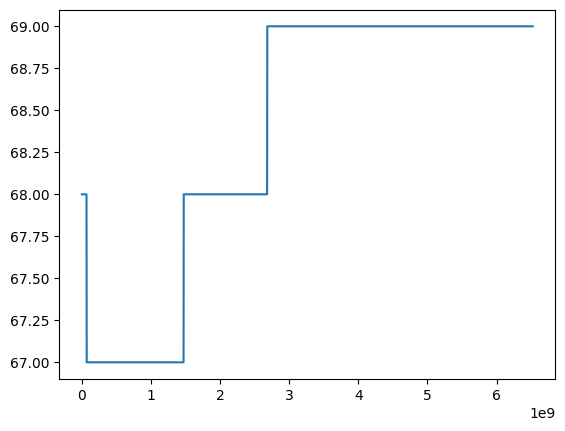

In [266]:
test_df = hw_dfs['MI300X']['ADD']['FP32'][4]
test_df['Timestamp'] = test_df['Timestamp'] - test_df.iloc[0]['Timestamp']

plt.plot(test_df['Timestamp'], test_df['Temp_junction[C]'])

In [271]:
test_df = hw_dfs['H100']['ADD']['FP32'][4]
test_df

,timestamp,power.draw [W],temperature.gpu,clocks.current.sm [MHz]
0,2025/04/20 13:52:07.768,352.50,57,1980 MHz
1,2025/04/20 13:52:07.788,352.50,57,1980 MHz
2,2025/04/20 13:52:07.798,352.50,57,1980 MHz
3,2025/04/20 13:52:07.808,345.27,57,1980 MHz
4,2025/04/20 13:52:07.818,345.27,57,1980 MHz
...,...,...,...,...
500,2025/04/20 13:52:12.812,607.86,68,1980 MHz
501,2025/04/20 13:52:12.822,607.86,63,1980 MHz
502,2025/04/20 13:52:12.832,607.86,63,1980 MHz
503,2025/04/20 13:52:12.842,607.86,63,1980 MHz


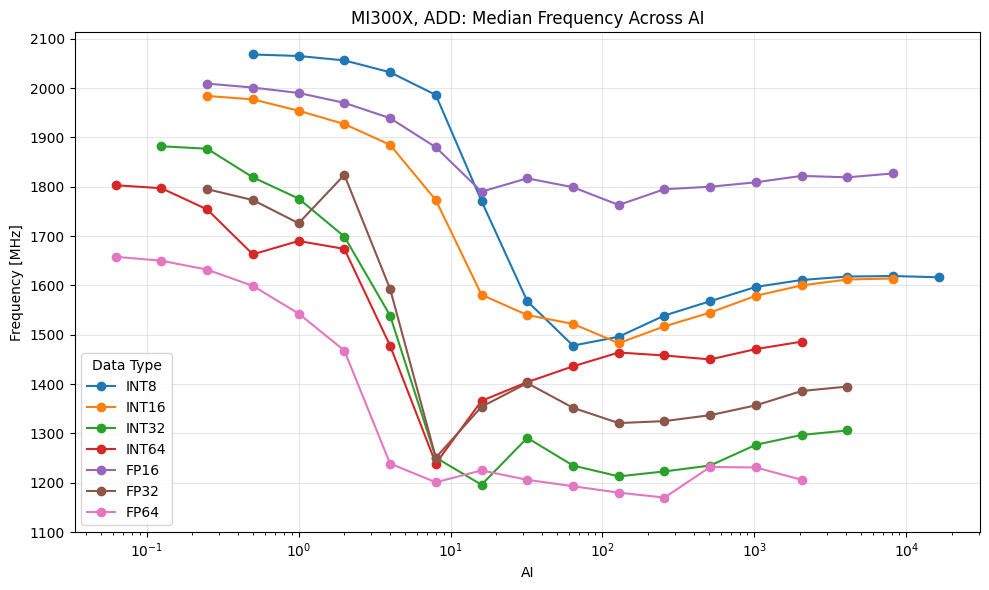

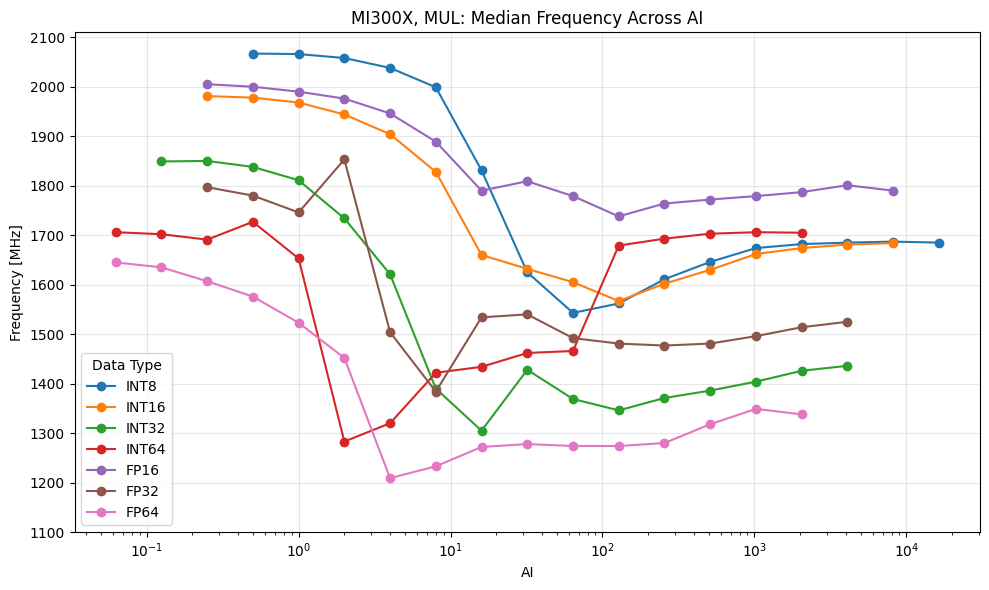

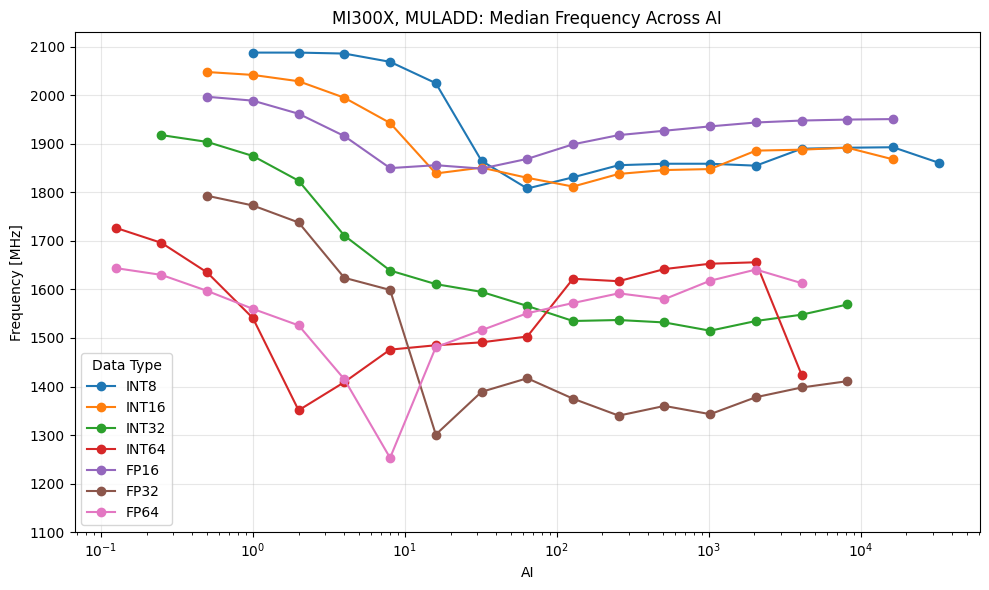

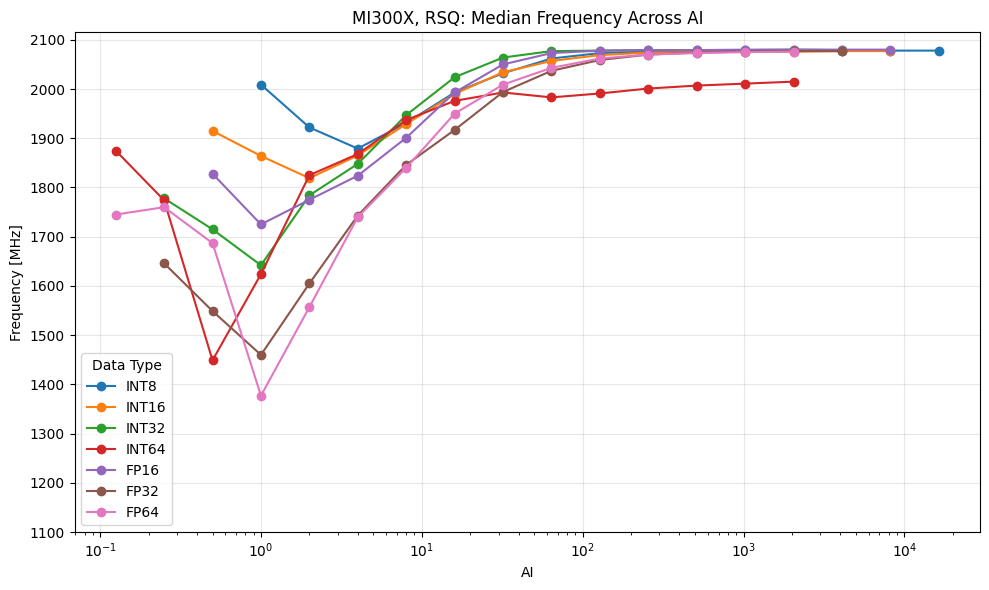

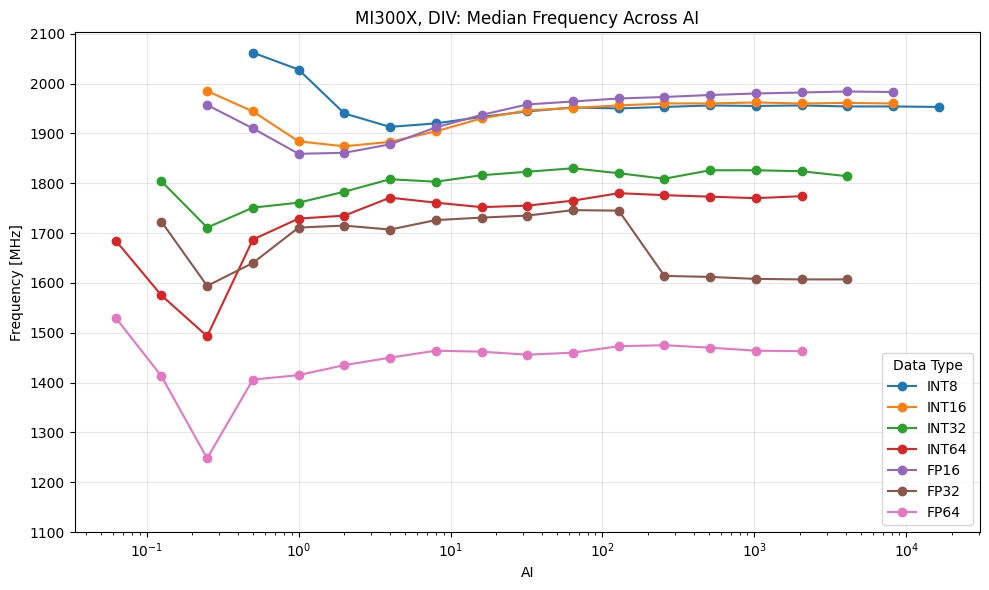

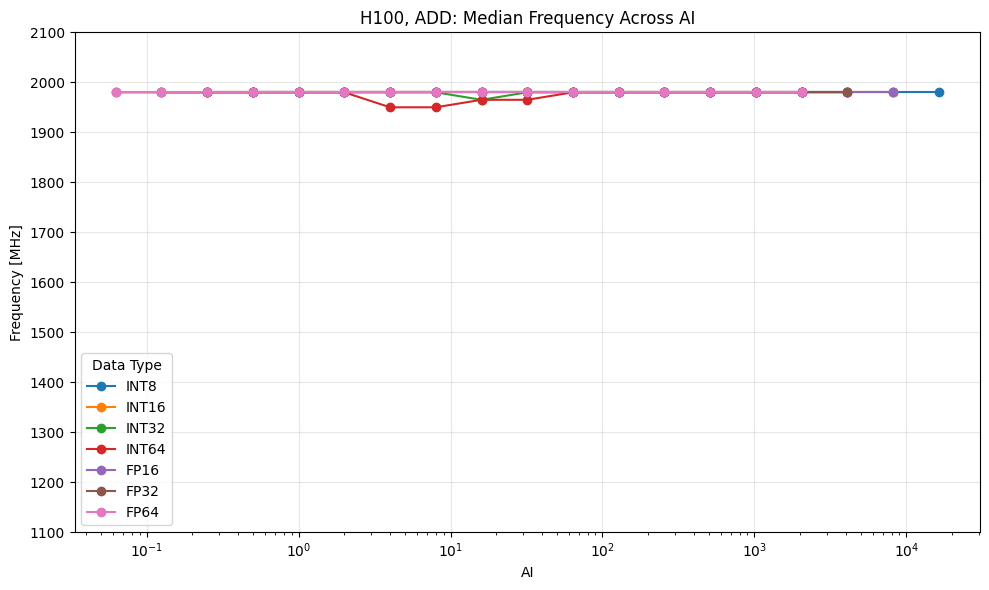

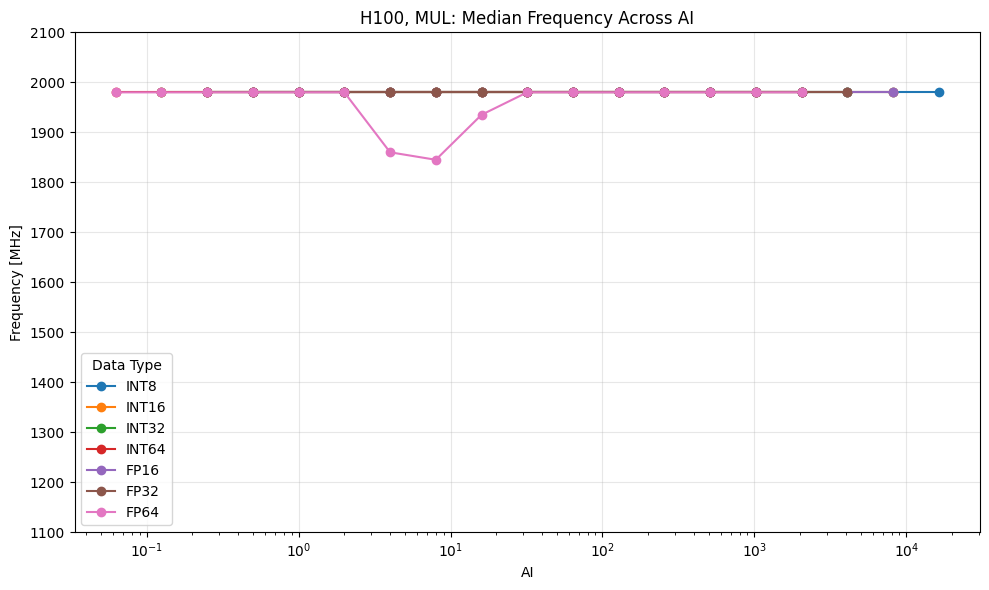

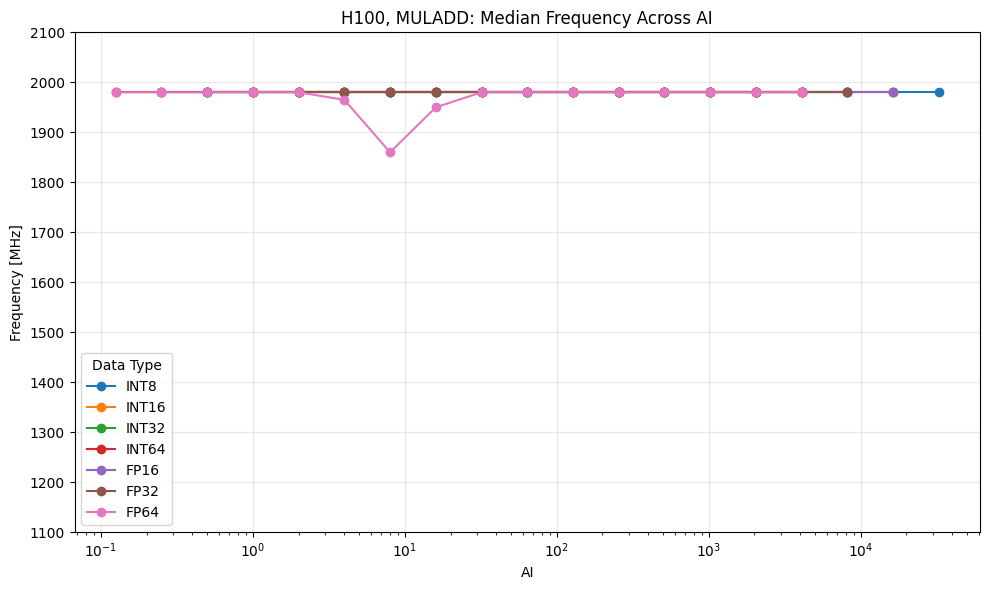

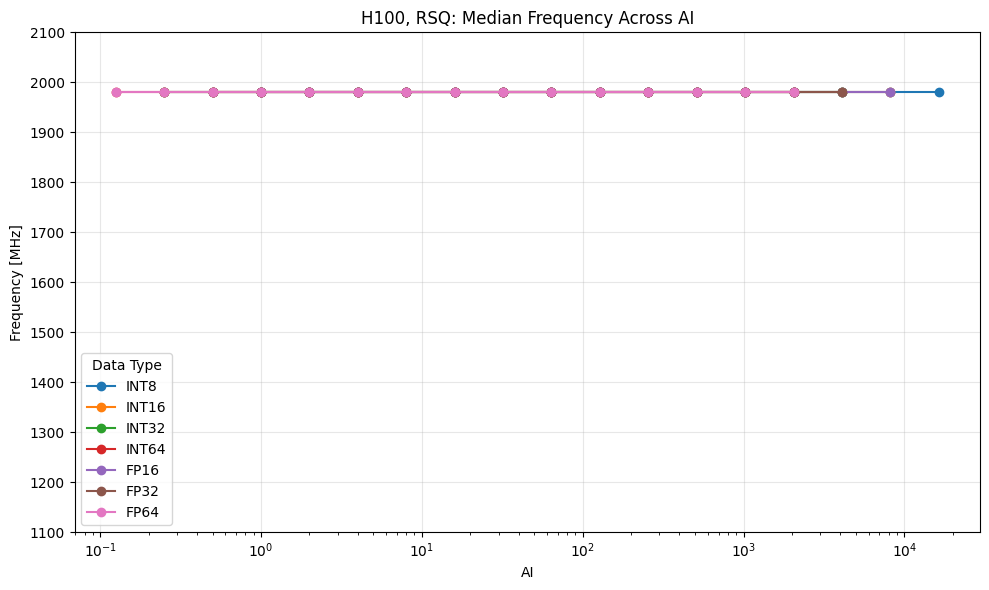

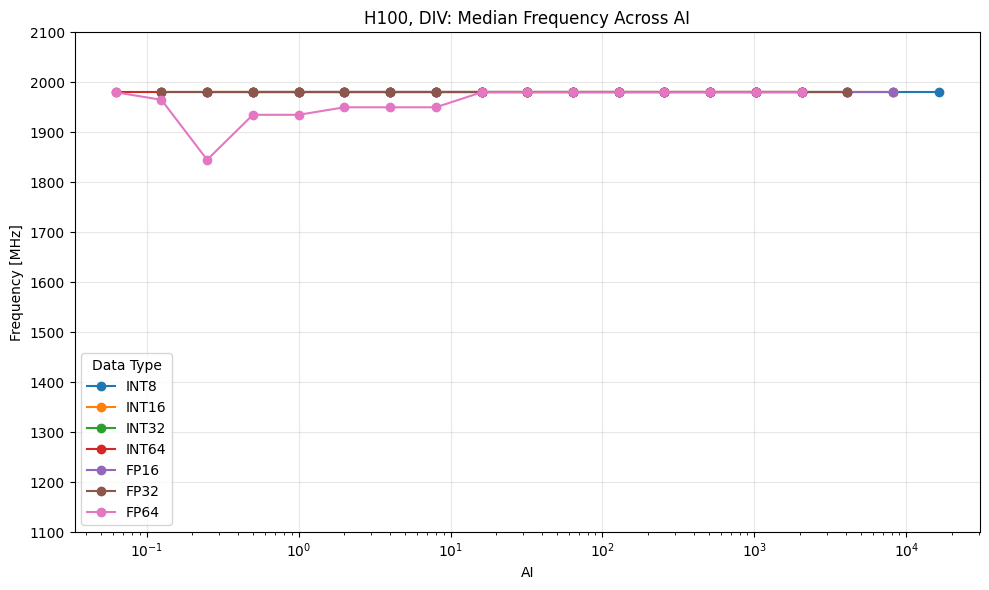

In [275]:
!mkdir -p "./analysis_plots/freq/MI300X/"
!mkdir -p "./analysis_plots/freq/H100/"
for gpu in hw_dfs.keys():
    for op in hw_dfs[gpu].keys():
        plt.figure(figsize=(10, 6))
        for data in hw_dfs[gpu][op].keys():
            ai_values = []
            max_power_values = []
            for ai in sorted(hw_dfs[gpu][op][data].keys()):
                hw_df = hw_dfs[gpu][op][data][ai]
                # if 'Power [W]' in hw_df.columns:
                # print(hw_df.columns)
                ai_values.append(ai)
                if gpu == 'MI300X':
                    max_power_values.append(hw_df['Clk_system[MHz]'].median())
                else:
                    max_power_values.append(hw_df['clocks.current.sm [MHz]'].median())
            if ai_values:
                plt.plot(ai_values, max_power_values, marker='o', label=data)
        plt.xlabel('AI')
        plt.xscale('log')
        plt.ylabel('Frequency [MHz]')
        plt.yticks(np.arange(1100, 2200, 100))
        plt.title(f'{gpu}, {op}: Median Frequency Across AI')
        plt.legend(title='Data Type')
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.savefig(f'./analysis_plots/freq/{gpu}/{op}_freq.png')
        plt.show()

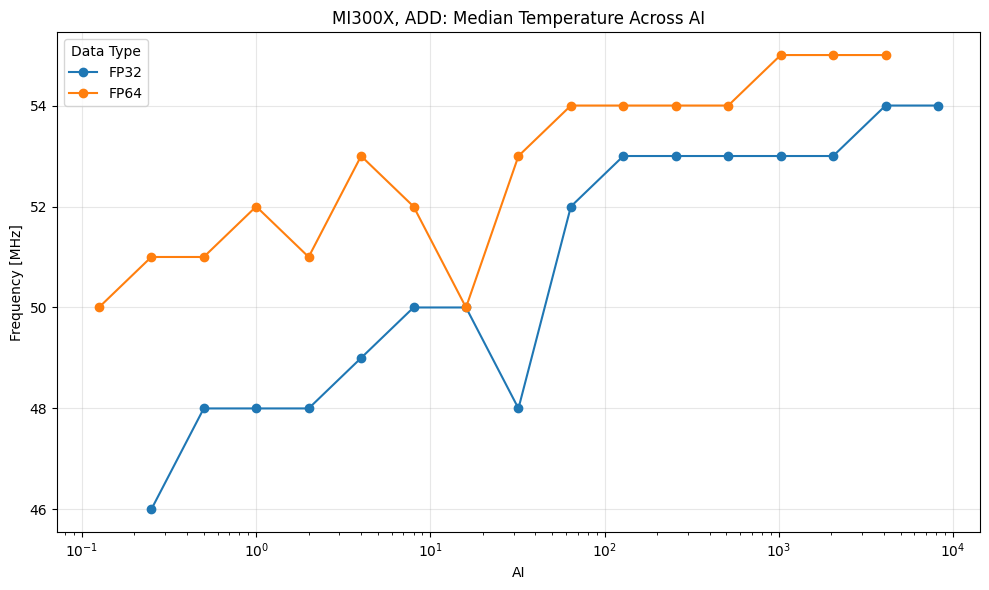

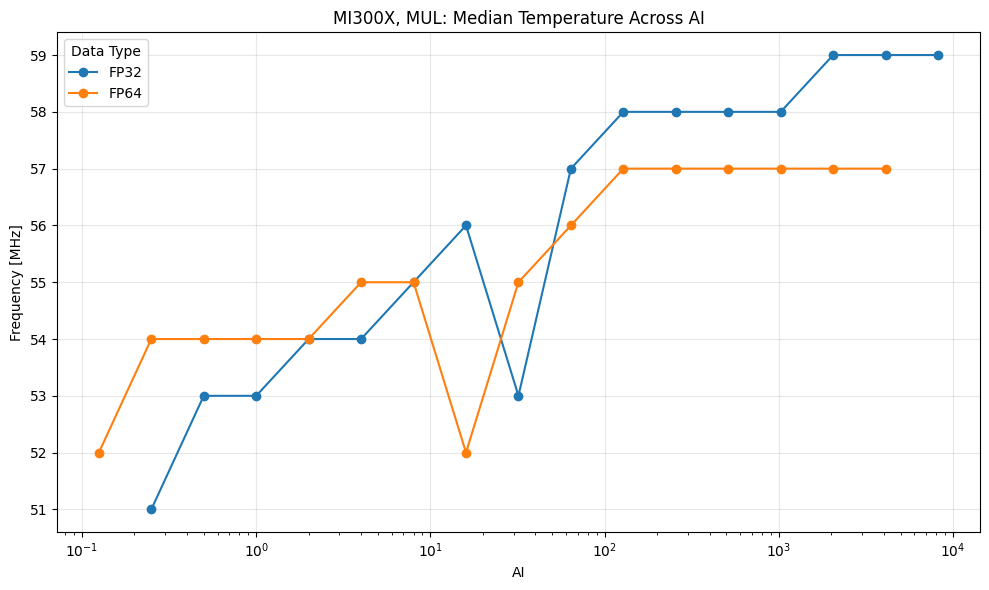

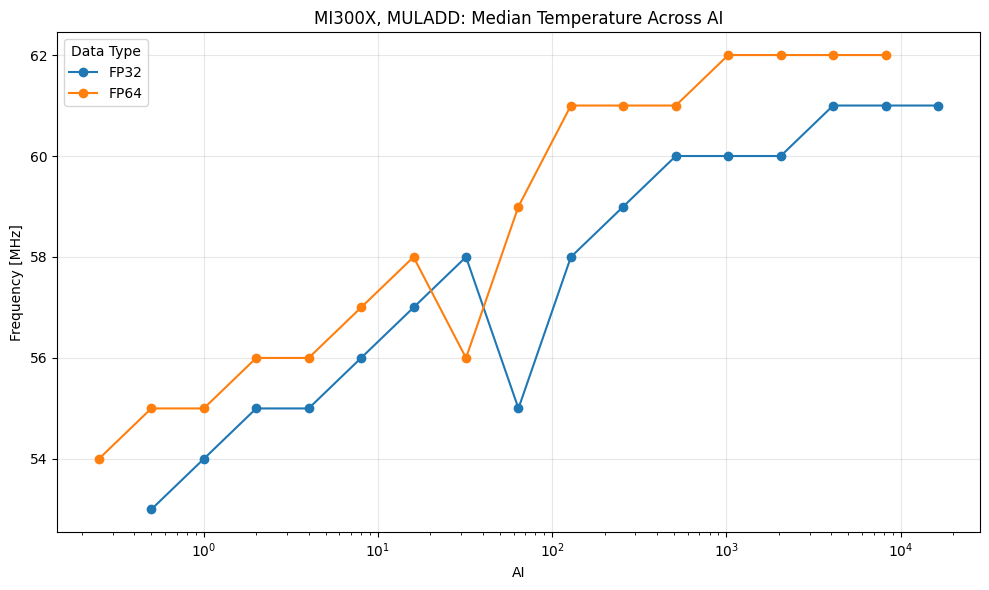

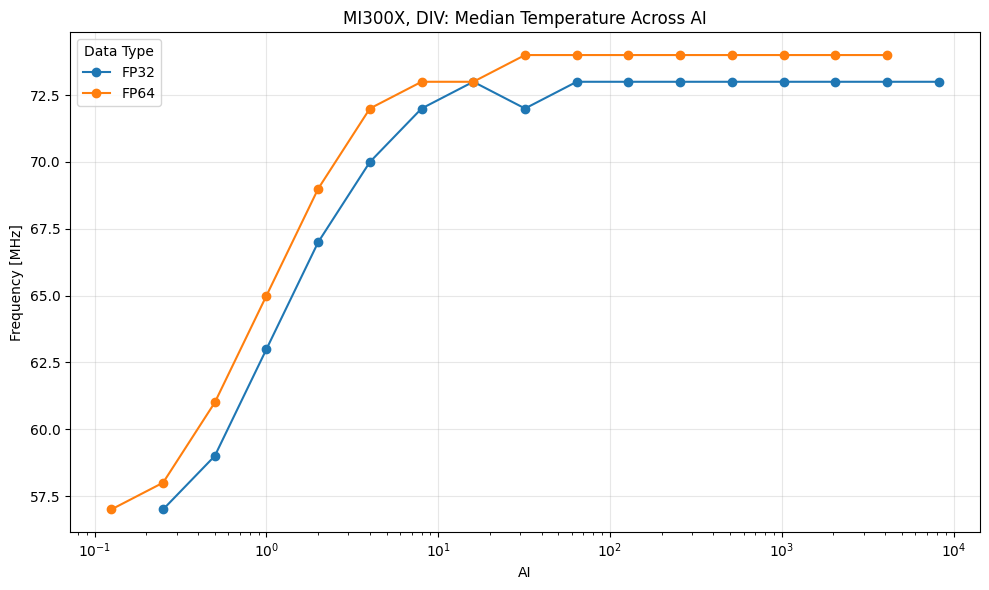

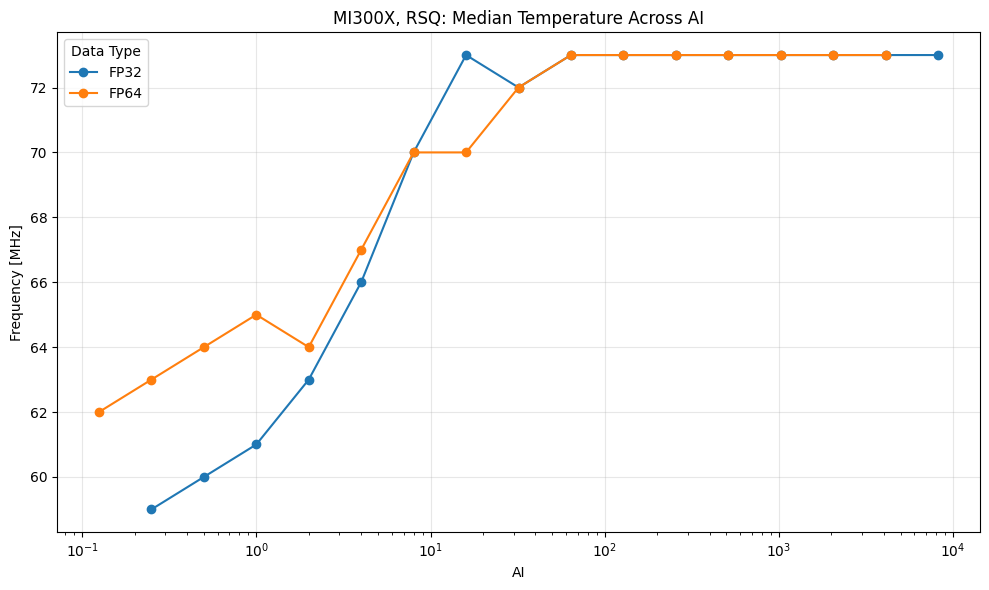

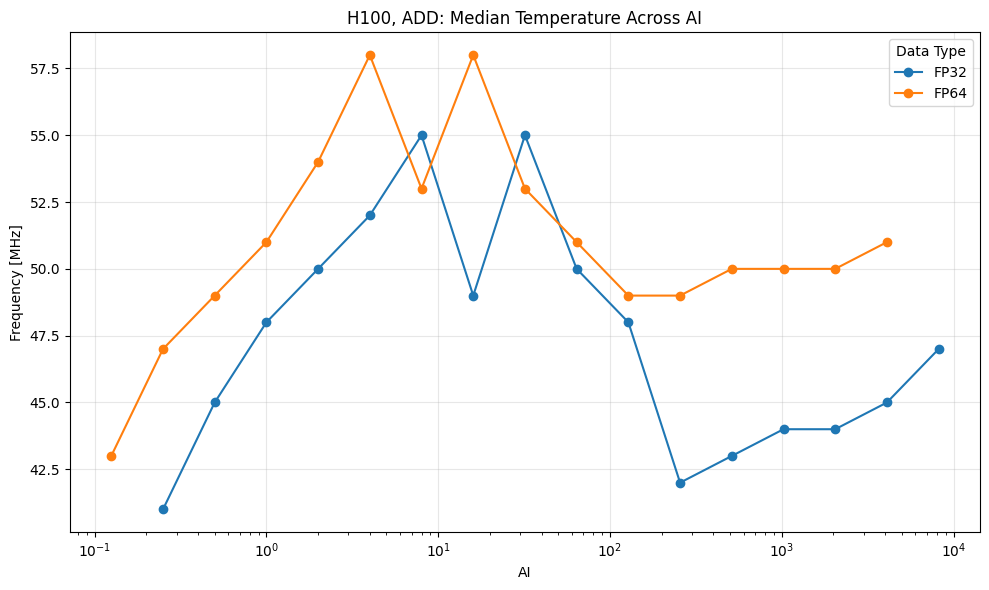

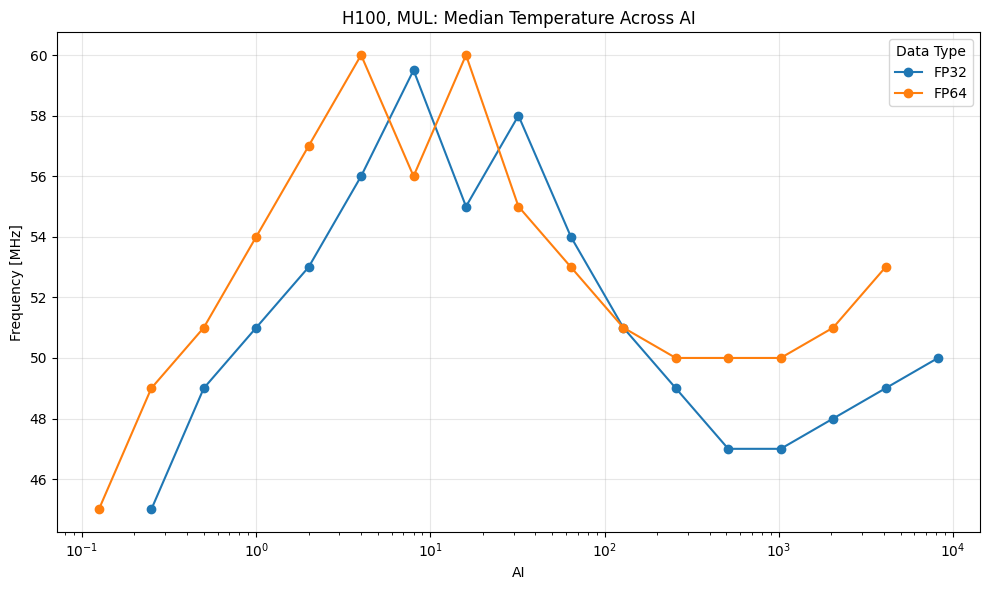

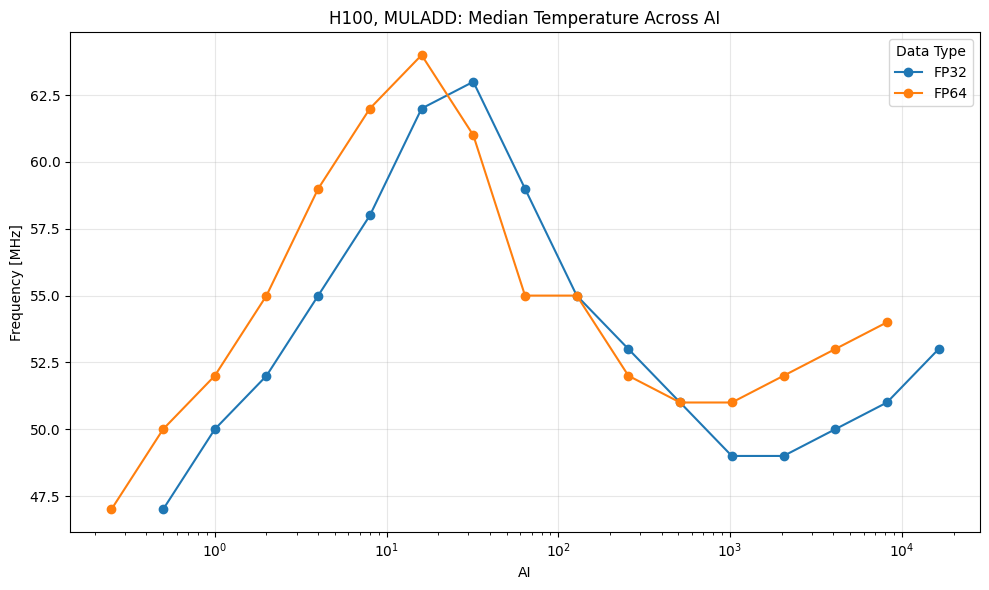

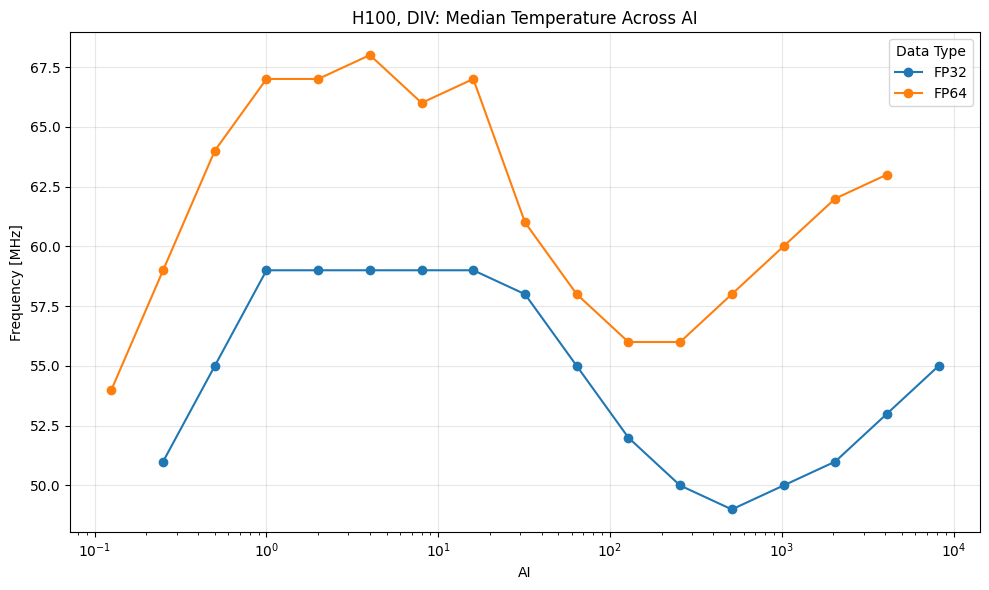

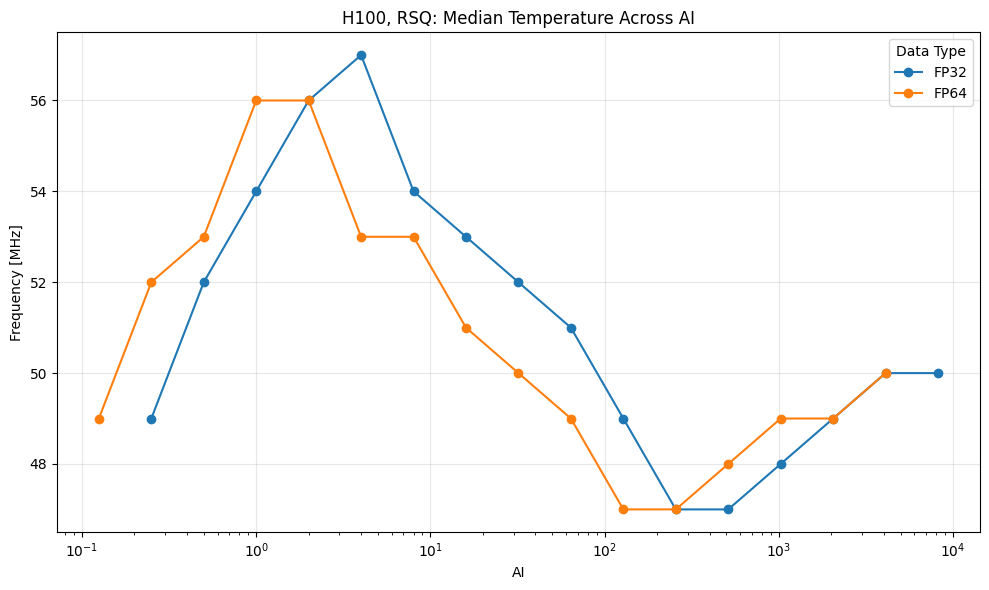

In [181]:
!mkdir -p "./analysis_plots/temp_fixed/MI300X/"
!mkdir -p "./analysis_plots/temp_fixed/H100/"
for gpu in ['MI300X', 'H100']:
    for op in hw_dfs[gpu].keys():
        plt.figure(figsize=(10, 6))
        for data in ['FP32', 'FP64']:
            ai_values = []
            max_power_values = []
            for ai in sorted(hw_dfs[gpu][op][data].keys()):
                hw_df = hw_dfs[gpu][op][data][ai]
                # if 'Power [W]' in hw_df.columns:
                # print(hw_df.columns)
                ai_values.append(ai)
                if gpu == 'MI300X':
                    max_power_values.append(hw_df['Temp_junction[C]'].median())
                else:
                    max_power_values.append(hw_df['temperature.gpu'].median())
            if ai_values:
                plt.plot(ai_values, max_power_values, marker='o', label=data)
        plt.xlabel('AI')
        plt.xscale('log')
        plt.ylabel('Frequency [MHz]')
        # plt.yticks(np.arange(1100, 2200, 100))
        plt.title(f'{gpu}, {op}: Median Temperature Across AI')
        plt.legend(title='Data Type')
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.savefig(f'./analysis_plots/temp_fixed/{gpu}/{op}_temp.png')
        plt.show()

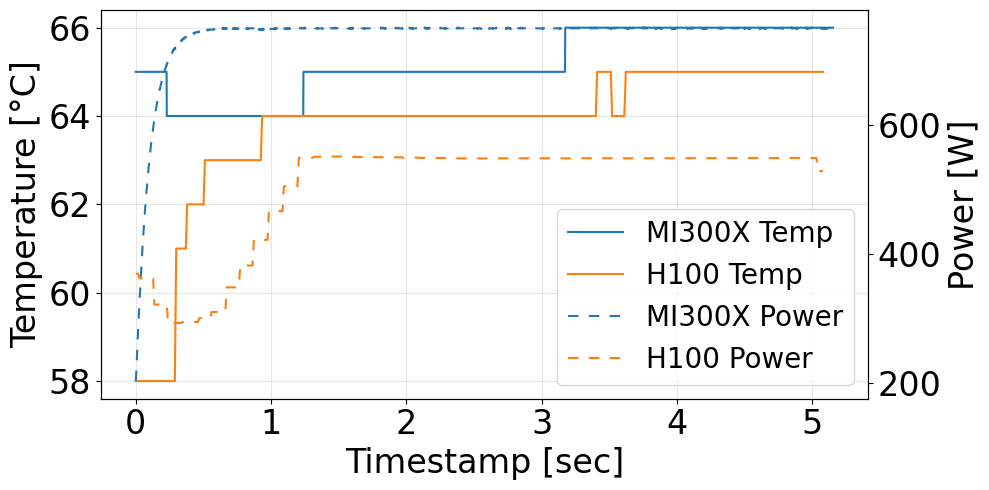

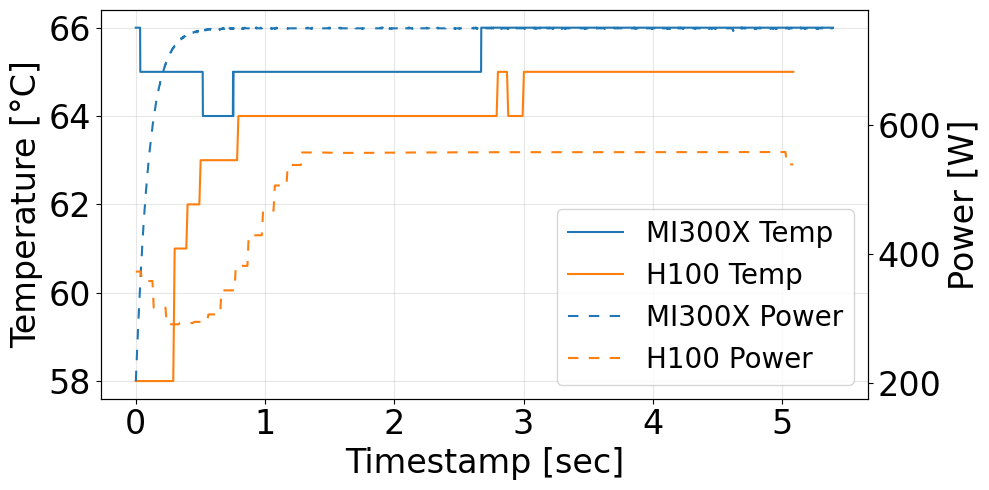

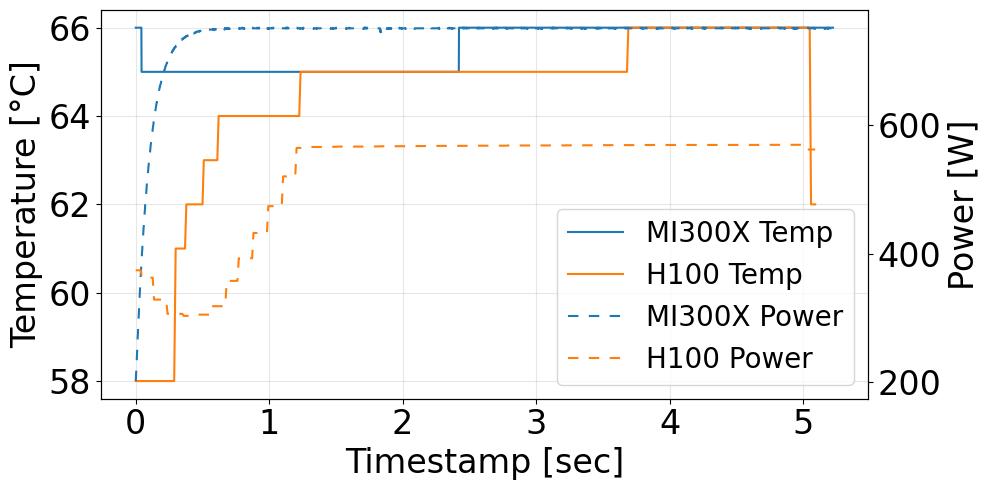

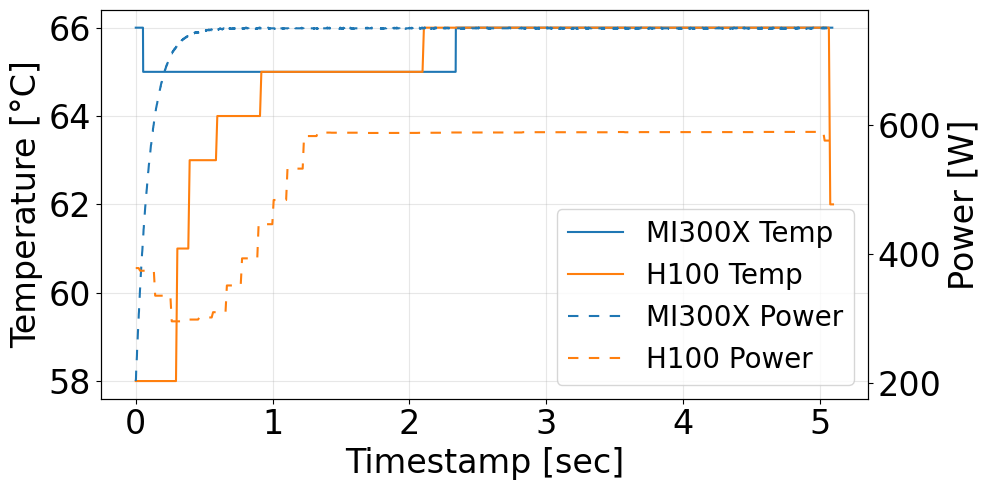

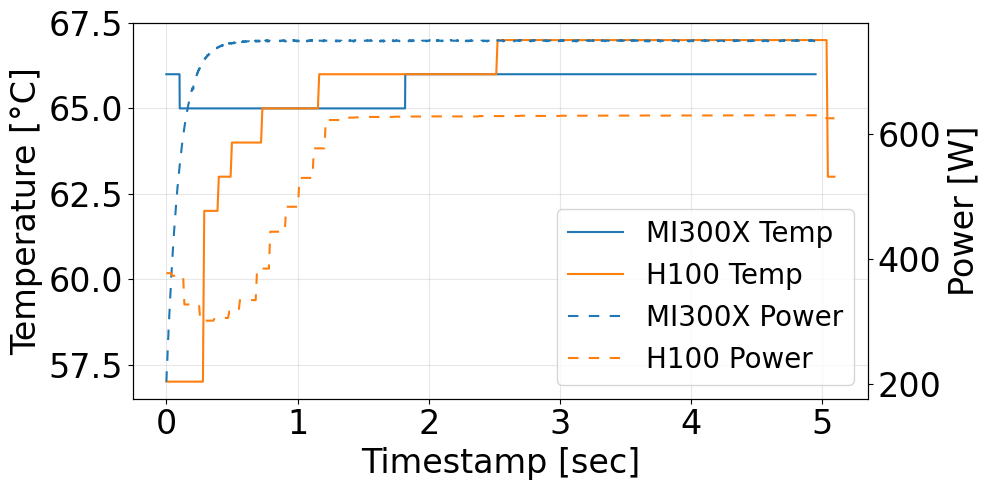

...

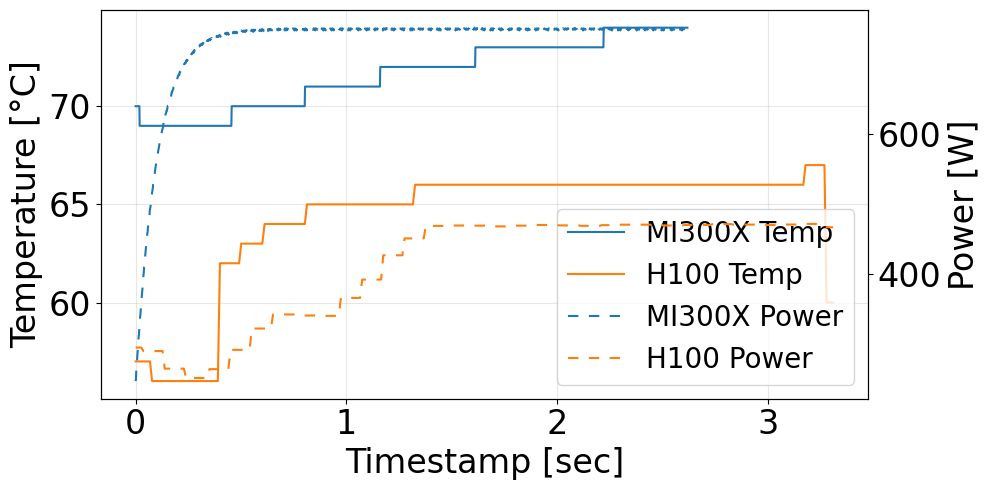

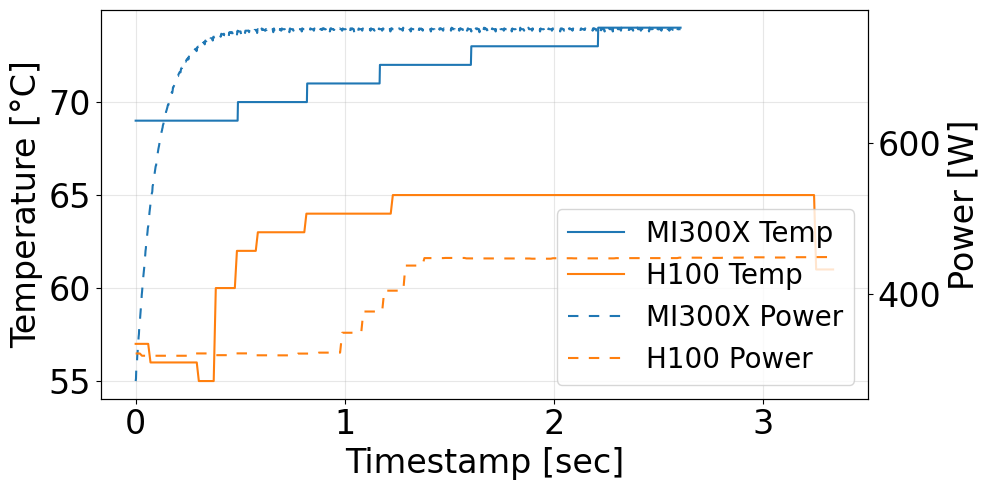

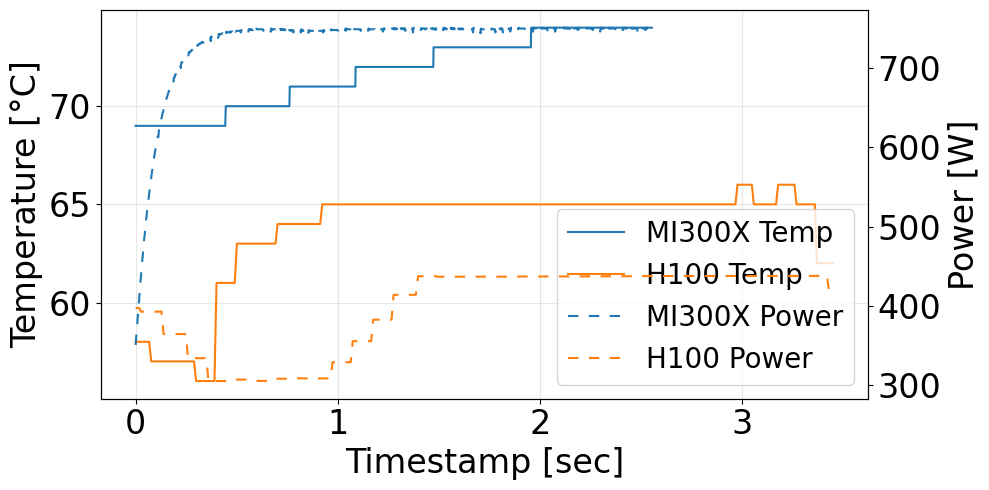

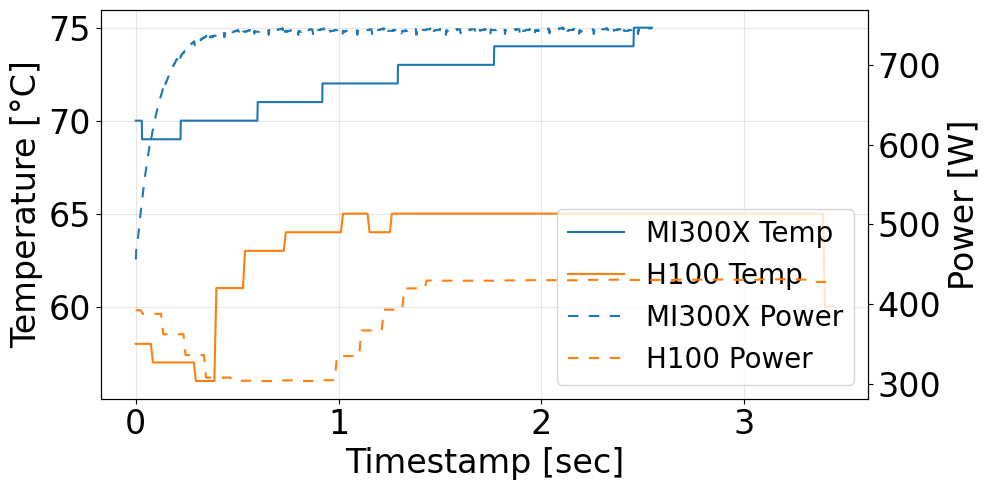

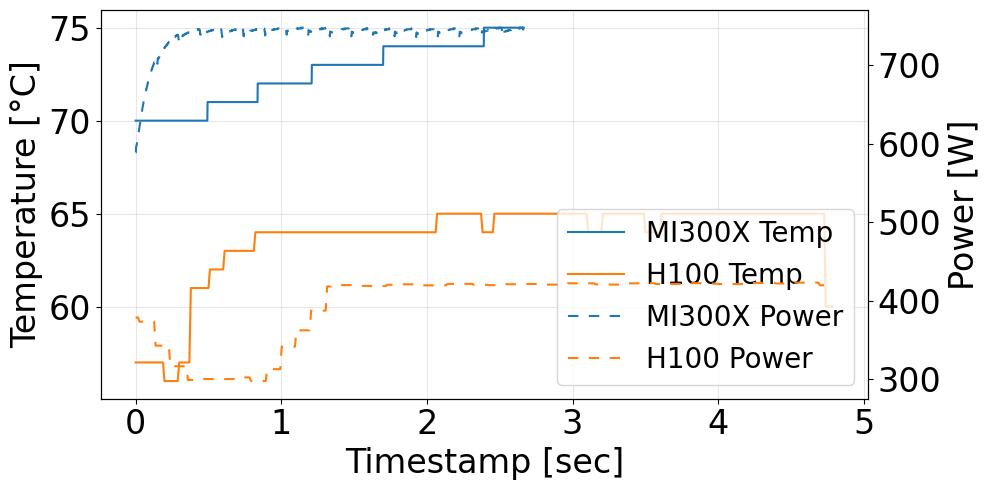

In [301]:
import os

!mkdir -p "./analysis_plots/temp_fixed/comparison/"
# !mkdir -p "./analysis_plots/temp_fixed/H100/"
for op in ['MULADD']:
    for data in ['FP64']:
        for ai in sorted(hw_dfs['MI300X'][op][data].keys()):
            if ai in hw_dfs['H100'][op][data]:
                fig, ax1 = plt.subplots(figsize=(10, 5))
                ax2 = ax1.twinx()
                
                # MI300X data
                hw_df_mi300x = hw_dfs['MI300X'][op][data][ai]
                ax1.plot(hw_df_mi300x['Timestamp'], hw_df_mi300x['Temp_junction[C]'], label='MI300X Temp', color='tab:blue')
                ax2.plot(hw_df_mi300x['Timestamp'], hw_df_mi300x['Power[W]'], label='MI300X Power', color='tab:blue', linestyle=(0, (5, 5)))
                
                # H100 data
                hw_df_h100 = hw_dfs['H100'][op][data][ai]
                ax1.plot(hw_df_h100['timestamp'], hw_df_h100['temperature.gpu'], label='H100 Temp', color='tab:orange')
                ax2.plot(hw_df_h100['timestamp'], hw_df_h100['power.draw [W]'], label='H100 Power', color='tab:orange', linestyle=(0, (5, 5)))
                
                ax1.set_xlabel('Timestamp [sec]', fontsize=24)
                # ax1.set_xticklabels(fontsize=24)
                ax1.tick_params(axis='x', labelsize=24)
                ax1.tick_params(axis='y', labelsize=24)
                ax2.tick_params(axis='y', labelsize=24)
                ax1.set_ylabel('Temperature [°C]', fontsize=24, color='black')
                ax2.set_ylabel('Power [W]', fontsize=24, color='black')
                # ax1.set_title(f'{op_dict[op]}, {data}, AI={ai} - Temperature and Power Comparison')
                
                # Combine legends
                lines1, labels1 = ax1.get_legend_handles_labels()
                lines2, labels2 = ax2.get_legend_handles_labels()
                ax1.legend(lines1 + lines2, labels1 + labels2, loc='lower right', fontsize=20)
                
                ax1.grid(alpha=0.3)
                plt.tight_layout()
                
                # plt.ylabel(fontsize=24)
                # plt.xlabel(fontsize=24)
                
                os.makedirs(f'./analysis_plots/temp/comparison/{op}/{data}', exist_ok=True)
                plt.savefig(f'./analysis_plots/temp/comparison/{op}/{data}/{ai}_temp_power_comparison.png')
                plt.show()
